In [1]:

#Import Important libraries
import pymssql
import pandas as pd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import plotly.express as px
import plotly.graph_objects as go
from sklearn.metrics import accuracy_score
from sklearn import preprocessing
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import missingno as msno
import pandas as pd
import pyodbc
import pygrametl
from pygrametl.datasources import CSVSource
from pygrametl.tables import SlowlyChangingDimension

In [2]:

#Connect to the Staging Area
myconn = pyodbc.connect(r'Driver=SQL Server;Server=DESKTOP-IKFHUC3\SQLEXPRESS;Database=SA_SALES;Trusted_Connection=yes;')
cursor = myconn.cursor()

connection = pygrametl.ConnectionWrapper(myconn)
connection.setasdefault()

In [3]:
#Load Data from Stagin Area to Data Frames
order = pd.read_sql_query("select * from dbo.ORDERS", con=myconn)
test=pd.read_sql_query("select * from dbo.ORDERS", con=myconn)
custommer=order
postal= pd.read_sql_query("select * from dbo.Code_postal", con=myconn)
people= pd.read_sql_query("select * from dbo.PEOPLE", con=myconn)
returns=pd.read_sql_query("select * from dbo.RETURNSSA", con=myconn)



C:\Users\Dhia\anaconda3\lib\site-packages\pandas\io\sql.py:761: UserWarning:

pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy

C:\Users\Dhia\anaconda3\lib\site-packages\pandas\io\sql.py:761: UserWarning:

pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy

C:\Users\Dhia\anaconda3\lib\site-packages\pandas\io\sql.py:761: UserWarning:

pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy

C:\Users\Dhia\anaconda3\lib\site-packages\pandas\io\sql.py:761: UserWarning:

pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are no

In [4]:
#Nmber of Columns and Rows
order.shape

(51290, 24)

In [5]:
#Display The First 5 lines
order.sample(5)


,RowIDS,ORDERIDS,OrderDateS,ShipDateS,ShipModeS,CustomerIDS,CustomerNameS,SegmentS,CityS,StateS,...,CategoryS,Sub-CategoryS,Product NameS,QuantityS,DiscountS,ProfitS,Shipping CostS,OrderPriorityS,PostalCodeS,SalesS
48649,7889,MX-2013-DM1301582-41536,2013-09-19,2013-09-20,First Class,DM-1301582,Darrin Martin,Consumer,Mexico City,Distrito Federal,...,Technology,Accessories,"Memorex Flash Drive, Programmable",2.0,0.0,18.120,4.635,High,None,41.200
29546,48535,NI-2014-SC1030595-41866,2014-08-15,2014-08-22,Standard Class,SC-1030595,Sean Christensen,Consumer,Kano,Kano,...,Furniture,Furnishings,"Deflect-O Frame, Durable",1.0,0.7,-31.059,2.720,Medium,None,32.121
11428,40968,US-2015-KL16645140-42322,2015-11-14,2015-11-20,Standard Class,KL-166451404,Ken Lonsdale,Consumer,Dublin,California,...,Technology,Phones,Samsung Replacement EH64AVFWE Premium Headset,5.0,0.2,1.375,1.290,Medium,None,22.000
41509,38180,CA-2013-TW21025140-41609,2013-12-01,2013-12-05,Second Class,TW-210251404,Tamara Willingham,Home Office,Seattle,Washington,...,Office Supplies,Paper,"Xerox Color Copier Paper, 11"" x 17"", Ream",5.0,0.0,52.532,11.930,High,None,114.200
22464,46744,CA-2015-BW106523-42182,2015-06-27,2015-07-02,Standard Class,BW-106523,Barry Weirich,Consumer,North York,Ontario,...,Office Supplies,Storage,"Smead Folders, Blue",4.0,0.0,8.280,3.490,Medium,None,69.960


In [6]:
data=order

In [7]:
#State , Country  and Region Analytics
order.iloc[:,9:12].describe()


,StateS,CountryS,RegionS
count,51290,51290,51290
unique,1104,165,23
top,California,United States,Western Europe
freq,2001,9994,5883


In [8]:
#get all the critical information in our order dataframe
order.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51290 entries, 0 to 51289
Data columns (total 24 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   RowIDS          51290 non-null  object 
 1   ORDERIDS        51290 non-null  object 
 2   OrderDateS      51290 non-null  object 
 3   ShipDateS       51290 non-null  object 
 4   ShipModeS       51290 non-null  object 
 5   CustomerIDS     51290 non-null  object 
 6   CustomerNameS   51290 non-null  object 
 7   SegmentS        51290 non-null  object 
 8   CityS           51290 non-null  object 
 9   StateS          51290 non-null  object 
 10  CountryS        51290 non-null  object 
 11  RegionS         51290 non-null  object 
 12  MarketS         51290 non-null  object 
 13  ProductIDS      51290 non-null  object 
 14  CategoryS       51290 non-null  object 
 15  Sub-CategoryS   51290 non-null  object 
 16  Product NameS   51290 non-null  object 
 17  QuantityS       51290 non-null 

In [9]:
#Order Columns
order.columns

Index(['RowIDS', 'ORDERIDS', 'OrderDateS', 'ShipDateS', 'ShipModeS',
       'CustomerIDS', 'CustomerNameS', 'SegmentS', 'CityS', 'StateS',
       'CountryS', 'RegionS', 'MarketS', 'ProductIDS', 'CategoryS',
       'Sub-CategoryS', 'Product NameS', 'QuantityS', 'DiscountS', 'ProfitS',
       'Shipping CostS', 'OrderPriorityS', 'PostalCodeS', 'SalesS'],
      dtype='object')

In [10]:
#Data Shape
print('Data Shape :')
order.shape

Data Shape :


(51290, 24)

In [11]:
#Null Values
order.isnull().any()


RowIDS            False
ORDERIDS          False
OrderDateS        False
ShipDateS         False
ShipModeS         False
CustomerIDS       False
CustomerNameS     False
SegmentS          False
CityS             False
StateS            False
CountryS          False
RegionS           False
MarketS           False
ProductIDS        False
CategoryS         False
Sub-CategoryS     False
Product NameS     False
QuantityS         False
DiscountS         False
ProfitS           False
Shipping CostS    False
OrderPriorityS    False
PostalCodeS        True
SalesS            False
dtype: bool

In [12]:
#Verify the existance of Null Values
order.isnull().values.any()


True

In [13]:
#Display order
order

,RowIDS,ORDERIDS,OrderDateS,ShipDateS,ShipModeS,CustomerIDS,CustomerNameS,SegmentS,CityS,StateS,...,CategoryS,Sub-CategoryS,Product NameS,QuantityS,DiscountS,ProfitS,Shipping CostS,OrderPriorityS,PostalCodeS,SalesS
0,23579,IN-2014-LC1688558-41940,2014-10-28,2014-10-30,Second Class,LC-1688558,Lena Creighton,Consumer,Bangalore,Karnataka,...,Technology,Accessories,"Belkin Numeric Keypad, Erganomic",3.0,0.0,30.1500,10.840,Medium,None,177.750
1,28895,IN-2014-MH1778527-41697,2014-02-27,2014-02-28,First Class,MH-1778527,Maya Herman,Corporate,Tianjin,Tianjin,...,Office Supplies,Binders,"Ibico Binder, Durable",4.0,0.0,14.1600,10.840,High,None,67.920
2,51249,MO-2014-PO919586-41812,2014-06-22,2014-06-27,Second Class,PO-919586,Phillina Ober,Home Office,Casablanca,Grand Casablanca,...,Office Supplies,Binders,"Wilson Jones Binding Machine, Recycled",2.0,0.0,10.8000,10.840,Medium,None,98.640
3,5033,MX-2015-CS1240093-42368,2015-12-30,2016-01-05,Standard Class,CS-1240093,Christopher Schild,Home Office,Managua,Managua,...,Office Supplies,Art,"Binney & Smith Pencil Sharpener, Easy-Erase",9.0,0.0,77.0400,10.839,Medium,None,167.580
4,497,US-2015-JH1543055-42328,2015-11-20,2015-11-23,First Class,JH-1543055,Jennifer Halladay,Consumer,Choloma,Cortés,...,Office Supplies,Envelopes,"Cameo Manila Envelope, Set of 50",6.0,0.4,-35.6400,10.839,Medium,None,64.800
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51285,37560,CA-2015-YS21880140-42130,2015-05-06,2015-05-11,Standard Class,YS-218801408,Yana Sorensen,Corporate,Columbus,Georgia,...,Office Supplies,Binders,Ibico Covers for Plastic or Wire Binding Elements,3.0,0.0,15.5250,3.970,Medium,None,34.500
51286,37508,CA-2015-YS21880140-42235,2015-08-19,2015-08-26,Standard Class,YS-218801404,Yana Sorensen,Corporate,Seattle,Washington,...,Furniture,Furnishings,"Contract Clock, 14"", Brown",3.0,0.0,22.4196,3.140,Medium,None,65.940
51287,32690,CA-2015-YS21880140-42189,2015-07-04,2015-07-05,First Class,YS-218801408,Yana Sorensen,Corporate,Burlington,North Carolina,...,Office Supplies,Art,4009 Highlighters by Sanford,3.0,0.2,1.5522,1.750,High,None,9.552
51288,34367,CA-2012-YC21895140-41229,2012-11-16,2012-11-21,Standard Class,YC-218951406,Yoseph Carroll,Corporate,Newark,Delaware,...,Office Supplies,Storage,Smead Adjustable Mobile File Trolley with Lock...,7.0,0.0,792.2691,428.800,High,None,2934.330


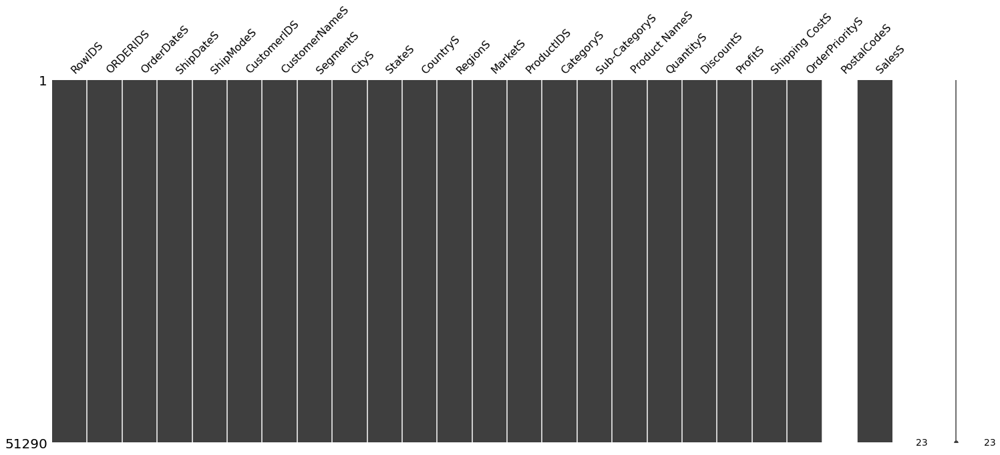

In [14]:
#Display size of Data in evrey column
msno.matrix(data);


In [15]:
#Dynamic visualization of Null Values in our Data
missing_values = order.isna().sum().to_dict()
missing_values_df = pd.DataFrame(list(missing_values.items()), columns=['Column', 'Missing_Values'])

fig = px.bar(missing_values_df,
       x = 'Column',
       y = 'Missing_Values',
       template = 'plotly_dark',
       title = 'Missing Values')
fig.show()

In [16]:
#NUll Values Sum exactly in evrey Column
order.isnull().sum()

RowIDS                0
ORDERIDS              0
OrderDateS            0
ShipDateS             0
ShipModeS             0
CustomerIDS           0
CustomerNameS         0
SegmentS              0
CityS                 0
StateS                0
CountryS              0
RegionS               0
MarketS               0
ProductIDS            0
CategoryS             0
Sub-CategoryS         0
Product NameS         0
QuantityS             0
DiscountS             0
ProfitS               0
Shipping CostS        0
OrderPriorityS        0
PostalCodeS       51290
SalesS                0
dtype: int64

In [17]:
#Dispaly Postal Code Data Frame
postal

,Row ID,PostalCodeS
0,3193.0,9614
1,6491.0,1285
2,5600.0,2600
3,18167.0,3215
4,30459.0,3212
...,...,...
51285,13977.0,2551
51286,36140.0,5480
51287,11634.0,5863
51288,26779.0,9524


In [18]:
#Verify Null Values in Postal
postal.isnull().any()

Row ID         False
PostalCodeS    False
dtype: bool

In [19]:
# MERGE POSTAL CODE FROM PODTAL TO ORDER
order.drop(['PostalCodeS'], axis=1)
order['PostalCodeS']=postal['PostalCodeS']

In [20]:
order

,RowIDS,ORDERIDS,OrderDateS,ShipDateS,ShipModeS,CustomerIDS,CustomerNameS,SegmentS,CityS,StateS,...,CategoryS,Sub-CategoryS,Product NameS,QuantityS,DiscountS,ProfitS,Shipping CostS,OrderPriorityS,PostalCodeS,SalesS
0,23579,IN-2014-LC1688558-41940,2014-10-28,2014-10-30,Second Class,LC-1688558,Lena Creighton,Consumer,Bangalore,Karnataka,...,Technology,Accessories,"Belkin Numeric Keypad, Erganomic",3.0,0.0,30.1500,10.840,Medium,9614,177.750
1,28895,IN-2014-MH1778527-41697,2014-02-27,2014-02-28,First Class,MH-1778527,Maya Herman,Corporate,Tianjin,Tianjin,...,Office Supplies,Binders,"Ibico Binder, Durable",4.0,0.0,14.1600,10.840,High,1285,67.920
2,51249,MO-2014-PO919586-41812,2014-06-22,2014-06-27,Second Class,PO-919586,Phillina Ober,Home Office,Casablanca,Grand Casablanca,...,Office Supplies,Binders,"Wilson Jones Binding Machine, Recycled",2.0,0.0,10.8000,10.840,Medium,2600,98.640
3,5033,MX-2015-CS1240093-42368,2015-12-30,2016-01-05,Standard Class,CS-1240093,Christopher Schild,Home Office,Managua,Managua,...,Office Supplies,Art,"Binney & Smith Pencil Sharpener, Easy-Erase",9.0,0.0,77.0400,10.839,Medium,3215,167.580
4,497,US-2015-JH1543055-42328,2015-11-20,2015-11-23,First Class,JH-1543055,Jennifer Halladay,Consumer,Choloma,Cortés,...,Office Supplies,Envelopes,"Cameo Manila Envelope, Set of 50",6.0,0.4,-35.6400,10.839,Medium,3212,64.800
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51285,37560,CA-2015-YS21880140-42130,2015-05-06,2015-05-11,Standard Class,YS-218801408,Yana Sorensen,Corporate,Columbus,Georgia,...,Office Supplies,Binders,Ibico Covers for Plastic or Wire Binding Elements,3.0,0.0,15.5250,3.970,Medium,2551,34.500
51286,37508,CA-2015-YS21880140-42235,2015-08-19,2015-08-26,Standard Class,YS-218801404,Yana Sorensen,Corporate,Seattle,Washington,...,Furniture,Furnishings,"Contract Clock, 14"", Brown",3.0,0.0,22.4196,3.140,Medium,5480,65.940
51287,32690,CA-2015-YS21880140-42189,2015-07-04,2015-07-05,First Class,YS-218801408,Yana Sorensen,Corporate,Burlington,North Carolina,...,Office Supplies,Art,4009 Highlighters by Sanford,3.0,0.2,1.5522,1.750,High,5863,9.552
51288,34367,CA-2012-YC21895140-41229,2012-11-16,2012-11-21,Standard Class,YC-218951406,Yoseph Carroll,Corporate,Newark,Delaware,...,Office Supplies,Storage,Smead Adjustable Mobile File Trolley with Lock...,7.0,0.0,792.2691,428.800,High,9524,2934.330


In [21]:
data=order

In [22]:
#Display Missing Values after merging columns
missing_values = order.isna().sum().to_dict()
missing_values_df = pd.DataFrame(list(missing_values.items()), columns=['Column', 'Missing_Values'])

fig = px.bar(missing_values_df,
       x = 'Column',
       y = 'Missing_Values',
       template = 'plotly_dark',
       title = 'Missing Values')
fig.show()

In [23]:
#pip install cufflinks

In [24]:
#import cufflinks as cf
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

In [25]:
#Dynamic visualization of the best countries that we had deals with them
order['CountryS'].iplot(kind='hist', xTitle='claps',
                  yTitle='count', title='Claps Distribution')

In [26]:
#Display the count of the Ship modes
order['ShipModeS'].iplot(kind='hist', xTitle='claps',
                  yTitle='count', title='Claps Distribution')

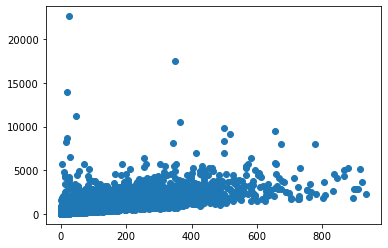

In [27]:
#visualization of Shipping CostS  /  SalesS
plt.scatter(x="Shipping CostS", y="SalesS",data=data)
plt.show()

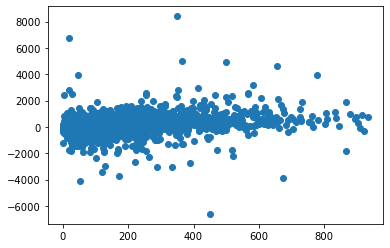

In [28]:
#visualization of Shipping CostS  /  ProfitS

plt.scatter(x="Shipping CostS", y="ProfitS",data=data)
plt.show()

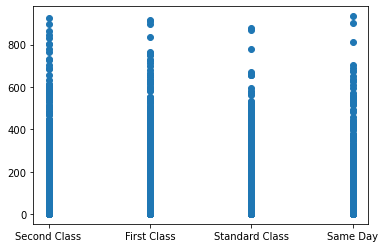

In [29]:
#Viz ShipModeS / Shipping CostS
plt.scatter(x="ShipModeS", y="Shipping CostS",data=data)
plt.show()

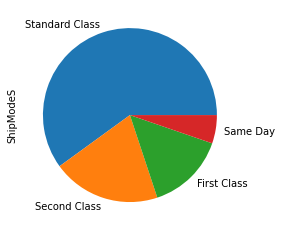

In [30]:

#Viz of the most used ship mode in our Products
data['ShipModeS'].value_counts().head(10).plot.pie()

# Unsquish the pie.
import matplotlib.pyplot as plt
plt.gca().set_aspect('equal')

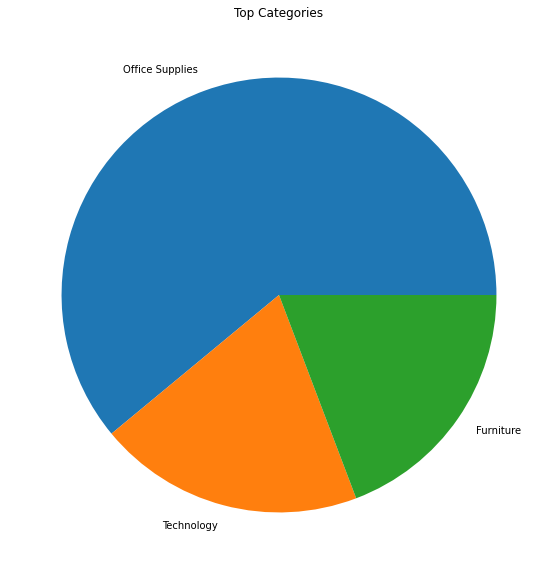

In [31]:
#Viz of the most used ship mode in our Categories

import seaborn as sns
from matplotlib import pyplot as plt
fig = plt.figure(figsize = (10, 10))
ax = fig.subplots()
data.CategoryS.value_counts()[:25].plot(ax=ax, kind = "pie")
ax.set_ylabel("")
ax.set_title("Top Categories")
plt.show()

In [32]:
#add Year column in our Data Frame
data['year'] = pd.DatetimeIndex(data['OrderDateS']).year
data.head()

,RowIDS,ORDERIDS,OrderDateS,ShipDateS,ShipModeS,CustomerIDS,CustomerNameS,SegmentS,CityS,StateS,...,Sub-CategoryS,Product NameS,QuantityS,DiscountS,ProfitS,Shipping CostS,OrderPriorityS,PostalCodeS,SalesS,year
0,23579,IN-2014-LC1688558-41940,2014-10-28,2014-10-30,Second Class,LC-1688558,Lena Creighton,Consumer,Bangalore,Karnataka,...,Accessories,"Belkin Numeric Keypad, Erganomic",3.0,0.0,30.15,10.840,Medium,9614,177.75,2014
1,28895,IN-2014-MH1778527-41697,2014-02-27,2014-02-28,First Class,MH-1778527,Maya Herman,Corporate,Tianjin,Tianjin,...,Binders,"Ibico Binder, Durable",4.0,0.0,14.16,10.840,High,1285,67.92,2014
2,51249,MO-2014-PO919586-41812,2014-06-22,2014-06-27,Second Class,PO-919586,Phillina Ober,Home Office,Casablanca,Grand Casablanca,...,Binders,"Wilson Jones Binding Machine, Recycled",2.0,0.0,10.80,10.840,Medium,2600,98.64,2014
3,5033,MX-2015-CS1240093-42368,2015-12-30,2016-01-05,Standard Class,CS-1240093,Christopher Schild,Home Office,Managua,Managua,...,Art,"Binney & Smith Pencil Sharpener, Easy-Erase",9.0,0.0,77.04,10.839,Medium,3215,167.58,2015
4,497,US-2015-JH1543055-42328,2015-11-20,2015-11-23,First Class,JH-1543055,Jennifer Halladay,Consumer,Choloma,Cortés,...,Envelopes,"Cameo Manila Envelope, Set of 50",6.0,0.4,-35.64,10.839,Medium,3212,64.80,2015


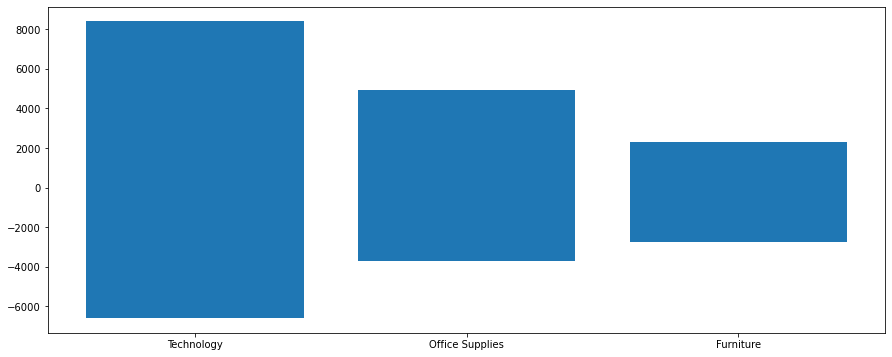

In [33]:
#Viz categories/ Profits
plt.figure(figsize=(15,6))
plt.bar(x='CategoryS',height='ProfitS',data=data)
plt.show()


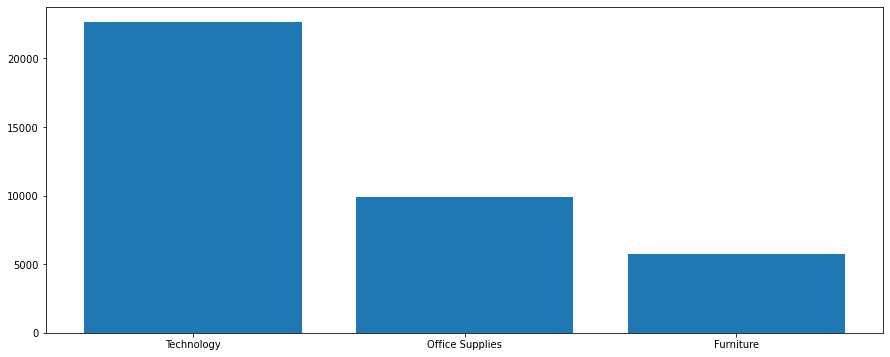

In [34]:
#Viz categories/ Profits
plt.figure(figsize=(15,6))
plt.bar(x='CategoryS',height='SalesS',data=data)
plt.show()



In [35]:
#So we have Shipping cost and returns problem

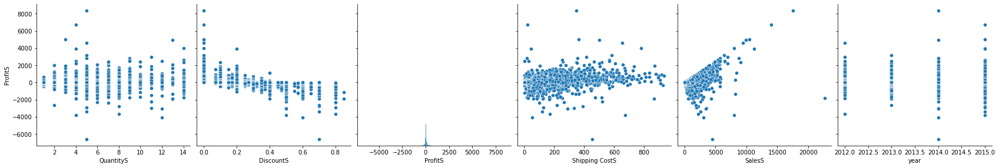

In [36]:
sns.pairplot(data, data=['QuantityS', 'Shipping CostS', 'ShipModeS'], y_vars='ProfitS', height=4, aspect=1, kind='scatter')
plt.show()

DATA TRANSFORMATION

In [37]:
dfobj = list(columns for columns in data.select_dtypes([object]).columns)
le = preprocessing.LabelEncoder()

for features in dfobj:
    data[features] = le.fit_transform(data[features].astype(str))
print (data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51290 entries, 0 to 51289
Data columns (total 25 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   RowIDS          51290 non-null  int32  
 1   ORDERIDS        51290 non-null  int32  
 2   OrderDateS      51290 non-null  int32  
 3   ShipDateS       51290 non-null  int32  
 4   ShipModeS       51290 non-null  int32  
 5   CustomerIDS     51290 non-null  int32  
 6   CustomerNameS   51290 non-null  int32  
 7   SegmentS        51290 non-null  int32  
 8   CityS           51290 non-null  int32  
 9   StateS          51290 non-null  int32  
 10  CountryS        51290 non-null  int32  
 11  RegionS         51290 non-null  int32  
 12  MarketS         51290 non-null  int32  
 13  ProductIDS      51290 non-null  int32  
 14  CategoryS       51290 non-null  int32  
 15  Sub-CategoryS   51290 non-null  int32  
 16  Product NameS   51290 non-null  int32  
 17  QuantityS       51290 non-null 

In [38]:
#Viz data after Transformation
data

,RowIDS,ORDERIDS,OrderDateS,ShipDateS,ShipModeS,CustomerIDS,CustomerNameS,SegmentS,CityS,StateS,...,Sub-CategoryS,Product NameS,QuantityS,DiscountS,ProfitS,Shipping CostS,OrderPriorityS,PostalCodeS,SalesS,year
0,15089,13189,1005,1029,2,9900,459,0,275,500,...,0,581,3.0,0.0,30.1500,10.840,3,2874,177.750,2014
1,20995,13269,764,785,0,11245,519,1,3229,995,...,3,1965,4.0,0.0,14.1600,10.840,1,95,67.920,2014
2,45834,17024,877,904,2,13312,613,2,615,371,...,3,3530,2.0,0.0,10.8000,10.840,3,481,98.640,2014
3,44813,19985,1428,1461,3,3853,159,2,1996,606,...,2,645,9.0,0.0,77.0400,10.839,3,694,167.580,2015
4,44111,25222,1388,1418,0,8081,361,0,723,268,...,7,828,6.0,0.4,-35.6400,10.839,3,691,64.800,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51285,30624,4724,1193,1222,3,17359,792,1,775,359,...,3,1972,3.0,0.0,15.5250,3.970,3,470,34.500,2015
51286,30566,4726,1296,1329,3,17357,792,1,2950,1060,...,9,1002,3.0,0.0,22.4196,3.140,3,1458,65.940,2015
51287,25213,4725,1252,1277,0,17359,792,1,533,727,...,2,27,3.0,0.2,1.5522,1.750,1,1583,9.552,2015
51288,27076,1180,307,321,3,17340,793,1,2299,280,...,14,3166,7.0,0.0,792.2691,428.800,1,2841,2934.330,2012


Correlation Map(Heat Map)

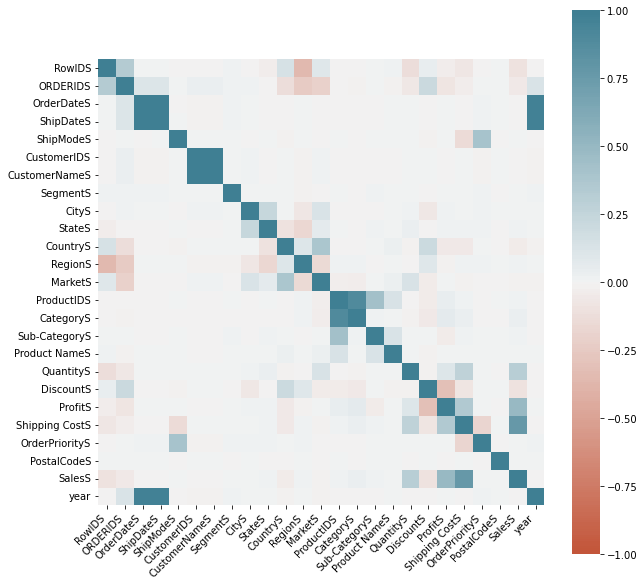

In [39]:
#Viz the Correlation Map
corr = data.corr()
plt.figure(figsize=(10, 10))
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

XGB MODEL

In [40]:
#This part of the code is not completed (Skip^it)
from sklearn.model_selection import train_test_split
y=data['ProfitS']
x=data.drop(columns=['RowIDS','ProfitS','PostalCodeS'],axis=1)

x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.1,random_state=17)


In [41]:
#pip install pygrametl

In [42]:
from pygrametl.tables import BulkDimension


In [43]:
order

,RowIDS,ORDERIDS,OrderDateS,ShipDateS,ShipModeS,CustomerIDS,CustomerNameS,SegmentS,CityS,StateS,...,Sub-CategoryS,Product NameS,QuantityS,DiscountS,ProfitS,Shipping CostS,OrderPriorityS,PostalCodeS,SalesS,year
0,15089,13189,1005,1029,2,9900,459,0,275,500,...,0,581,3.0,0.0,30.1500,10.840,3,2874,177.750,2014
1,20995,13269,764,785,0,11245,519,1,3229,995,...,3,1965,4.0,0.0,14.1600,10.840,1,95,67.920,2014
2,45834,17024,877,904,2,13312,613,2,615,371,...,3,3530,2.0,0.0,10.8000,10.840,3,481,98.640,2014
3,44813,19985,1428,1461,3,3853,159,2,1996,606,...,2,645,9.0,0.0,77.0400,10.839,3,694,167.580,2015
4,44111,25222,1388,1418,0,8081,361,0,723,268,...,7,828,6.0,0.4,-35.6400,10.839,3,691,64.800,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51285,30624,4724,1193,1222,3,17359,792,1,775,359,...,3,1972,3.0,0.0,15.5250,3.970,3,470,34.500,2015
51286,30566,4726,1296,1329,3,17357,792,1,2950,1060,...,9,1002,3.0,0.0,22.4196,3.140,3,1458,65.940,2015
51287,25213,4725,1252,1277,0,17359,792,1,533,727,...,2,27,3.0,0.2,1.5522,1.750,1,1583,9.552,2015
51288,27076,1180,307,321,3,17340,793,1,2299,280,...,14,3166,7.0,0.0,792.2691,428.800,1,2841,2934.330,2012


In [44]:
#cursor.execute('ALTER TABLE orders add Customer_id int IDENTITY(1, 1)')

In [45]:
#Connect to the Data Warehouse
myconn = pyodbc.connect(r'Driver=SQL Server;Server=DESKTOP-IKFHUC3\SQLEXPRESS;Database=DW_Saless;Trusted_Connection=yes;')
cursor = myconn.cursor()
conn2 = pygrametl.ConnectionWrapper(myconn)
conn2.setasdefault()

In [46]:
#this Function concern the bluk Dimension if one day w'ere gonna use it its ready
def pgbulkloader(name, attributes, fieldsep, rowsep, nullval, filehandle):
    cursor = connection.cursor()
    # psycopg2 does not accept the default value used to represent NULL
    # bv BulkDimension, which is None. Here this is ignored as we have no
    # NULL values that we wish to substitute for a more descriptive value
    cursor.copy_from(file=filehandle, table=name, sep=fieldsep,
                     columns=attributes)

In [47]:
#Prepare the date data frame
df = pd.DataFrame(pd.date_range('1/1/2001','12/31/2021'), columns=['date'])

df['year'] = df['date'].dt.year
df['quarter_number'] = df['date'].dt.quarter
df['quarter_text'] = df['date'].apply(lambda x: f'Q{x.quarter} {x.strftime("%Y")}')
df['month'] = df['date'].dt.month
df['year_month'] = df['date'].dt.strftime("%B %Y")
df['week'] = df['date'].dt.isocalendar().week
df['year_week'] = df['date'].apply(lambda x: f'{x.isocalendar()[0]}, Week {x.isocalendar()[1]}')
df['week_start'] = df['date'].dt.to_period('W').apply(lambda x: x.start_time)
df['week_end'] = df['date'].dt.to_period('W').apply(lambda x: x.end_time).dt.date
df['week_range'] = df.apply(lambda x: f"""{x['week_start'].strftime("%b %d, %Y")} to {x['week_end'].strftime("%b %d, %Y")} (Week {x['week']})""" , axis=1)
df['abbreviated_weekday'] = df['date'].dt.strftime("%a")
df['weekday'] = df['date'].dt.strftime("%A")

df

,date,year,quarter_number,quarter_text,month,year_month,week,year_week,week_start,week_end,week_range,abbreviated_weekday,weekday
0,2001-01-01,2001,1,Q1 2001,1,January 2001,1,"2001, Week 1",2001-01-01,2001-01-07,"Jan 01, 2001 to Jan 07, 2001 (Week 1)",Mon,Monday
1,2001-01-02,2001,1,Q1 2001,1,January 2001,1,"2001, Week 1",2001-01-01,2001-01-07,"Jan 01, 2001 to Jan 07, 2001 (Week 1)",Tue,Tuesday
2,2001-01-03,2001,1,Q1 2001,1,January 2001,1,"2001, Week 1",2001-01-01,2001-01-07,"Jan 01, 2001 to Jan 07, 2001 (Week 1)",Wed,Wednesday
3,2001-01-04,2001,1,Q1 2001,1,January 2001,1,"2001, Week 1",2001-01-01,2001-01-07,"Jan 01, 2001 to Jan 07, 2001 (Week 1)",Thu,Thursday
4,2001-01-05,2001,1,Q1 2001,1,January 2001,1,"2001, Week 1",2001-01-01,2001-01-07,"Jan 01, 2001 to Jan 07, 2001 (Week 1)",Fri,Friday
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7665,2021-12-27,2021,4,Q4 2021,12,December 2021,52,"2021, Week 52",2021-12-27,2022-01-02,"Dec 27, 2021 to Jan 02, 2022 (Week 52)",Mon,Monday
7666,2021-12-28,2021,4,Q4 2021,12,December 2021,52,"2021, Week 52",2021-12-27,2022-01-02,"Dec 27, 2021 to Jan 02, 2022 (Week 52)",Tue,Tuesday
7667,2021-12-29,2021,4,Q4 2021,12,December 2021,52,"2021, Week 52",2021-12-27,2022-01-02,"Dec 27, 2021 to Jan 02, 2022 (Week 52)",Wed,Wednesday
7668,2021-12-30,2021,4,Q4 2021,12,December 2021,52,"2021, Week 52",2021-12-27,2022-01-02,"Dec 27, 2021 to Jan 02, 2022 (Week 52)",Thu,Thursday


# Dimension Location

In [48]:
from pygrametl.tables import Dimension

In [49]:
#pip install progressbar


Note: you may need to restart the kernel to use updated packages.


In [50]:
import progressbar
from IPython.display import clear_output

In [51]:
#Location_dimension
Location_dimension =Dimension(
    name='[DW_Saless].[dbo].[DimLocation1]',
    key='Location_KEY',
    attributes=['PostalCode', 'Market', 'Region','Country','State','City'],
    lookupatts=['City', 'State', 'Country'],
    defaultidvalue=-1,
    )

In [52]:
Location_dimension.getbykey(1)


{'Location_KEY': None,
 'PostalCode': None,
 'Market': None,
 'Region': None,
 'Country': None,
 'State': None,
 'City': None}

In [53]:
location=data

In [54]:
location['PostalCode']=data['PostalCodeS']
location['Market']=data['MarketS']
location['Region']=data['RegionS']
location['Country']=data['CountryS']
location['State']=data['StateS']
location['City']=data['CityS']



In [55]:
location.drop_duplicates(subset=["City","State","Country"], keep="first", inplace=True)

In [56]:
location.shape

(3830, 31)

In [57]:
dic={}
progress=0

In [66]:
#insert our data in our Data Warehouse
dic={}
for j in location.index:
    for i in location:
        dic[i]=str(location[i][j])
    key = Location_dimension.lookup(dic)
    clear_output(wait=True)
    progress+=1
    percentage=round((progress/location.shape[0])*100)
    print("Loading into Dim Location: "+str(percentage)+"% "+"["+"▄"*(percentage//3)+" "*((100-percentage)//3)+"]")
    if key==-1:
        Location_dimension.insert(dic)
    else:
        Location_dimension.ensure(dic)
    
myconn.commit()

Loading into Dim Location: 100% [▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄]


# Dimension Custommer

In [60]:
#Custommer_Dimension

Custommer_Dimension=Dimension(
    name='[DW_Saless].[dbo].[DimCustomer]',
    key='Customer_key',
    attributes=['Customer_ID','Name','Segment'],
    lookupatts=['Customer_ID'],
    defaultidvalue=-1,
    )

In [61]:
Custommer=data

In [62]:
Custommer['Customer_ID']=data['CustomerIDS']
Custommer['Name']=data['CustomerNameS']
Custommer['Segment']=data['SegmentS']



In [93]:
#insert our data in our Data Warehouse
progress=0
dic={}
for j in Custommer.index:
    for i in Custommer:
        dic[i]=str(Custommer[i][j])
    key = Custommer_Dimension.lookup(dic)
    clear_output(wait=True)
    progress+=1
    percentage=round((progress/Custommer.shape[0])*100)
    print("Loading into Dim Customer: "+str(percentage)+"% "+"["+"▄"*(percentage//3)+" "*((100-percentage)//3)+"]")
    if key==-1:
        Custommer_Dimension.insert(dic)
    else:
        Custommer_Dimension.ensure(dic)
    
myconn.commit()

Loading into Dim Customer: 100% [▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄]


In [244]:
#verify the insert was done
Custommer_Dimension.getbykey(1)

{'Customer_key': 1,
 'Customer_ID': 'LC-1688558',
 'Name': 'Lena Creighton',
 'Segment': 'Consumer'}

# Dimension Product

In [88]:
#Product_Dimension

Product_Dimension=Dimension(
    name='[DW_Saless].[dbo].[DimProduct1]',
    key='Product_key',
    attributes=['Product_ID','Product_name','Category','sub_category'],
    lookupatts=['Product_ID'],
    defaultidvalue=-1,
    )

In [89]:
product=data

In [90]:
product.drop_duplicates(subset=["ProductIDS"], keep="first", inplace=True)

In [91]:
product['Product_ID']=data['ProductIDS']
product['Product_name']=data['Product NameS']
product['Category']=data['CategoryS']
product['sub_category']=data['Sub-CategoryS']

In [92]:
#insert our data in our Data Warehouse

dic={}
for j in product.index:
    for i in product:
        dic[i]=str(product[i][j])
    key = Product_Dimension.lookup(dic)
    
    if key==-1:
        Product_Dimension.insert(dic)
    else:
        Product_Dimension.ensure(dic)
    
myconn.commit()

In [156]:
Product_Dimension.getbykey(1)

{'Product_key': 1,
 'Product_ID': 'FUR-BO-3174',
 'Product_name': 'Atlantic Metals Mobile 2-Shelf Bookcases, Custom Colors',
 'Category': 'Furniture',
 'sub_category': 'Bookcases'}

# Dimension Shipping

In [27]:
#Dimshipmode_Dimension

Dimshipmode_Dimension=Dimension(
    name='[DW_Saless].[dbo].[Dimshipmode1]',
    key='keyshipmode',
    attributes=['shipmode'],
    lookupatts=['shipmode'],
    defaultidvalue=-1,
    )

In [281]:
Dimshipmode_Dimension.getbykey(1)

{'keyshipmode': 1, 'shipmode': 'Second Class'}

In [282]:
Shipmode=data

In [283]:
Shipmode.drop_duplicates(subset=["ShipModeS"], keep="first", inplace=True)

In [284]:
Shipmode['shipmode']=data['ShipModeS']


In [34]:
dic={}
for j in Shipmode.index:
    for i in Shipmode:
        dic[i]=str(Shipmode[i][j])
    key = Dimshipmode_Dimension.lookup(dic)
    print(key)
    if key==-1:
        Dimshipmode_Dimension.insert(dic)
    else:
        Dimshipmode_Dimension.ensure(dic)
    
myconn.commit()

1
2
3
4


In [35]:
Dimshipmode_Dimension.getbykey(1)

{'keyshipmode': 1, 'shipmode': 'Second Class'}

# Date Dimension

In [285]:
#Date= pd.read_sql_query("select * from dbo.DimDate", con=myconn)


C:\Users\Dhia\anaconda3\lib\site-packages\pandas\io\sql.py:761: UserWarning:

pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy



In [286]:
df.columns

Index(['date', 'year', 'quarter_number', 'quarter_text', 'month', 'year_month',
       'week', 'year_week', 'week_start', 'week_end', 'week_range',
       'abbreviated_weekday', 'weekday'],
      dtype='object')

In [28]:
#Date_Dimension
Date_Dimension=Dimension(
    name='[DW_Saless].[dbo].[Date_Dimension]',
    key='DateKey',
    attributes=['date','year','quarter_number','quarter_text','month','year_month','week','year_week','week_start','week_end','week_range','abbreviated_weekday','weekday'],
    lookupatts=['date'],
    defaultidvalue=-1
    )

In [22]:
Date_Dimension.getbykey(1)

{'DateKey': None,
 'date': None,
 'year': None,
 'quarter_number': None,
 'quarter_text': None,
 'month': None,
 'year_month': None,
 'week': None,
 'year_week': None,
 'week_start': None,
 'week_end': None,
 'week_range': None,
 'abbreviated_weekday': None,
 'weekday': None}

In [23]:
##Date_Dimension=df[['date','year','quarter_number','quarter_text','month','year_month','week','year_week','week_start','week_end','week_range','abbreviated_weekday','weekday']]


In [27]:
print(df.columns.tolist())

['date', 'year', 'quarter_number', 'quarter_text', 'month', 'year_month', 'week', 'year_week', 'week_start', 'week_end', 'week_range', 'abbreviated_weekday', 'weekday']


In [25]:
dic={}
for j in df.index:
    for i in df:
        dic[i]=str(df[i][j]) 
        print(dic[i])
    key = Date_Dimension.lookup(dic)
    if key==-1:
        Date_Dimension.insert(dic)
    else:
        Date_Dimension.ensure(dic)
    
myconn.commit()







2001-01-01 00:00:00
2001
1
Q1 2001
1
January 2001
1
2001, Week 1
2001-01-01 00:00:00
2001-01-07
Jan 01, 2001 to Jan 07, 2001 (Week 1)
Mon
Monday
2001-01-02 00:00:00
2001
1
Q1 2001
1
January 2001
1
2001, Week 1
2001-01-01 00:00:00
2001-01-07
Jan 01, 2001 to Jan 07, 2001 (Week 1)
Tue
Tuesday
2001-01-03 00:00:00
2001
1
Q1 2001
1
January 2001
1
2001, Week 1
2001-01-01 00:00:00
2001-01-07
Jan 01, 2001 to Jan 07, 2001 (Week 1)
Wed
Wednesday
2001-01-04 00:00:00
2001
1
Q1 2001
1
January 2001
1
2001, Week 1
2001-01-01 00:00:00
2001-01-07
Jan 01, 2001 to Jan 07, 2001 (Week 1)
Thu
Thursday
2001-01-05 00:00:00
2001
1
Q1 2001
1
January 2001
1
2001, Week 1
2001-01-01 00:00:00
2001-01-07
Jan 01, 2001 to Jan 07, 2001 (Week 1)
Fri
Friday
2001-01-06 00:00:00
2001
1
Q1 2001
1
January 2001
1
2001, Week 1
2001-01-01 00:00:00
2001-01-07
Jan 01, 2001 to Jan 07, 2001 (Week 1)
Sat
Saturday
2001-01-07 00:00:00
2001
1
Q1 2001
1
January 2001
1
2001, Week 1
2001-01-01 00:00:00
2001-01-07
Jan 01, 2001 to Jan 07, 20

2001-03-27 00:00:00
2001
1
Q1 2001
3
March 2001
13
2001, Week 13
2001-03-26 00:00:00
2001-04-01
Mar 26, 2001 to Apr 01, 2001 (Week 13)
Tue
Tuesday
2001-03-28 00:00:00
2001
1
Q1 2001
3
March 2001
13
2001, Week 13
2001-03-26 00:00:00
2001-04-01
Mar 26, 2001 to Apr 01, 2001 (Week 13)
Wed
Wednesday
2001-03-29 00:00:00
2001
1
Q1 2001
3
March 2001
13
2001, Week 13
2001-03-26 00:00:00
2001-04-01
Mar 26, 2001 to Apr 01, 2001 (Week 13)
Thu
Thursday
2001-03-30 00:00:00
2001
1
Q1 2001
3
March 2001
13
2001, Week 13
2001-03-26 00:00:00
2001-04-01
Mar 26, 2001 to Apr 01, 2001 (Week 13)
Fri
Friday
2001-03-31 00:00:00
2001
1
Q1 2001
3
March 2001
13
2001, Week 13
2001-03-26 00:00:00
2001-04-01
Mar 26, 2001 to Apr 01, 2001 (Week 13)
Sat
Saturday
2001-04-01 00:00:00
2001
2
Q2 2001
4
April 2001
13
2001, Week 13
2001-03-26 00:00:00
2001-04-01
Mar 26, 2001 to Apr 01, 2001 (Week 13)
Sun
Sunday
2001-04-02 00:00:00
2001
2
Q2 2001
4
April 2001
14
2001, Week 14
2001-04-02 00:00:00
2001-04-08
Apr 02, 2001 to Apr 

2001-06-18 00:00:00
2001
2
Q2 2001
6
June 2001
25
2001, Week 25
2001-06-18 00:00:00
2001-06-24
Jun 18, 2001 to Jun 24, 2001 (Week 25)
Mon
Monday
2001-06-19 00:00:00
2001
2
Q2 2001
6
June 2001
25
2001, Week 25
2001-06-18 00:00:00
2001-06-24
Jun 18, 2001 to Jun 24, 2001 (Week 25)
Tue
Tuesday
2001-06-20 00:00:00
2001
2
Q2 2001
6
June 2001
25
2001, Week 25
2001-06-18 00:00:00
2001-06-24
Jun 18, 2001 to Jun 24, 2001 (Week 25)
Wed
Wednesday
2001-06-21 00:00:00
2001
2
Q2 2001
6
June 2001
25
2001, Week 25
2001-06-18 00:00:00
2001-06-24
Jun 18, 2001 to Jun 24, 2001 (Week 25)
Thu
Thursday
2001-06-22 00:00:00
2001
2
Q2 2001
6
June 2001
25
2001, Week 25
2001-06-18 00:00:00
2001-06-24
Jun 18, 2001 to Jun 24, 2001 (Week 25)
Fri
Friday
2001-06-23 00:00:00
2001
2
Q2 2001
6
June 2001
25
2001, Week 25
2001-06-18 00:00:00
2001-06-24
Jun 18, 2001 to Jun 24, 2001 (Week 25)
Sat
Saturday
2001-06-24 00:00:00
2001
2
Q2 2001
6
June 2001
25
2001, Week 25
2001-06-18 00:00:00
2001-06-24
Jun 18, 2001 to Jun 24, 200

2001-09-19 00:00:00
2001
3
Q3 2001
9
September 2001
38
2001, Week 38
2001-09-17 00:00:00
2001-09-23
Sep 17, 2001 to Sep 23, 2001 (Week 38)
Wed
Wednesday
2001-09-20 00:00:00
2001
3
Q3 2001
9
September 2001
38
2001, Week 38
2001-09-17 00:00:00
2001-09-23
Sep 17, 2001 to Sep 23, 2001 (Week 38)
Thu
Thursday
2001-09-21 00:00:00
2001
3
Q3 2001
9
September 2001
38
2001, Week 38
2001-09-17 00:00:00
2001-09-23
Sep 17, 2001 to Sep 23, 2001 (Week 38)
Fri
Friday
2001-09-22 00:00:00
2001
3
Q3 2001
9
September 2001
38
2001, Week 38
2001-09-17 00:00:00
2001-09-23
Sep 17, 2001 to Sep 23, 2001 (Week 38)
Sat
Saturday
2001-09-23 00:00:00
2001
3
Q3 2001
9
September 2001
38
2001, Week 38
2001-09-17 00:00:00
2001-09-23
Sep 17, 2001 to Sep 23, 2001 (Week 38)
Sun
Sunday
2001-09-24 00:00:00
2001
3
Q3 2001
9
September 2001
39
2001, Week 39
2001-09-24 00:00:00
2001-09-30
Sep 24, 2001 to Sep 30, 2001 (Week 39)
Mon
Monday
2001-09-25 00:00:00
2001
3
Q3 2001
9
September 2001
39
2001, Week 39
2001-09-24 00:00:00
2001

2001-12-16 00:00:00
2001
4
Q4 2001
12
December 2001
50
2001, Week 50
2001-12-10 00:00:00
2001-12-16
Dec 10, 2001 to Dec 16, 2001 (Week 50)
Sun
Sunday
2001-12-17 00:00:00
2001
4
Q4 2001
12
December 2001
51
2001, Week 51
2001-12-17 00:00:00
2001-12-23
Dec 17, 2001 to Dec 23, 2001 (Week 51)
Mon
Monday
2001-12-18 00:00:00
2001
4
Q4 2001
12
December 2001
51
2001, Week 51
2001-12-17 00:00:00
2001-12-23
Dec 17, 2001 to Dec 23, 2001 (Week 51)
Tue
Tuesday
2001-12-19 00:00:00
2001
4
Q4 2001
12
December 2001
51
2001, Week 51
2001-12-17 00:00:00
2001-12-23
Dec 17, 2001 to Dec 23, 2001 (Week 51)
Wed
Wednesday
2001-12-20 00:00:00
2001
4
Q4 2001
12
December 2001
51
2001, Week 51
2001-12-17 00:00:00
2001-12-23
Dec 17, 2001 to Dec 23, 2001 (Week 51)
Thu
Thursday
2001-12-21 00:00:00
2001
4
Q4 2001
12
December 2001
51
2001, Week 51
2001-12-17 00:00:00
2001-12-23
Dec 17, 2001 to Dec 23, 2001 (Week 51)
Fri
Friday
2001-12-22 00:00:00
2001
4
Q4 2001
12
December 2001
51
2001, Week 51
2001-12-17 00:00:00
2001-

2002-03-13 00:00:00
2002
1
Q1 2002
3
March 2002
11
2002, Week 11
2002-03-11 00:00:00
2002-03-17
Mar 11, 2002 to Mar 17, 2002 (Week 11)
Wed
Wednesday
2002-03-14 00:00:00
2002
1
Q1 2002
3
March 2002
11
2002, Week 11
2002-03-11 00:00:00
2002-03-17
Mar 11, 2002 to Mar 17, 2002 (Week 11)
Thu
Thursday
2002-03-15 00:00:00
2002
1
Q1 2002
3
March 2002
11
2002, Week 11
2002-03-11 00:00:00
2002-03-17
Mar 11, 2002 to Mar 17, 2002 (Week 11)
Fri
Friday
2002-03-16 00:00:00
2002
1
Q1 2002
3
March 2002
11
2002, Week 11
2002-03-11 00:00:00
2002-03-17
Mar 11, 2002 to Mar 17, 2002 (Week 11)
Sat
Saturday
2002-03-17 00:00:00
2002
1
Q1 2002
3
March 2002
11
2002, Week 11
2002-03-11 00:00:00
2002-03-17
Mar 11, 2002 to Mar 17, 2002 (Week 11)
Sun
Sunday
2002-03-18 00:00:00
2002
1
Q1 2002
3
March 2002
12
2002, Week 12
2002-03-18 00:00:00
2002-03-24
Mar 18, 2002 to Mar 24, 2002 (Week 12)
Mon
Monday
2002-03-19 00:00:00
2002
1
Q1 2002
3
March 2002
12
2002, Week 12
2002-03-18 00:00:00
2002-03-24
Mar 18, 2002 to Mar 2

2002-06-11 00:00:00
2002
2
Q2 2002
6
June 2002
24
2002, Week 24
2002-06-10 00:00:00
2002-06-16
Jun 10, 2002 to Jun 16, 2002 (Week 24)
Tue
Tuesday
2002-06-12 00:00:00
2002
2
Q2 2002
6
June 2002
24
2002, Week 24
2002-06-10 00:00:00
2002-06-16
Jun 10, 2002 to Jun 16, 2002 (Week 24)
Wed
Wednesday
2002-06-13 00:00:00
2002
2
Q2 2002
6
June 2002
24
2002, Week 24
2002-06-10 00:00:00
2002-06-16
Jun 10, 2002 to Jun 16, 2002 (Week 24)
Thu
Thursday
2002-06-14 00:00:00
2002
2
Q2 2002
6
June 2002
24
2002, Week 24
2002-06-10 00:00:00
2002-06-16
Jun 10, 2002 to Jun 16, 2002 (Week 24)
Fri
Friday
2002-06-15 00:00:00
2002
2
Q2 2002
6
June 2002
24
2002, Week 24
2002-06-10 00:00:00
2002-06-16
Jun 10, 2002 to Jun 16, 2002 (Week 24)
Sat
Saturday
2002-06-16 00:00:00
2002
2
Q2 2002
6
June 2002
24
2002, Week 24
2002-06-10 00:00:00
2002-06-16
Jun 10, 2002 to Jun 16, 2002 (Week 24)
Sun
Sunday
2002-06-17 00:00:00
2002
2
Q2 2002
6
June 2002
25
2002, Week 25
2002-06-17 00:00:00
2002-06-23
Jun 17, 2002 to Jun 23, 200

2002-09-05 00:00:00
2002
3
Q3 2002
9
September 2002
36
2002, Week 36
2002-09-02 00:00:00
2002-09-08
Sep 02, 2002 to Sep 08, 2002 (Week 36)
Thu
Thursday
2002-09-06 00:00:00
2002
3
Q3 2002
9
September 2002
36
2002, Week 36
2002-09-02 00:00:00
2002-09-08
Sep 02, 2002 to Sep 08, 2002 (Week 36)
Fri
Friday
2002-09-07 00:00:00
2002
3
Q3 2002
9
September 2002
36
2002, Week 36
2002-09-02 00:00:00
2002-09-08
Sep 02, 2002 to Sep 08, 2002 (Week 36)
Sat
Saturday
2002-09-08 00:00:00
2002
3
Q3 2002
9
September 2002
36
2002, Week 36
2002-09-02 00:00:00
2002-09-08
Sep 02, 2002 to Sep 08, 2002 (Week 36)
Sun
Sunday
2002-09-09 00:00:00
2002
3
Q3 2002
9
September 2002
37
2002, Week 37
2002-09-09 00:00:00
2002-09-15
Sep 09, 2002 to Sep 15, 2002 (Week 37)
Mon
Monday
2002-09-10 00:00:00
2002
3
Q3 2002
9
September 2002
37
2002, Week 37
2002-09-09 00:00:00
2002-09-15
Sep 09, 2002 to Sep 15, 2002 (Week 37)
Tue
Tuesday
2002-09-11 00:00:00
2002
3
Q3 2002
9
September 2002
37
2002, Week 37
2002-09-09 00:00:00
2002-0

2002-12-01 00:00:00
2002
4
Q4 2002
12
December 2002
48
2002, Week 48
2002-11-25 00:00:00
2002-12-01
Nov 25, 2002 to Dec 01, 2002 (Week 48)
Sun
Sunday
2002-12-02 00:00:00
2002
4
Q4 2002
12
December 2002
49
2002, Week 49
2002-12-02 00:00:00
2002-12-08
Dec 02, 2002 to Dec 08, 2002 (Week 49)
Mon
Monday
2002-12-03 00:00:00
2002
4
Q4 2002
12
December 2002
49
2002, Week 49
2002-12-02 00:00:00
2002-12-08
Dec 02, 2002 to Dec 08, 2002 (Week 49)
Tue
Tuesday
2002-12-04 00:00:00
2002
4
Q4 2002
12
December 2002
49
2002, Week 49
2002-12-02 00:00:00
2002-12-08
Dec 02, 2002 to Dec 08, 2002 (Week 49)
Wed
Wednesday
2002-12-05 00:00:00
2002
4
Q4 2002
12
December 2002
49
2002, Week 49
2002-12-02 00:00:00
2002-12-08
Dec 02, 2002 to Dec 08, 2002 (Week 49)
Thu
Thursday
2002-12-06 00:00:00
2002
4
Q4 2002
12
December 2002
49
2002, Week 49
2002-12-02 00:00:00
2002-12-08
Dec 02, 2002 to Dec 08, 2002 (Week 49)
Fri
Friday
2002-12-07 00:00:00
2002
4
Q4 2002
12
December 2002
49
2002, Week 49
2002-12-02 00:00:00
2002-

2003-02-18 00:00:00
2003
1
Q1 2003
2
February 2003
8
2003, Week 8
2003-02-17 00:00:00
2003-02-23
Feb 17, 2003 to Feb 23, 2003 (Week 8)
Tue
Tuesday
2003-02-19 00:00:00
2003
1
Q1 2003
2
February 2003
8
2003, Week 8
2003-02-17 00:00:00
2003-02-23
Feb 17, 2003 to Feb 23, 2003 (Week 8)
Wed
Wednesday
2003-02-20 00:00:00
2003
1
Q1 2003
2
February 2003
8
2003, Week 8
2003-02-17 00:00:00
2003-02-23
Feb 17, 2003 to Feb 23, 2003 (Week 8)
Thu
Thursday
2003-02-21 00:00:00
2003
1
Q1 2003
2
February 2003
8
2003, Week 8
2003-02-17 00:00:00
2003-02-23
Feb 17, 2003 to Feb 23, 2003 (Week 8)
Fri
Friday
2003-02-22 00:00:00
2003
1
Q1 2003
2
February 2003
8
2003, Week 8
2003-02-17 00:00:00
2003-02-23
Feb 17, 2003 to Feb 23, 2003 (Week 8)
Sat
Saturday
2003-02-23 00:00:00
2003
1
Q1 2003
2
February 2003
8
2003, Week 8
2003-02-17 00:00:00
2003-02-23
Feb 17, 2003 to Feb 23, 2003 (Week 8)
Sun
Sunday
2003-02-24 00:00:00
2003
1
Q1 2003
2
February 2003
9
2003, Week 9
2003-02-24 00:00:00
2003-03-02
Feb 24, 2003 to Mar

2003-05-20 00:00:00
2003
2
Q2 2003
5
May 2003
21
2003, Week 21
2003-05-19 00:00:00
2003-05-25
May 19, 2003 to May 25, 2003 (Week 21)
Tue
Tuesday
2003-05-21 00:00:00
2003
2
Q2 2003
5
May 2003
21
2003, Week 21
2003-05-19 00:00:00
2003-05-25
May 19, 2003 to May 25, 2003 (Week 21)
Wed
Wednesday
2003-05-22 00:00:00
2003
2
Q2 2003
5
May 2003
21
2003, Week 21
2003-05-19 00:00:00
2003-05-25
May 19, 2003 to May 25, 2003 (Week 21)
Thu
Thursday
2003-05-23 00:00:00
2003
2
Q2 2003
5
May 2003
21
2003, Week 21
2003-05-19 00:00:00
2003-05-25
May 19, 2003 to May 25, 2003 (Week 21)
Fri
Friday
2003-05-24 00:00:00
2003
2
Q2 2003
5
May 2003
21
2003, Week 21
2003-05-19 00:00:00
2003-05-25
May 19, 2003 to May 25, 2003 (Week 21)
Sat
Saturday
2003-05-25 00:00:00
2003
2
Q2 2003
5
May 2003
21
2003, Week 21
2003-05-19 00:00:00
2003-05-25
May 19, 2003 to May 25, 2003 (Week 21)
Sun
Sunday
2003-05-26 00:00:00
2003
2
Q2 2003
5
May 2003
22
2003, Week 22
2003-05-26 00:00:00
2003-06-01
May 26, 2003 to Jun 01, 2003 (Week

2003-08-20 00:00:00
2003
3
Q3 2003
8
August 2003
34
2003, Week 34
2003-08-18 00:00:00
2003-08-24
Aug 18, 2003 to Aug 24, 2003 (Week 34)
Wed
Wednesday
2003-08-21 00:00:00
2003
3
Q3 2003
8
August 2003
34
2003, Week 34
2003-08-18 00:00:00
2003-08-24
Aug 18, 2003 to Aug 24, 2003 (Week 34)
Thu
Thursday
2003-08-22 00:00:00
2003
3
Q3 2003
8
August 2003
34
2003, Week 34
2003-08-18 00:00:00
2003-08-24
Aug 18, 2003 to Aug 24, 2003 (Week 34)
Fri
Friday
2003-08-23 00:00:00
2003
3
Q3 2003
8
August 2003
34
2003, Week 34
2003-08-18 00:00:00
2003-08-24
Aug 18, 2003 to Aug 24, 2003 (Week 34)
Sat
Saturday
2003-08-24 00:00:00
2003
3
Q3 2003
8
August 2003
34
2003, Week 34
2003-08-18 00:00:00
2003-08-24
Aug 18, 2003 to Aug 24, 2003 (Week 34)
Sun
Sunday
2003-08-25 00:00:00
2003
3
Q3 2003
8
August 2003
35
2003, Week 35
2003-08-25 00:00:00
2003-08-31
Aug 25, 2003 to Aug 31, 2003 (Week 35)
Mon
Monday
2003-08-26 00:00:00
2003
3
Q3 2003
8
August 2003
35
2003, Week 35
2003-08-25 00:00:00
2003-08-31
Aug 25, 2003 t

2003-11-25 00:00:00
2003
4
Q4 2003
11
November 2003
48
2003, Week 48
2003-11-24 00:00:00
2003-11-30
Nov 24, 2003 to Nov 30, 2003 (Week 48)
Tue
Tuesday
2003-11-26 00:00:00
2003
4
Q4 2003
11
November 2003
48
2003, Week 48
2003-11-24 00:00:00
2003-11-30
Nov 24, 2003 to Nov 30, 2003 (Week 48)
Wed
Wednesday
2003-11-27 00:00:00
2003
4
Q4 2003
11
November 2003
48
2003, Week 48
2003-11-24 00:00:00
2003-11-30
Nov 24, 2003 to Nov 30, 2003 (Week 48)
Thu
Thursday
2003-11-28 00:00:00
2003
4
Q4 2003
11
November 2003
48
2003, Week 48
2003-11-24 00:00:00
2003-11-30
Nov 24, 2003 to Nov 30, 2003 (Week 48)
Fri
Friday
2003-11-29 00:00:00
2003
4
Q4 2003
11
November 2003
48
2003, Week 48
2003-11-24 00:00:00
2003-11-30
Nov 24, 2003 to Nov 30, 2003 (Week 48)
Sat
Saturday
2003-11-30 00:00:00
2003
4
Q4 2003
11
November 2003
48
2003, Week 48
2003-11-24 00:00:00
2003-11-30
Nov 24, 2003 to Nov 30, 2003 (Week 48)
Sun
Sunday
2003-12-01 00:00:00
2003
4
Q4 2003
12
December 2003
49
2003, Week 49
2003-12-01 00:00:00
200

2004-03-02 00:00:00
2004
1
Q1 2004
3
March 2004
10
2004, Week 10
2004-03-01 00:00:00
2004-03-07
Mar 01, 2004 to Mar 07, 2004 (Week 10)
Tue
Tuesday
2004-03-03 00:00:00
2004
1
Q1 2004
3
March 2004
10
2004, Week 10
2004-03-01 00:00:00
2004-03-07
Mar 01, 2004 to Mar 07, 2004 (Week 10)
Wed
Wednesday
2004-03-04 00:00:00
2004
1
Q1 2004
3
March 2004
10
2004, Week 10
2004-03-01 00:00:00
2004-03-07
Mar 01, 2004 to Mar 07, 2004 (Week 10)
Thu
Thursday
2004-03-05 00:00:00
2004
1
Q1 2004
3
March 2004
10
2004, Week 10
2004-03-01 00:00:00
2004-03-07
Mar 01, 2004 to Mar 07, 2004 (Week 10)
Fri
Friday
2004-03-06 00:00:00
2004
1
Q1 2004
3
March 2004
10
2004, Week 10
2004-03-01 00:00:00
2004-03-07
Mar 01, 2004 to Mar 07, 2004 (Week 10)
Sat
Saturday
2004-03-07 00:00:00
2004
1
Q1 2004
3
March 2004
10
2004, Week 10
2004-03-01 00:00:00
2004-03-07
Mar 01, 2004 to Mar 07, 2004 (Week 10)
Sun
Sunday
2004-03-08 00:00:00
2004
1
Q1 2004
3
March 2004
11
2004, Week 11
2004-03-08 00:00:00
2004-03-14
Mar 08, 2004 to Mar 

2004-05-26 00:00:00
2004
2
Q2 2004
5
May 2004
22
2004, Week 22
2004-05-24 00:00:00
2004-05-30
May 24, 2004 to May 30, 2004 (Week 22)
Wed
Wednesday
2004-05-27 00:00:00
2004
2
Q2 2004
5
May 2004
22
2004, Week 22
2004-05-24 00:00:00
2004-05-30
May 24, 2004 to May 30, 2004 (Week 22)
Thu
Thursday
2004-05-28 00:00:00
2004
2
Q2 2004
5
May 2004
22
2004, Week 22
2004-05-24 00:00:00
2004-05-30
May 24, 2004 to May 30, 2004 (Week 22)
Fri
Friday
2004-05-29 00:00:00
2004
2
Q2 2004
5
May 2004
22
2004, Week 22
2004-05-24 00:00:00
2004-05-30
May 24, 2004 to May 30, 2004 (Week 22)
Sat
Saturday
2004-05-30 00:00:00
2004
2
Q2 2004
5
May 2004
22
2004, Week 22
2004-05-24 00:00:00
2004-05-30
May 24, 2004 to May 30, 2004 (Week 22)
Sun
Sunday
2004-05-31 00:00:00
2004
2
Q2 2004
5
May 2004
23
2004, Week 23
2004-05-31 00:00:00
2004-06-06
May 31, 2004 to Jun 06, 2004 (Week 23)
Mon
Monday
2004-06-01 00:00:00
2004
2
Q2 2004
6
June 2004
23
2004, Week 23
2004-05-31 00:00:00
2004-06-06
May 31, 2004 to Jun 06, 2004 (Week

2004-08-16 00:00:00
2004
3
Q3 2004
8
August 2004
34
2004, Week 34
2004-08-16 00:00:00
2004-08-22
Aug 16, 2004 to Aug 22, 2004 (Week 34)
Mon
Monday
2004-08-17 00:00:00
2004
3
Q3 2004
8
August 2004
34
2004, Week 34
2004-08-16 00:00:00
2004-08-22
Aug 16, 2004 to Aug 22, 2004 (Week 34)
Tue
Tuesday
2004-08-18 00:00:00
2004
3
Q3 2004
8
August 2004
34
2004, Week 34
2004-08-16 00:00:00
2004-08-22
Aug 16, 2004 to Aug 22, 2004 (Week 34)
Wed
Wednesday
2004-08-19 00:00:00
2004
3
Q3 2004
8
August 2004
34
2004, Week 34
2004-08-16 00:00:00
2004-08-22
Aug 16, 2004 to Aug 22, 2004 (Week 34)
Thu
Thursday
2004-08-20 00:00:00
2004
3
Q3 2004
8
August 2004
34
2004, Week 34
2004-08-16 00:00:00
2004-08-22
Aug 16, 2004 to Aug 22, 2004 (Week 34)
Fri
Friday
2004-08-21 00:00:00
2004
3
Q3 2004
8
August 2004
34
2004, Week 34
2004-08-16 00:00:00
2004-08-22
Aug 16, 2004 to Aug 22, 2004 (Week 34)
Sat
Saturday
2004-08-22 00:00:00
2004
3
Q3 2004
8
August 2004
34
2004, Week 34
2004-08-16 00:00:00
2004-08-22
Aug 16, 2004 

2004-11-18 00:00:00
2004
4
Q4 2004
11
November 2004
47
2004, Week 47
2004-11-15 00:00:00
2004-11-21
Nov 15, 2004 to Nov 21, 2004 (Week 47)
Thu
Thursday
2004-11-19 00:00:00
2004
4
Q4 2004
11
November 2004
47
2004, Week 47
2004-11-15 00:00:00
2004-11-21
Nov 15, 2004 to Nov 21, 2004 (Week 47)
Fri
Friday
2004-11-20 00:00:00
2004
4
Q4 2004
11
November 2004
47
2004, Week 47
2004-11-15 00:00:00
2004-11-21
Nov 15, 2004 to Nov 21, 2004 (Week 47)
Sat
Saturday
2004-11-21 00:00:00
2004
4
Q4 2004
11
November 2004
47
2004, Week 47
2004-11-15 00:00:00
2004-11-21
Nov 15, 2004 to Nov 21, 2004 (Week 47)
Sun
Sunday
2004-11-22 00:00:00
2004
4
Q4 2004
11
November 2004
48
2004, Week 48
2004-11-22 00:00:00
2004-11-28
Nov 22, 2004 to Nov 28, 2004 (Week 48)
Mon
Monday
2004-11-23 00:00:00
2004
4
Q4 2004
11
November 2004
48
2004, Week 48
2004-11-22 00:00:00
2004-11-28
Nov 22, 2004 to Nov 28, 2004 (Week 48)
Tue
Tuesday
2004-11-24 00:00:00
2004
4
Q4 2004
11
November 2004
48
2004, Week 48
2004-11-22 00:00:00
2004-1

2005-02-23 00:00:00
2005
1
Q1 2005
2
February 2005
8
2005, Week 8
2005-02-21 00:00:00
2005-02-27
Feb 21, 2005 to Feb 27, 2005 (Week 8)
Wed
Wednesday
2005-02-24 00:00:00
2005
1
Q1 2005
2
February 2005
8
2005, Week 8
2005-02-21 00:00:00
2005-02-27
Feb 21, 2005 to Feb 27, 2005 (Week 8)
Thu
Thursday
2005-02-25 00:00:00
2005
1
Q1 2005
2
February 2005
8
2005, Week 8
2005-02-21 00:00:00
2005-02-27
Feb 21, 2005 to Feb 27, 2005 (Week 8)
Fri
Friday
2005-02-26 00:00:00
2005
1
Q1 2005
2
February 2005
8
2005, Week 8
2005-02-21 00:00:00
2005-02-27
Feb 21, 2005 to Feb 27, 2005 (Week 8)
Sat
Saturday
2005-02-27 00:00:00
2005
1
Q1 2005
2
February 2005
8
2005, Week 8
2005-02-21 00:00:00
2005-02-27
Feb 21, 2005 to Feb 27, 2005 (Week 8)
Sun
Sunday
2005-02-28 00:00:00
2005
1
Q1 2005
2
February 2005
9
2005, Week 9
2005-02-28 00:00:00
2005-03-06
Feb 28, 2005 to Mar 06, 2005 (Week 9)
Mon
Monday
2005-03-01 00:00:00
2005
1
Q1 2005
3
March 2005
9
2005, Week 9
2005-02-28 00:00:00
2005-03-06
Feb 28, 2005 to Mar 06,

2005-05-29 00:00:00
2005
2
Q2 2005
5
May 2005
21
2005, Week 21
2005-05-23 00:00:00
2005-05-29
May 23, 2005 to May 29, 2005 (Week 21)
Sun
Sunday
2005-05-30 00:00:00
2005
2
Q2 2005
5
May 2005
22
2005, Week 22
2005-05-30 00:00:00
2005-06-05
May 30, 2005 to Jun 05, 2005 (Week 22)
Mon
Monday
2005-05-31 00:00:00
2005
2
Q2 2005
5
May 2005
22
2005, Week 22
2005-05-30 00:00:00
2005-06-05
May 30, 2005 to Jun 05, 2005 (Week 22)
Tue
Tuesday
2005-06-01 00:00:00
2005
2
Q2 2005
6
June 2005
22
2005, Week 22
2005-05-30 00:00:00
2005-06-05
May 30, 2005 to Jun 05, 2005 (Week 22)
Wed
Wednesday
2005-06-02 00:00:00
2005
2
Q2 2005
6
June 2005
22
2005, Week 22
2005-05-30 00:00:00
2005-06-05
May 30, 2005 to Jun 05, 2005 (Week 22)
Thu
Thursday
2005-06-03 00:00:00
2005
2
Q2 2005
6
June 2005
22
2005, Week 22
2005-05-30 00:00:00
2005-06-05
May 30, 2005 to Jun 05, 2005 (Week 22)
Fri
Friday
2005-06-04 00:00:00
2005
2
Q2 2005
6
June 2005
22
2005, Week 22
2005-05-30 00:00:00
2005-06-05
May 30, 2005 to Jun 05, 2005 (We

2005-09-03 00:00:00
2005
3
Q3 2005
9
September 2005
35
2005, Week 35
2005-08-29 00:00:00
2005-09-04
Aug 29, 2005 to Sep 04, 2005 (Week 35)
Sat
Saturday
2005-09-04 00:00:00
2005
3
Q3 2005
9
September 2005
35
2005, Week 35
2005-08-29 00:00:00
2005-09-04
Aug 29, 2005 to Sep 04, 2005 (Week 35)
Sun
Sunday
2005-09-05 00:00:00
2005
3
Q3 2005
9
September 2005
36
2005, Week 36
2005-09-05 00:00:00
2005-09-11
Sep 05, 2005 to Sep 11, 2005 (Week 36)
Mon
Monday
2005-09-06 00:00:00
2005
3
Q3 2005
9
September 2005
36
2005, Week 36
2005-09-05 00:00:00
2005-09-11
Sep 05, 2005 to Sep 11, 2005 (Week 36)
Tue
Tuesday
2005-09-07 00:00:00
2005
3
Q3 2005
9
September 2005
36
2005, Week 36
2005-09-05 00:00:00
2005-09-11
Sep 05, 2005 to Sep 11, 2005 (Week 36)
Wed
Wednesday
2005-09-08 00:00:00
2005
3
Q3 2005
9
September 2005
36
2005, Week 36
2005-09-05 00:00:00
2005-09-11
Sep 05, 2005 to Sep 11, 2005 (Week 36)
Thu
Thursday
2005-09-09 00:00:00
2005
3
Q3 2005
9
September 2005
36
2005, Week 36
2005-09-05 00:00:00
200

2005-12-06 00:00:00
2005
4
Q4 2005
12
December 2005
49
2005, Week 49
2005-12-05 00:00:00
2005-12-11
Dec 05, 2005 to Dec 11, 2005 (Week 49)
Tue
Tuesday
2005-12-07 00:00:00
2005
4
Q4 2005
12
December 2005
49
2005, Week 49
2005-12-05 00:00:00
2005-12-11
Dec 05, 2005 to Dec 11, 2005 (Week 49)
Wed
Wednesday
2005-12-08 00:00:00
2005
4
Q4 2005
12
December 2005
49
2005, Week 49
2005-12-05 00:00:00
2005-12-11
Dec 05, 2005 to Dec 11, 2005 (Week 49)
Thu
Thursday
2005-12-09 00:00:00
2005
4
Q4 2005
12
December 2005
49
2005, Week 49
2005-12-05 00:00:00
2005-12-11
Dec 05, 2005 to Dec 11, 2005 (Week 49)
Fri
Friday
2005-12-10 00:00:00
2005
4
Q4 2005
12
December 2005
49
2005, Week 49
2005-12-05 00:00:00
2005-12-11
Dec 05, 2005 to Dec 11, 2005 (Week 49)
Sat
Saturday
2005-12-11 00:00:00
2005
4
Q4 2005
12
December 2005
49
2005, Week 49
2005-12-05 00:00:00
2005-12-11
Dec 05, 2005 to Dec 11, 2005 (Week 49)
Sun
Sunday
2005-12-12 00:00:00
2005
4
Q4 2005
12
December 2005
50
2005, Week 50
2005-12-12 00:00:00
200

2006-03-11 00:00:00
2006
1
Q1 2006
3
March 2006
10
2006, Week 10
2006-03-06 00:00:00
2006-03-12
Mar 06, 2006 to Mar 12, 2006 (Week 10)
Sat
Saturday
2006-03-12 00:00:00
2006
1
Q1 2006
3
March 2006
10
2006, Week 10
2006-03-06 00:00:00
2006-03-12
Mar 06, 2006 to Mar 12, 2006 (Week 10)
Sun
Sunday
2006-03-13 00:00:00
2006
1
Q1 2006
3
March 2006
11
2006, Week 11
2006-03-13 00:00:00
2006-03-19
Mar 13, 2006 to Mar 19, 2006 (Week 11)
Mon
Monday
2006-03-14 00:00:00
2006
1
Q1 2006
3
March 2006
11
2006, Week 11
2006-03-13 00:00:00
2006-03-19
Mar 13, 2006 to Mar 19, 2006 (Week 11)
Tue
Tuesday
2006-03-15 00:00:00
2006
1
Q1 2006
3
March 2006
11
2006, Week 11
2006-03-13 00:00:00
2006-03-19
Mar 13, 2006 to Mar 19, 2006 (Week 11)
Wed
Wednesday
2006-03-16 00:00:00
2006
1
Q1 2006
3
March 2006
11
2006, Week 11
2006-03-13 00:00:00
2006-03-19
Mar 13, 2006 to Mar 19, 2006 (Week 11)
Thu
Thursday
2006-03-17 00:00:00
2006
1
Q1 2006
3
March 2006
11
2006, Week 11
2006-03-13 00:00:00
2006-03-19
Mar 13, 2006 to Mar 

2006-06-14 00:00:00
2006
2
Q2 2006
6
June 2006
24
2006, Week 24
2006-06-12 00:00:00
2006-06-18
Jun 12, 2006 to Jun 18, 2006 (Week 24)
Wed
Wednesday
2006-06-15 00:00:00
2006
2
Q2 2006
6
June 2006
24
2006, Week 24
2006-06-12 00:00:00
2006-06-18
Jun 12, 2006 to Jun 18, 2006 (Week 24)
Thu
Thursday
2006-06-16 00:00:00
2006
2
Q2 2006
6
June 2006
24
2006, Week 24
2006-06-12 00:00:00
2006-06-18
Jun 12, 2006 to Jun 18, 2006 (Week 24)
Fri
Friday
2006-06-17 00:00:00
2006
2
Q2 2006
6
June 2006
24
2006, Week 24
2006-06-12 00:00:00
2006-06-18
Jun 12, 2006 to Jun 18, 2006 (Week 24)
Sat
Saturday
2006-06-18 00:00:00
2006
2
Q2 2006
6
June 2006
24
2006, Week 24
2006-06-12 00:00:00
2006-06-18
Jun 12, 2006 to Jun 18, 2006 (Week 24)
Sun
Sunday
2006-06-19 00:00:00
2006
2
Q2 2006
6
June 2006
25
2006, Week 25
2006-06-19 00:00:00
2006-06-25
Jun 19, 2006 to Jun 25, 2006 (Week 25)
Mon
Monday
2006-06-20 00:00:00
2006
2
Q2 2006
6
June 2006
25
2006, Week 25
2006-06-19 00:00:00
2006-06-25
Jun 19, 2006 to Jun 25, 2006

2006-09-18 00:00:00
2006
3
Q3 2006
9
September 2006
38
2006, Week 38
2006-09-18 00:00:00
2006-09-24
Sep 18, 2006 to Sep 24, 2006 (Week 38)
Mon
Monday
2006-09-19 00:00:00
2006
3
Q3 2006
9
September 2006
38
2006, Week 38
2006-09-18 00:00:00
2006-09-24
Sep 18, 2006 to Sep 24, 2006 (Week 38)
Tue
Tuesday
2006-09-20 00:00:00
2006
3
Q3 2006
9
September 2006
38
2006, Week 38
2006-09-18 00:00:00
2006-09-24
Sep 18, 2006 to Sep 24, 2006 (Week 38)
Wed
Wednesday
2006-09-21 00:00:00
2006
3
Q3 2006
9
September 2006
38
2006, Week 38
2006-09-18 00:00:00
2006-09-24
Sep 18, 2006 to Sep 24, 2006 (Week 38)
Thu
Thursday
2006-09-22 00:00:00
2006
3
Q3 2006
9
September 2006
38
2006, Week 38
2006-09-18 00:00:00
2006-09-24
Sep 18, 2006 to Sep 24, 2006 (Week 38)
Fri
Friday
2006-09-23 00:00:00
2006
3
Q3 2006
9
September 2006
38
2006, Week 38
2006-09-18 00:00:00
2006-09-24
Sep 18, 2006 to Sep 24, 2006 (Week 38)
Sat
Saturday
2006-09-24 00:00:00
2006
3
Q3 2006
9
September 2006
38
2006, Week 38
2006-09-18 00:00:00
200

2006-12-22 00:00:00
2006
4
Q4 2006
12
December 2006
51
2006, Week 51
2006-12-18 00:00:00
2006-12-24
Dec 18, 2006 to Dec 24, 2006 (Week 51)
Fri
Friday
2006-12-23 00:00:00
2006
4
Q4 2006
12
December 2006
51
2006, Week 51
2006-12-18 00:00:00
2006-12-24
Dec 18, 2006 to Dec 24, 2006 (Week 51)
Sat
Saturday
2006-12-24 00:00:00
2006
4
Q4 2006
12
December 2006
51
2006, Week 51
2006-12-18 00:00:00
2006-12-24
Dec 18, 2006 to Dec 24, 2006 (Week 51)
Sun
Sunday
2006-12-25 00:00:00
2006
4
Q4 2006
12
December 2006
52
2006, Week 52
2006-12-25 00:00:00
2006-12-31
Dec 25, 2006 to Dec 31, 2006 (Week 52)
Mon
Monday
2006-12-26 00:00:00
2006
4
Q4 2006
12
December 2006
52
2006, Week 52
2006-12-25 00:00:00
2006-12-31
Dec 25, 2006 to Dec 31, 2006 (Week 52)
Tue
Tuesday
2006-12-27 00:00:00
2006
4
Q4 2006
12
December 2006
52
2006, Week 52
2006-12-25 00:00:00
2006-12-31
Dec 25, 2006 to Dec 31, 2006 (Week 52)
Wed
Wednesday
2006-12-28 00:00:00
2006
4
Q4 2006
12
December 2006
52
2006, Week 52
2006-12-25 00:00:00
2006-

2007-03-29 00:00:00
2007
1
Q1 2007
3
March 2007
13
2007, Week 13
2007-03-26 00:00:00
2007-04-01
Mar 26, 2007 to Apr 01, 2007 (Week 13)
Thu
Thursday
2007-03-30 00:00:00
2007
1
Q1 2007
3
March 2007
13
2007, Week 13
2007-03-26 00:00:00
2007-04-01
Mar 26, 2007 to Apr 01, 2007 (Week 13)
Fri
Friday
2007-03-31 00:00:00
2007
1
Q1 2007
3
March 2007
13
2007, Week 13
2007-03-26 00:00:00
2007-04-01
Mar 26, 2007 to Apr 01, 2007 (Week 13)
Sat
Saturday
2007-04-01 00:00:00
2007
2
Q2 2007
4
April 2007
13
2007, Week 13
2007-03-26 00:00:00
2007-04-01
Mar 26, 2007 to Apr 01, 2007 (Week 13)
Sun
Sunday
2007-04-02 00:00:00
2007
2
Q2 2007
4
April 2007
14
2007, Week 14
2007-04-02 00:00:00
2007-04-08
Apr 02, 2007 to Apr 08, 2007 (Week 14)
Mon
Monday
2007-04-03 00:00:00
2007
2
Q2 2007
4
April 2007
14
2007, Week 14
2007-04-02 00:00:00
2007-04-08
Apr 02, 2007 to Apr 08, 2007 (Week 14)
Tue
Tuesday
2007-04-04 00:00:00
2007
2
Q2 2007
4
April 2007
14
2007, Week 14
2007-04-02 00:00:00
2007-04-08
Apr 02, 2007 to Apr 08,

2007-07-04 00:00:00
2007
3
Q3 2007
7
July 2007
27
2007, Week 27
2007-07-02 00:00:00
2007-07-08
Jul 02, 2007 to Jul 08, 2007 (Week 27)
Wed
Wednesday
2007-07-05 00:00:00
2007
3
Q3 2007
7
July 2007
27
2007, Week 27
2007-07-02 00:00:00
2007-07-08
Jul 02, 2007 to Jul 08, 2007 (Week 27)
Thu
Thursday
2007-07-06 00:00:00
2007
3
Q3 2007
7
July 2007
27
2007, Week 27
2007-07-02 00:00:00
2007-07-08
Jul 02, 2007 to Jul 08, 2007 (Week 27)
Fri
Friday
2007-07-07 00:00:00
2007
3
Q3 2007
7
July 2007
27
2007, Week 27
2007-07-02 00:00:00
2007-07-08
Jul 02, 2007 to Jul 08, 2007 (Week 27)
Sat
Saturday
2007-07-08 00:00:00
2007
3
Q3 2007
7
July 2007
27
2007, Week 27
2007-07-02 00:00:00
2007-07-08
Jul 02, 2007 to Jul 08, 2007 (Week 27)
Sun
Sunday
2007-07-09 00:00:00
2007
3
Q3 2007
7
July 2007
28
2007, Week 28
2007-07-09 00:00:00
2007-07-15
Jul 09, 2007 to Jul 15, 2007 (Week 28)
Mon
Monday
2007-07-10 00:00:00
2007
3
Q3 2007
7
July 2007
28
2007, Week 28
2007-07-09 00:00:00
2007-07-15
Jul 09, 2007 to Jul 15, 2007

2007-10-09 00:00:00
2007
4
Q4 2007
10
October 2007
41
2007, Week 41
2007-10-08 00:00:00
2007-10-14
Oct 08, 2007 to Oct 14, 2007 (Week 41)
Tue
Tuesday
2007-10-10 00:00:00
2007
4
Q4 2007
10
October 2007
41
2007, Week 41
2007-10-08 00:00:00
2007-10-14
Oct 08, 2007 to Oct 14, 2007 (Week 41)
Wed
Wednesday
2007-10-11 00:00:00
2007
4
Q4 2007
10
October 2007
41
2007, Week 41
2007-10-08 00:00:00
2007-10-14
Oct 08, 2007 to Oct 14, 2007 (Week 41)
Thu
Thursday
2007-10-12 00:00:00
2007
4
Q4 2007
10
October 2007
41
2007, Week 41
2007-10-08 00:00:00
2007-10-14
Oct 08, 2007 to Oct 14, 2007 (Week 41)
Fri
Friday
2007-10-13 00:00:00
2007
4
Q4 2007
10
October 2007
41
2007, Week 41
2007-10-08 00:00:00
2007-10-14
Oct 08, 2007 to Oct 14, 2007 (Week 41)
Sat
Saturday
2007-10-14 00:00:00
2007
4
Q4 2007
10
October 2007
41
2007, Week 41
2007-10-08 00:00:00
2007-10-14
Oct 08, 2007 to Oct 14, 2007 (Week 41)
Sun
Sunday
2007-10-15 00:00:00
2007
4
Q4 2007
10
October 2007
42
2007, Week 42
2007-10-15 00:00:00
2007-10-21

2008-01-15 00:00:00
2008
1
Q1 2008
1
January 2008
3
2008, Week 3
2008-01-14 00:00:00
2008-01-20
Jan 14, 2008 to Jan 20, 2008 (Week 3)
Tue
Tuesday
2008-01-16 00:00:00
2008
1
Q1 2008
1
January 2008
3
2008, Week 3
2008-01-14 00:00:00
2008-01-20
Jan 14, 2008 to Jan 20, 2008 (Week 3)
Wed
Wednesday
2008-01-17 00:00:00
2008
1
Q1 2008
1
January 2008
3
2008, Week 3
2008-01-14 00:00:00
2008-01-20
Jan 14, 2008 to Jan 20, 2008 (Week 3)
Thu
Thursday
2008-01-18 00:00:00
2008
1
Q1 2008
1
January 2008
3
2008, Week 3
2008-01-14 00:00:00
2008-01-20
Jan 14, 2008 to Jan 20, 2008 (Week 3)
Fri
Friday
2008-01-19 00:00:00
2008
1
Q1 2008
1
January 2008
3
2008, Week 3
2008-01-14 00:00:00
2008-01-20
Jan 14, 2008 to Jan 20, 2008 (Week 3)
Sat
Saturday
2008-01-20 00:00:00
2008
1
Q1 2008
1
January 2008
3
2008, Week 3
2008-01-14 00:00:00
2008-01-20
Jan 14, 2008 to Jan 20, 2008 (Week 3)
Sun
Sunday
2008-01-21 00:00:00
2008
1
Q1 2008
1
January 2008
4
2008, Week 4
2008-01-21 00:00:00
2008-01-27
Jan 21, 2008 to Jan 27, 20

2008-04-20 00:00:00
2008
2
Q2 2008
4
April 2008
16
2008, Week 16
2008-04-14 00:00:00
2008-04-20
Apr 14, 2008 to Apr 20, 2008 (Week 16)
Sun
Sunday
2008-04-21 00:00:00
2008
2
Q2 2008
4
April 2008
17
2008, Week 17
2008-04-21 00:00:00
2008-04-27
Apr 21, 2008 to Apr 27, 2008 (Week 17)
Mon
Monday
2008-04-22 00:00:00
2008
2
Q2 2008
4
April 2008
17
2008, Week 17
2008-04-21 00:00:00
2008-04-27
Apr 21, 2008 to Apr 27, 2008 (Week 17)
Tue
Tuesday
2008-04-23 00:00:00
2008
2
Q2 2008
4
April 2008
17
2008, Week 17
2008-04-21 00:00:00
2008-04-27
Apr 21, 2008 to Apr 27, 2008 (Week 17)
Wed
Wednesday
2008-04-24 00:00:00
2008
2
Q2 2008
4
April 2008
17
2008, Week 17
2008-04-21 00:00:00
2008-04-27
Apr 21, 2008 to Apr 27, 2008 (Week 17)
Thu
Thursday
2008-04-25 00:00:00
2008
2
Q2 2008
4
April 2008
17
2008, Week 17
2008-04-21 00:00:00
2008-04-27
Apr 21, 2008 to Apr 27, 2008 (Week 17)
Fri
Friday
2008-04-26 00:00:00
2008
2
Q2 2008
4
April 2008
17
2008, Week 17
2008-04-21 00:00:00
2008-04-27
Apr 21, 2008 to Apr 27

2008-07-25 00:00:00
2008
3
Q3 2008
7
July 2008
30
2008, Week 30
2008-07-21 00:00:00
2008-07-27
Jul 21, 2008 to Jul 27, 2008 (Week 30)
Fri
Friday
2008-07-26 00:00:00
2008
3
Q3 2008
7
July 2008
30
2008, Week 30
2008-07-21 00:00:00
2008-07-27
Jul 21, 2008 to Jul 27, 2008 (Week 30)
Sat
Saturday
2008-07-27 00:00:00
2008
3
Q3 2008
7
July 2008
30
2008, Week 30
2008-07-21 00:00:00
2008-07-27
Jul 21, 2008 to Jul 27, 2008 (Week 30)
Sun
Sunday
2008-07-28 00:00:00
2008
3
Q3 2008
7
July 2008
31
2008, Week 31
2008-07-28 00:00:00
2008-08-03
Jul 28, 2008 to Aug 03, 2008 (Week 31)
Mon
Monday
2008-07-29 00:00:00
2008
3
Q3 2008
7
July 2008
31
2008, Week 31
2008-07-28 00:00:00
2008-08-03
Jul 28, 2008 to Aug 03, 2008 (Week 31)
Tue
Tuesday
2008-07-30 00:00:00
2008
3
Q3 2008
7
July 2008
31
2008, Week 31
2008-07-28 00:00:00
2008-08-03
Jul 28, 2008 to Aug 03, 2008 (Week 31)
Wed
Wednesday
2008-07-31 00:00:00
2008
3
Q3 2008
7
July 2008
31
2008, Week 31
2008-07-28 00:00:00
2008-08-03
Jul 28, 2008 to Aug 03, 2008 

2008-10-30 00:00:00
2008
4
Q4 2008
10
October 2008
44
2008, Week 44
2008-10-27 00:00:00
2008-11-02
Oct 27, 2008 to Nov 02, 2008 (Week 44)
Thu
Thursday
2008-10-31 00:00:00
2008
4
Q4 2008
10
October 2008
44
2008, Week 44
2008-10-27 00:00:00
2008-11-02
Oct 27, 2008 to Nov 02, 2008 (Week 44)
Fri
Friday
2008-11-01 00:00:00
2008
4
Q4 2008
11
November 2008
44
2008, Week 44
2008-10-27 00:00:00
2008-11-02
Oct 27, 2008 to Nov 02, 2008 (Week 44)
Sat
Saturday
2008-11-02 00:00:00
2008
4
Q4 2008
11
November 2008
44
2008, Week 44
2008-10-27 00:00:00
2008-11-02
Oct 27, 2008 to Nov 02, 2008 (Week 44)
Sun
Sunday
2008-11-03 00:00:00
2008
4
Q4 2008
11
November 2008
45
2008, Week 45
2008-11-03 00:00:00
2008-11-09
Nov 03, 2008 to Nov 09, 2008 (Week 45)
Mon
Monday
2008-11-04 00:00:00
2008
4
Q4 2008
11
November 2008
45
2008, Week 45
2008-11-03 00:00:00
2008-11-09
Nov 03, 2008 to Nov 09, 2008 (Week 45)
Tue
Tuesday
2008-11-05 00:00:00
2008
4
Q4 2008
11
November 2008
45
2008, Week 45
2008-11-03 00:00:00
2008-11-

2009-02-04 00:00:00
2009
1
Q1 2009
2
February 2009
6
2009, Week 6
2009-02-02 00:00:00
2009-02-08
Feb 02, 2009 to Feb 08, 2009 (Week 6)
Wed
Wednesday
2009-02-05 00:00:00
2009
1
Q1 2009
2
February 2009
6
2009, Week 6
2009-02-02 00:00:00
2009-02-08
Feb 02, 2009 to Feb 08, 2009 (Week 6)
Thu
Thursday
2009-02-06 00:00:00
2009
1
Q1 2009
2
February 2009
6
2009, Week 6
2009-02-02 00:00:00
2009-02-08
Feb 02, 2009 to Feb 08, 2009 (Week 6)
Fri
Friday
2009-02-07 00:00:00
2009
1
Q1 2009
2
February 2009
6
2009, Week 6
2009-02-02 00:00:00
2009-02-08
Feb 02, 2009 to Feb 08, 2009 (Week 6)
Sat
Saturday
2009-02-08 00:00:00
2009
1
Q1 2009
2
February 2009
6
2009, Week 6
2009-02-02 00:00:00
2009-02-08
Feb 02, 2009 to Feb 08, 2009 (Week 6)
Sun
Sunday
2009-02-09 00:00:00
2009
1
Q1 2009
2
February 2009
7
2009, Week 7
2009-02-09 00:00:00
2009-02-15
Feb 09, 2009 to Feb 15, 2009 (Week 7)
Mon
Monday
2009-02-10 00:00:00
2009
1
Q1 2009
2
February 2009
7
2009, Week 7
2009-02-09 00:00:00
2009-02-15
Feb 09, 2009 to Feb 

2009-05-11 00:00:00
2009
2
Q2 2009
5
May 2009
20
2009, Week 20
2009-05-11 00:00:00
2009-05-17
May 11, 2009 to May 17, 2009 (Week 20)
Mon
Monday
2009-05-12 00:00:00
2009
2
Q2 2009
5
May 2009
20
2009, Week 20
2009-05-11 00:00:00
2009-05-17
May 11, 2009 to May 17, 2009 (Week 20)
Tue
Tuesday
2009-05-13 00:00:00
2009
2
Q2 2009
5
May 2009
20
2009, Week 20
2009-05-11 00:00:00
2009-05-17
May 11, 2009 to May 17, 2009 (Week 20)
Wed
Wednesday
2009-05-14 00:00:00
2009
2
Q2 2009
5
May 2009
20
2009, Week 20
2009-05-11 00:00:00
2009-05-17
May 11, 2009 to May 17, 2009 (Week 20)
Thu
Thursday
2009-05-15 00:00:00
2009
2
Q2 2009
5
May 2009
20
2009, Week 20
2009-05-11 00:00:00
2009-05-17
May 11, 2009 to May 17, 2009 (Week 20)
Fri
Friday
2009-05-16 00:00:00
2009
2
Q2 2009
5
May 2009
20
2009, Week 20
2009-05-11 00:00:00
2009-05-17
May 11, 2009 to May 17, 2009 (Week 20)
Sat
Saturday
2009-05-17 00:00:00
2009
2
Q2 2009
5
May 2009
20
2009, Week 20
2009-05-11 00:00:00
2009-05-17
May 11, 2009 to May 17, 2009 (Week

2009-08-16 00:00:00
2009
3
Q3 2009
8
August 2009
33
2009, Week 33
2009-08-10 00:00:00
2009-08-16
Aug 10, 2009 to Aug 16, 2009 (Week 33)
Sun
Sunday
2009-08-17 00:00:00
2009
3
Q3 2009
8
August 2009
34
2009, Week 34
2009-08-17 00:00:00
2009-08-23
Aug 17, 2009 to Aug 23, 2009 (Week 34)
Mon
Monday
2009-08-18 00:00:00
2009
3
Q3 2009
8
August 2009
34
2009, Week 34
2009-08-17 00:00:00
2009-08-23
Aug 17, 2009 to Aug 23, 2009 (Week 34)
Tue
Tuesday
2009-08-19 00:00:00
2009
3
Q3 2009
8
August 2009
34
2009, Week 34
2009-08-17 00:00:00
2009-08-23
Aug 17, 2009 to Aug 23, 2009 (Week 34)
Wed
Wednesday
2009-08-20 00:00:00
2009
3
Q3 2009
8
August 2009
34
2009, Week 34
2009-08-17 00:00:00
2009-08-23
Aug 17, 2009 to Aug 23, 2009 (Week 34)
Thu
Thursday
2009-08-21 00:00:00
2009
3
Q3 2009
8
August 2009
34
2009, Week 34
2009-08-17 00:00:00
2009-08-23
Aug 17, 2009 to Aug 23, 2009 (Week 34)
Fri
Friday
2009-08-22 00:00:00
2009
3
Q3 2009
8
August 2009
34
2009, Week 34
2009-08-17 00:00:00
2009-08-23
Aug 17, 2009 to

2009-11-22 00:00:00
2009
4
Q4 2009
11
November 2009
47
2009, Week 47
2009-11-16 00:00:00
2009-11-22
Nov 16, 2009 to Nov 22, 2009 (Week 47)
Sun
Sunday
2009-11-23 00:00:00
2009
4
Q4 2009
11
November 2009
48
2009, Week 48
2009-11-23 00:00:00
2009-11-29
Nov 23, 2009 to Nov 29, 2009 (Week 48)
Mon
Monday
2009-11-24 00:00:00
2009
4
Q4 2009
11
November 2009
48
2009, Week 48
2009-11-23 00:00:00
2009-11-29
Nov 23, 2009 to Nov 29, 2009 (Week 48)
Tue
Tuesday
2009-11-25 00:00:00
2009
4
Q4 2009
11
November 2009
48
2009, Week 48
2009-11-23 00:00:00
2009-11-29
Nov 23, 2009 to Nov 29, 2009 (Week 48)
Wed
Wednesday
2009-11-26 00:00:00
2009
4
Q4 2009
11
November 2009
48
2009, Week 48
2009-11-23 00:00:00
2009-11-29
Nov 23, 2009 to Nov 29, 2009 (Week 48)
Thu
Thursday
2009-11-27 00:00:00
2009
4
Q4 2009
11
November 2009
48
2009, Week 48
2009-11-23 00:00:00
2009-11-29
Nov 23, 2009 to Nov 29, 2009 (Week 48)
Fri
Friday
2009-11-28 00:00:00
2009
4
Q4 2009
11
November 2009
48
2009, Week 48
2009-11-23 00:00:00
2009-

2010-02-27 00:00:00
2010
1
Q1 2010
2
February 2010
8
2010, Week 8
2010-02-22 00:00:00
2010-02-28
Feb 22, 2010 to Feb 28, 2010 (Week 8)
Sat
Saturday
2010-02-28 00:00:00
2010
1
Q1 2010
2
February 2010
8
2010, Week 8
2010-02-22 00:00:00
2010-02-28
Feb 22, 2010 to Feb 28, 2010 (Week 8)
Sun
Sunday
2010-03-01 00:00:00
2010
1
Q1 2010
3
March 2010
9
2010, Week 9
2010-03-01 00:00:00
2010-03-07
Mar 01, 2010 to Mar 07, 2010 (Week 9)
Mon
Monday
2010-03-02 00:00:00
2010
1
Q1 2010
3
March 2010
9
2010, Week 9
2010-03-01 00:00:00
2010-03-07
Mar 01, 2010 to Mar 07, 2010 (Week 9)
Tue
Tuesday
2010-03-03 00:00:00
2010
1
Q1 2010
3
March 2010
9
2010, Week 9
2010-03-01 00:00:00
2010-03-07
Mar 01, 2010 to Mar 07, 2010 (Week 9)
Wed
Wednesday
2010-03-04 00:00:00
2010
1
Q1 2010
3
March 2010
9
2010, Week 9
2010-03-01 00:00:00
2010-03-07
Mar 01, 2010 to Mar 07, 2010 (Week 9)
Thu
Thursday
2010-03-05 00:00:00
2010
1
Q1 2010
3
March 2010
9
2010, Week 9
2010-03-01 00:00:00
2010-03-07
Mar 01, 2010 to Mar 07, 2010 (Week

2010-06-04 00:00:00
2010
2
Q2 2010
6
June 2010
22
2010, Week 22
2010-05-31 00:00:00
2010-06-06
May 31, 2010 to Jun 06, 2010 (Week 22)
Fri
Friday
2010-06-05 00:00:00
2010
2
Q2 2010
6
June 2010
22
2010, Week 22
2010-05-31 00:00:00
2010-06-06
May 31, 2010 to Jun 06, 2010 (Week 22)
Sat
Saturday
2010-06-06 00:00:00
2010
2
Q2 2010
6
June 2010
22
2010, Week 22
2010-05-31 00:00:00
2010-06-06
May 31, 2010 to Jun 06, 2010 (Week 22)
Sun
Sunday
2010-06-07 00:00:00
2010
2
Q2 2010
6
June 2010
23
2010, Week 23
2010-06-07 00:00:00
2010-06-13
Jun 07, 2010 to Jun 13, 2010 (Week 23)
Mon
Monday
2010-06-08 00:00:00
2010
2
Q2 2010
6
June 2010
23
2010, Week 23
2010-06-07 00:00:00
2010-06-13
Jun 07, 2010 to Jun 13, 2010 (Week 23)
Tue
Tuesday
2010-06-09 00:00:00
2010
2
Q2 2010
6
June 2010
23
2010, Week 23
2010-06-07 00:00:00
2010-06-13
Jun 07, 2010 to Jun 13, 2010 (Week 23)
Wed
Wednesday
2010-06-10 00:00:00
2010
2
Q2 2010
6
June 2010
23
2010, Week 23
2010-06-07 00:00:00
2010-06-13
Jun 07, 2010 to Jun 13, 2010 

2010-09-09 00:00:00
2010
3
Q3 2010
9
September 2010
36
2010, Week 36
2010-09-06 00:00:00
2010-09-12
Sep 06, 2010 to Sep 12, 2010 (Week 36)
Thu
Thursday
2010-09-10 00:00:00
2010
3
Q3 2010
9
September 2010
36
2010, Week 36
2010-09-06 00:00:00
2010-09-12
Sep 06, 2010 to Sep 12, 2010 (Week 36)
Fri
Friday
2010-09-11 00:00:00
2010
3
Q3 2010
9
September 2010
36
2010, Week 36
2010-09-06 00:00:00
2010-09-12
Sep 06, 2010 to Sep 12, 2010 (Week 36)
Sat
Saturday
2010-09-12 00:00:00
2010
3
Q3 2010
9
September 2010
36
2010, Week 36
2010-09-06 00:00:00
2010-09-12
Sep 06, 2010 to Sep 12, 2010 (Week 36)
Sun
Sunday
2010-09-13 00:00:00
2010
3
Q3 2010
9
September 2010
37
2010, Week 37
2010-09-13 00:00:00
2010-09-19
Sep 13, 2010 to Sep 19, 2010 (Week 37)
Mon
Monday
2010-09-14 00:00:00
2010
3
Q3 2010
9
September 2010
37
2010, Week 37
2010-09-13 00:00:00
2010-09-19
Sep 13, 2010 to Sep 19, 2010 (Week 37)
Tue
Tuesday
2010-09-15 00:00:00
2010
3
Q3 2010
9
September 2010
37
2010, Week 37
2010-09-13 00:00:00
2010-0

2010-12-12 00:00:00
2010
4
Q4 2010
12
December 2010
49
2010, Week 49
2010-12-06 00:00:00
2010-12-12
Dec 06, 2010 to Dec 12, 2010 (Week 49)
Sun
Sunday
2010-12-13 00:00:00
2010
4
Q4 2010
12
December 2010
50
2010, Week 50
2010-12-13 00:00:00
2010-12-19
Dec 13, 2010 to Dec 19, 2010 (Week 50)
Mon
Monday
2010-12-14 00:00:00
2010
4
Q4 2010
12
December 2010
50
2010, Week 50
2010-12-13 00:00:00
2010-12-19
Dec 13, 2010 to Dec 19, 2010 (Week 50)
Tue
Tuesday
2010-12-15 00:00:00
2010
4
Q4 2010
12
December 2010
50
2010, Week 50
2010-12-13 00:00:00
2010-12-19
Dec 13, 2010 to Dec 19, 2010 (Week 50)
Wed
Wednesday
2010-12-16 00:00:00
2010
4
Q4 2010
12
December 2010
50
2010, Week 50
2010-12-13 00:00:00
2010-12-19
Dec 13, 2010 to Dec 19, 2010 (Week 50)
Thu
Thursday
2010-12-17 00:00:00
2010
4
Q4 2010
12
December 2010
50
2010, Week 50
2010-12-13 00:00:00
2010-12-19
Dec 13, 2010 to Dec 19, 2010 (Week 50)
Fri
Friday
2010-12-18 00:00:00
2010
4
Q4 2010
12
December 2010
50
2010, Week 50
2010-12-13 00:00:00
2010-

2011-03-17 00:00:00
2011
1
Q1 2011
3
March 2011
11
2011, Week 11
2011-03-14 00:00:00
2011-03-20
Mar 14, 2011 to Mar 20, 2011 (Week 11)
Thu
Thursday
2011-03-18 00:00:00
2011
1
Q1 2011
3
March 2011
11
2011, Week 11
2011-03-14 00:00:00
2011-03-20
Mar 14, 2011 to Mar 20, 2011 (Week 11)
Fri
Friday
2011-03-19 00:00:00
2011
1
Q1 2011
3
March 2011
11
2011, Week 11
2011-03-14 00:00:00
2011-03-20
Mar 14, 2011 to Mar 20, 2011 (Week 11)
Sat
Saturday
2011-03-20 00:00:00
2011
1
Q1 2011
3
March 2011
11
2011, Week 11
2011-03-14 00:00:00
2011-03-20
Mar 14, 2011 to Mar 20, 2011 (Week 11)
Sun
Sunday
2011-03-21 00:00:00
2011
1
Q1 2011
3
March 2011
12
2011, Week 12
2011-03-21 00:00:00
2011-03-27
Mar 21, 2011 to Mar 27, 2011 (Week 12)
Mon
Monday
2011-03-22 00:00:00
2011
1
Q1 2011
3
March 2011
12
2011, Week 12
2011-03-21 00:00:00
2011-03-27
Mar 21, 2011 to Mar 27, 2011 (Week 12)
Tue
Tuesday
2011-03-23 00:00:00
2011
1
Q1 2011
3
March 2011
12
2011, Week 12
2011-03-21 00:00:00
2011-03-27
Mar 21, 2011 to Mar 27,

2011-06-17 00:00:00
2011
2
Q2 2011
6
June 2011
24
2011, Week 24
2011-06-13 00:00:00
2011-06-19
Jun 13, 2011 to Jun 19, 2011 (Week 24)
Fri
Friday
2011-06-18 00:00:00
2011
2
Q2 2011
6
June 2011
24
2011, Week 24
2011-06-13 00:00:00
2011-06-19
Jun 13, 2011 to Jun 19, 2011 (Week 24)
Sat
Saturday
2011-06-19 00:00:00
2011
2
Q2 2011
6
June 2011
24
2011, Week 24
2011-06-13 00:00:00
2011-06-19
Jun 13, 2011 to Jun 19, 2011 (Week 24)
Sun
Sunday
2011-06-20 00:00:00
2011
2
Q2 2011
6
June 2011
25
2011, Week 25
2011-06-20 00:00:00
2011-06-26
Jun 20, 2011 to Jun 26, 2011 (Week 25)
Mon
Monday
2011-06-21 00:00:00
2011
2
Q2 2011
6
June 2011
25
2011, Week 25
2011-06-20 00:00:00
2011-06-26
Jun 20, 2011 to Jun 26, 2011 (Week 25)
Tue
Tuesday
2011-06-22 00:00:00
2011
2
Q2 2011
6
June 2011
25
2011, Week 25
2011-06-20 00:00:00
2011-06-26
Jun 20, 2011 to Jun 26, 2011 (Week 25)
Wed
Wednesday
2011-06-23 00:00:00
2011
2
Q2 2011
6
June 2011
25
2011, Week 25
2011-06-20 00:00:00
2011-06-26
Jun 20, 2011 to Jun 26, 2011 

2011-09-14 00:00:00
2011
3
Q3 2011
9
September 2011
37
2011, Week 37
2011-09-12 00:00:00
2011-09-18
Sep 12, 2011 to Sep 18, 2011 (Week 37)
Wed
Wednesday
2011-09-15 00:00:00
2011
3
Q3 2011
9
September 2011
37
2011, Week 37
2011-09-12 00:00:00
2011-09-18
Sep 12, 2011 to Sep 18, 2011 (Week 37)
Thu
Thursday
2011-09-16 00:00:00
2011
3
Q3 2011
9
September 2011
37
2011, Week 37
2011-09-12 00:00:00
2011-09-18
Sep 12, 2011 to Sep 18, 2011 (Week 37)
Fri
Friday
2011-09-17 00:00:00
2011
3
Q3 2011
9
September 2011
37
2011, Week 37
2011-09-12 00:00:00
2011-09-18
Sep 12, 2011 to Sep 18, 2011 (Week 37)
Sat
Saturday
2011-09-18 00:00:00
2011
3
Q3 2011
9
September 2011
37
2011, Week 37
2011-09-12 00:00:00
2011-09-18
Sep 12, 2011 to Sep 18, 2011 (Week 37)
Sun
Sunday
2011-09-19 00:00:00
2011
3
Q3 2011
9
September 2011
38
2011, Week 38
2011-09-19 00:00:00
2011-09-25
Sep 19, 2011 to Sep 25, 2011 (Week 38)
Mon
Monday
2011-09-20 00:00:00
2011
3
Q3 2011
9
September 2011
38
2011, Week 38
2011-09-19 00:00:00
2011

2011-12-02 00:00:00
2011
4
Q4 2011
12
December 2011
48
2011, Week 48
2011-11-28 00:00:00
2011-12-04
Nov 28, 2011 to Dec 04, 2011 (Week 48)
Fri
Friday
2011-12-03 00:00:00
2011
4
Q4 2011
12
December 2011
48
2011, Week 48
2011-11-28 00:00:00
2011-12-04
Nov 28, 2011 to Dec 04, 2011 (Week 48)
Sat
Saturday
2011-12-04 00:00:00
2011
4
Q4 2011
12
December 2011
48
2011, Week 48
2011-11-28 00:00:00
2011-12-04
Nov 28, 2011 to Dec 04, 2011 (Week 48)
Sun
Sunday
2011-12-05 00:00:00
2011
4
Q4 2011
12
December 2011
49
2011, Week 49
2011-12-05 00:00:00
2011-12-11
Dec 05, 2011 to Dec 11, 2011 (Week 49)
Mon
Monday
2011-12-06 00:00:00
2011
4
Q4 2011
12
December 2011
49
2011, Week 49
2011-12-05 00:00:00
2011-12-11
Dec 05, 2011 to Dec 11, 2011 (Week 49)
Tue
Tuesday
2011-12-07 00:00:00
2011
4
Q4 2011
12
December 2011
49
2011, Week 49
2011-12-05 00:00:00
2011-12-11
Dec 05, 2011 to Dec 11, 2011 (Week 49)
Wed
Wednesday
2011-12-08 00:00:00
2011
4
Q4 2011
12
December 2011
49
2011, Week 49
2011-12-05 00:00:00
2011-

2012-02-29 00:00:00
2012
1
Q1 2012
2
February 2012
9
2012, Week 9
2012-02-27 00:00:00
2012-03-04
Feb 27, 2012 to Mar 04, 2012 (Week 9)
Wed
Wednesday
2012-03-01 00:00:00
2012
1
Q1 2012
3
March 2012
9
2012, Week 9
2012-02-27 00:00:00
2012-03-04
Feb 27, 2012 to Mar 04, 2012 (Week 9)
Thu
Thursday
2012-03-02 00:00:00
2012
1
Q1 2012
3
March 2012
9
2012, Week 9
2012-02-27 00:00:00
2012-03-04
Feb 27, 2012 to Mar 04, 2012 (Week 9)
Fri
Friday
2012-03-03 00:00:00
2012
1
Q1 2012
3
March 2012
9
2012, Week 9
2012-02-27 00:00:00
2012-03-04
Feb 27, 2012 to Mar 04, 2012 (Week 9)
Sat
Saturday
2012-03-04 00:00:00
2012
1
Q1 2012
3
March 2012
9
2012, Week 9
2012-02-27 00:00:00
2012-03-04
Feb 27, 2012 to Mar 04, 2012 (Week 9)
Sun
Sunday
2012-03-05 00:00:00
2012
1
Q1 2012
3
March 2012
10
2012, Week 10
2012-03-05 00:00:00
2012-03-11
Mar 05, 2012 to Mar 11, 2012 (Week 10)
Mon
Monday
2012-03-06 00:00:00
2012
1
Q1 2012
3
March 2012
10
2012, Week 10
2012-03-05 00:00:00
2012-03-11
Mar 05, 2012 to Mar 11, 2012 (Wee

2012-05-27 00:00:00
2012
2
Q2 2012
5
May 2012
21
2012, Week 21
2012-05-21 00:00:00
2012-05-27
May 21, 2012 to May 27, 2012 (Week 21)
Sun
Sunday
2012-05-28 00:00:00
2012
2
Q2 2012
5
May 2012
22
2012, Week 22
2012-05-28 00:00:00
2012-06-03
May 28, 2012 to Jun 03, 2012 (Week 22)
Mon
Monday
2012-05-29 00:00:00
2012
2
Q2 2012
5
May 2012
22
2012, Week 22
2012-05-28 00:00:00
2012-06-03
May 28, 2012 to Jun 03, 2012 (Week 22)
Tue
Tuesday
2012-05-30 00:00:00
2012
2
Q2 2012
5
May 2012
22
2012, Week 22
2012-05-28 00:00:00
2012-06-03
May 28, 2012 to Jun 03, 2012 (Week 22)
Wed
Wednesday
2012-05-31 00:00:00
2012
2
Q2 2012
5
May 2012
22
2012, Week 22
2012-05-28 00:00:00
2012-06-03
May 28, 2012 to Jun 03, 2012 (Week 22)
Thu
Thursday
2012-06-01 00:00:00
2012
2
Q2 2012
6
June 2012
22
2012, Week 22
2012-05-28 00:00:00
2012-06-03
May 28, 2012 to Jun 03, 2012 (Week 22)
Fri
Friday
2012-06-02 00:00:00
2012
2
Q2 2012
6
June 2012
22
2012, Week 22
2012-05-28 00:00:00
2012-06-03
May 28, 2012 to Jun 03, 2012 (Week

2012-08-21 00:00:00
2012
3
Q3 2012
8
August 2012
34
2012, Week 34
2012-08-20 00:00:00
2012-08-26
Aug 20, 2012 to Aug 26, 2012 (Week 34)
Tue
Tuesday
2012-08-22 00:00:00
2012
3
Q3 2012
8
August 2012
34
2012, Week 34
2012-08-20 00:00:00
2012-08-26
Aug 20, 2012 to Aug 26, 2012 (Week 34)
Wed
Wednesday
2012-08-23 00:00:00
2012
3
Q3 2012
8
August 2012
34
2012, Week 34
2012-08-20 00:00:00
2012-08-26
Aug 20, 2012 to Aug 26, 2012 (Week 34)
Thu
Thursday
2012-08-24 00:00:00
2012
3
Q3 2012
8
August 2012
34
2012, Week 34
2012-08-20 00:00:00
2012-08-26
Aug 20, 2012 to Aug 26, 2012 (Week 34)
Fri
Friday
2012-08-25 00:00:00
2012
3
Q3 2012
8
August 2012
34
2012, Week 34
2012-08-20 00:00:00
2012-08-26
Aug 20, 2012 to Aug 26, 2012 (Week 34)
Sat
Saturday
2012-08-26 00:00:00
2012
3
Q3 2012
8
August 2012
34
2012, Week 34
2012-08-20 00:00:00
2012-08-26
Aug 20, 2012 to Aug 26, 2012 (Week 34)
Sun
Sunday
2012-08-27 00:00:00
2012
3
Q3 2012
8
August 2012
35
2012, Week 35
2012-08-27 00:00:00
2012-09-02
Aug 27, 2012 

2012-11-08 00:00:00
2012
4
Q4 2012
11
November 2012
45
2012, Week 45
2012-11-05 00:00:00
2012-11-11
Nov 05, 2012 to Nov 11, 2012 (Week 45)
Thu
Thursday
2012-11-09 00:00:00
2012
4
Q4 2012
11
November 2012
45
2012, Week 45
2012-11-05 00:00:00
2012-11-11
Nov 05, 2012 to Nov 11, 2012 (Week 45)
Fri
Friday
2012-11-10 00:00:00
2012
4
Q4 2012
11
November 2012
45
2012, Week 45
2012-11-05 00:00:00
2012-11-11
Nov 05, 2012 to Nov 11, 2012 (Week 45)
Sat
Saturday
2012-11-11 00:00:00
2012
4
Q4 2012
11
November 2012
45
2012, Week 45
2012-11-05 00:00:00
2012-11-11
Nov 05, 2012 to Nov 11, 2012 (Week 45)
Sun
Sunday
2012-11-12 00:00:00
2012
4
Q4 2012
11
November 2012
46
2012, Week 46
2012-11-12 00:00:00
2012-11-18
Nov 12, 2012 to Nov 18, 2012 (Week 46)
Mon
Monday
2012-11-13 00:00:00
2012
4
Q4 2012
11
November 2012
46
2012, Week 46
2012-11-12 00:00:00
2012-11-18
Nov 12, 2012 to Nov 18, 2012 (Week 46)
Tue
Tuesday
2012-11-14 00:00:00
2012
4
Q4 2012
11
November 2012
46
2012, Week 46
2012-11-12 00:00:00
2012-1

2013-01-25 00:00:00
2013
1
Q1 2013
1
January 2013
4
2013, Week 4
2013-01-21 00:00:00
2013-01-27
Jan 21, 2013 to Jan 27, 2013 (Week 4)
Fri
Friday
2013-01-26 00:00:00
2013
1
Q1 2013
1
January 2013
4
2013, Week 4
2013-01-21 00:00:00
2013-01-27
Jan 21, 2013 to Jan 27, 2013 (Week 4)
Sat
Saturday
2013-01-27 00:00:00
2013
1
Q1 2013
1
January 2013
4
2013, Week 4
2013-01-21 00:00:00
2013-01-27
Jan 21, 2013 to Jan 27, 2013 (Week 4)
Sun
Sunday
2013-01-28 00:00:00
2013
1
Q1 2013
1
January 2013
5
2013, Week 5
2013-01-28 00:00:00
2013-02-03
Jan 28, 2013 to Feb 03, 2013 (Week 5)
Mon
Monday
2013-01-29 00:00:00
2013
1
Q1 2013
1
January 2013
5
2013, Week 5
2013-01-28 00:00:00
2013-02-03
Jan 28, 2013 to Feb 03, 2013 (Week 5)
Tue
Tuesday
2013-01-30 00:00:00
2013
1
Q1 2013
1
January 2013
5
2013, Week 5
2013-01-28 00:00:00
2013-02-03
Jan 28, 2013 to Feb 03, 2013 (Week 5)
Wed
Wednesday
2013-01-31 00:00:00
2013
1
Q1 2013
1
January 2013
5
2013, Week 5
2013-01-28 00:00:00
2013-02-03
Jan 28, 2013 to Feb 03, 2013

2013-04-11 00:00:00
2013
2
Q2 2013
4
April 2013
15
2013, Week 15
2013-04-08 00:00:00
2013-04-14
Apr 08, 2013 to Apr 14, 2013 (Week 15)
Thu
Thursday
2013-04-12 00:00:00
2013
2
Q2 2013
4
April 2013
15
2013, Week 15
2013-04-08 00:00:00
2013-04-14
Apr 08, 2013 to Apr 14, 2013 (Week 15)
Fri
Friday
2013-04-13 00:00:00
2013
2
Q2 2013
4
April 2013
15
2013, Week 15
2013-04-08 00:00:00
2013-04-14
Apr 08, 2013 to Apr 14, 2013 (Week 15)
Sat
Saturday
2013-04-14 00:00:00
2013
2
Q2 2013
4
April 2013
15
2013, Week 15
2013-04-08 00:00:00
2013-04-14
Apr 08, 2013 to Apr 14, 2013 (Week 15)
Sun
Sunday
2013-04-15 00:00:00
2013
2
Q2 2013
4
April 2013
16
2013, Week 16
2013-04-15 00:00:00
2013-04-21
Apr 15, 2013 to Apr 21, 2013 (Week 16)
Mon
Monday
2013-04-16 00:00:00
2013
2
Q2 2013
4
April 2013
16
2013, Week 16
2013-04-15 00:00:00
2013-04-21
Apr 15, 2013 to Apr 21, 2013 (Week 16)
Tue
Tuesday
2013-04-17 00:00:00
2013
2
Q2 2013
4
April 2013
16
2013, Week 16
2013-04-15 00:00:00
2013-04-21
Apr 15, 2013 to Apr 21,

2013-06-27 00:00:00
2013
2
Q2 2013
6
June 2013
26
2013, Week 26
2013-06-24 00:00:00
2013-06-30
Jun 24, 2013 to Jun 30, 2013 (Week 26)
Thu
Thursday
2013-06-28 00:00:00
2013
2
Q2 2013
6
June 2013
26
2013, Week 26
2013-06-24 00:00:00
2013-06-30
Jun 24, 2013 to Jun 30, 2013 (Week 26)
Fri
Friday
2013-06-29 00:00:00
2013
2
Q2 2013
6
June 2013
26
2013, Week 26
2013-06-24 00:00:00
2013-06-30
Jun 24, 2013 to Jun 30, 2013 (Week 26)
Sat
Saturday
2013-06-30 00:00:00
2013
2
Q2 2013
6
June 2013
26
2013, Week 26
2013-06-24 00:00:00
2013-06-30
Jun 24, 2013 to Jun 30, 2013 (Week 26)
Sun
Sunday
2013-07-01 00:00:00
2013
3
Q3 2013
7
July 2013
27
2013, Week 27
2013-07-01 00:00:00
2013-07-07
Jul 01, 2013 to Jul 07, 2013 (Week 27)
Mon
Monday
2013-07-02 00:00:00
2013
3
Q3 2013
7
July 2013
27
2013, Week 27
2013-07-01 00:00:00
2013-07-07
Jul 01, 2013 to Jul 07, 2013 (Week 27)
Tue
Tuesday
2013-07-03 00:00:00
2013
3
Q3 2013
7
July 2013
27
2013, Week 27
2013-07-01 00:00:00
2013-07-07
Jul 01, 2013 to Jul 07, 2013 (

2013-09-21 00:00:00
2013
3
Q3 2013
9
September 2013
38
2013, Week 38
2013-09-16 00:00:00
2013-09-22
Sep 16, 2013 to Sep 22, 2013 (Week 38)
Sat
Saturday
2013-09-22 00:00:00
2013
3
Q3 2013
9
September 2013
38
2013, Week 38
2013-09-16 00:00:00
2013-09-22
Sep 16, 2013 to Sep 22, 2013 (Week 38)
Sun
Sunday
2013-09-23 00:00:00
2013
3
Q3 2013
9
September 2013
39
2013, Week 39
2013-09-23 00:00:00
2013-09-29
Sep 23, 2013 to Sep 29, 2013 (Week 39)
Mon
Monday
2013-09-24 00:00:00
2013
3
Q3 2013
9
September 2013
39
2013, Week 39
2013-09-23 00:00:00
2013-09-29
Sep 23, 2013 to Sep 29, 2013 (Week 39)
Tue
Tuesday
2013-09-25 00:00:00
2013
3
Q3 2013
9
September 2013
39
2013, Week 39
2013-09-23 00:00:00
2013-09-29
Sep 23, 2013 to Sep 29, 2013 (Week 39)
Wed
Wednesday
2013-09-26 00:00:00
2013
3
Q3 2013
9
September 2013
39
2013, Week 39
2013-09-23 00:00:00
2013-09-29
Sep 23, 2013 to Sep 29, 2013 (Week 39)
Thu
Thursday
2013-09-27 00:00:00
2013
3
Q3 2013
9
September 2013
39
2013, Week 39
2013-09-23 00:00:00
201

2013-12-13 00:00:00
2013
4
Q4 2013
12
December 2013
50
2013, Week 50
2013-12-09 00:00:00
2013-12-15
Dec 09, 2013 to Dec 15, 2013 (Week 50)
Fri
Friday
2013-12-14 00:00:00
2013
4
Q4 2013
12
December 2013
50
2013, Week 50
2013-12-09 00:00:00
2013-12-15
Dec 09, 2013 to Dec 15, 2013 (Week 50)
Sat
Saturday
2013-12-15 00:00:00
2013
4
Q4 2013
12
December 2013
50
2013, Week 50
2013-12-09 00:00:00
2013-12-15
Dec 09, 2013 to Dec 15, 2013 (Week 50)
Sun
Sunday
2013-12-16 00:00:00
2013
4
Q4 2013
12
December 2013
51
2013, Week 51
2013-12-16 00:00:00
2013-12-22
Dec 16, 2013 to Dec 22, 2013 (Week 51)
Mon
Monday
2013-12-17 00:00:00
2013
4
Q4 2013
12
December 2013
51
2013, Week 51
2013-12-16 00:00:00
2013-12-22
Dec 16, 2013 to Dec 22, 2013 (Week 51)
Tue
Tuesday
2013-12-18 00:00:00
2013
4
Q4 2013
12
December 2013
51
2013, Week 51
2013-12-16 00:00:00
2013-12-22
Dec 16, 2013 to Dec 22, 2013 (Week 51)
Wed
Wednesday
2013-12-19 00:00:00
2013
4
Q4 2013
12
December 2013
51
2013, Week 51
2013-12-16 00:00:00
2013-

2014-03-06 00:00:00
2014
1
Q1 2014
3
March 2014
10
2014, Week 10
2014-03-03 00:00:00
2014-03-09
Mar 03, 2014 to Mar 09, 2014 (Week 10)
Thu
Thursday
2014-03-07 00:00:00
2014
1
Q1 2014
3
March 2014
10
2014, Week 10
2014-03-03 00:00:00
2014-03-09
Mar 03, 2014 to Mar 09, 2014 (Week 10)
Fri
Friday
2014-03-08 00:00:00
2014
1
Q1 2014
3
March 2014
10
2014, Week 10
2014-03-03 00:00:00
2014-03-09
Mar 03, 2014 to Mar 09, 2014 (Week 10)
Sat
Saturday
2014-03-09 00:00:00
2014
1
Q1 2014
3
March 2014
10
2014, Week 10
2014-03-03 00:00:00
2014-03-09
Mar 03, 2014 to Mar 09, 2014 (Week 10)
Sun
Sunday
2014-03-10 00:00:00
2014
1
Q1 2014
3
March 2014
11
2014, Week 11
2014-03-10 00:00:00
2014-03-16
Mar 10, 2014 to Mar 16, 2014 (Week 11)
Mon
Monday
2014-03-11 00:00:00
2014
1
Q1 2014
3
March 2014
11
2014, Week 11
2014-03-10 00:00:00
2014-03-16
Mar 10, 2014 to Mar 16, 2014 (Week 11)
Tue
Tuesday
2014-03-12 00:00:00
2014
1
Q1 2014
3
March 2014
11
2014, Week 11
2014-03-10 00:00:00
2014-03-16
Mar 10, 2014 to Mar 16,

2014-05-18 00:00:00
2014
2
Q2 2014
5
May 2014
20
2014, Week 20
2014-05-12 00:00:00
2014-05-18
May 12, 2014 to May 18, 2014 (Week 20)
Sun
Sunday
2014-05-19 00:00:00
2014
2
Q2 2014
5
May 2014
21
2014, Week 21
2014-05-19 00:00:00
2014-05-25
May 19, 2014 to May 25, 2014 (Week 21)
Mon
Monday
2014-05-20 00:00:00
2014
2
Q2 2014
5
May 2014
21
2014, Week 21
2014-05-19 00:00:00
2014-05-25
May 19, 2014 to May 25, 2014 (Week 21)
Tue
Tuesday
2014-05-21 00:00:00
2014
2
Q2 2014
5
May 2014
21
2014, Week 21
2014-05-19 00:00:00
2014-05-25
May 19, 2014 to May 25, 2014 (Week 21)
Wed
Wednesday
2014-05-22 00:00:00
2014
2
Q2 2014
5
May 2014
21
2014, Week 21
2014-05-19 00:00:00
2014-05-25
May 19, 2014 to May 25, 2014 (Week 21)
Thu
Thursday
2014-05-23 00:00:00
2014
2
Q2 2014
5
May 2014
21
2014, Week 21
2014-05-19 00:00:00
2014-05-25
May 19, 2014 to May 25, 2014 (Week 21)
Fri
Friday
2014-05-24 00:00:00
2014
2
Q2 2014
5
May 2014
21
2014, Week 21
2014-05-19 00:00:00
2014-05-25
May 19, 2014 to May 25, 2014 (Week 2

2014-07-30 00:00:00
2014
3
Q3 2014
7
July 2014
31
2014, Week 31
2014-07-28 00:00:00
2014-08-03
Jul 28, 2014 to Aug 03, 2014 (Week 31)
Wed
Wednesday
2014-07-31 00:00:00
2014
3
Q3 2014
7
July 2014
31
2014, Week 31
2014-07-28 00:00:00
2014-08-03
Jul 28, 2014 to Aug 03, 2014 (Week 31)
Thu
Thursday
2014-08-01 00:00:00
2014
3
Q3 2014
8
August 2014
31
2014, Week 31
2014-07-28 00:00:00
2014-08-03
Jul 28, 2014 to Aug 03, 2014 (Week 31)
Fri
Friday
2014-08-02 00:00:00
2014
3
Q3 2014
8
August 2014
31
2014, Week 31
2014-07-28 00:00:00
2014-08-03
Jul 28, 2014 to Aug 03, 2014 (Week 31)
Sat
Saturday
2014-08-03 00:00:00
2014
3
Q3 2014
8
August 2014
31
2014, Week 31
2014-07-28 00:00:00
2014-08-03
Jul 28, 2014 to Aug 03, 2014 (Week 31)
Sun
Sunday
2014-08-04 00:00:00
2014
3
Q3 2014
8
August 2014
32
2014, Week 32
2014-08-04 00:00:00
2014-08-10
Aug 04, 2014 to Aug 10, 2014 (Week 32)
Mon
Monday
2014-08-05 00:00:00
2014
3
Q3 2014
8
August 2014
32
2014, Week 32
2014-08-04 00:00:00
2014-08-10
Aug 04, 2014 to Au

2014-10-16 00:00:00
2014
4
Q4 2014
10
October 2014
42
2014, Week 42
2014-10-13 00:00:00
2014-10-19
Oct 13, 2014 to Oct 19, 2014 (Week 42)
Thu
Thursday
2014-10-17 00:00:00
2014
4
Q4 2014
10
October 2014
42
2014, Week 42
2014-10-13 00:00:00
2014-10-19
Oct 13, 2014 to Oct 19, 2014 (Week 42)
Fri
Friday
2014-10-18 00:00:00
2014
4
Q4 2014
10
October 2014
42
2014, Week 42
2014-10-13 00:00:00
2014-10-19
Oct 13, 2014 to Oct 19, 2014 (Week 42)
Sat
Saturday
2014-10-19 00:00:00
2014
4
Q4 2014
10
October 2014
42
2014, Week 42
2014-10-13 00:00:00
2014-10-19
Oct 13, 2014 to Oct 19, 2014 (Week 42)
Sun
Sunday
2014-10-20 00:00:00
2014
4
Q4 2014
10
October 2014
43
2014, Week 43
2014-10-20 00:00:00
2014-10-26
Oct 20, 2014 to Oct 26, 2014 (Week 43)
Mon
Monday
2014-10-21 00:00:00
2014
4
Q4 2014
10
October 2014
43
2014, Week 43
2014-10-20 00:00:00
2014-10-26
Oct 20, 2014 to Oct 26, 2014 (Week 43)
Tue
Tuesday
2014-10-22 00:00:00
2014
4
Q4 2014
10
October 2014
43
2014, Week 43
2014-10-20 00:00:00
2014-10-26
Oc

2015-01-02 00:00:00
2015
1
Q1 2015
1
January 2015
1
2015, Week 1
2014-12-29 00:00:00
2015-01-04
Dec 29, 2014 to Jan 04, 2015 (Week 1)
Fri
Friday
2015-01-03 00:00:00
2015
1
Q1 2015
1
January 2015
1
2015, Week 1
2014-12-29 00:00:00
2015-01-04
Dec 29, 2014 to Jan 04, 2015 (Week 1)
Sat
Saturday
2015-01-04 00:00:00
2015
1
Q1 2015
1
January 2015
1
2015, Week 1
2014-12-29 00:00:00
2015-01-04
Dec 29, 2014 to Jan 04, 2015 (Week 1)
Sun
Sunday
2015-01-05 00:00:00
2015
1
Q1 2015
1
January 2015
2
2015, Week 2
2015-01-05 00:00:00
2015-01-11
Jan 05, 2015 to Jan 11, 2015 (Week 2)
Mon
Monday
2015-01-06 00:00:00
2015
1
Q1 2015
1
January 2015
2
2015, Week 2
2015-01-05 00:00:00
2015-01-11
Jan 05, 2015 to Jan 11, 2015 (Week 2)
Tue
Tuesday
2015-01-07 00:00:00
2015
1
Q1 2015
1
January 2015
2
2015, Week 2
2015-01-05 00:00:00
2015-01-11
Jan 05, 2015 to Jan 11, 2015 (Week 2)
Wed
Wednesday
2015-01-08 00:00:00
2015
1
Q1 2015
1
January 2015
2
2015, Week 2
2015-01-05 00:00:00
2015-01-11
Jan 05, 2015 to Jan 11, 2015

2015-03-22 00:00:00
2015
1
Q1 2015
3
March 2015
12
2015, Week 12
2015-03-16 00:00:00
2015-03-22
Mar 16, 2015 to Mar 22, 2015 (Week 12)
Sun
Sunday
2015-03-23 00:00:00
2015
1
Q1 2015
3
March 2015
13
2015, Week 13
2015-03-23 00:00:00
2015-03-29
Mar 23, 2015 to Mar 29, 2015 (Week 13)
Mon
Monday
2015-03-24 00:00:00
2015
1
Q1 2015
3
March 2015
13
2015, Week 13
2015-03-23 00:00:00
2015-03-29
Mar 23, 2015 to Mar 29, 2015 (Week 13)
Tue
Tuesday
2015-03-25 00:00:00
2015
1
Q1 2015
3
March 2015
13
2015, Week 13
2015-03-23 00:00:00
2015-03-29
Mar 23, 2015 to Mar 29, 2015 (Week 13)
Wed
Wednesday
2015-03-26 00:00:00
2015
1
Q1 2015
3
March 2015
13
2015, Week 13
2015-03-23 00:00:00
2015-03-29
Mar 23, 2015 to Mar 29, 2015 (Week 13)
Thu
Thursday
2015-03-27 00:00:00
2015
1
Q1 2015
3
March 2015
13
2015, Week 13
2015-03-23 00:00:00
2015-03-29
Mar 23, 2015 to Mar 29, 2015 (Week 13)
Fri
Friday
2015-03-28 00:00:00
2015
1
Q1 2015
3
March 2015
13
2015, Week 13
2015-03-23 00:00:00
2015-03-29
Mar 23, 2015 to Mar 29

2015-06-08 00:00:00
2015
2
Q2 2015
6
June 2015
24
2015, Week 24
2015-06-08 00:00:00
2015-06-14
Jun 08, 2015 to Jun 14, 2015 (Week 24)
Mon
Monday
2015-06-09 00:00:00
2015
2
Q2 2015
6
June 2015
24
2015, Week 24
2015-06-08 00:00:00
2015-06-14
Jun 08, 2015 to Jun 14, 2015 (Week 24)
Tue
Tuesday
2015-06-10 00:00:00
2015
2
Q2 2015
6
June 2015
24
2015, Week 24
2015-06-08 00:00:00
2015-06-14
Jun 08, 2015 to Jun 14, 2015 (Week 24)
Wed
Wednesday
2015-06-11 00:00:00
2015
2
Q2 2015
6
June 2015
24
2015, Week 24
2015-06-08 00:00:00
2015-06-14
Jun 08, 2015 to Jun 14, 2015 (Week 24)
Thu
Thursday
2015-06-12 00:00:00
2015
2
Q2 2015
6
June 2015
24
2015, Week 24
2015-06-08 00:00:00
2015-06-14
Jun 08, 2015 to Jun 14, 2015 (Week 24)
Fri
Friday
2015-06-13 00:00:00
2015
2
Q2 2015
6
June 2015
24
2015, Week 24
2015-06-08 00:00:00
2015-06-14
Jun 08, 2015 to Jun 14, 2015 (Week 24)
Sat
Saturday
2015-06-14 00:00:00
2015
2
Q2 2015
6
June 2015
24
2015, Week 24
2015-06-08 00:00:00
2015-06-14
Jun 08, 2015 to Jun 14, 201

2015-08-22 00:00:00
2015
3
Q3 2015
8
August 2015
34
2015, Week 34
2015-08-17 00:00:00
2015-08-23
Aug 17, 2015 to Aug 23, 2015 (Week 34)
Sat
Saturday
2015-08-23 00:00:00
2015
3
Q3 2015
8
August 2015
34
2015, Week 34
2015-08-17 00:00:00
2015-08-23
Aug 17, 2015 to Aug 23, 2015 (Week 34)
Sun
Sunday
2015-08-24 00:00:00
2015
3
Q3 2015
8
August 2015
35
2015, Week 35
2015-08-24 00:00:00
2015-08-30
Aug 24, 2015 to Aug 30, 2015 (Week 35)
Mon
Monday
2015-08-25 00:00:00
2015
3
Q3 2015
8
August 2015
35
2015, Week 35
2015-08-24 00:00:00
2015-08-30
Aug 24, 2015 to Aug 30, 2015 (Week 35)
Tue
Tuesday
2015-08-26 00:00:00
2015
3
Q3 2015
8
August 2015
35
2015, Week 35
2015-08-24 00:00:00
2015-08-30
Aug 24, 2015 to Aug 30, 2015 (Week 35)
Wed
Wednesday
2015-08-27 00:00:00
2015
3
Q3 2015
8
August 2015
35
2015, Week 35
2015-08-24 00:00:00
2015-08-30
Aug 24, 2015 to Aug 30, 2015 (Week 35)
Thu
Thursday
2015-08-28 00:00:00
2015
3
Q3 2015
8
August 2015
35
2015, Week 35
2015-08-24 00:00:00
2015-08-30
Aug 24, 2015 

2015-11-06 00:00:00
2015
4
Q4 2015
11
November 2015
45
2015, Week 45
2015-11-02 00:00:00
2015-11-08
Nov 02, 2015 to Nov 08, 2015 (Week 45)
Fri
Friday
2015-11-07 00:00:00
2015
4
Q4 2015
11
November 2015
45
2015, Week 45
2015-11-02 00:00:00
2015-11-08
Nov 02, 2015 to Nov 08, 2015 (Week 45)
Sat
Saturday
2015-11-08 00:00:00
2015
4
Q4 2015
11
November 2015
45
2015, Week 45
2015-11-02 00:00:00
2015-11-08
Nov 02, 2015 to Nov 08, 2015 (Week 45)
Sun
Sunday
2015-11-09 00:00:00
2015
4
Q4 2015
11
November 2015
46
2015, Week 46
2015-11-09 00:00:00
2015-11-15
Nov 09, 2015 to Nov 15, 2015 (Week 46)
Mon
Monday
2015-11-10 00:00:00
2015
4
Q4 2015
11
November 2015
46
2015, Week 46
2015-11-09 00:00:00
2015-11-15
Nov 09, 2015 to Nov 15, 2015 (Week 46)
Tue
Tuesday
2015-11-11 00:00:00
2015
4
Q4 2015
11
November 2015
46
2015, Week 46
2015-11-09 00:00:00
2015-11-15
Nov 09, 2015 to Nov 15, 2015 (Week 46)
Wed
Wednesday
2015-11-12 00:00:00
2015
4
Q4 2015
11
November 2015
46
2015, Week 46
2015-11-09 00:00:00
2015-

2016-01-21 00:00:00
2016
1
Q1 2016
1
January 2016
3
2016, Week 3
2016-01-18 00:00:00
2016-01-24
Jan 18, 2016 to Jan 24, 2016 (Week 3)
Thu
Thursday
2016-01-22 00:00:00
2016
1
Q1 2016
1
January 2016
3
2016, Week 3
2016-01-18 00:00:00
2016-01-24
Jan 18, 2016 to Jan 24, 2016 (Week 3)
Fri
Friday
2016-01-23 00:00:00
2016
1
Q1 2016
1
January 2016
3
2016, Week 3
2016-01-18 00:00:00
2016-01-24
Jan 18, 2016 to Jan 24, 2016 (Week 3)
Sat
Saturday
2016-01-24 00:00:00
2016
1
Q1 2016
1
January 2016
3
2016, Week 3
2016-01-18 00:00:00
2016-01-24
Jan 18, 2016 to Jan 24, 2016 (Week 3)
Sun
Sunday
2016-01-25 00:00:00
2016
1
Q1 2016
1
January 2016
4
2016, Week 4
2016-01-25 00:00:00
2016-01-31
Jan 25, 2016 to Jan 31, 2016 (Week 4)
Mon
Monday
2016-01-26 00:00:00
2016
1
Q1 2016
1
January 2016
4
2016, Week 4
2016-01-25 00:00:00
2016-01-31
Jan 25, 2016 to Jan 31, 2016 (Week 4)
Tue
Tuesday
2016-01-27 00:00:00
2016
1
Q1 2016
1
January 2016
4
2016, Week 4
2016-01-25 00:00:00
2016-01-31
Jan 25, 2016 to Jan 31, 2016 

2016-04-04 00:00:00
2016
2
Q2 2016
4
April 2016
14
2016, Week 14
2016-04-04 00:00:00
2016-04-10
Apr 04, 2016 to Apr 10, 2016 (Week 14)
Mon
Monday
2016-04-05 00:00:00
2016
2
Q2 2016
4
April 2016
14
2016, Week 14
2016-04-04 00:00:00
2016-04-10
Apr 04, 2016 to Apr 10, 2016 (Week 14)
Tue
Tuesday
2016-04-06 00:00:00
2016
2
Q2 2016
4
April 2016
14
2016, Week 14
2016-04-04 00:00:00
2016-04-10
Apr 04, 2016 to Apr 10, 2016 (Week 14)
Wed
Wednesday
2016-04-07 00:00:00
2016
2
Q2 2016
4
April 2016
14
2016, Week 14
2016-04-04 00:00:00
2016-04-10
Apr 04, 2016 to Apr 10, 2016 (Week 14)
Thu
Thursday
2016-04-08 00:00:00
2016
2
Q2 2016
4
April 2016
14
2016, Week 14
2016-04-04 00:00:00
2016-04-10
Apr 04, 2016 to Apr 10, 2016 (Week 14)
Fri
Friday
2016-04-09 00:00:00
2016
2
Q2 2016
4
April 2016
14
2016, Week 14
2016-04-04 00:00:00
2016-04-10
Apr 04, 2016 to Apr 10, 2016 (Week 14)
Sat
Saturday
2016-04-10 00:00:00
2016
2
Q2 2016
4
April 2016
14
2016, Week 14
2016-04-04 00:00:00
2016-04-10
Apr 04, 2016 to Apr 

2016-06-15 00:00:00
2016
2
Q2 2016
6
June 2016
24
2016, Week 24
2016-06-13 00:00:00
2016-06-19
Jun 13, 2016 to Jun 19, 2016 (Week 24)
Wed
Wednesday
2016-06-16 00:00:00
2016
2
Q2 2016
6
June 2016
24
2016, Week 24
2016-06-13 00:00:00
2016-06-19
Jun 13, 2016 to Jun 19, 2016 (Week 24)
Thu
Thursday
2016-06-17 00:00:00
2016
2
Q2 2016
6
June 2016
24
2016, Week 24
2016-06-13 00:00:00
2016-06-19
Jun 13, 2016 to Jun 19, 2016 (Week 24)
Fri
Friday
2016-06-18 00:00:00
2016
2
Q2 2016
6
June 2016
24
2016, Week 24
2016-06-13 00:00:00
2016-06-19
Jun 13, 2016 to Jun 19, 2016 (Week 24)
Sat
Saturday
2016-06-19 00:00:00
2016
2
Q2 2016
6
June 2016
24
2016, Week 24
2016-06-13 00:00:00
2016-06-19
Jun 13, 2016 to Jun 19, 2016 (Week 24)
Sun
Sunday
2016-06-20 00:00:00
2016
2
Q2 2016
6
June 2016
25
2016, Week 25
2016-06-20 00:00:00
2016-06-26
Jun 20, 2016 to Jun 26, 2016 (Week 25)
Mon
Monday
2016-06-21 00:00:00
2016
2
Q2 2016
6
June 2016
25
2016, Week 25
2016-06-20 00:00:00
2016-06-26
Jun 20, 2016 to Jun 26, 2016

2016-08-27 00:00:00
2016
3
Q3 2016
8
August 2016
34
2016, Week 34
2016-08-22 00:00:00
2016-08-28
Aug 22, 2016 to Aug 28, 2016 (Week 34)
Sat
Saturday
2016-08-28 00:00:00
2016
3
Q3 2016
8
August 2016
34
2016, Week 34
2016-08-22 00:00:00
2016-08-28
Aug 22, 2016 to Aug 28, 2016 (Week 34)
Sun
Sunday
2016-08-29 00:00:00
2016
3
Q3 2016
8
August 2016
35
2016, Week 35
2016-08-29 00:00:00
2016-09-04
Aug 29, 2016 to Sep 04, 2016 (Week 35)
Mon
Monday
2016-08-30 00:00:00
2016
3
Q3 2016
8
August 2016
35
2016, Week 35
2016-08-29 00:00:00
2016-09-04
Aug 29, 2016 to Sep 04, 2016 (Week 35)
Tue
Tuesday
2016-08-31 00:00:00
2016
3
Q3 2016
8
August 2016
35
2016, Week 35
2016-08-29 00:00:00
2016-09-04
Aug 29, 2016 to Sep 04, 2016 (Week 35)
Wed
Wednesday
2016-09-01 00:00:00
2016
3
Q3 2016
9
September 2016
35
2016, Week 35
2016-08-29 00:00:00
2016-09-04
Aug 29, 2016 to Sep 04, 2016 (Week 35)
Thu
Thursday
2016-09-02 00:00:00
2016
3
Q3 2016
9
September 2016
35
2016, Week 35
2016-08-29 00:00:00
2016-09-04
Aug 29,

2016-11-07 00:00:00
2016
4
Q4 2016
11
November 2016
45
2016, Week 45
2016-11-07 00:00:00
2016-11-13
Nov 07, 2016 to Nov 13, 2016 (Week 45)
Mon
Monday
2016-11-08 00:00:00
2016
4
Q4 2016
11
November 2016
45
2016, Week 45
2016-11-07 00:00:00
2016-11-13
Nov 07, 2016 to Nov 13, 2016 (Week 45)
Tue
Tuesday
2016-11-09 00:00:00
2016
4
Q4 2016
11
November 2016
45
2016, Week 45
2016-11-07 00:00:00
2016-11-13
Nov 07, 2016 to Nov 13, 2016 (Week 45)
Wed
Wednesday
2016-11-10 00:00:00
2016
4
Q4 2016
11
November 2016
45
2016, Week 45
2016-11-07 00:00:00
2016-11-13
Nov 07, 2016 to Nov 13, 2016 (Week 45)
Thu
Thursday
2016-11-11 00:00:00
2016
4
Q4 2016
11
November 2016
45
2016, Week 45
2016-11-07 00:00:00
2016-11-13
Nov 07, 2016 to Nov 13, 2016 (Week 45)
Fri
Friday
2016-11-12 00:00:00
2016
4
Q4 2016
11
November 2016
45
2016, Week 45
2016-11-07 00:00:00
2016-11-13
Nov 07, 2016 to Nov 13, 2016 (Week 45)
Sat
Saturday
2016-11-13 00:00:00
2016
4
Q4 2016
11
November 2016
45
2016, Week 45
2016-11-07 00:00:00
201

2017-01-18 00:00:00
2017
1
Q1 2017
1
January 2017
3
2017, Week 3
2017-01-16 00:00:00
2017-01-22
Jan 16, 2017 to Jan 22, 2017 (Week 3)
Wed
Wednesday
2017-01-19 00:00:00
2017
1
Q1 2017
1
January 2017
3
2017, Week 3
2017-01-16 00:00:00
2017-01-22
Jan 16, 2017 to Jan 22, 2017 (Week 3)
Thu
Thursday
2017-01-20 00:00:00
2017
1
Q1 2017
1
January 2017
3
2017, Week 3
2017-01-16 00:00:00
2017-01-22
Jan 16, 2017 to Jan 22, 2017 (Week 3)
Fri
Friday
2017-01-21 00:00:00
2017
1
Q1 2017
1
January 2017
3
2017, Week 3
2017-01-16 00:00:00
2017-01-22
Jan 16, 2017 to Jan 22, 2017 (Week 3)
Sat
Saturday
2017-01-22 00:00:00
2017
1
Q1 2017
1
January 2017
3
2017, Week 3
2017-01-16 00:00:00
2017-01-22
Jan 16, 2017 to Jan 22, 2017 (Week 3)
Sun
Sunday
2017-01-23 00:00:00
2017
1
Q1 2017
1
January 2017
4
2017, Week 4
2017-01-23 00:00:00
2017-01-29
Jan 23, 2017 to Jan 29, 2017 (Week 4)
Mon
Monday
2017-01-24 00:00:00
2017
1
Q1 2017
1
January 2017
4
2017, Week 4
2017-01-23 00:00:00
2017-01-29
Jan 23, 2017 to Jan 29, 201

2017-03-30 00:00:00
2017
1
Q1 2017
3
March 2017
13
2017, Week 13
2017-03-27 00:00:00
2017-04-02
Mar 27, 2017 to Apr 02, 2017 (Week 13)
Thu
Thursday
2017-03-31 00:00:00
2017
1
Q1 2017
3
March 2017
13
2017, Week 13
2017-03-27 00:00:00
2017-04-02
Mar 27, 2017 to Apr 02, 2017 (Week 13)
Fri
Friday
2017-04-01 00:00:00
2017
2
Q2 2017
4
April 2017
13
2017, Week 13
2017-03-27 00:00:00
2017-04-02
Mar 27, 2017 to Apr 02, 2017 (Week 13)
Sat
Saturday
2017-04-02 00:00:00
2017
2
Q2 2017
4
April 2017
13
2017, Week 13
2017-03-27 00:00:00
2017-04-02
Mar 27, 2017 to Apr 02, 2017 (Week 13)
Sun
Sunday
2017-04-03 00:00:00
2017
2
Q2 2017
4
April 2017
14
2017, Week 14
2017-04-03 00:00:00
2017-04-09
Apr 03, 2017 to Apr 09, 2017 (Week 14)
Mon
Monday
2017-04-04 00:00:00
2017
2
Q2 2017
4
April 2017
14
2017, Week 14
2017-04-03 00:00:00
2017-04-09
Apr 03, 2017 to Apr 09, 2017 (Week 14)
Tue
Tuesday
2017-04-05 00:00:00
2017
2
Q2 2017
4
April 2017
14
2017, Week 14
2017-04-03 00:00:00
2017-04-09
Apr 03, 2017 to Apr 09,

2017-06-09 00:00:00
2017
2
Q2 2017
6
June 2017
23
2017, Week 23
2017-06-05 00:00:00
2017-06-11
Jun 05, 2017 to Jun 11, 2017 (Week 23)
Fri
Friday
2017-06-10 00:00:00
2017
2
Q2 2017
6
June 2017
23
2017, Week 23
2017-06-05 00:00:00
2017-06-11
Jun 05, 2017 to Jun 11, 2017 (Week 23)
Sat
Saturday
2017-06-11 00:00:00
2017
2
Q2 2017
6
June 2017
23
2017, Week 23
2017-06-05 00:00:00
2017-06-11
Jun 05, 2017 to Jun 11, 2017 (Week 23)
Sun
Sunday
2017-06-12 00:00:00
2017
2
Q2 2017
6
June 2017
24
2017, Week 24
2017-06-12 00:00:00
2017-06-18
Jun 12, 2017 to Jun 18, 2017 (Week 24)
Mon
Monday
2017-06-13 00:00:00
2017
2
Q2 2017
6
June 2017
24
2017, Week 24
2017-06-12 00:00:00
2017-06-18
Jun 12, 2017 to Jun 18, 2017 (Week 24)
Tue
Tuesday
2017-06-14 00:00:00
2017
2
Q2 2017
6
June 2017
24
2017, Week 24
2017-06-12 00:00:00
2017-06-18
Jun 12, 2017 to Jun 18, 2017 (Week 24)
Wed
Wednesday
2017-06-15 00:00:00
2017
2
Q2 2017
6
June 2017
24
2017, Week 24
2017-06-12 00:00:00
2017-06-18
Jun 12, 2017 to Jun 18, 2017 

2017-08-18 00:00:00
2017
3
Q3 2017
8
August 2017
33
2017, Week 33
2017-08-14 00:00:00
2017-08-20
Aug 14, 2017 to Aug 20, 2017 (Week 33)
Fri
Friday
2017-08-19 00:00:00
2017
3
Q3 2017
8
August 2017
33
2017, Week 33
2017-08-14 00:00:00
2017-08-20
Aug 14, 2017 to Aug 20, 2017 (Week 33)
Sat
Saturday
2017-08-20 00:00:00
2017
3
Q3 2017
8
August 2017
33
2017, Week 33
2017-08-14 00:00:00
2017-08-20
Aug 14, 2017 to Aug 20, 2017 (Week 33)
Sun
Sunday
2017-08-21 00:00:00
2017
3
Q3 2017
8
August 2017
34
2017, Week 34
2017-08-21 00:00:00
2017-08-27
Aug 21, 2017 to Aug 27, 2017 (Week 34)
Mon
Monday
2017-08-22 00:00:00
2017
3
Q3 2017
8
August 2017
34
2017, Week 34
2017-08-21 00:00:00
2017-08-27
Aug 21, 2017 to Aug 27, 2017 (Week 34)
Tue
Tuesday
2017-08-23 00:00:00
2017
3
Q3 2017
8
August 2017
34
2017, Week 34
2017-08-21 00:00:00
2017-08-27
Aug 21, 2017 to Aug 27, 2017 (Week 34)
Wed
Wednesday
2017-08-24 00:00:00
2017
3
Q3 2017
8
August 2017
34
2017, Week 34
2017-08-21 00:00:00
2017-08-27
Aug 21, 2017 to

2017-10-25 00:00:00
2017
4
Q4 2017
10
October 2017
43
2017, Week 43
2017-10-23 00:00:00
2017-10-29
Oct 23, 2017 to Oct 29, 2017 (Week 43)
Wed
Wednesday
2017-10-26 00:00:00
2017
4
Q4 2017
10
October 2017
43
2017, Week 43
2017-10-23 00:00:00
2017-10-29
Oct 23, 2017 to Oct 29, 2017 (Week 43)
Thu
Thursday
2017-10-27 00:00:00
2017
4
Q4 2017
10
October 2017
43
2017, Week 43
2017-10-23 00:00:00
2017-10-29
Oct 23, 2017 to Oct 29, 2017 (Week 43)
Fri
Friday
2017-10-28 00:00:00
2017
4
Q4 2017
10
October 2017
43
2017, Week 43
2017-10-23 00:00:00
2017-10-29
Oct 23, 2017 to Oct 29, 2017 (Week 43)
Sat
Saturday
2017-10-29 00:00:00
2017
4
Q4 2017
10
October 2017
43
2017, Week 43
2017-10-23 00:00:00
2017-10-29
Oct 23, 2017 to Oct 29, 2017 (Week 43)
Sun
Sunday
2017-10-30 00:00:00
2017
4
Q4 2017
10
October 2017
44
2017, Week 44
2017-10-30 00:00:00
2017-11-05
Oct 30, 2017 to Nov 05, 2017 (Week 44)
Mon
Monday
2017-10-31 00:00:00
2017
4
Q4 2017
10
October 2017
44
2017, Week 44
2017-10-30 00:00:00
2017-11-05


2018-01-02 00:00:00
2018
1
Q1 2018
1
January 2018
1
2018, Week 1
2018-01-01 00:00:00
2018-01-07
Jan 01, 2018 to Jan 07, 2018 (Week 1)
Tue
Tuesday
2018-01-03 00:00:00
2018
1
Q1 2018
1
January 2018
1
2018, Week 1
2018-01-01 00:00:00
2018-01-07
Jan 01, 2018 to Jan 07, 2018 (Week 1)
Wed
Wednesday
2018-01-04 00:00:00
2018
1
Q1 2018
1
January 2018
1
2018, Week 1
2018-01-01 00:00:00
2018-01-07
Jan 01, 2018 to Jan 07, 2018 (Week 1)
Thu
Thursday
2018-01-05 00:00:00
2018
1
Q1 2018
1
January 2018
1
2018, Week 1
2018-01-01 00:00:00
2018-01-07
Jan 01, 2018 to Jan 07, 2018 (Week 1)
Fri
Friday
2018-01-06 00:00:00
2018
1
Q1 2018
1
January 2018
1
2018, Week 1
2018-01-01 00:00:00
2018-01-07
Jan 01, 2018 to Jan 07, 2018 (Week 1)
Sat
Saturday
2018-01-07 00:00:00
2018
1
Q1 2018
1
January 2018
1
2018, Week 1
2018-01-01 00:00:00
2018-01-07
Jan 01, 2018 to Jan 07, 2018 (Week 1)
Sun
Sunday
2018-01-08 00:00:00
2018
1
Q1 2018
1
January 2018
2
2018, Week 2
2018-01-08 00:00:00
2018-01-14
Jan 08, 2018 to Jan 14, 20

2018-03-13 00:00:00
2018
1
Q1 2018
3
March 2018
11
2018, Week 11
2018-03-12 00:00:00
2018-03-18
Mar 12, 2018 to Mar 18, 2018 (Week 11)
Tue
Tuesday
2018-03-14 00:00:00
2018
1
Q1 2018
3
March 2018
11
2018, Week 11
2018-03-12 00:00:00
2018-03-18
Mar 12, 2018 to Mar 18, 2018 (Week 11)
Wed
Wednesday
2018-03-15 00:00:00
2018
1
Q1 2018
3
March 2018
11
2018, Week 11
2018-03-12 00:00:00
2018-03-18
Mar 12, 2018 to Mar 18, 2018 (Week 11)
Thu
Thursday
2018-03-16 00:00:00
2018
1
Q1 2018
3
March 2018
11
2018, Week 11
2018-03-12 00:00:00
2018-03-18
Mar 12, 2018 to Mar 18, 2018 (Week 11)
Fri
Friday
2018-03-17 00:00:00
2018
1
Q1 2018
3
March 2018
11
2018, Week 11
2018-03-12 00:00:00
2018-03-18
Mar 12, 2018 to Mar 18, 2018 (Week 11)
Sat
Saturday
2018-03-18 00:00:00
2018
1
Q1 2018
3
March 2018
11
2018, Week 11
2018-03-12 00:00:00
2018-03-18
Mar 12, 2018 to Mar 18, 2018 (Week 11)
Sun
Sunday
2018-03-19 00:00:00
2018
1
Q1 2018
3
March 2018
12
2018, Week 12
2018-03-19 00:00:00
2018-03-25
Mar 19, 2018 to Mar 

2018-05-21 00:00:00
2018
2
Q2 2018
5
May 2018
21
2018, Week 21
2018-05-21 00:00:00
2018-05-27
May 21, 2018 to May 27, 2018 (Week 21)
Mon
Monday
2018-05-22 00:00:00
2018
2
Q2 2018
5
May 2018
21
2018, Week 21
2018-05-21 00:00:00
2018-05-27
May 21, 2018 to May 27, 2018 (Week 21)
Tue
Tuesday
2018-05-23 00:00:00
2018
2
Q2 2018
5
May 2018
21
2018, Week 21
2018-05-21 00:00:00
2018-05-27
May 21, 2018 to May 27, 2018 (Week 21)
Wed
Wednesday
2018-05-24 00:00:00
2018
2
Q2 2018
5
May 2018
21
2018, Week 21
2018-05-21 00:00:00
2018-05-27
May 21, 2018 to May 27, 2018 (Week 21)
Thu
Thursday
2018-05-25 00:00:00
2018
2
Q2 2018
5
May 2018
21
2018, Week 21
2018-05-21 00:00:00
2018-05-27
May 21, 2018 to May 27, 2018 (Week 21)
Fri
Friday
2018-05-26 00:00:00
2018
2
Q2 2018
5
May 2018
21
2018, Week 21
2018-05-21 00:00:00
2018-05-27
May 21, 2018 to May 27, 2018 (Week 21)
Sat
Saturday
2018-05-27 00:00:00
2018
2
Q2 2018
5
May 2018
21
2018, Week 21
2018-05-21 00:00:00
2018-05-27
May 21, 2018 to May 27, 2018 (Week

2018-07-27 00:00:00
2018
3
Q3 2018
7
July 2018
30
2018, Week 30
2018-07-23 00:00:00
2018-07-29
Jul 23, 2018 to Jul 29, 2018 (Week 30)
Fri
Friday
2018-07-28 00:00:00
2018
3
Q3 2018
7
July 2018
30
2018, Week 30
2018-07-23 00:00:00
2018-07-29
Jul 23, 2018 to Jul 29, 2018 (Week 30)
Sat
Saturday
2018-07-29 00:00:00
2018
3
Q3 2018
7
July 2018
30
2018, Week 30
2018-07-23 00:00:00
2018-07-29
Jul 23, 2018 to Jul 29, 2018 (Week 30)
Sun
Sunday
2018-07-30 00:00:00
2018
3
Q3 2018
7
July 2018
31
2018, Week 31
2018-07-30 00:00:00
2018-08-05
Jul 30, 2018 to Aug 05, 2018 (Week 31)
Mon
Monday
2018-07-31 00:00:00
2018
3
Q3 2018
7
July 2018
31
2018, Week 31
2018-07-30 00:00:00
2018-08-05
Jul 30, 2018 to Aug 05, 2018 (Week 31)
Tue
Tuesday
2018-08-01 00:00:00
2018
3
Q3 2018
8
August 2018
31
2018, Week 31
2018-07-30 00:00:00
2018-08-05
Jul 30, 2018 to Aug 05, 2018 (Week 31)
Wed
Wednesday
2018-08-02 00:00:00
2018
3
Q3 2018
8
August 2018
31
2018, Week 31
2018-07-30 00:00:00
2018-08-05
Jul 30, 2018 to Aug 05, 2

2018-10-02 00:00:00
2018
4
Q4 2018
10
October 2018
40
2018, Week 40
2018-10-01 00:00:00
2018-10-07
Oct 01, 2018 to Oct 07, 2018 (Week 40)
Tue
Tuesday
2018-10-03 00:00:00
2018
4
Q4 2018
10
October 2018
40
2018, Week 40
2018-10-01 00:00:00
2018-10-07
Oct 01, 2018 to Oct 07, 2018 (Week 40)
Wed
Wednesday
2018-10-04 00:00:00
2018
4
Q4 2018
10
October 2018
40
2018, Week 40
2018-10-01 00:00:00
2018-10-07
Oct 01, 2018 to Oct 07, 2018 (Week 40)
Thu
Thursday
2018-10-05 00:00:00
2018
4
Q4 2018
10
October 2018
40
2018, Week 40
2018-10-01 00:00:00
2018-10-07
Oct 01, 2018 to Oct 07, 2018 (Week 40)
Fri
Friday
2018-10-06 00:00:00
2018
4
Q4 2018
10
October 2018
40
2018, Week 40
2018-10-01 00:00:00
2018-10-07
Oct 01, 2018 to Oct 07, 2018 (Week 40)
Sat
Saturday
2018-10-07 00:00:00
2018
4
Q4 2018
10
October 2018
40
2018, Week 40
2018-10-01 00:00:00
2018-10-07
Oct 01, 2018 to Oct 07, 2018 (Week 40)
Sun
Sunday
2018-10-08 00:00:00
2018
4
Q4 2018
10
October 2018
41
2018, Week 41
2018-10-08 00:00:00
2018-10-14

2018-12-07 00:00:00
2018
4
Q4 2018
12
December 2018
49
2018, Week 49
2018-12-03 00:00:00
2018-12-09
Dec 03, 2018 to Dec 09, 2018 (Week 49)
Fri
Friday
2018-12-08 00:00:00
2018
4
Q4 2018
12
December 2018
49
2018, Week 49
2018-12-03 00:00:00
2018-12-09
Dec 03, 2018 to Dec 09, 2018 (Week 49)
Sat
Saturday
2018-12-09 00:00:00
2018
4
Q4 2018
12
December 2018
49
2018, Week 49
2018-12-03 00:00:00
2018-12-09
Dec 03, 2018 to Dec 09, 2018 (Week 49)
Sun
Sunday
2018-12-10 00:00:00
2018
4
Q4 2018
12
December 2018
50
2018, Week 50
2018-12-10 00:00:00
2018-12-16
Dec 10, 2018 to Dec 16, 2018 (Week 50)
Mon
Monday
2018-12-11 00:00:00
2018
4
Q4 2018
12
December 2018
50
2018, Week 50
2018-12-10 00:00:00
2018-12-16
Dec 10, 2018 to Dec 16, 2018 (Week 50)
Tue
Tuesday
2018-12-12 00:00:00
2018
4
Q4 2018
12
December 2018
50
2018, Week 50
2018-12-10 00:00:00
2018-12-16
Dec 10, 2018 to Dec 16, 2018 (Week 50)
Wed
Wednesday
2018-12-13 00:00:00
2018
4
Q4 2018
12
December 2018
50
2018, Week 50
2018-12-10 00:00:00
2018-

2019-02-13 00:00:00
2019
1
Q1 2019
2
February 2019
7
2019, Week 7
2019-02-11 00:00:00
2019-02-17
Feb 11, 2019 to Feb 17, 2019 (Week 7)
Wed
Wednesday
2019-02-14 00:00:00
2019
1
Q1 2019
2
February 2019
7
2019, Week 7
2019-02-11 00:00:00
2019-02-17
Feb 11, 2019 to Feb 17, 2019 (Week 7)
Thu
Thursday
2019-02-15 00:00:00
2019
1
Q1 2019
2
February 2019
7
2019, Week 7
2019-02-11 00:00:00
2019-02-17
Feb 11, 2019 to Feb 17, 2019 (Week 7)
Fri
Friday
2019-02-16 00:00:00
2019
1
Q1 2019
2
February 2019
7
2019, Week 7
2019-02-11 00:00:00
2019-02-17
Feb 11, 2019 to Feb 17, 2019 (Week 7)
Sat
Saturday
2019-02-17 00:00:00
2019
1
Q1 2019
2
February 2019
7
2019, Week 7
2019-02-11 00:00:00
2019-02-17
Feb 11, 2019 to Feb 17, 2019 (Week 7)
Sun
Sunday
2019-02-18 00:00:00
2019
1
Q1 2019
2
February 2019
8
2019, Week 8
2019-02-18 00:00:00
2019-02-24
Feb 18, 2019 to Feb 24, 2019 (Week 8)
Mon
Monday
2019-02-19 00:00:00
2019
1
Q1 2019
2
February 2019
8
2019, Week 8
2019-02-18 00:00:00
2019-02-24
Feb 18, 2019 to Feb 

2019-04-20 00:00:00
2019
2
Q2 2019
4
April 2019
16
2019, Week 16
2019-04-15 00:00:00
2019-04-21
Apr 15, 2019 to Apr 21, 2019 (Week 16)
Sat
Saturday
2019-04-21 00:00:00
2019
2
Q2 2019
4
April 2019
16
2019, Week 16
2019-04-15 00:00:00
2019-04-21
Apr 15, 2019 to Apr 21, 2019 (Week 16)
Sun
Sunday
2019-04-22 00:00:00
2019
2
Q2 2019
4
April 2019
17
2019, Week 17
2019-04-22 00:00:00
2019-04-28
Apr 22, 2019 to Apr 28, 2019 (Week 17)
Mon
Monday
2019-04-23 00:00:00
2019
2
Q2 2019
4
April 2019
17
2019, Week 17
2019-04-22 00:00:00
2019-04-28
Apr 22, 2019 to Apr 28, 2019 (Week 17)
Tue
Tuesday
2019-04-24 00:00:00
2019
2
Q2 2019
4
April 2019
17
2019, Week 17
2019-04-22 00:00:00
2019-04-28
Apr 22, 2019 to Apr 28, 2019 (Week 17)
Wed
Wednesday
2019-04-25 00:00:00
2019
2
Q2 2019
4
April 2019
17
2019, Week 17
2019-04-22 00:00:00
2019-04-28
Apr 22, 2019 to Apr 28, 2019 (Week 17)
Thu
Thursday
2019-04-26 00:00:00
2019
2
Q2 2019
4
April 2019
17
2019, Week 17
2019-04-22 00:00:00
2019-04-28
Apr 22, 2019 to Apr 

2019-06-24 00:00:00
2019
2
Q2 2019
6
June 2019
26
2019, Week 26
2019-06-24 00:00:00
2019-06-30
Jun 24, 2019 to Jun 30, 2019 (Week 26)
Mon
Monday
2019-06-25 00:00:00
2019
2
Q2 2019
6
June 2019
26
2019, Week 26
2019-06-24 00:00:00
2019-06-30
Jun 24, 2019 to Jun 30, 2019 (Week 26)
Tue
Tuesday
2019-06-26 00:00:00
2019
2
Q2 2019
6
June 2019
26
2019, Week 26
2019-06-24 00:00:00
2019-06-30
Jun 24, 2019 to Jun 30, 2019 (Week 26)
Wed
Wednesday
2019-06-27 00:00:00
2019
2
Q2 2019
6
June 2019
26
2019, Week 26
2019-06-24 00:00:00
2019-06-30
Jun 24, 2019 to Jun 30, 2019 (Week 26)
Thu
Thursday
2019-06-28 00:00:00
2019
2
Q2 2019
6
June 2019
26
2019, Week 26
2019-06-24 00:00:00
2019-06-30
Jun 24, 2019 to Jun 30, 2019 (Week 26)
Fri
Friday
2019-06-29 00:00:00
2019
2
Q2 2019
6
June 2019
26
2019, Week 26
2019-06-24 00:00:00
2019-06-30
Jun 24, 2019 to Jun 30, 2019 (Week 26)
Sat
Saturday
2019-06-30 00:00:00
2019
2
Q2 2019
6
June 2019
26
2019, Week 26
2019-06-24 00:00:00
2019-06-30
Jun 24, 2019 to Jun 30, 201

2019-08-26 00:00:00
2019
3
Q3 2019
8
August 2019
35
2019, Week 35
2019-08-26 00:00:00
2019-09-01
Aug 26, 2019 to Sep 01, 2019 (Week 35)
Mon
Monday
2019-08-27 00:00:00
2019
3
Q3 2019
8
August 2019
35
2019, Week 35
2019-08-26 00:00:00
2019-09-01
Aug 26, 2019 to Sep 01, 2019 (Week 35)
Tue
Tuesday
2019-08-28 00:00:00
2019
3
Q3 2019
8
August 2019
35
2019, Week 35
2019-08-26 00:00:00
2019-09-01
Aug 26, 2019 to Sep 01, 2019 (Week 35)
Wed
Wednesday
2019-08-29 00:00:00
2019
3
Q3 2019
8
August 2019
35
2019, Week 35
2019-08-26 00:00:00
2019-09-01
Aug 26, 2019 to Sep 01, 2019 (Week 35)
Thu
Thursday
2019-08-30 00:00:00
2019
3
Q3 2019
8
August 2019
35
2019, Week 35
2019-08-26 00:00:00
2019-09-01
Aug 26, 2019 to Sep 01, 2019 (Week 35)
Fri
Friday
2019-08-31 00:00:00
2019
3
Q3 2019
8
August 2019
35
2019, Week 35
2019-08-26 00:00:00
2019-09-01
Aug 26, 2019 to Sep 01, 2019 (Week 35)
Sat
Saturday
2019-09-01 00:00:00
2019
3
Q3 2019
9
September 2019
35
2019, Week 35
2019-08-26 00:00:00
2019-09-01
Aug 26, 20

2019-10-31 00:00:00
2019
4
Q4 2019
10
October 2019
44
2019, Week 44
2019-10-28 00:00:00
2019-11-03
Oct 28, 2019 to Nov 03, 2019 (Week 44)
Thu
Thursday
2019-11-01 00:00:00
2019
4
Q4 2019
11
November 2019
44
2019, Week 44
2019-10-28 00:00:00
2019-11-03
Oct 28, 2019 to Nov 03, 2019 (Week 44)
Fri
Friday
2019-11-02 00:00:00
2019
4
Q4 2019
11
November 2019
44
2019, Week 44
2019-10-28 00:00:00
2019-11-03
Oct 28, 2019 to Nov 03, 2019 (Week 44)
Sat
Saturday
2019-11-03 00:00:00
2019
4
Q4 2019
11
November 2019
44
2019, Week 44
2019-10-28 00:00:00
2019-11-03
Oct 28, 2019 to Nov 03, 2019 (Week 44)
Sun
Sunday
2019-11-04 00:00:00
2019
4
Q4 2019
11
November 2019
45
2019, Week 45
2019-11-04 00:00:00
2019-11-10
Nov 04, 2019 to Nov 10, 2019 (Week 45)
Mon
Monday
2019-11-05 00:00:00
2019
4
Q4 2019
11
November 2019
45
2019, Week 45
2019-11-04 00:00:00
2019-11-10
Nov 04, 2019 to Nov 10, 2019 (Week 45)
Tue
Tuesday
2019-11-06 00:00:00
2019
4
Q4 2019
11
November 2019
45
2019, Week 45
2019-11-04 00:00:00
2019-11

2020-01-04 00:00:00
2020
1
Q1 2020
1
January 2020
1
2020, Week 1
2019-12-30 00:00:00
2020-01-05
Dec 30, 2019 to Jan 05, 2020 (Week 1)
Sat
Saturday
2020-01-05 00:00:00
2020
1
Q1 2020
1
January 2020
1
2020, Week 1
2019-12-30 00:00:00
2020-01-05
Dec 30, 2019 to Jan 05, 2020 (Week 1)
Sun
Sunday
2020-01-06 00:00:00
2020
1
Q1 2020
1
January 2020
2
2020, Week 2
2020-01-06 00:00:00
2020-01-12
Jan 06, 2020 to Jan 12, 2020 (Week 2)
Mon
Monday
2020-01-07 00:00:00
2020
1
Q1 2020
1
January 2020
2
2020, Week 2
2020-01-06 00:00:00
2020-01-12
Jan 06, 2020 to Jan 12, 2020 (Week 2)
Tue
Tuesday
2020-01-08 00:00:00
2020
1
Q1 2020
1
January 2020
2
2020, Week 2
2020-01-06 00:00:00
2020-01-12
Jan 06, 2020 to Jan 12, 2020 (Week 2)
Wed
Wednesday
2020-01-09 00:00:00
2020
1
Q1 2020
1
January 2020
2
2020, Week 2
2020-01-06 00:00:00
2020-01-12
Jan 06, 2020 to Jan 12, 2020 (Week 2)
Thu
Thursday
2020-01-10 00:00:00
2020
1
Q1 2020
1
January 2020
2
2020, Week 2
2020-01-06 00:00:00
2020-01-12
Jan 06, 2020 to Jan 12, 20

2020-03-07 00:00:00
2020
1
Q1 2020
3
March 2020
10
2020, Week 10
2020-03-02 00:00:00
2020-03-08
Mar 02, 2020 to Mar 08, 2020 (Week 10)
Sat
Saturday
2020-03-08 00:00:00
2020
1
Q1 2020
3
March 2020
10
2020, Week 10
2020-03-02 00:00:00
2020-03-08
Mar 02, 2020 to Mar 08, 2020 (Week 10)
Sun
Sunday
2020-03-09 00:00:00
2020
1
Q1 2020
3
March 2020
11
2020, Week 11
2020-03-09 00:00:00
2020-03-15
Mar 09, 2020 to Mar 15, 2020 (Week 11)
Mon
Monday
2020-03-10 00:00:00
2020
1
Q1 2020
3
March 2020
11
2020, Week 11
2020-03-09 00:00:00
2020-03-15
Mar 09, 2020 to Mar 15, 2020 (Week 11)
Tue
Tuesday
2020-03-11 00:00:00
2020
1
Q1 2020
3
March 2020
11
2020, Week 11
2020-03-09 00:00:00
2020-03-15
Mar 09, 2020 to Mar 15, 2020 (Week 11)
Wed
Wednesday
2020-03-12 00:00:00
2020
1
Q1 2020
3
March 2020
11
2020, Week 11
2020-03-09 00:00:00
2020-03-15
Mar 09, 2020 to Mar 15, 2020 (Week 11)
Thu
Thursday
2020-03-13 00:00:00
2020
1
Q1 2020
3
March 2020
11
2020, Week 11
2020-03-09 00:00:00
2020-03-15
Mar 09, 2020 to Mar 

2020-05-10 00:00:00
2020
2
Q2 2020
5
May 2020
19
2020, Week 19
2020-05-04 00:00:00
2020-05-10
May 04, 2020 to May 10, 2020 (Week 19)
Sun
Sunday
2020-05-11 00:00:00
2020
2
Q2 2020
5
May 2020
20
2020, Week 20
2020-05-11 00:00:00
2020-05-17
May 11, 2020 to May 17, 2020 (Week 20)
Mon
Monday
2020-05-12 00:00:00
2020
2
Q2 2020
5
May 2020
20
2020, Week 20
2020-05-11 00:00:00
2020-05-17
May 11, 2020 to May 17, 2020 (Week 20)
Tue
Tuesday
2020-05-13 00:00:00
2020
2
Q2 2020
5
May 2020
20
2020, Week 20
2020-05-11 00:00:00
2020-05-17
May 11, 2020 to May 17, 2020 (Week 20)
Wed
Wednesday
2020-05-14 00:00:00
2020
2
Q2 2020
5
May 2020
20
2020, Week 20
2020-05-11 00:00:00
2020-05-17
May 11, 2020 to May 17, 2020 (Week 20)
Thu
Thursday
2020-05-15 00:00:00
2020
2
Q2 2020
5
May 2020
20
2020, Week 20
2020-05-11 00:00:00
2020-05-17
May 11, 2020 to May 17, 2020 (Week 20)
Fri
Friday
2020-05-16 00:00:00
2020
2
Q2 2020
5
May 2020
20
2020, Week 20
2020-05-11 00:00:00
2020-05-17
May 11, 2020 to May 17, 2020 (Week 2

2020-07-10 00:00:00
2020
3
Q3 2020
7
July 2020
28
2020, Week 28
2020-07-06 00:00:00
2020-07-12
Jul 06, 2020 to Jul 12, 2020 (Week 28)
Fri
Friday
2020-07-11 00:00:00
2020
3
Q3 2020
7
July 2020
28
2020, Week 28
2020-07-06 00:00:00
2020-07-12
Jul 06, 2020 to Jul 12, 2020 (Week 28)
Sat
Saturday
2020-07-12 00:00:00
2020
3
Q3 2020
7
July 2020
28
2020, Week 28
2020-07-06 00:00:00
2020-07-12
Jul 06, 2020 to Jul 12, 2020 (Week 28)
Sun
Sunday
2020-07-13 00:00:00
2020
3
Q3 2020
7
July 2020
29
2020, Week 29
2020-07-13 00:00:00
2020-07-19
Jul 13, 2020 to Jul 19, 2020 (Week 29)
Mon
Monday
2020-07-14 00:00:00
2020
3
Q3 2020
7
July 2020
29
2020, Week 29
2020-07-13 00:00:00
2020-07-19
Jul 13, 2020 to Jul 19, 2020 (Week 29)
Tue
Tuesday
2020-07-15 00:00:00
2020
3
Q3 2020
7
July 2020
29
2020, Week 29
2020-07-13 00:00:00
2020-07-19
Jul 13, 2020 to Jul 19, 2020 (Week 29)
Wed
Wednesday
2020-07-16 00:00:00
2020
3
Q3 2020
7
July 2020
29
2020, Week 29
2020-07-13 00:00:00
2020-07-19
Jul 13, 2020 to Jul 19, 2020 

2020-09-09 00:00:00
2020
3
Q3 2020
9
September 2020
37
2020, Week 37
2020-09-07 00:00:00
2020-09-13
Sep 07, 2020 to Sep 13, 2020 (Week 37)
Wed
Wednesday
2020-09-10 00:00:00
2020
3
Q3 2020
9
September 2020
37
2020, Week 37
2020-09-07 00:00:00
2020-09-13
Sep 07, 2020 to Sep 13, 2020 (Week 37)
Thu
Thursday
2020-09-11 00:00:00
2020
3
Q3 2020
9
September 2020
37
2020, Week 37
2020-09-07 00:00:00
2020-09-13
Sep 07, 2020 to Sep 13, 2020 (Week 37)
Fri
Friday
2020-09-12 00:00:00
2020
3
Q3 2020
9
September 2020
37
2020, Week 37
2020-09-07 00:00:00
2020-09-13
Sep 07, 2020 to Sep 13, 2020 (Week 37)
Sat
Saturday
2020-09-13 00:00:00
2020
3
Q3 2020
9
September 2020
37
2020, Week 37
2020-09-07 00:00:00
2020-09-13
Sep 07, 2020 to Sep 13, 2020 (Week 37)
Sun
Sunday
2020-09-14 00:00:00
2020
3
Q3 2020
9
September 2020
38
2020, Week 38
2020-09-14 00:00:00
2020-09-20
Sep 14, 2020 to Sep 20, 2020 (Week 38)
Mon
Monday
2020-09-15 00:00:00
2020
3
Q3 2020
9
September 2020
38
2020, Week 38
2020-09-14 00:00:00
2020

2020-11-07 00:00:00
2020
4
Q4 2020
11
November 2020
45
2020, Week 45
2020-11-02 00:00:00
2020-11-08
Nov 02, 2020 to Nov 08, 2020 (Week 45)
Sat
Saturday
2020-11-08 00:00:00
2020
4
Q4 2020
11
November 2020
45
2020, Week 45
2020-11-02 00:00:00
2020-11-08
Nov 02, 2020 to Nov 08, 2020 (Week 45)
Sun
Sunday
2020-11-09 00:00:00
2020
4
Q4 2020
11
November 2020
46
2020, Week 46
2020-11-09 00:00:00
2020-11-15
Nov 09, 2020 to Nov 15, 2020 (Week 46)
Mon
Monday
2020-11-10 00:00:00
2020
4
Q4 2020
11
November 2020
46
2020, Week 46
2020-11-09 00:00:00
2020-11-15
Nov 09, 2020 to Nov 15, 2020 (Week 46)
Tue
Tuesday
2020-11-11 00:00:00
2020
4
Q4 2020
11
November 2020
46
2020, Week 46
2020-11-09 00:00:00
2020-11-15
Nov 09, 2020 to Nov 15, 2020 (Week 46)
Wed
Wednesday
2020-11-12 00:00:00
2020
4
Q4 2020
11
November 2020
46
2020, Week 46
2020-11-09 00:00:00
2020-11-15
Nov 09, 2020 to Nov 15, 2020 (Week 46)
Thu
Thursday
2020-11-13 00:00:00
2020
4
Q4 2020
11
November 2020
46
2020, Week 46
2020-11-09 00:00:00
202

2021-01-07 00:00:00
2021
1
Q1 2021
1
January 2021
1
2021, Week 1
2021-01-04 00:00:00
2021-01-10
Jan 04, 2021 to Jan 10, 2021 (Week 1)
Thu
Thursday
2021-01-08 00:00:00
2021
1
Q1 2021
1
January 2021
1
2021, Week 1
2021-01-04 00:00:00
2021-01-10
Jan 04, 2021 to Jan 10, 2021 (Week 1)
Fri
Friday
2021-01-09 00:00:00
2021
1
Q1 2021
1
January 2021
1
2021, Week 1
2021-01-04 00:00:00
2021-01-10
Jan 04, 2021 to Jan 10, 2021 (Week 1)
Sat
Saturday
2021-01-10 00:00:00
2021
1
Q1 2021
1
January 2021
1
2021, Week 1
2021-01-04 00:00:00
2021-01-10
Jan 04, 2021 to Jan 10, 2021 (Week 1)
Sun
Sunday
2021-01-11 00:00:00
2021
1
Q1 2021
1
January 2021
2
2021, Week 2
2021-01-11 00:00:00
2021-01-17
Jan 11, 2021 to Jan 17, 2021 (Week 2)
Mon
Monday
2021-01-12 00:00:00
2021
1
Q1 2021
1
January 2021
2
2021, Week 2
2021-01-11 00:00:00
2021-01-17
Jan 11, 2021 to Jan 17, 2021 (Week 2)
Tue
Tuesday
2021-01-13 00:00:00
2021
1
Q1 2021
1
January 2021
2
2021, Week 2
2021-01-11 00:00:00
2021-01-17
Jan 11, 2021 to Jan 17, 2021 

2021-03-07 00:00:00
2021
1
Q1 2021
3
March 2021
9
2021, Week 9
2021-03-01 00:00:00
2021-03-07
Mar 01, 2021 to Mar 07, 2021 (Week 9)
Sun
Sunday
2021-03-08 00:00:00
2021
1
Q1 2021
3
March 2021
10
2021, Week 10
2021-03-08 00:00:00
2021-03-14
Mar 08, 2021 to Mar 14, 2021 (Week 10)
Mon
Monday
2021-03-09 00:00:00
2021
1
Q1 2021
3
March 2021
10
2021, Week 10
2021-03-08 00:00:00
2021-03-14
Mar 08, 2021 to Mar 14, 2021 (Week 10)
Tue
Tuesday
2021-03-10 00:00:00
2021
1
Q1 2021
3
March 2021
10
2021, Week 10
2021-03-08 00:00:00
2021-03-14
Mar 08, 2021 to Mar 14, 2021 (Week 10)
Wed
Wednesday
2021-03-11 00:00:00
2021
1
Q1 2021
3
March 2021
10
2021, Week 10
2021-03-08 00:00:00
2021-03-14
Mar 08, 2021 to Mar 14, 2021 (Week 10)
Thu
Thursday
2021-03-12 00:00:00
2021
1
Q1 2021
3
March 2021
10
2021, Week 10
2021-03-08 00:00:00
2021-03-14
Mar 08, 2021 to Mar 14, 2021 (Week 10)
Fri
Friday
2021-03-13 00:00:00
2021
1
Q1 2021
3
March 2021
10
2021, Week 10
2021-03-08 00:00:00
2021-03-14
Mar 08, 2021 to Mar 14, 2

2021-05-05 00:00:00
2021
2
Q2 2021
5
May 2021
18
2021, Week 18
2021-05-03 00:00:00
2021-05-09
May 03, 2021 to May 09, 2021 (Week 18)
Wed
Wednesday
2021-05-06 00:00:00
2021
2
Q2 2021
5
May 2021
18
2021, Week 18
2021-05-03 00:00:00
2021-05-09
May 03, 2021 to May 09, 2021 (Week 18)
Thu
Thursday
2021-05-07 00:00:00
2021
2
Q2 2021
5
May 2021
18
2021, Week 18
2021-05-03 00:00:00
2021-05-09
May 03, 2021 to May 09, 2021 (Week 18)
Fri
Friday
2021-05-08 00:00:00
2021
2
Q2 2021
5
May 2021
18
2021, Week 18
2021-05-03 00:00:00
2021-05-09
May 03, 2021 to May 09, 2021 (Week 18)
Sat
Saturday
2021-05-09 00:00:00
2021
2
Q2 2021
5
May 2021
18
2021, Week 18
2021-05-03 00:00:00
2021-05-09
May 03, 2021 to May 09, 2021 (Week 18)
Sun
Sunday
2021-05-10 00:00:00
2021
2
Q2 2021
5
May 2021
19
2021, Week 19
2021-05-10 00:00:00
2021-05-16
May 10, 2021 to May 16, 2021 (Week 19)
Mon
Monday
2021-05-11 00:00:00
2021
2
Q2 2021
5
May 2021
19
2021, Week 19
2021-05-10 00:00:00
2021-05-16
May 10, 2021 to May 16, 2021 (Week 

2021-07-03 00:00:00
2021
3
Q3 2021
7
July 2021
26
2021, Week 26
2021-06-28 00:00:00
2021-07-04
Jun 28, 2021 to Jul 04, 2021 (Week 26)
Sat
Saturday
2021-07-04 00:00:00
2021
3
Q3 2021
7
July 2021
26
2021, Week 26
2021-06-28 00:00:00
2021-07-04
Jun 28, 2021 to Jul 04, 2021 (Week 26)
Sun
Sunday
2021-07-05 00:00:00
2021
3
Q3 2021
7
July 2021
27
2021, Week 27
2021-07-05 00:00:00
2021-07-11
Jul 05, 2021 to Jul 11, 2021 (Week 27)
Mon
Monday
2021-07-06 00:00:00
2021
3
Q3 2021
7
July 2021
27
2021, Week 27
2021-07-05 00:00:00
2021-07-11
Jul 05, 2021 to Jul 11, 2021 (Week 27)
Tue
Tuesday
2021-07-07 00:00:00
2021
3
Q3 2021
7
July 2021
27
2021, Week 27
2021-07-05 00:00:00
2021-07-11
Jul 05, 2021 to Jul 11, 2021 (Week 27)
Wed
Wednesday
2021-07-08 00:00:00
2021
3
Q3 2021
7
July 2021
27
2021, Week 27
2021-07-05 00:00:00
2021-07-11
Jul 05, 2021 to Jul 11, 2021 (Week 27)
Thu
Thursday
2021-07-09 00:00:00
2021
3
Q3 2021
7
July 2021
27
2021, Week 27
2021-07-05 00:00:00
2021-07-11
Jul 05, 2021 to Jul 11, 202

2021-09-01 00:00:00
2021
3
Q3 2021
9
September 2021
35
2021, Week 35
2021-08-30 00:00:00
2021-09-05
Aug 30, 2021 to Sep 05, 2021 (Week 35)
Wed
Wednesday
2021-09-02 00:00:00
2021
3
Q3 2021
9
September 2021
35
2021, Week 35
2021-08-30 00:00:00
2021-09-05
Aug 30, 2021 to Sep 05, 2021 (Week 35)
Thu
Thursday
2021-09-03 00:00:00
2021
3
Q3 2021
9
September 2021
35
2021, Week 35
2021-08-30 00:00:00
2021-09-05
Aug 30, 2021 to Sep 05, 2021 (Week 35)
Fri
Friday
2021-09-04 00:00:00
2021
3
Q3 2021
9
September 2021
35
2021, Week 35
2021-08-30 00:00:00
2021-09-05
Aug 30, 2021 to Sep 05, 2021 (Week 35)
Sat
Saturday
2021-09-05 00:00:00
2021
3
Q3 2021
9
September 2021
35
2021, Week 35
2021-08-30 00:00:00
2021-09-05
Aug 30, 2021 to Sep 05, 2021 (Week 35)
Sun
Sunday
2021-09-06 00:00:00
2021
3
Q3 2021
9
September 2021
36
2021, Week 36
2021-09-06 00:00:00
2021-09-12
Sep 06, 2021 to Sep 12, 2021 (Week 36)
Mon
Monday
2021-09-07 00:00:00
2021
3
Q3 2021
9
September 2021
36
2021, Week 36
2021-09-06 00:00:00
2021

2021-10-29 00:00:00
2021
4
Q4 2021
10
October 2021
43
2021, Week 43
2021-10-25 00:00:00
2021-10-31
Oct 25, 2021 to Oct 31, 2021 (Week 43)
Fri
Friday
2021-10-30 00:00:00
2021
4
Q4 2021
10
October 2021
43
2021, Week 43
2021-10-25 00:00:00
2021-10-31
Oct 25, 2021 to Oct 31, 2021 (Week 43)
Sat
Saturday
2021-10-31 00:00:00
2021
4
Q4 2021
10
October 2021
43
2021, Week 43
2021-10-25 00:00:00
2021-10-31
Oct 25, 2021 to Oct 31, 2021 (Week 43)
Sun
Sunday
2021-11-01 00:00:00
2021
4
Q4 2021
11
November 2021
44
2021, Week 44
2021-11-01 00:00:00
2021-11-07
Nov 01, 2021 to Nov 07, 2021 (Week 44)
Mon
Monday
2021-11-02 00:00:00
2021
4
Q4 2021
11
November 2021
44
2021, Week 44
2021-11-01 00:00:00
2021-11-07
Nov 01, 2021 to Nov 07, 2021 (Week 44)
Tue
Tuesday
2021-11-03 00:00:00
2021
4
Q4 2021
11
November 2021
44
2021, Week 44
2021-11-01 00:00:00
2021-11-07
Nov 01, 2021 to Nov 07, 2021 (Week 44)
Wed
Wednesday
2021-11-04 00:00:00
2021
4
Q4 2021
11
November 2021
44
2021, Week 44
2021-11-01 00:00:00
2021-11-

2021-12-28 00:00:00
2021
4
Q4 2021
12
December 2021
52
2021, Week 52
2021-12-27 00:00:00
2022-01-02
Dec 27, 2021 to Jan 02, 2022 (Week 52)
Tue
Tuesday
2021-12-29 00:00:00
2021
4
Q4 2021
12
December 2021
52
2021, Week 52
2021-12-27 00:00:00
2022-01-02
Dec 27, 2021 to Jan 02, 2022 (Week 52)
Wed
Wednesday
2021-12-30 00:00:00
2021
4
Q4 2021
12
December 2021
52
2021, Week 52
2021-12-27 00:00:00
2022-01-02
Dec 27, 2021 to Jan 02, 2022 (Week 52)
Thu
Thursday
2021-12-31 00:00:00
2021
4
Q4 2021
12
December 2021
52
2021, Week 52
2021-12-27 00:00:00
2022-01-02
Dec 27, 2021 to Jan 02, 2022 (Week 52)
Fri
Friday


In [26]:
Date_Dimension.getbykey(1)

{'DateKey': 1,
 'date': '2001-01-01',
 'year': '2001      ',
 'quarter_number': '1',
 'quarter_text': 'Q1 2001',
 'month': '1',
 'year_month': 'January 2001',
 'week': '1',
 'year_week': '2001, Week 1',
 'week_start': '2001-01-01 00:00:00',
 'week_end': '2001-01-07',
 'week_range': 'Jan 01, 2001 to Jan 07, 2001 (Week 1)',
 'abbreviated_weekday': 'Mon',
 'weekday': 'Monday'}

In [9]:
from pygrametl.tables import CachedDimension, FactTable, Dimension

# FACT TABLE

In [74]:
#Fact Table
Fact_table = FactTable(name='[DW_Saless].[dbo].[fact]',
                       keyrefs=['fk_Customer_key', 'fk_Product_key','fkkey_shipdate','fkkey_orderdate','fk_Location_key','fk_shippingmode_key'],
                       measures=['profit','quantity'])

In [68]:
f = data
data

,RowIDS,ORDERIDS,OrderDateS,ShipDateS,ShipModeS,CustomerIDS,CustomerNameS,SegmentS,CityS,StateS,...,Shipping CostS,OrderPriorityS,PostalCodeS,SalesS,PostalCode,Market,Region,Country,State,City
0,23579,IN-2014-LC1688558-41940,2014-10-28,2014-10-30,Second Class,LC-1688558,Lena Creighton,Consumer,Bangalore,Karnataka,...,10.840,Medium,None,177.750,None,Asia Pacific,Southern Asia,India,Karnataka,Bangalore
1,28895,IN-2014-MH1778527-41697,2014-02-27,2014-02-28,First Class,MH-1778527,Maya Herman,Corporate,Tianjin,Tianjin,...,10.840,High,None,67.920,None,Asia Pacific,Eastern Asia,China,Tianjin,Tianjin
2,51249,MO-2014-PO919586-41812,2014-06-22,2014-06-27,Second Class,PO-919586,Phillina Ober,Home Office,Casablanca,Grand Casablanca,...,10.840,Medium,None,98.640,None,Africa,North Africa,Morocco,Grand Casablanca,Casablanca
3,5033,MX-2015-CS1240093-42368,2015-12-30,2016-01-05,Standard Class,CS-1240093,Christopher Schild,Home Office,Managua,Managua,...,10.839,Medium,None,167.580,None,LATAM,Central America,Nicaragua,Managua,Managua
4,497,US-2015-JH1543055-42328,2015-11-20,2015-11-23,First Class,JH-1543055,Jennifer Halladay,Consumer,Choloma,Cortés,...,10.839,Medium,None,64.800,None,LATAM,Central America,Honduras,Cortés,Choloma
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50735,50404,TU-2015-TB11520134-42263,2015-09-16,2015-09-20,Standard Class,TB-11520134,Tracy Blumstein,Consumer,Edirne,Edirne,...,1.140,Medium,None,18.528,None,Asia Pacific,Western Asia,Turkey,Edirne,Edirne
50999,34512,CA-2015-VG21790140-42194,2015-07-09,2015-07-11,First Class,VG-217901404,Vivek Gonzalez,Consumer,San Mateo,California,...,20.540,Critical,None,75.180,None,USCA,Western US,United States,California,San Mateo
51045,35637,US-2012-VM21835140-40989,2012-03-21,2012-03-21,Same Day,VM-218351402,Vivian Mathis,Consumer,Portage,Indiana,...,2.580,Critical,None,16.280,None,USCA,Central US,United States,Indiana,Portage
51128,41131,CA-2014-WB21850140-41923,2014-10-11,2014-10-13,First Class,WB-218501402,William Brown,Consumer,La Porte,Texas,...,5.540,Critical,None,14.000,None,USCA,Central US,United States,Texas,La Porte


In [75]:
#Drop Useless Columns
f = data.copy() 
f.drop(['RowIDS','CustomerNameS','SegmentS','MarketS','Sub-CategoryS','RegionS','CategoryS','CategoryS','Product NameS','DiscountS','Shipping CostS','OrderPriorityS','CategoryS','PostalCodeS', 'SalesS'], axis=1, inplace=True)
f.shape


(51290, 11)

In [76]:

#f.rename(columns={'OrderDateS':'fkkey_orderdate', 'ShipDateS':'fkkey_shipdate', 'ShipModeS':'fk_shippingmode_key', 'CustomerIDS':'Customer_ID','ProductIDS': 'fk_Product_key', 'QuantityS':'quantity', 'ProfitS': 'profit'},inplace=True)
f.rename(columns={'ORDERIDS':'order_id','CityS':'City', 'StateS':'State', 'CountryS': 'Country' ,'OrderDateS':'fkkey_orderdate', 'ShipDateS':'fkkey_shipdate', 'ShipModeS':'shipmode', 'CustomerIDS':'Customer_ID','ProductIDS': 'Product_ID', 'QuantityS':'quantity', 'ProfitS': 'profit'},inplace=True)

In [77]:
data_list = f.to_dict("records")
data_list

[{'order_id': 'IN-2014-LC1688558-41940',
  'fkkey_orderdate': '2014-10-28',
  'fkkey_shipdate': '2014-10-30',
  'shipmode': 'Second Class',
  'Customer_ID': 'LC-1688558',
  'City': 'Bangalore',
  'State': 'Karnataka',
  'Country': 'India',
  'Product_ID': 'TEC-AC-3397',
  'quantity': 3.0,
  'profit': 30.15},
 {'order_id': 'IN-2014-MH1778527-41697',
  'fkkey_orderdate': '2014-02-27',
  'fkkey_shipdate': '2014-02-28',
  'shipmode': 'First Class',
  'Customer_ID': 'MH-1778527',
  'City': 'Tianjin',
  'State': 'Tianjin',
  'Country': 'China',
  'Product_ID': 'OFF-BI-4812',
  'quantity': 4.0,
  'profit': 14.16},
 {'order_id': 'MO-2014-PO919586-41812',
  'fkkey_orderdate': '2014-06-22',
  'fkkey_shipdate': '2014-06-27',
  'shipmode': 'Second Class',
  'Customer_ID': 'PO-919586',
  'City': 'Casablanca',
  'State': 'Grand Casablanca',
  'Country': 'Morocco',
  'Product_ID': 'OFF-BI-6385',
  'quantity': 2.0,
  'profit': 10.8},
 {'order_id': 'MX-2015-CS1240093-42368',
  'fkkey_orderdate': '2015-

In [79]:
 last_date=df.iloc[-1]

    

In [80]:
import pandas as pd
import numpy as np
 
df1 = {
    'State':['Arizona AZ','Georgia GG','Newyork NY','Indiana IN','Florida FL'],
   'Score1':[4,47,55,74,31]}
 
df1 = pd.DataFrame(df1,columns=['State','Score1'])
print(df1)

        State  Score1
0  Arizona AZ       4
1  Georgia GG      47
2  Newyork NY      55
3  Indiana IN      74
4  Florida FL      31


In [81]:
data['OrderDateS']


0        2014-10-28
1        2014-02-27
2        2014-06-22
3        2015-12-30
4        2015-11-20
            ...    
51285    2015-05-06
51286    2015-08-19
51287    2015-07-04
51288    2012-11-16
51289    2014-04-08
Name: OrderDateS, Length: 51290, dtype: object

In [56]:
date1=pd.to_datetime('today').normalize()

In [57]:
date1

Timestamp('2022-11-14 00:00:00')

In [58]:
import datetime
# date and time in yyyy/mm/dd hh:mm:ss format
d2 = datetime.datetime(2016, 1, 1, 0, 0, 0)



In [ ]:
#Insert
to_add = {}
i = 0


for row in data_list:
    
    print(i)
    i = i+1
    
    to_add['fk_Customer_key'] = Custommer_Dimension.lookup(row) 
    to_add['fk_Product_key'] = Product_Dimension.lookup(row)
    to_add['fk_shippingmode_key'] = Dimshipmode_Dimension.lookup(row)
    to_add['fk_Location_key'] = Location_dimension.lookup(row)

    row['date'] = row['fkkey_orderdate']
    to_add['fkkey_orderdate'] = Date_Dimension.lookup(row)
    row['date'] = row['fkkey_shipdate']
    to_add['fkkey_shipdate'] = Date_Dimension.lookup(row)
    
    to_add['order_id'] = row['order_id']
    to_add['profit'] = row['profit']
    to_add['quantity'] = row['quantity']
    
    if date1 > d2 :
        if date1-last_date['date'] and to_add['fk_Customer_key'] != -1 and to_add['fk_Customer_key'] != -1 and to_add['fk_shippingmode_key'] != -1  and to_add['fkkey_orderdate'] != -1 and to_add['fkkey_shipdate'] != -1:
            print( to_add['order_id'])
            Fact_table.insert(to_add)
        else:
            Fact_table.ensure(to_add)
            
        
    
myconn.commit()


0
IN-2014-LC1688558-41940
1
IN-2014-MH1778527-41697
2
MO-2014-PO919586-41812
3
MX-2015-CS1240093-42368
4
US-2015-JH1543055-42328
5
MX-2013-AP1091531-41604
6
CA-2012-FP14320140-41251
7
US-2013-FP14320140-41377
8
ES-2014-CM12115125-41902
9
ES-2013-DJ1351048-41451
10
CA-2015-FP14320140-42346
11
IT-2012-PJ1883548-41079
12
US-2013-FP14320140-41377
13
IN-2013-RF197357-41545
14
US-2013-FP14320140-41377
15
IN-2015-VB2174527-42357
16
SG-2015-ZD11925111-42158
17
MX-2012-EH1400531-41233
18
MX-2015-JL1513018-42159
19
MX-2012-JS1568593-41247
20
IN-2015-AM107057-42047
21
IN-2013-BM117857-41593
22
CA-2014-FP14320140-41661
23
IN-2014-JS16030130-41922
24
ES-2015-KB1640545-42122
25
IN-2014-LC1687058-41702
26
ES-2012-MS1783048-41178
27
IN-2014-RA199457-41671
28
CA-2014-FP14320140-41731
29
RO-2014-TZ11445107-41976
30
MX-2014-AB1006039-41979
31
MX-2014-EM1396082-41979
32
ES-2012-AS1024045-41221
33
IN-2014-DW131957-41702
34
RS-2012-DH3675108-41011
35
ES-2012-HE1480014-41072
36
US-2014-FP14320140-42000
37
TU

310
MX-2015-NR1855082-42273
311
MX-2012-SN2071093-41034
312
ES-2013-CB1202548-41405
313
IT-2012-CG1204062-41263
314
EG-2015-DL292538-42332
315
IT-2015-HJ14875120-42228
316
ES-2014-MW18235120-41797
317
ES-2012-PS18760120-41141
318
IN-2013-PH1879058-41509
319
TU-2015-AB105134-42326
320
ID-2015-AC10660118-42143
321
ES-2013-BE1133545-41503
322
ES-2013-JF1529548-41426
323
BN-2014-KD649515-41971
324
CA-2013-FM14380140-41556
325
ID-2014-MC1742559-41809
326
TU-2012-MA7995134-41226
327
ES-2013-NP1867045-41639
328
IN-2013-RW195407-41573
329
IN-2014-SF2020058-41919
330
IT-2015-SG20470104-42278
331
MX-2015-FW1439518-42081
332
MX-2014-EH1376518-41828
333
ES-2014-CC12475120-41681
334
IN-2015-CR1282058-42294
335
MX-2012-GP1474093-41152
336
ES-2012-HL1504045-41034
337
IN-2015-LC1688558-42229
338
IN-2013-MY1738092-41583
339
US-2014-FM14380140-41985
340
CA-2013-FM14380140-41467
341
IN-2014-SZ2003558-41776
342
US-2014-FM14380140-41985
343
MX-2013-DK1315039-41546
344
US-2012-CD1228036-41171
345
US-2014-CK

607
ID-2014-JM15580102-41954
608
IN-2015-JK1609027-42007
609
ES-2013-JM1619548-41475
610
ES-2014-MW1823545-41965
611
IN-2015-RF1934527-42007
612
ZA-2015-RP9390146-42099
613
IN-2013-SC2023058-41515
614
CG-2012-SO1033533-41153
615
MX-2015-CR1258082-42171
616
MX-2013-MG1787526-41458
617
IT-2013-AG1033045-41586
618
MO-2013-DP300086-41292
619
CA-2012-GH14425140-41076
620
IT-2014-KC1667548-41882
621
ES-2015-PW1903045-42320
622
ID-2015-RF19735102-42368
623
MZ-2015-RD993087-42140
624
IN-2014-SG2047027-41886
625
IN-2014-SP20920130-41808
626
ES-2014-BS1136548-41724
627
TO-2015-BG1695131-42325
628
CA-2012-GM14440140-41263
629
TU-2015-CA2775134-42060
630
IN-2014-JK1532559-41801
631
CA-2014-GM14440140-41977
632
IN-2013-KM163757-41360
633
US-2015-GM14440140-42090
634
IT-2014-SW2035091-41989
635
US-2015-GM14440140-42090
636
CA-2012-GM14440140-41263
637
US-2012-GM14440140-40988
638
TZ-2014-JJ5760129-41878
639
EZ-2013-JH591032-41326
640
IR-2013-MV748560-41363
641
ID-2015-ML1775592-42090
642
IT-2014-VM2

912
IT-2014-HD14785124-41878
913
CA-2014-NF18475140-41844
914
CA-2014-NK18490140-41839
915
ID-2015-JC153407-42324
916
IZ-2013-JP546061-41444
917
CA-2015-NK18490140-42290
918
IN-2014-JE1574527-41934
919
ID-2013-JL158507-41395
920
CA-2015-NK18490140-42174
921
CA-2015-NK18490140-42272
922
IT-2012-JC1610564-41053
923
SA-2013-JP6135110-41439
924
CA-2014-NK18490140-41930
925
CA-2015-NK18490140-42299
926
MX-2015-JR1621031-42175
927
CA-2014-NK18490140-41839
928
CA-2014-NK18490140-41839
929
UP-2012-LB6735137-41052
930
IT-2012-LB1679548-41209
931
NI-2012-LB679595-41263
932
SF-2013-LW6825117-41598
933
CA-2013-NK18490140-41422
934
CA-2015-NK18490140-42272
935
CA-2015-NK18490140-42290
936
CA-2015-NS18505140-42024
937
IZ-2015-MS753061-42318
938
ES-2013-MC17605139-41451
939
CA-2014-NS18505140-41968
940
ID-2012-ME1801027-40949
941
ES-2013-MB18085139-41500
942
MX-2013-MC1813051-41347
943
CG-2013-ML826533-41599
944
MX-2014-MY1829536-41962
945
CA-2015-NS18505140-42279
946
CA-2015-NS18505140-42363
947
NI-

1214
CG-2014-SN1056033-41989
1215
ES-2015-SC2068048-42300
1216
ID-2014-SC20695102-41667
1217
US-2015-NZ18565140-42284
1218
CA-2012-NB858023-41086
1219
MX-2014-TS2134018-41956
1220
MX-2013-BF1121582-41419
1221
MX-2012-KM1637518-41074
1222
US-2015-MS1753055-42098
1223
MX-2013-CY1274582-41576
1224
MX-2014-GZ1454531-41817
1225
MX-2014-CB1241593-41979
1226
US-2015-HG1484551-42171
1227
US-2014-LH1675055-41840
1228
MX-2012-LS1724528-40999
1229
MX-2013-BN1151582-41578
1230
MX-2014-EM141405-41915
1231
MX-2015-LA1678051-42286
1232
MX-2015-PW1924036-42174
1233
MX-2012-SG2060539-41255
1234
MX-2015-AJ1078082-42300
1235
US-2013-BS11800101-41574
1236
MX-2014-SP2054582-41992
1237
MX-2013-AO1081018-41577
1238
US-2015-CB1253555-42097
1239
MX-2015-DO1343536-42224
1240
MX-2015-PB1880555-42297
1241
MX-2014-FH1436593-41901
1242
US-2012-GH1442598-41140
1243
IN-2014-AB100157-41941
1244
KE-2014-AH1003069-41798
1245
CA-2012-NB18580140-41203
1246
ES-2014-AG1052564-41903
1247
KE-2013-AG52569-41579
1248
KE-2012-AC

1511
CA-2014-NP18670140-41964
1512
CA-2013-NP18670140-41331
1513
IS-2012-JE574563-41136
1514
SU-2014-JJ5760122-41748
1515
EG-2013-JB592538-41606
1516
CA-2015-NP18670140-42311
1517
CA-2014-NP18670140-41839
1518
CA-2015-NP18670140-42290
1519
SF-2014-LA6780117-41933
1520
ES-2012-MM1726045-41004
1521
IN-2013-MW1823566-41370
1522
ES-2014-PS190458-41818
1523
CA-2015-NP18670140-42290
1524
ES-2015-PB19150139-42221
1525
SF-2015-PW9240117-42250
1526
PL-2014-RL9615103-41724
1527
IN-2013-RM19675144-41396
1528
IT-2014-RD19720124-41653
1529
CA-2015-NP18670140-42311
1530
ES-2015-SJ20125139-42049
1531
MG-2013-SS1014084-41503
1532
IT-2012-SS2051591-41270
1533
EG-2013-SP1092038-41527
1534
IN-2014-TT214607-41993
1535
CA-2014-NP18670140-41964
1536
MX-2012-YC2189518-41255
1537
EG-2013-AH12038-41374
1538
CA-2015-NP18670140-42290
1539
CA-2013-NP18685140-41614
1540
SA-2014-AJ795110-41676
1541
IN-2012-BF1097527-41128
1542
IN-2012-BS1159027-41020
1543
CA-2014-NP18685140-41905
1544
TU-2015-DV3045134-42335
1545
E

1807
IV-2015-CK232529-42111
1808
CA-2012-KM16375140-41273
1809
ID-2014-DJ134207-41672
1810
CA-2015-KM16375140-42313
1811
ES-2015-IL15100120-42253
1812
CA-2012-KM16375140-41109
1813
IT-2013-JK16090124-41434
1814
IT-2015-LW16825104-42124
1815
CA-2013-KM16375140-41614
1816
IZ-2014-MH744061-41672
1817
TU-2014-MS7710134-41962
1818
PL-2015-ME7725103-42356
1819
RS-2012-PG8895108-40998
1820
ID-2015-PF1916559-42278
1821
IN-2014-RA19915113-41682
1822
IN-2012-RC1996027-41193
1823
CA-2015-KM16375140-42056
1824
IN-2014-SD2048559-41894
1825
ES-2014-TM21010120-42000
1826
PL-2013-TT11220103-41312
1827
MX-2015-CK1220518-42103
1828
MX-2015-KC1654036-42316
1829
MX-2015-VD2167082-42312
1830
MX-2012-KH1636018-41066
1831
MX-2013-EJ1415516-41465
1832
MX-2013-MF1825031-41535
1833
MX-2015-CK1220518-42103
1834
IN-2012-AB1025527-41263
1835
IT-2013-AG1033064-41308
1836
AO-2012-AA4804-41080
1837
ES-2015-BF11080120-42035
1838
ES-2015-DK1283534-42192
1839
US-2015-DB1306055-42322
1840
ES-2015-HH1501045-42145
1841
ID-

2094
MX-2012-CS1195036-41145
2095
MX-2014-ER1385539-41966
2096
MX-2015-VF2171582-42074
2097
MX-2014-CR12820143-41811
2098
US-2015-PJ190155-42286
2099
CA-2012-KE16420140-41093
2100
IN-2015-BE113357-42273
2101
TU-2012-BD1725134-40922
2102
ID-2014-CD1228088-41669
2103
US-2013-KE16420140-41426
2104
IN-2015-DW131957-42363
2105
AO-2013-DK32254-41611
2106
ES-2012-GB1457548-41269
2107
IR-2014-HA492060-41927
2108
ES-2015-JS15685139-42177
2109
RO-2014-KW6570107-41800
2110
IT-2015-MS17365104-42364
2111
RS-2015-MH7455108-42153
2112
CA-2012-KE16420140-41001
2113
ES-2014-PN18775120-41968
2114
CA-2014-KE16420140-41908
2115
US-2013-KE16420140-41471
2116
IN-2015-RP198557-42337
2117
NI-2013-SV1093595-41542
2118
GH-2015-TT1107049-42332
2119
HR-2015-TS1116030-42264
2120
ES-2014-TA2138545-41856
2121
TZ-2013-TG11640129-41399
2122
IN-2015-VM216857-42146
2123
ID-2014-VP21730144-41891
2124
MX-2013-MC1810082-41569
2125
MX-2015-RD1990018-42280
2126
US-2014-SW2027598-41641
2127
MX-2015-TS2165518-42270
2128
US-201

2395
SF-2014-JD6060117-41648
2396
US-2012-EB1417018-41110
2397
ES-2014-BF11170139-41873
2398
IN-2012-MA175607-41168
2399
ES-2015-LS1724545-42032
2400
ID-2013-RS19765102-41283
2401
TZ-2014-SC10050129-42000
2402
MX-2015-RH1960093-42136
2403
CA-2012-CM12445140-41068
2404
IN-2012-TR2132527-41188
2405
ES-2015-VM2183545-42225
2406
IZ-2015-JR567061-42241
2407
ES-2015-TT2146014-42201
2408
US-2014-NW1840036-41859
2409
ID-2014-BV1124599-41943
2410
IN-2014-RA1991566-41655
2411
CA-2012-CM12445140-41068
2412
CA-2014-CM12445140-41909
2413
IN-2015-CH12070102-42136
2414
IN-2012-RS19765113-41244
2415
US-2013-CC1255036-41366
2416
ID-2015-JP1552059-42223
2417
IN-2012-JS1588058-41058
2418
IN-2014-MP179657-41783
2419
ES-2015-MS1798045-42154
2420
ES-2015-MH1802548-42077
2421
US-2013-KC16540132-41404
2422
CG-2015-CM183033-42221
2423
US-2015-CS12460140-42189
2424
ES-2014-RD1966064-41643
2425
ES-2013-CA1277545-41635
2426
ES-2015-MP1817545-42122
2427
ES-2015-PW19030120-42362
2428
ID-2014-TH2155066-41915
2429
MX

2696
MX-2013-BG1174018-41493
2697
IN-2014-BT1168027-41795
2698
IN-2012-CD1198027-41195
2699
IS-2015-RF973563-42220
2700
CA-2014-CS12505140-41969
2701
MX-2012-Co1264018-41012
2702
MO-2012-BM178586-41013
2703
CA-2014-CS12505140-41957
2704
US-2014-JD1615036-41675
2705
CA-2012-CS12505140-40993
2706
ES-2012-ME1732048-41181
2707
MX-2014-RS1942018-41817
2708
MX-2014-Dp1324026-41744
2709
IT-2015-JO15550139-42237
2710
ES-2014-JF1556545-41886
2711
MO-2015-LC714086-42106
2712
IT-2013-TM21010124-41349
2713
IT-2015-TS21340139-42228
2714
ES-2015-TS2108545-42033
2715
MX-2015-RA1928582-42031
2716
MX-2012-DB1366028-41256
2717
ES-2014-JO1514545-41949
2718
IN-2015-JC1610527-42214
2719
ID-2012-MZ1751559-40969
2720
CA-2013-CS12505140-41406
2721
CA-2013-CS12505140-41406
2722
ES-2014-BE1133548-41686
2723
MX-2013-MM1792018-41582
2724
ID-2013-PB18805144-41548
2725
MX-2012-HG1496536-41262
2726
HR-2014-BE145530-41823
2727
AU-2015-CA19658-42242
2728
CA-2014-CG12520140-41952
2729
CA-2014-CG12520140-41952
2730
MX-2

CA-2014-CL12565140-41768
2999
ID-2012-GA1472559-41268
3000
IN-2014-JM1525027-41985
3001
MX-2012-RP1985536-41268
3002
UP-2014-AA645137-41807
3003
KZ-2015-PK891068-42248
3004
IN-2012-RD199307-41028
3005
IZ-2013-JP546061-41444
3006
MX-2013-BF1121551-41503
3007
MX-2015-HD1478536-42075
3008
MX-2014-BW1111082-41851
3009
CA-2014-CL12565140-41768
3010
ES-2013-PB1921045-41438
3011
IN-2014-RD1966092-41689
3012
CA-2013-CL12565140-41638
3013
CA-2012-CL12565140-41153
3014
ID-2015-SV20365130-42173
3015
ID-2015-LC1693097-42264
3016
ES-2012-CT1199545-41121
3017
IN-2015-CH1207027-42238
3018
ID-2014-SV2078559-41831
3019
ES-2015-BG1174045-42363
3020
IN-2013-HF149957-41332
3021
ID-2014-ML1741059-41773
3022
NI-2014-MH745595-41696
3023
CA-2014-CL12565140-41768
3024
US-2015-MT1781518-42306
3025
MO-2014-FM421586-41901
3026
IN-2014-MM1726027-41933
3027
CA-2014-CL12565140-41768
3028
IS-2014-SM1000563-41910
3029
ES-2014-AT1073545-41859
3030
ES-2015-BV1124548-42164
3031
IN-2015-CS124007-42148
3032
ID-2015-LR17035

3297
IN-2012-HZ1495078-41130
3298
MX-2014-JS1559593-41814
3299
ID-2015-JW15955102-42202
3300
ID-2015-MS1736559-42316
3301
PL-2015-MH7455103-42277
3302
MO-2013-MH802586-41635
3303
ID-2015-MF18250102-42039
3304
ID-2014-MF1825059-41975
3305
CA-2013-KD16495140-41586
3306
IV-2014-RP939029-41692
3307
ID-2014-RB1946597-41958
3308
CA-2015-KD16495140-42029
3309
ID-2012-SA20830118-41249
3310
ID-2015-SC2084592-42136
3311
ID-2014-SM20905113-41884
3312
IN-2013-TB21055113-41562
3313
ID-2013-TH21550130-41634
3314
CA-2013-KD16495140-41618
3315
US-2014-BG1103555-41948
3316
MX-2013-GR1456055-41445
3317
US-2012-JK1564036-41191
3318
MX-2012-KH1636039-41208
3319
CA-2014-KD16495140-41899
3320
ES-2015-AS1063045-42304
3321
ES-2013-BE11410139-41593
3322
ID-2013-DK12835102-41415
3323
CA-2013-KD16495140-41586
3324
US-2014-KD16495140-41976
3325
ES-2012-GH14485139-41054
3326
IN-2014-JC1534027-41998
3327
BO-2015-KA652513-42276
3328
CA-2015-KD16495140-42257
3329
US-2014-KD16495140-41976
3330
ES-2013-LR1703548-41611


3591
CA-2012-ZD21925140-41147
3592
TU-2015-KF6285134-42337
3593
ES-2012-LR1703548-41245
3594
NI-2012-PO886595-41159
3595
CA-2014-ZD21925140-41829
3596
MX-2015-HG1502518-42164
3597
IN-2015-DB132707-42221
3598
IN-2015-KH1633058-42154
3599
MX-2013-KM1637593-41636
3600
IN-2015-KE1642066-42174
3601
US-2014-ZD21925140-41765
3602
CA-2012-ZD21925140-41147
3603
MX-2013-RB1979518-41322
3604
MX-2013-MC1810093-41416
3605
CA-2014-AB10015140-41954
3606
IN-2014-JR162107-41675
3607
IN-2014-CR127307-41929
3608
ES-2014-KM1637548-41667
3609
SG-2014-RH9495111-41948
3610
IN-2014-JM156557-41818
3611
IN-2012-TS2134092-41219
3612
IN-2013-MB1808592-41378
3613
CA-2014-AB10015140-41954
3614
CA-2012-AB10015140-40974
3615
CA-2012-AB10015140-40974
3616
ID-2013-AJ107801-41383
3617
SA-2012-MM7260110-41269
3618
MX-2013-VF2171518-41591
3619
IN-2014-PF1912027-41796
3620
ES-2015-BP1118545-42216
3621
CA-2012-AB10015140-40958
3622
ES-2015-PJ1883564-42255
3623
IN-2015-JS156857-42035
3624
TZ-2015-RH9555129-42343
3625
PL-2013

3876
IN-2013-CT1199566-41496
3877
ES-2014-CC12370139-41718
3878
LT-2014-GR456072-42003
3879
IN-2013-TT2107058-41551
3880
IT-2013-PO19195120-41492
3881
IN-2013-ED13885144-41549
3882
IN-2015-AP1091559-42089
3883
MX-2015-TM2149031-42329
3884
IT-2012-AW1084091-41242
3885
IN-2012-DP131057-41215
3886
CA-2015-AH10075140-42144
3887
RO-2013-SG10605107-41614
3888
MX-2014-BM1178582-41976
3889
MX-2013-FH1436582-41628
3890
MX-2013-DK1337582-41530
3891
CA-2015-AS10090140-42264
3892
CA-2012-AS10090140-41173
3893
CA-2013-AS10090140-41587
3894
TU-2013-SF10200134-41417
3895
CA-2014-AS10090140-41812
3896
SG-2015-JW5220111-42108
3897
MX-2015-CC1210082-42245
3898
ID-2015-RD1993092-42140
3899
CM-2013-BP123022-41621
3900
ES-2012-SA20830139-40998
3901
IN-2013-EM1381058-41308
3902
IN-2014-CS12175130-41788
3903
IT-2013-JD16060120-41515
3904
IN-2012-GH1466527-41074
3905
IN-2015-CM1193527-42244
3906
MX-2012-JB1600093-41208
3907
RS-2015-RB9465108-42082
3908
MX-2015-RB1979518-42258
3909
ID-2013-PO191957-41514
3910


4158
ES-2015-DH13675139-42182
4159
CA-2015-AB10105140-42267
4160
MX-2014-HE1480018-41845
4161
CA-2015-AB10105140-42328
4162
IN-2012-SB2017027-41208
4163
CA-2013-AB10105140-41585
4164
IN-2013-VT2170092-41634
4165
CA-2012-AB10105140-41262
4166
IN-2013-BC1112592-41401
4167
IN-2012-NF1859527-40916
4168
CA-2014-AH10120140-41992
4169
CA-2015-AH10120140-42103
4170
IT-2012-RB19330120-41077
4171
ES-2013-CS11950124-41283
4172
ES-2015-BW11110120-42046
4173
CA-2012-AH10120140-41107
4174
IN-2013-LW1682558-41376
4175
ES-2015-RD19585120-42007
4176
CA-2015-AH10120140-42103
4177
IN-2015-BT1168066-42351
4178
CA-2015-AH10120140-42188
4179
CA-2015-AH10120140-42234
4180
IT-2015-TB2117564-42284
4181
UP-2014-MD7860137-41810
4182
IN-2015-JH1618059-42196
4183
ES-2015-CC1214548-42118
4184
MX-2012-XP2186539-41032
4185
IN-2012-TS2137058-41187
4186
MX-2015-ML1741031-42320
4187
MX-2015-MY1829593-42355
4188
CA-2015-AH10120140-42234
4189
ES-2014-BS1166545-41734
4190
IN-2015-NL1831092-42266
4191
CA-2014-AH10120140-419

4455
IT-2015-MC1784545-42249
4456
MX-2015-MG1820518-42140
4457
IN-2014-RA199157-41948
4458
PL-2012-TT11265103-41219
4459
IZ-2014-TH1123561-41738
4460
IT-2015-DM1301564-42167
4461
US-2014-VG217905-41800
4462
IN-2015-JW1595527-42190
4463
IN-2014-ZC2191058-41760
4464
CA-2013-AD10180140-41459
4465
MX-2013-NW1840082-41584
4466
CA-2015-AD10180140-42027
4467
IN-2012-VP217307-41166
4468
ES-2014-SS2041045-41999
4469
CA-2014-AH10195140-41992
4470
EZ-2015-AG27032-42249
4471
CA-2014-AH10195140-41992
4472
ES-2015-RE19405139-42241
4473
ID-2012-SC20050102-40917
4474
IN-2013-TC211457-41286
4475
CA-2013-GZ14470140-41628
4476
MX-2014-BP1118582-41923
4477
MX-2014-TT2107018-41773
4478
MX-2012-BG1169582-41250
4479
MX-2012-ND1837082-41223
4480
CA-2012-GZ447023-41012
4481
IN-2014-HF1499527-41912
4482
ES-2015-JB1540064-42166
4483
ID-2012-KL1664592-40911
4484
IN-2015-LS1723078-42251
4485
CA-2014-GH14485140-41982
4486
ES-2015-TT21220139-42322
4487
MX-2013-PW1924093-41325
4488
RW-2013-EH4185109-41412
4489
CA-201

IN-2012-DB1327027-41267
4748
IT-2015-DM1352562-42137
4749
IN-2015-DB1366011-42145
4750
CA-2014-GB14530140-41983
4751
IR-2012-JL513060-41118
4752
ES-2013-KB1624014-41639
4753
UP-2013-KH6330137-41506
4754
US-2015-GZ14545140-42212
4755
CG-2014-MR754533-41650
4756
ES-2015-MW18220120-42301
4757
US-2015-GZ14545140-42212
4758
US-2014-RP192705-41853
4759
MX-2015-EL1373536-42278
4760
ES-2014-BO1142545-41927
4761
ES-2013-CM12715120-41438
4762
ES-2015-JG15160120-42340
4763
IN-2012-JR156707-40975
4764
CM-2015-KN645022-42276
4765
IN-2015-MH1745511-42190
4766
CA-2015-GZ14545140-42083
4767
CA-2012-GZ14545140-41179
4768
US-2015-KD166155-42294
4769
US-2013-DJ134205-41285
4770
ID-2013-BS1159092-41548
4771
SA-2015-EG3900110-42227
4772
ES-2014-JG1511545-41823
4773
IT-2015-JH1591091-42321
4774
CA-2015-GZ454523-42136
4775
ID-2012-MP1796559-40936
4776
CA-2015-GZ14545140-42166
4777
US-2012-GR14560140-41231
4778
ES-2015-TH2123564-42127
4779
ID-2012-VM21685118-41206
4780
MX-2014-RF1973531-41804
4781
MX-2014-DP1

5038
CA-2012-GK14620140-41084
5039
IN-2012-Co1264066-41181
5040
US-2015-GT14635140-42313
5041
CA-2012-GT14635140-41065
5042
US-2015-GT14635140-42313
5043
IN-2015-KC1667527-42291
5044
CA-2012-GT14635140-41065
5045
ID-2012-NR185507-41066
5046
CA-2013-GT14635140-41583
5047
IN-2015-SU2066527-42090
5048
IN-2014-SC208457-41768
5049
US-2013-ME1801036-41409
5050
MX-2014-AW1084082-41716
5051
ES-2015-AJ1079548-42216
5052
ES-2013-BE1133564-41387
5053
ES-2015-BO1135048-42258
5054
CA-2012-GT14635140-41065
5055
IN-2012-DV130457-41137
5056
SG-2014-DD3570111-41998
5057
IN-2014-EM139607-41895
5058
ES-2012-EH1412545-41041
5059
CA-2012-GG14650140-41212
5060
PL-2015-MZ7515103-42291
5061
MX-2014-AJ1096031-41801
5062
MX-2015-GH1442582-42168
5063
MX-2012-ST2053039-41117
5064
US-2013-TS2150536-41532
5065
IZ-2012-DK283561-41124
5066
GH-2015-DW348049-42195
5067
CA-2015-GG14650140-42283
5068
ES-2012-Dl1360064-40983
5069
CA-2014-GG14650140-41971
5070
ES-2014-MF1766545-41781
5071
ID-2015-MF176657-42128
5072
ES-201

5329
IN-2013-RK193007-41607
5330
IT-2014-SB2018562-41655
5331
CA-2014-GM14695140-41903
5332
US-2013-HR1483082-41628
5333
US-2012-MS1753036-41159
5334
MX-2013-AG1027051-41629
5335
MX-2013-JM156555-41549
5336
IT-2013-DK1298564-41618
5337
ES-2014-DW1354048-41682
5338
ES-2014-FG1426048-41815
5339
IN-2013-AR1034527-41498
5340
BU-2014-CS186019-41993
5341
MO-2013-CY274586-41606
5342
IN-2014-TB2140066-41873
5343
ID-2014-HG15025118-41873
5344
CA-2014-CL12565140-41947
5345
IN-2013-VP217307-41472
5346
MX-2015-PK1907528-42361
5347
MX-2014-DP1300018-41909
5348
IN-2014-AP1072027-41899
5349
ID-2014-CS1195027-41943
5350
CA-2014-CL12565140-41788
5351
ID-2012-MS17365102-40915
5352
ES-2014-TT2146045-41860
5353
ES-2015-VM2168545-42140
5354
CA-2012-CL12565140-41161
5355
US-2015-CR12580140-42312
5356
ES-2014-JC1534045-41887
5357
US-2015-CR12580140-42312
5358
ES-2015-NS1850545-42307
5359
MX-2014-LB1679598-41933
5360
RS-2015-DV3045108-42011
5361
CA-2014-CR12580140-41748
5362
ES-2013-CK1276044-41454
5363
CA-20

ES-2013-LT1676545-41415
5613
IN-2014-LS17200102-41909
5614
ID-2014-VW2177559-42001
5615
MX-2015-LE1681082-42075
5616
ID-2014-MR1754559-41663
5617
IN-2012-PB19210127-41259
5618
MX-2015-MC1760536-42283
5619
EG-2012-AJ79538-41070
5620
ES-2015-CA1231045-42355
5621
IN-2014-FW1439559-41836
5622
IN-2012-MT1807058-41187
5623
ML-2014-MP817579-41812
5624
ID-2015-TP2156559-42355
5625
MX-2012-NR1855039-41086
5626
ID-2012-DL129257-41240
5627
ES-2013-RM196758-41391
5628
CA-2015-CR262523-42063
5629
US-2012-CR12625140-41143
5630
MX-2014-RD1990018-41704
5631
IN-2015-BE1145558-42342
5632
ES-2014-JE161658-41986
5633
ID-2015-NR18550102-42078
5634
IN-2015-HD1478558-42229
5635
AO-2015-KD63454-42312
5636
ES-2015-MG182058-42046
5637
CA-2015-CR262523-42063
5638
MX-2014-FW1439593-41982
5639
IN-2013-RW1963058-41405
5640
IN-2015-SV2078559-42110
5641
ES-2015-BD1132045-42041
5642
CA-2015-CR262523-42063
5643
SU-2015-JM5250122-42006
5644
IN-2014-KW1643559-41853
5645
IN-2014-SP20920130-41808
5646
MX-2015-BH1171018-422

5898
ES-2015-MM17920139-42096
5899
IN-2015-AG1027027-42224
5900
ES-2012-CD1198048-41151
5901
MX-2015-DS1318036-42287
5902
IT-2015-RP1927045-42081
5903
ES-2014-SC20305120-41909
5904
IN-2012-AI1085592-41080
5905
ID-2013-DB132707-41461
5906
CA-2013-CC12685140-41570
5907
TU-2012-VD11670134-41259
5908
CA-2013-CC12685140-41282
5909
CG-2014-JM586533-41907
5910
ES-2015-VT2170045-42319
5911
MX-2014-RD1948039-41794
5912
MX-2012-KA1652528-41166
5913
MX-2015-NR1855082-42273
5914
CA-2013-CC12685140-41570
5915
CA-2013-CC12685140-41531
5916
ID-2015-NR18550102-42078
5917
US-2012-CC12685140-40989
5918
IN-2014-RF197357-41657
5919
MX-2014-SS2059036-41762
5920
CA-2014-CL12700140-41754
5921
IN-2014-HM1486027-41963
5922
US-2015-CL12700140-42033
5923
ID-2013-MD1735059-41513
5924
MX-2014-JO1555082-41859
5925
MX-2013-LW1721518-41611
5926
MX-2015-MH1729036-42217
5927
ES-2015-CW11905139-42361
5928
ES-2014-JC1534045-41989
5929
PL-2012-LT7110103-41068
5930
MO-2015-TM1149086-42199
5931
US-2013-EM1382555-41579
5932


NI-2013-LS724595-41599
6197
IN-2013-MH1745558-41590
6198
IT-2012-SW2075591-41061
6199
ES-2015-AH10210120-42267
6200
EG-2012-AJ78038-41195
6201
ES-2013-RF1984014-41515
6202
ID-2015-CS11845118-42168
6203
US-2015-CK12760140-42092
6204
ES-2013-JE1574544-41516
6205
ES-2015-SW2024514-42357
6206
CA-2015-KH16510140-42306
6207
CA-2013-KH16510140-41591
6208
CA-2013-KH16510140-41443
6209
IN-2015-AB1025527-42082
6210
JO-2013-AG30067-41629
6211
MX-2013-BD1177082-41482
6212
GV-2015-CD228052-42357
6213
CA-2015-KH16510140-42347
6214
ES-2014-DJ1363045-41655
6215
ES-2014-EB1387048-41907
6216
ES-2015-JG15805139-42167
6217
CA-2015-KH16510140-42306
6218
IZ-2013-JS588061-41346
6219
AG-2012-JH59853-41214
6220
TU-2014-KH6330134-41787
6221
ES-2014-KN1645064-41895
6222
AO-2015-LC70504-42144
6223
PL-2015-MR7545103-42269
6224
IN-2015-MS1771027-42340
6225
IN-2013-MF1825027-41623
6226
EG-2015-PT909038-42119
6227
IT-2012-PB1910591-41039
6228
ES-2013-RH1949545-41362
6229
US-2014-GB1457598-42003
6230
MX-2014-ND1846098

6495
ID-2012-VF21715102-41122
6496
MX-2012-DM1334582-41270
6497
US-2012-KT1646518-41072
6498
US-2014-TZ2158055-42004
6499
MX-2015-RB1943551-42309
6500
MX-2012-TB2117528-41188
6501
ES-2015-AA10315139-42220
6502
ES-2013-BC1112545-41594
6503
ID-2015-BT11305102-42013
6504
US-2014-KL16555140-41950
6505
IT-2015-DW13540120-42336
6506
SF-2015-DN3690117-42357
6507
US-2012-KL16555140-41074
6508
ES-2012-GP14740120-41261
6509
US-2014-KL16555140-41950
6510
TU-2014-JB5925134-41894
6511
IN-2015-JD1615027-42245
6512
ID-2014-ML1741059-41773
6513
IN-2012-MC1742558-41060
6514
IR-2014-ME772560-41961
6515
ES-2014-MS1798045-41944
6516
ML-2014-MP817579-41812
6517
NI-2014-NP832595-41861
6518
IN-2014-OT187307-41944
6519
RS-2013-PF9120108-41591
6520
ES-2015-PB19210139-42222
6521
ID-2013-SV20365130-41361
6522
SY-2013-SV10815126-41541
6523
ID-2015-SC2084592-42136
6524
IT-2014-SP2086045-41956
6525
CA-2015-KL16555140-42353
6526
ID-2014-TS216107-41888
6527
MX-2014-TS2161031-41908
6528
US-2015-VM2168536-42158
6529
MX

6790
ES-2012-PS187608-41105
6791
US-2014-KD16615140-41878
6792
US-2013-PA190605-41536
6793
GH-2015-RD958549-42312
6794
NI-2013-TW1102595-41593
6795
RS-2014-TB11250108-41913
6796
US-2015-NP1870036-42126
6797
EG-2012-AJ79538-41070
6798
IN-2012-BF1108011-41252
6799
IN-2015-BE1133527-42276
6800
TO-2015-BG1695131-42325
6801
US-2013-KD16615140-41530
6802
ES-2014-JP1552045-41667
6803
CA-2015-KD16615140-42080
6804
SF-2015-JP6135117-42169
6805
IN-2013-KB1658527-41488
6806
MO-2014-LS723086-41815
6807
AJ-2014-NC83409-41858
6808
ES-2014-NG1843064-41968
6809
IT-2014-NS18640124-41894
6810
TU-2012-PW9240134-40971
6811
NI-2012-RH951095-41086
6812
CA-2014-KD16615140-41760
6813
ID-2015-RB19645102-42219
6814
ES-2012-SE20110120-41146
6815
IN-2015-TD209957-42324
6816
MX-2013-MC1727593-41633
6817
MX-2012-SS2014082-41178
6818
MX-2012-TC2147582-41179
6819
US-2012-MS177105-40975
6820
MX-2014-LL1684039-41724
6821
MX-2013-TS2143051-41607
6822
US-2015-TH2155055-42364
6823
MX-2013-JH1543051-41586
6824
MX-2012-DB13

7081
CA-2013-PS18760140-41420
7082
IN-2015-KH1651027-42006
7083
CA-2012-PS18760140-41074
7084
BO-2015-KA652513-42276
7085
TU-2015-KL6555134-42194
7086
US-2013-KH1663082-41588
7087
ID-2014-LB1673559-41655
7088
CA-2014-PS18760140-41708
7089
ES-2014-MC17575139-41880
7090
ES-2015-MO1795048-42313
7091
ML-2014-ND846079-41866
7092
TU-2015-NS8640134-42180
7093
CA-2014-PS18760140-41708
7094
IN-2015-RD198107-42284
7095
IN-2015-SC2023092-42313
7096
CA-2015-PS18760140-42262
7097
CA-2014-PS18760140-41708
7098
ES-2015-TS21205139-42262
7099
UP-2013-TS11610137-41423
7100
NI-2013-VD1167095-41331
7101
CA-2015-PS18760140-42112
7102
MX-2014-SC2026082-41937
7103
MX-2013-TB2140018-41590
7104
MX-2012-HG1502518-41068
7105
US-2012-KB1631598-41064
7106
MX-2013-BT1148518-41627
7107
MX-2013-CL1189039-41611
7108
MX-2014-JS1568539-41961
7109
MX-2014-SR2074093-41976
7110
US-2014-GK14620101-41744
7111
MX-2015-QJ1925551-42255
7112
US-2015-MC1757555-42182
7113
MX-2015-EM1420018-42073
7114
MX-2015-MS1771018-42340
7115
E

CA-2015-PO18850140-42302
7371
US-2014-PO18850140-41882
7372
IT-2015-EB1397591-42012
7373
YM-2013-EC4050145-41276
7374
MZ-2012-EM409587-41235
7375
MZ-2013-EH418587-41591
7376
TU-2013-FH4275134-41418
7377
CA-2013-PO18850140-41591
7378
US-2014-PO18850140-41882
7379
EZ-2015-JO514532-42126
7380
IN-2015-JF1519021-42341
7381
NI-2013-JF529595-41626
7382
ID-2015-JC1534097-42299
7383
IR-2015-JF541560-42238
7384
IZ-2013-JO555061-41296
7385
IS-2014-JF556563-41917
7386
UP-2013-JE5745137-41629
7387
IN-2014-JG1580527-41867
7388
IN-2013-JW1595566-41552
7389
ES-2014-JW1607545-41996
7390
IN-2014-KM166607-41783
7391
ID-2015-LS1694559-42149
7392
ES-2013-LH1715545-41444
7393
IN-2015-LS17230118-42365
7394
CA-2015-PO18850140-42240
7395
IN-2013-MM1726058-41297
7396
US-2014-PO18850140-41882
7397
ES-2013-MY1738064-41425
7398
ES-2015-MG17650125-42232
7399
US-2014-PO18850140-41882
7400
US-2015-PO18850140-42192
7401
ID-2014-MT18070102-41992
7402
CA-2015-PO18850140-42240
7403
CA-2013-PO18850140-41395
7404
MO-2012-N

US-2015-BE1145582-42159
7667
US-2013-FW1439555-41436
7668
US-2015-LL168405-42208
7669
CA-2012-PL18925140-41213
7670
CA-2012-PL18925140-41213
7671
AO-2015-AH5854-42151
7672
CA-2015-PL18925140-42178
7673
TO-2015-AB600131-42299
7674
IN-2012-AH1069058-41177
7675
SA-2015-AO810110-42244
7676
IN-2014-AR108257-41991
7677
IT-2014-AP1091564-41896
7678
CA-2015-PL18925140-42354
7679
ES-2015-BC11125120-42185
7680
ES-2015-BT11395139-42272
7681
NI-2012-BD162095-41230
7682
TU-2012-CS1845134-41235
7683
CA-2015-PL18925140-42111
7684
CA-2015-PL18925140-42178
7685
MO-2012-CS235586-41000
7686
ID-2013-CC1237058-41551
7687
ES-2013-CG12520139-41490
7688
IN-2014-CK125957-41799
7689
CA-2015-PL18925140-42178
7690
CA-2014-PM18940140-41983
7691
ES-2014-CA1277545-41867
7692
IN-2012-CA1277558-41214
7693
IT-2015-DK12895124-42312
7694
CA-2013-PM18940140-41292
7695
CA-2013-PM18940140-41292
7696
MO-2015-DO343586-42327
7697
IT-2015-DO13645139-42026
7698
EZ-2015-EM381032-42052
7699
IN-2013-EB1384027-41418
7700
TU-2013-ED3

7963
IN-2015-GK1462092-42294
7964
US-2015-SC2057582-42342
7965
IN-2013-CC1247566-41572
7966
BN-2012-DO343515-41172
7967
MX-2012-NS1850582-41223
7968
CA-2013-AH10210140-41615
7969
IT-2013-TS2143045-41346
7970
CA-2015-AH10210140-42363
7971
MX-2012-AZ1075093-41271
7972
US-2015-AH10210140-42291
7973
ES-2015-IG1508545-42032
7974
IT-2014-SP2086045-41956
7975
CA-2015-AH10210140-42250
7976
ID-2013-KM162257-41501
7977
MX-2015-BS1136518-42199
7978
IN-2013-TC211457-41286
7979
IR-2013-KM672060-41389
7980
ID-2014-AH105857-41926
7981
IN-2013-GM144407-41401
7982
IN-2012-BF1097527-41128
7983
ES-2012-MM1805548-41259
7984
CA-2015-AH10210140-42332
7985
ID-2012-RB193607-41227
7986
UP-2013-NC8415137-41583
7987
ES-2013-GR1456096-41280
7988
CA-2012-AH10210140-41241
7989
IN-2012-SN207107-41174
7990
IZ-2013-DL333061-41514
7991
CA-2015-AH10210140-42072
7992
CA-2013-AH10210140-41588
7993
IN-2015-CJ118757-42172
7994
ES-2013-AY10555139-41430
7995
MX-2014-CP1234036-41762
7996
MX-2014-MP1747093-41914
7997
ES-2012-PJ

8252
IN-2014-SM209057-41894
8253
IN-2015-DW135407-42078
8254
ML-2015-BO142579-42368
8255
IN-2015-SP2065059-42342
8256
CA-2014-AB10255140-41994
8257
MX-2015-CM1193518-42333
8258
ES-2015-AW10930139-42251
8259
MX-2012-DK1283536-41089
8260
IN-2015-CM122357-42171
8261
ES-2014-AF1088564-41882
8262
ES-2015-MP1747048-42364
8263
ES-2015-OT18730120-42328
8264
MX-2013-ON1871582-41627
8265
ID-2014-JP1546059-41803
8266
ID-2014-AS102407-41912
8267
TU-2014-TB11625134-41971
8268
TZ-2014-JP5520129-41786
8269
US-2012-DB1340582-41270
8270
IN-2015-JD161507-42251
8271
ES-2012-BD1177045-41116
8272
ES-2014-EB13975139-41818
8273
ID-2013-BD116357-41361
8274
ES-2014-LB16795139-41697
8275
IT-2013-GR1456045-41440
8276
RS-2015-CC2370108-42178
8277
IN-2015-GM1469527-42163
8278
IN-2013-AF1088558-41627
8279
SF-2014-PO8850117-41697
8280
ES-2015-CD1192045-42367
8281
ES-2013-CD1192045-41609
8282
ES-2015-HW1493545-42335
8283
ES-2013-ND18370139-41318
8284
IN-2015-TZ2144527-42300
8285
ES-2015-BT1139564-42088
8286
IN-2012-J

8542
ES-2012-TS2143064-41016
8543
CA-2012-AA10315140-40998
8544
IN-2015-SV2093559-42353
8545
MX-2013-EA1403582-41464
8546
MX-2014-KN1645082-41983
8547
ES-2012-FH14350139-41167
8548
SF-2012-BS1800117-41096
8549
ES-2015-JK1609048-42175
8550
ES-2015-FH14275139-42229
8551
ID-2012-JD16015102-41216
8552
CA-2012-AA10315140-41166
8553
MX-2013-AA1037582-41611
8554
IN-2013-AG1027027-41285
8555
CA-2015-AA10315140-42185
8556
ES-2015-BN1151545-42304
8557
AG-2012-EG39003-41262
8558
MX-2015-PB1910528-42231
8559
IN-2013-BD1156088-41429
8560
MX-2014-CB1241593-41979
8561
SA-2012-MM7260110-41269
8562
CA-2012-AA10315140-41166
8563
ID-2012-MP1817527-41090
8564
ES-2014-SM2000591-41973
8565
IN-2014-CL1189066-41999
8566
IR-2015-CC237060-42363
8567
MX-2015-RE1940539-42110
8568
IN-2012-JK1532527-41030
8569
IN-2012-RE194057-41264
8570
IN-2014-AS1028558-41877
8571
IN-2015-MC1763559-42309
8572
IN-2015-JC15775102-42362
8573
MX-2013-ND1846093-41433
8574
ES-2012-SF20200139-41032
8575
CA-2014-AA10315140-41702
8576
CA-

US-2014-MH1811554-41900
8836
MX-2014-JM1558028-41734
8837
ES-2013-GH1441064-41489
8838
CA-2012-GM14695140-41003
8839
IN-2013-MS17710113-41495
8840
ID-2013-NP1870058-41593
8841
ES-2013-SC20020139-41349
8842
SF-2015-SL10155117-42203
8843
CA-2015-GT14710140-42139
8844
CA-2012-GT14710140-41229
8845
MX-2015-ES1402028-42166
8846
MX-2014-TC2098028-41982
8847
MX-2013-RD1958593-41531
8848
MX-2014-PO1918018-41907
8849
ES-2012-AB1025545-41225
8850
MX-2014-AB1060051-41815
8851
AU-2015-BT16808-42187
8852
IN-2012-BM1178559-41117
8853
SF-2015-ES4080117-42224
8854
ID-2015-FO143057-42134
8855
ES-2013-HA1492048-41515
8856
ES-2013-JP16135120-41489
8857
ID-2014-MG176807-41786
8858
TU-2014-PF9225134-41886
8859
KZ-2014-RB970568-41922
8860
PL-2014-SS10410103-41754
8861
MX-2015-LT1676582-42298
8862
MX-2014-HH1501082-41993
8863
CA-2012-GT14710140-41229
8864
CA-2013-GT14710140-41391
8865
IN-2013-CS124607-41538
8866
MO-2015-DM301586-42244
8867
ES-2013-EG1390091-41278
8868
CA-2013-GT14710140-41391
8869
AG-2012-MW

9120
CA-2015-GA14725140-42320
9121
AO-2012-JK53704-41257
9122
SO-2013-JM6195116-41369
9123
IT-2014-MA17560124-41675
9124
ES-2015-MO1780045-42234
9125
ES-2015-NC1834045-42364
9126
ES-2014-RC1996045-41852
9127
ID-2012-SS201407-40976
9128
CA-2015-GA14725140-42006
9129
IN-2012-VM2183558-41240
9130
US-2013-BN1147082-41515
9131
CA-2015-GA14725140-42320
9132
SF-2014-AC450117-41969
9133
CA-2012-GA14725140-40951
9134
CA-2015-GA14725140-42364
9135
EG-2012-IG508538-41109
9136
IN-2014-KD1627027-41935
9137
CA-2012-GA14725140-40951
9138
ES-2015-SH2063545-42339
9139
ES-2014-ZC2191064-41828
9140
MX-2013-ZD2192582-41604
9141
US-2014-RW1969018-41807
9142
ES-2012-AB1001564-41150
9143
SF-2013-AM360117-41532
9144
ES-2015-BF11080120-42035
9145
CA-2013-GP14740140-41604
9146
CA-2012-GP14740140-41004
9147
ID-2014-DB13210144-41865
9148
IN-2014-HW149357-41797
9149
ID-2014-HM149807-41994
9150
IN-2012-JL151307-40988
9151
IN-2015-JC1538558-42285
9152
TU-2013-JE5610134-41420
9153
IN-2014-JL1583527-41845
9154
IN-2014

9404
IN-2012-JS1603059-41084
9405
US-2013-LS1694582-41594
9406
ES-2012-LT1711048-41248
9407
ES-2015-MG1814545-42332
9408
EZ-2012-PS904532-41150
9409
CA-2014-HE14800140-41979
9410
CA-2015-HP14815140-42339
9411
IZ-2014-SO1033561-41969
9412
MX-2012-HG1496536-41262
9413
MX-2013-TB2128036-41633
9414
MX-2013-JH1591082-41437
9415
MX-2015-SG2047082-42160
9416
MX-2015-JF1529518-42265
9417
ES-2015-DK1309045-42152
9418
ID-2012-FM1429059-41252
9419
SA-2013-GP4740110-41405
9420
IN-2015-HW1493592-42300
9421
CA-2013-HP14815140-41611
9422
CA-2015-HP14815140-42339
9423
ID-2014-MH17290144-41949
9424
PL-2015-PA9060103-42192
9425
SG-2013-RB9705111-41430
9426
MX-2015-MA1799582-42327
9427
CA-2012-HP14815140-41034
9428
CA-2015-HP14815140-42028
9429
ES-2014-DK1289545-41805
9430
CA-2012-HP14815140-41236
9431
US-2013-HP14815140-41600
9432
IN-2012-KC162557-41047
9433
CA-2013-HP14815140-41578
9434
IT-2012-MS17770104-41239
9435
IN-2013-NC1834027-41634
9436
CA-2015-HP14815140-42028
9437
IT-2015-TB2105545-42334
9438

9688
MX-2014-CM1223528-41782
9689
ES-2014-JC1534048-41906
9690
CA-2014-CK12760140-41957
9691
AO-2015-RM93754-42348
9692
IN-2013-TD20995130-41609
9693
MX-2014-AT1043582-41739
9694
MX-2014-PR1888082-41709
9695
IT-2015-FG1426045-42045
9696
ES-2015-MH1744048-42069
9697
IN-2015-ON1871527-42181
9698
US-2015-TC2147518-42360
9699
IN-2013-CM122357-41360
9700
SA-2015-HL5040110-42181
9701
IN-2014-JL1517559-41934
9702
ES-2013-MZ17515120-41583
9703
ES-2012-NM1844545-41244
9704
ID-2014-AH10030102-41959
9705
ES-2015-GP14740139-42361
9706
TU-2012-MA7995134-41226
9707
IN-2014-SP2054558-42003
9708
MX-2015-TP2141531-42021
9709
EG-2012-BH171038-41272
9710
BU-2014-JK537019-41893
9711
CA-2014-CK12760140-41689
9712
CA-2013-CK12760140-41523
9713
SF-2012-SN10710117-40922
9714
MX-2015-IL1510082-42147
9715
CA-2012-CA12775140-41087
9716
IR-2012-JL517560-41263
9717
CA-2013-CA12775140-41619
9718
IT-2012-BS1136591-41196
9719
ES-2015-NB18655120-42331
9720
IT-2013-CA1205545-41583
9721
ES-2013-EM13960120-41415
9722
IN-

MX-2015-LP1709512-42350
9972
US-2015-KL165555-42284
9973
MX-2015-TB2117551-42330
9974
RS-2014-AJ780108-41751
9975
IN-2015-KH1669058-42126
9976
ES-2012-LM1706548-41138
9977
MX-2015-PA1906082-42346
9978
TU-2014-CA1965134-41828
9979
IZ-2014-JH618061-41741
9980
ES-2014-TS21340139-41646
9981
ES-2015-KM1637548-42259
9982
US-2015-SV2081536-42075
9983
ES-2015-CS1240045-42228
9984
US-2014-CV12805140-41769
9985
QA-2015-LM7065105-42362
9986
SG-2015-AJ945111-42265
9987
ES-2014-RB1964545-41807
9988
CA-2015-CV12805140-42054
9989
CA-2015-CV12805140-42252
9990
IN-2012-AY1055558-41072
9991
CG-2015-BH171033-42096
9992
ES-2012-DW1348045-41163
9993
CA-2014-CV12805140-41884
9994
ES-2014-KN1639045-41727
9995
US-2014-IL1510055-41901
9996
MX-2014-BM1165036-41870
9997
US-2014-CV12805140-41769
9998
US-2014-CV12805140-41769
9999
ES-2015-BF1127596-42264
10000
ES-2014-BD1163548-41927
10001
IN-2015-LH167507-42322
10002
ES-2012-MH1744048-41257
10003
IT-2014-MV1748545-41717
10004
IN-2015-SP2062011-42364
10005
MX-2015

10253
CA-2015-DC12850140-42230
10254
SF-2012-AS630117-41270
10255
ID-2015-HA1490592-42287
10256
ID-2015-MG17680144-42078
10257
MX-2015-AS1024082-42231
10258
MX-2015-JL1585051-42252
10259
MX-2013-CR1282051-41543
10260
US-2012-DC12850140-41094
10261
IT-2015-HJ14875120-42228
10262
IT-2015-KC1625548-42276
10263
ES-2013-MO1750048-41588
10264
CA-2014-DC12850140-41723
10265
ES-2015-MP1817545-42122
10266
CA-2015-DC12850140-42230
10267
MO-2014-GK462086-41741
10268
IN-2013-JB1592527-41292
10269
IN-2012-JD1606027-41244
10270
IN-2012-TS2150559-40990
10271
SU-2015-SD10485122-42084
10272
MX-2012-LB1673582-41096
10273
MX-2013-KD1661582-41400
10274
IN-2012-AH1019558-41263
10275
IN-2015-AH106907-42224
10276
ES-2015-BT1130548-42220
10277
ES-2013-ML1826514-41359
10278
CA-2015-DC12850140-42230
10279
ES-2015-TM2149045-42055
10280
MX-2012-CA1231082-41165
10281
US-2013-SS2041037-41424
10282
RS-2014-CD1920108-41977
10283
RS-2014-JL5130108-41866
10284
MX-2013-JF1549051-41479
10285
IN-2013-NC1834027-41430
10286

10537
IT-2013-NF1838545-41297
10538
CA-2015-DR12880140-42182
10539
MX-2014-BW1120018-41842
10540
IN-2014-GW146057-41833
10541
ID-2014-FM1421559-41651
10542
ES-2013-ND18370139-41318
10543
EG-2015-CR258038-42335
10544
ES-2015-SM20320139-42190
10545
AJ-2012-TC109809-41067
10546
IN-2014-GM1468027-41849
10547
IN-2014-BP112307-41655
10548
MZ-2014-TT1126587-41742
10549
IN-2014-BF110807-41976
10550
CA-2012-AG10390140-41154
10551
ID-2013-JB159257-41527
10552
IN-2012-SB20290144-41087
10553
MX-2013-GD1459082-41506
10554
UP-2012-RD9900137-40968
10555
IN-2013-ML1804059-41513
10556
CA-2014-AG10390140-41964
10557
CA-2014-AG10390140-41964
10558
ES-2013-CH1207045-41598
10559
IN-2015-RS1976592-42202
10560
IT-2015-JF1535545-42126
10561
MX-2012-LT1676593-40931
10562
CA-2015-AG10390140-42255
10563
CA-2014-AG10390140-41964
10564
CA-2014-AG10390140-41975
10565
ES-2015-FA14230139-42223
10566
MX-2012-GT1471039-40975
10567
US-2015-AR10405140-42244
10568
IT-2015-KB1640562-42274
10569
IN-2013-ST2053059-41430
1057

IT-2013-DB1297045-41562
10817
IN-2012-NH1861092-41187
10818
ES-2012-JJ1576045-41185
10819
ES-2015-NC1841514-42180
10820
CA-2014-AA10480140-41878
10821
ES-2013-BD1177048-41394
10822
MX-2013-PC1874531-41580
10823
EN-2012-AB60042-40932
10824
MX-2012-RA1991518-41226
10825
IN-2014-EM139607-41895
10826
IN-2012-MT1781527-41121
10827
BU-2015-CA226519-42162
10828
CA-2013-AG10495140-41589
10829
CA-2013-AG10495140-41433
10830
IN-2014-KB162407-41902
10831
IN-2013-GB145307-41338
10832
ES-2015-GZ1447048-42060
10833
MX-2014-BF1117082-41710
10834
MX-2014-RA1994518-41998
10835
ES-2013-PB19210139-41327
10836
CA-2013-AG10495140-41571
10837
IN-2012-CH1207027-41010
10838
IT-2015-CM1244545-42235
10839
ES-2014-KW1643545-41759
10840
CA-2013-AG10495140-41589
10841
IN-2014-AR1040558-41788
10842
ES-2015-CC1237048-42095
10843
CA-2013-AG10495140-41277
10844
IN-2014-GM1450027-41755
10845
EG-2013-KL655538-41606
10846
IN-2014-AM1036058-41664
10847
ES-2015-TS2150545-42042
10848
TZ-2012-CS2175129-40926
10849
ES-2012-DJ

IT-2012-AS1004564-40999
11093
ES-2014-JG1580545-41809
11094
ES-2015-JP1546045-42059
11095
US-2013-AR10540140-41375
11096
ES-2012-NP18700120-41237
11097
IN-2014-SO2033527-41914
11098
ES-2015-FO1430514-42077
11099
EG-2015-CR273038-42266
11100
AG-2015-RC99603-42185
11101
ES-2012-AG1049545-41003
11102
MX-2014-CM1183093-41982
11103
CA-2015-AR10540140-42363
11104
ES-2012-AO10810139-41268
11105
ID-2014-SW207557-41977
11106
CA-2015-AY10555140-42355
11107
ID-2014-SC20695102-41667
11108
CA-2014-AY10555140-41992
11109
RS-2015-PV8985108-42139
11110
ES-2014-MD17350139-41949
11111
ID-2015-TB214007-42322
11112
CA-2012-AY10555140-41004
11113
US-2015-GH1442598-42351
11114
RW-2014-TB11250109-41677
11115
CA-2015-AY10555140-42355
11116
CA-2015-AY10555140-42355
11117
IT-2014-JB1604564-41676
11118
MX-2015-SG2060582-42294
11119
CA-2012-AY10555140-41004
11120
TU-2014-RA9285134-41933
11121
MX-2012-RL1961518-41184
11122
ID-2012-EB1387059-41200
11123
SF-2014-MG8205117-42000
11124
EG-2014-MY829538-41878
11125
IN-

ES-2013-MY1829548-41535
11372
SF-2015-GB4575117-42117
11373
ID-2014-TT2122088-41999
11374
IT-2015-PA1906048-42295
11375
SF-2014-CA2775117-41892
11376
ES-2013-KE1642091-41539
11377
SF-2013-CP2085117-41506
11378
MX-2013-CV1229536-41538
11379
ES-2014-PG18895139-41704
11380
IT-2013-Dl1360045-41570
11381
IN-2015-DV1346558-42175
11382
MX-2015-MY1829593-42355
11383
ES-2015-SP2054545-42342
11384
IN-2013-HJ148757-41398
11385
NI-2013-PO918095-41527
11386
ES-2014-SW2075545-41852
11387
ID-2014-CK122057-41915
11388
IN-2013-JM152657-41403
11389
ES-2015-AB1001564-42117
11390
ES-2014-CC1210064-41832
11391
IN-2014-RA1928558-41863
11392
IN-2014-CK1259559-41678
11393
US-2015-NC1853582-42028
11394
IN-2015-ME173207-42361
11395
CA-2015-AS10630140-42125
11396
ES-2012-JL1513045-41146
11397
CG-2015-GZ447033-42220
11398
ES-2013-BF1117048-41527
11399
CA-2015-AS10630140-42125
11400
MX-2013-MC1763539-41496
11401
ID-2013-CC126857-41572
11402
AG-2012-RO97803-40964
11403
ID-2015-LS1694559-42149
11404
ES-2015-JE157451

11649
ES-2014-LB16795139-41865
11650
ID-2012-LH171557-40968
11651
IN-2015-MZ1751566-42261
11652
IT-2015-MC17575139-42230
11653
US-2012-KN16705140-41223
11654
ES-2015-NC1862564-42314
11655
MD-2012-PO918083-40949
11656
IT-2014-TP2141545-41858
11657
MX-2015-TB2152082-42273
11658
MX-2015-BN1147039-42006
11659
MX-2014-CR1282082-41814
11660
MX-2014-TB2105526-41941
11661
US-2014-JS1568518-41961
11662
MX-2012-RL1961539-40965
11663
MX-2015-DR1288093-42259
11664
SF-2015-BW1065117-42347
11665
ES-2014-CB1253548-41965
11666
IR-2015-DB291060-42315
11667
IV-2015-DH307529-42208
11668
IN-2014-DE13255121-41836
11669
IN-2014-DB1355559-41776
11670
ES-2013-EH14125120-41573
11671
IT-2013-KD1649548-41356
11672
CA-2014-KN16705140-41843
11673
ES-2014-SP2054564-41982
11674
TZ-2012-TR11325129-41031
11675
ES-2014-VP2173091-41720
11676
US-2014-AS10225143-41793
11677
MX-2012-SC2077082-41265
11678
MX-2012-SC2005028-41177
11679
ES-2015-AW1084048-42353
11680
CA-2015-KN16705140-42245
11681
IN-2015-BS1136558-42369
11682

11925
IN-2013-AB101057-41626
11926
CA-2015-LT676523-42361
11927
CA-2014-LA16780140-41787
11928
ES-2013-CS1246064-41368
11929
ES-2015-DF13135120-42323
11930
CA-2012-LA16780140-41027
11931
SA-2013-GP4740110-41405
11932
ES-2013-KH1669045-41632
11933
ES-2014-LC1693045-41823
11934
ES-2014-MG1820545-41983
11935
CA-2014-LA16780140-41968
11936
ES-2012-PC1874564-41172
11937
IZ-2015-PF912061-42286
11938
IN-2014-PO1919527-41653
11939
AG-2012-RS97653-41074
11940
ID-2014-SJ20125102-41690
11941
SY-2014-SC10380126-41765
11942
CA-2014-LA16780140-41997
11943
TU-2012-WB11850134-41060
11944
MX-2014-RB1933082-41797
11945
US-2015-PJ1901598-42273
11946
MX-2014-CD1198051-41991
11947
MX-2014-GM14695143-41774
11948
MX-2015-SZ2003536-42216
11949
MX-2014-DO1364539-41737
11950
MX-2015-JH1582080-42299
11951
MX-2014-KH1651018-41721
11952
IN-2012-AR1051027-41266
11953
TU-2015-BC1125134-42238
11954
AO-2013-DH30754-41593
11955
SA-2015-EB3975110-42208
11956
ES-2013-EH14125120-41573
11957
ES-2013-JL1523564-41282
11958
I

12207
IN-2014-BW1120058-41802
12208
CA-2014-LE16810140-41779
12209
IN-2015-CM1238527-42306
12210
ID-2012-DK129857-41066
12211
ES-2015-EH13765124-42165
12212
US-2015-LE16810140-42147
12213
CA-2012-LE16810140-41258
12214
IT-2013-JC15775139-41428
12215
MO-2014-LC705086-41958
12216
TU-2013-LW7125134-41334
12217
ES-2012-MM1726045-41004
12218
MO-2015-ML739586-42018
12219
US-2012-LE16810140-41055
12220
US-2015-LE16810140-42147
12221
CA-2013-LE16810140-41437
12222
ES-2013-NS18640139-41524
12223
TU-2012-RA9285134-41216
12224
CA-2012-LE16810140-41258
12225
US-2015-LE16810140-42147
12226
SF-2015-TP11130117-42168
12227
US-2012-KM16660143-41150
12228
MX-2015-KB1624039-42364
12229
US-2014-AA10375101-41818
12230
MX-2012-RP1985536-41268
12231
US-2015-DL1331598-42201
12232
MX-2015-EH1376582-42348
12233
MX-2012-DD1357018-40915
12234
MX-2015-PW1924036-42174
12235
MX-2012-RC1982582-41055
12236
MX-2012-DL1286582-41264
12237
ID-2015-AA1064559-42341
12238
IN-2013-AF10885144-41542
12239
IT-2015-CM12655124-420

12488
MX-2012-AR1051082-41248
12489
MX-2012-DE1325582-41266
12490
NI-2012-AG33095-41256
12491
IN-2012-AT1043559-41061
12492
GH-2013-AM70549-41528
12493
CA-2014-PK19075140-41988
12494
CA-2014-PK19075140-41988
12495
ID-2012-AF10870102-40997
12496
IN-2014-AJ109457-41793
12497
TU-2012-AJ960134-40990
12498
CA-2014-PK19075140-41746
12499
ES-2015-BD1132045-42164
12500
ID-2015-BT114407-42135
12501
CA-2015-PK19075140-42252
12502
ES-2014-BS1159045-41858
12503
CA-2014-PK19075140-41888
12504
CA-2015-PT19090140-42298
12505
US-2014-PT19090140-41888
12506
ES-2014-CV12295139-41711
12507
IN-2015-CC1237027-42116
12508
CA-2015-PT19090140-42298
12509
NI-2013-CM265595-41441
12510
CA-2015-PT19090140-42298
12511
NI-2013-CA277595-41471
12512
TU-2015-DV3045134-42335
12513
EG-2012-DH307538-41214
12514
US-2012-PT19090140-41163
12515
EG-2014-Dp324038-41900
12516
CA-2015-PT19090140-42298
12517
JO-2015-DO343567-42274
12518
CA-2015-PT19090140-42207
12519
TZ-2015-DH3675129-42132
12520
CA-2012-PB19105140-41227
12521
I

12768
ID-2014-GM14440118-41901
12769
CA-2014-PB19210140-41681
12770
ID-2012-GD14590130-40941
12771
CA-2012-PB19210140-41235
12772
NI-2013-GT471095-41290
12773
CA-2014-PF19225140-41947
12774
US-2015-PF19225140-42255
12775
ES-2013-IG15085139-41613
12776
TZ-2015-JF5295129-42173
12777
CA-2014-PF19225140-41947
12778
IV-2015-JC577529-42221
12779
TZ-2015-JD5895129-42096
12780
KE-2015-KC654069-42332
12781
IT-2014-LP1708091-41907
12782
IT-2014-LT1711091-41803
12783
AG-2014-ML73953-41674
12784
ID-2013-MC17425130-41566
12785
ES-2012-MH17440139-41270
12786
ID-2013-MH1744059-41356
12787
CA-2014-PF19225140-41947
12788
ES-2015-MG17875139-42318
12789
CA-2014-PF19225140-41817
12790
ID-2015-MF18250102-42039
12791
ES-2013-ML18265120-41587
12792
ES-2012-ML1826548-41136
12793
ID-2015-ND184607-42175
12794
TU-2015-NS8640134-42180
12795
IN-2015-PJ1883592-42266
12796
ES-2014-PO1885048-41898
12797
IN-2012-PO1885092-41267
12798
CA-2014-PF19225140-41947
12799
IN-2012-PW19030130-41261
12800
NI-2015-PB915095-42328


13041
IT-2012-SC20380124-41261
13042
ES-2015-SW2075545-42320
13043
SA-2012-SW10755110-41251
13044
CA-2015-RR19315140-42350
13045
IN-2013-TD20995130-41609
13046
CA-2012-RB19330140-41229
13047
SF-2013-TT11265117-41349
13048
ES-2013-TS21370120-41340
13049
ID-2015-TZ214457-42042
13050
MX-2013-TS2165551-41615
13051
ID-2014-VW2177559-42001
13052
MX-2012-DR1288093-41252
13053
MX-2012-TZ2144539-41238
13054
MX-2015-GM1445531-42269
13055
MX-2014-JM1586582-41888
13056
US-2014-LH1675018-41705
13057
US-2014-CC12670101-41808
13058
US-2015-KM1672018-42096
13059
MX-2014-VG2179082-41762
13060
MX-2013-ML1775518-41543
13061
MX-2015-MM1792036-42337
13062
MX-2013-BH1171051-41616
13063
MX-2014-Dp1324082-41960
13064
US-2015-FH1427528-42365
13065
MX-2013-GB1457555-41571
13066
MX-2014-MC1742582-41902
13067
MX-2014-CS1250593-41935
13068
US-2015-EA1403598-42178
13069
US-2014-KM1637555-41952
13070
US-2013-KM1666082-41595
13071
US-2012-MT1807055-41214
13072
MX-2012-PW1924082-41058
13073
MX-2014-TH2111518-41818
130

13327
AO-2014-BP12904-42000
13328
IN-2012-CM118157-41160
13329
AG-2014-CP20853-41889
13330
MX-2012-CK1276082-41165
13331
ID-2014-DM129557-41914
13332
RS-2015-EG3900108-42318
13333
CA-2012-HA14905140-41089
13334
IN-2015-JW1522027-42181
13335
ES-2014-KW16435139-41813
13336
ES-2012-LW1699064-41264
13337
IN-2014-ME1801027-41942
13338
ID-2015-MF18250102-42039
13339
MO-2014-PG889586-41664
13340
IN-2014-PA190607-41843
13341
US-2014-BW112005-41998
13342
MX-2014-LW1721551-41742
13343
NG-2015-AB16594-42339
13344
IN-2015-DK129857-42076
13345
ES-2013-DP1300064-41611
13346
CA-2013-HA14905140-41620
13347
NI-2012-EH376595-41018
13348
CA-2015-HA14905140-42258
13349
ID-2015-GM14500130-42180
13350
CA-2013-HA14905140-41620
13351
EG-2015-KW643538-42222
13352
ES-2012-KM1666045-41123
13353
CA-2015-HA14905140-42258
13354
IZ-2015-MG768061-42181
13355
IN-2015-MS178307-42306
13356
ES-2015-NW18400139-42160
13357
IT-2013-PM1894045-41546
13358
ES-2013-SC20230139-41605
13359
CA-2013-HA14905140-41586
13360
MA-2014-S

13600
MX-2012-BD1132018-41187
13601
UG-2013-BE1335136-41502
13602
CA-2013-HW14935140-41544
13603
IN-2013-DG1330058-41495
13604
UP-2012-ER3855137-41102
13605
ES-2013-EM1420045-41622
13606
ID-2012-FP1432059-41088
13607
CA-2015-HW14935140-42056
13608
MX-2014-FH1427582-41942
13609
MX-2015-TS2134082-42232
13610
US-2015-JD1601598-42036
13611
MX-2012-LB1679531-40953
13612
US-2015-JC1538598-42102
13613
MX-2014-TS2150555-41901
13614
MX-2014-MC1760551-41992
13615
IN-2013-AA1048059-41552
13616
IS-2014-CP208563-41732
13617
IN-2015-DC1285058-42272
13618
AG-2014-DB32703-41838
13619
ES-2012-JB1604548-41189
13620
ES-2012-MC1727545-41248
13621
IN-2015-PB1880558-42314
13622
CA-2015-HW14935140-42157
13623
SF-2013-PF9165117-41490
13624
ID-2015-SR2074059-42141
13625
YM-2015-TB11400145-42258
13626
ES-2015-TS2143045-42180
13627
MX-2014-AB1060051-41815
13628
MX-2015-FP1432082-42340
13629
MX-2015-SS2051536-42264
13630
MX-2013-SP2062082-41597
13631
MX-2014-DR1294039-41838
13632
MX-2014-JH1582039-41927
13633
ES-

13886
IN-2013-TS2150527-41532
13887
MX-2012-CA1231051-41024
13888
MX-2012-RL1961539-40965
13889
MX-2015-BT1130554-42132
13890
ES-2012-CH1207045-41205
13891
CA-2014-HF14995140-41761
13892
ID-2013-CS1213059-41492
13893
MX-2015-CK1276028-42200
13894
IN-2012-DP131057-41215
13895
MX-2015-EH1376518-42169
13896
CA-2014-HF14995140-41739
13897
ES-2015-GH14485120-42266
13898
IN-2015-HW1493559-42212
13899
IT-2015-JW15955124-42227
13900
ES-2013-MG1787564-41416
13901
CA-2012-HF14995140-41172
13902
ES-2014-MV18190139-41874
13903
IN-2014-PG1882027-41649
13904
CA-2014-HF14995140-41971
13905
CG-2013-TS1108533-41479
13906
US-2014-HF14995140-41886
13907
MX-2014-PP1895551-41964
13908
MX-2015-TZ2158082-42102
13909
ES-2013-AH1021045-41312
13910
ES-2012-CS1217548-41265
13911
IN-2014-CM1265592-41875
13912
IN-2015-DC1285092-42180
13913
CA-2014-HF14995140-41971
13914
SA-2012-EH4125110-41153
13915
ES-2013-JF1519048-41496
13916
CA-2012-HF14995140-41054
13917
ES-2013-KN1645048-41489
13918
CA-2012-HF14995140-41172


CA-2015-DK12895140-42229
14169
CA-2015-DK12895140-42229
14170
US-2012-LO1717082-41077
14171
IT-2013-BT1148564-41382
14172
IN-2014-JM1553527-41760
14173
IT-2014-MT1781545-41682
14174
ES-2015-AR1040545-42258
14175
IN-2015-FM1429027-42264
14176
CM-2015-HD478522-42263
14177
TZ-2012-RW9690129-41062
14178
CA-2015-DK12895140-42229
14179
UZ-2015-NF8475142-42255
14180
US-2013-BB1154582-41369
14181
CA-2015-DK12895140-42229
14182
CA-2015-DK12895140-42229
14183
ID-2013-CR1258097-41425
14184
CA-2013-DK12895140-41341
14185
IN-2012-HD147857-41165
14186
IN-2013-JL152357-41304
14187
KE-2012-JK532569-40930
14188
IT-2015-LS1694545-42180
14189
ID-2014-TB2152059-41800
14190
US-2013-JM1619582-41606
14191
MX-2014-SS2059018-41822
14192
CA-2015-DK12895140-42244
14193
ES-2014-KM167208-41709
14194
US-2015-DB12910140-42095
14195
US-2013-BE1145536-41544
14196
ES-2015-DV1304545-42221
14197
IN-2013-MK1816092-41390
14198
IN-2015-RB1943558-42090
14199
ID-2013-SW2045559-41522
14200
ES-2014-VG2180548-41878
14201
CA-2014

14447
CA-2014-DM295523-41661
14448
UP-2015-JM5865137-42208
14449
CA-2013-DM12955140-41538
14450
LH-2013-RP985575-41343
14451
ID-2015-SW202757-42216
14452
MX-2013-BF1121593-41541
14453
ES-2012-CG12520139-41095
14454
ID-2014-MK179057-41697
14455
TU-2015-RB9360134-42147
14456
IN-2013-DP1316527-41575
14457
ID-2015-EJ1415592-42335
14458
IN-2012-HD147857-41165
14459
IN-2015-TS213401-42361
14460
MX-2013-BF11005143-41465
14461
MX-2014-ML1739598-41906
14462
IN-2014-AS1022527-41954
14463
IT-2012-DL1286562-41110
14464
ID-2012-JP15520102-41251
14465
MX-2012-RB1946531-41079
14466
GH-2013-BT130549-41506
14467
ES-2015-BE11410120-42225
14468
AO-2013-JE57454-41544
14469
ES-2012-LC1687045-41072
14470
ES-2015-RH19555139-42330
14471
ES-2012-RD19810120-41132
14472
EG-2014-SC1009538-41847
14473
ID-2014-TH2155066-41915
14474
MX-2015-NC1841528-42264
14475
IT-2015-DN1369062-42075
14476
ID-2013-GZ144707-41467
14477
NI-2014-TD1099595-41909
14478
US-2015-BH1171055-42304
14479
ES-2015-CW11905139-42361
14480
ID-201

CA-2015-AS10630140-42125
14727
IN-2012-Dl13600130-41159
14728
IN-2015-CJ1187527-42089
14729
MX-2012-DP1310582-41236
14730
US-2015-AS10630140-42081
14731
CA-2014-AA10645140-41825
14732
US-2015-BW112005-42188
14733
ES-2013-DB1361548-41427
14734
ES-2013-MG176808-41611
14735
IN-2015-BS1166558-42250
14736
ID-2015-DB136607-42200
14737
IN-2014-LC1687058-41702
14738
ES-2014-RA1988545-41803
14739
ID-2014-RD197207-41776
14740
MX-2012-SM2095018-41229
14741
MX-2013-JG1516082-41542
14742
CA-2013-AA10645140-41595
14743
CA-2012-AA10645140-41081
14744
IN-2014-Dl136007-42003
14745
RS-2012-JK5730108-41150
14746
IN-2013-MZ173357-41340
14747
IT-2015-LW1699064-42238
14748
ES-2014-TB21595120-41800
14749
ES-2012-KH1663048-40941
14750
MX-2012-RA1991518-40912
14751
ES-2015-MG17875139-42244
14752
US-2014-DV1304554-41915
14753
MX-2015-TA2138582-42272
14754
CA-2012-AA10645140-41243
14755
MX-2012-MC1742582-41115
14756
MX-2014-DL1349593-41832
14757
ES-2013-CD1198045-41633
14758
MX-2015-DB1336018-42280
14759
IN-2015

IN-2012-MN1793527-41152
15004
CA-2014-AH10690140-41790
15005
IN-2014-DM1295527-41888
15006
ES-2013-RS1987045-41504
15007
IN-2014-JH15985102-41746
15008
ES-2013-CC1210045-41278
15009
IN-2015-PF1912092-42276
15010
EG-2015-EG390038-42280
15011
AG-2012-DK28353-41264
15012
CA-2014-AH10690140-41790
15013
IN-2014-JE1571527-41640
15014
IN-2015-CM1211527-42235
15015
MZ-2013-CM238587-41287
15016
CA-2014-AH10690140-41852
15017
US-2015-AH1019582-42318
15018
ES-2014-DK1289548-41842
15019
EZ-2014-JE574532-41809
15020
IN-2015-TR2132559-42368
15021
ES-2015-CW11905139-42361
15022
IN-2013-MP1817511-41462
15023
ES-2015-AS1022545-42357
15024
MX-2013-TS2143051-41607
15025
US-2015-KW1643598-42287
15026
MX-2014-RW1954082-41867
15027
ES-2015-RA1928548-42018
15028
MX-2014-TB2162582-41903
15029
RO-2015-CA1965107-42090
15030
IN-2012-SC2069559-41248
15031
MX-2012-HE1480082-41247
15032
IZ-2015-Dl360061-42258
15033
IN-2012-JK152057-41184
15034
SU-2012-DL2865122-41150
15035
CA-2013-AH10690140-41398
15036
CA-2014-AH1

15279
ES-2013-BP1129048-41633
15280
ID-2013-BD11620102-41592
15281
IN-2012-BG1174078-41108
15282
UP-2015-JM5865137-42208
15283
CA-2015-AM10705140-42207
15284
US-2014-AP10720140-41980
15285
IT-2012-DL1333091-41145
15286
IN-2015-EG1390011-42132
15287
CA-2012-AP10720140-40970
15288
US-2014-AP10720140-41980
15289
ID-2014-CJ1187592-41831
15290
US-2014-AP10720140-41980
15291
ID-2014-RM193757-41837
15292
MX-2013-CC1247582-41429
15293
CA-2015-AP10720140-42328
15294
US-2014-AP10720140-41891
15295
BN-2012-JK520515-41172
15296
US-2014-TC2098055-41958
15297
MX-2013-RS1987018-41384
15298
IN-2014-TB2159558-41968
15299
CA-2015-AP10720140-42328
15300
ES-2015-JG1531045-42290
15301
ID-2014-JW160757-41916
15302
IN-2014-CM1238558-41755
15303
IN-2014-HM1486027-41963
15304
ES-2014-NP1870091-41864
15305
ES-2013-CC1261045-41495
15306
IN-2015-SV2093558-42321
15307
IN-2015-MG1765027-42350
15308
IN-2013-PV1898558-41628
15309
CA-2014-AP10720140-41902
15310
CA-2012-AP10720140-40970
15311
US-2014-AP10720140-41891
1

IN-2015-HM1498027-42153
15566
IN-2014-AB1001558-41838
15567
MZ-2014-DR294087-41851
15568
AO-2012-MA79954-40928
15569
ES-2015-AS1004545-42346
15570
IT-2014-MZ1751545-41781
15571
IN-2014-PV18985102-41977
15572
MX-2014-BP1129036-41685
15573
MX-2014-MG1787582-41977
15574
ES-2014-HE1480064-41805
15575
IZ-2013-MS771061-41443
15576
ES-2012-MG17890139-41257
15577
TU-2015-SC10260134-42192
15578
CA-2013-DP13000140-41382
15579
CA-2012-DP13000140-41224
15580
US-2013-IL1510036-41342
15581
MX-2015-RB1946518-42242
15582
ES-2015-DB1327048-42360
15583
CA-2012-DP300023-41177
15584
IN-2013-MS1753059-41608
15585
TZ-2014-MG7695129-41663
15586
IN-2015-TB2117558-42324
15587
CA-2014-DP13000140-41958
15588
IN-2015-AT1043559-42243
15589
IN-2013-ED13885144-41549
15590
IN-2012-GM1444058-41200
15591
CA-2012-DP13000140-40912
15592
IN-2015-MS1777058-42218
15593
ES-2014-BE1133564-41699
15594
CA-2013-DP13000140-41602
15595
CA-2014-DP13000140-41958
15596
US-2014-SW2035098-41979
15597
US-2015-RF1984098-42360
15598
CA-20

15850
CG-2015-MH745533-42262
15851
ES-2014-MT1807064-41690
15852
TU-2014-MY8295134-41860
15853
CA-2012-RM19375140-41039
15854
NI-2014-PC900095-41797
15855
ES-2014-PS1904545-41845
15856
AG-2013-PF91653-41608
15857
IT-2015-PB19210124-42111
15858
IZ-2012-RB946561-41162
15859
TU-2015-RR9525134-42280
15860
US-2015-RM19375140-42024
15861
NI-2013-RD990095-41338
15862
US-2015-RM19375140-42024
15863
CA-2012-RP19390140-41243
15864
TZ-2013-SG10080129-41524
15865
KG-2013-SH1039570-41567
15866
CA-2012-RP19390140-41269
15867
CA-2012-RP19390140-41164
15868
SO-2013-SR10740116-41357
15869
AG-2012-TT110703-41133
15870
IT-2015-TP2113091-42255
15871
CA-2012-RP19390140-41164
15872
IR-2015-TT1126560-42214
15873
MO-2014-TR1132586-41972
15874
ES-2013-TS2137048-41444
15875
CA-2014-RP19390140-41871
15876
CA-2012-RP19390140-41164
15877
EG-2012-VM1183538-41201
15878
US-2013-DJ134205-41285
15879
MX-2013-TH2110036-41626
15880
US-2012-CS1186055-40970
15881
US-2012-AR1082555-41262
15882
MX-2013-EA1403582-41464
15883


LH-2012-BO142575-41270
16134
MO-2014-BN147086-41655
16135
IN-2013-CD1228058-41311
16136
ES-2015-CS1240045-42228
16137
ES-2013-CC1268548-41591
16138
ES-2013-DS1303048-41436
16139
CA-2015-LC16870140-42342
16140
GH-2015-DW348049-42195
16141
CA-2014-LC16870140-41699
16142
ES-2015-Dl13600139-42151
16143
ID-2014-EM1406559-41730
16144
IN-2015-HG1484558-42339
16145
US-2013-LC16870140-41591
16146
US-2015-LC16870140-42271
16147
US-2013-LC16870140-41591
16148
AO-2015-LC69304-42258
16149
IT-2015-LD1700548-42250
16150
CA-2015-LC16870140-42342
16151
NI-2014-MP747095-41826
16152
IN-2015-MG1789056-42343
16153
PL-2013-MK7905103-41552
16154
ES-2014-NP1832545-41808
16155
ES-2015-NM18445139-42218
16156
ES-2013-PS1897044-41592
16157
ES-2015-RP19270139-42104
16158
CA-2015-LC16870140-42342
16159
ID-2013-VP2173059-41460
16160
US-2012-RL1961582-41096
16161
MX-2014-SV2081593-41828
16162
US-2015-RO1978055-42045
16163
MX-2015-AB1025531-42229
16164
MX-2012-DH1307537-41219
16165
MX-2014-WB2185093-41867
16166
ES-201

16414
ES-2012-AS1024045-41221
16415
ES-2012-AB1060064-40927
16416
TO-2015-AB600131-42299
16417
US-2012-LH16900140-41139
16418
IN-2012-AF1087059-41217
16419
ES-2012-BT11440139-41262
16420
ES-2012-BE11455120-41180
16421
IN-2013-CT1199566-41496
16422
TU-2014-CC2145134-41865
16423
ES-2014-DK1289545-41805
16424
ES-2012-EB1384048-41247
16425
EG-2015-EH418538-42241
16426
IN-2015-GH1442578-42269
16427
ES-2012-GP14740120-41261
16428
ES-2015-HD14785120-42038
16429
UP-2015-HD4785137-42112
16430
ID-2015-JF15295130-42262
16431
ES-2014-JG1580564-41962
16432
IZ-2013-KB631561-41619
16433
KE-2014-KD634569-41954
16434
US-2014-KM1637555-41952
16435
IN-2014-KH1651058-41993
16436
ES-2013-LA1678048-41427
16437
ES-2014-LL1684048-41987
16438
TU-2012-LR6915134-41233
16439
IN-2014-MZ175157-41984
16440
IN-2015-NH1861058-42259
16441
IN-2012-PF191207-41176
16442
TU-2015-RB9705134-42122
16443
US-2013-LH16900140-41633
16444
IN-2015-SC2038059-42133
16445
NG-2014-SC1068094-41864
16446
CA-2012-LH16900140-41152
16447
US

16694
IN-2014-TC2147592-41884
16695
MX-2013-BS1136536-41595
16696
MX-2015-EH1394539-42272
16697
US-2013-HF149955-41532
16698
US-2013-SO2033555-41599
16699
MX-2015-YS2188031-42244
16700
MX-2013-KM1672051-41551
16701
MX-2014-CG1204031-41977
16702
IN-2014-AB106007-41725
16703
IN-2015-AJ109457-42263
16704
UP-2013-AJ945137-41522
16705
QA-2015-CS1860105-42232
16706
ID-2013-CW11905102-41498
16707
UP-2014-CR2580137-41922
16708
MX-2015-DK1289526-42090
16709
EG-2013-DA345038-41419
16710
SF-2015-DN3690117-42357
16711
ID-2012-EL137357-41046
16712
IT-2014-EB1384045-41903
16713
CA-2015-LS16945140-42191
16714
IN-2015-GR145607-42026
16715
NI-2015-JG516095-42235
16716
IT-2015-JK1564091-42369
16717
RS-2013-JS5685108-41440
16718
IR-2012-JL583560-40992
16719
CA-2015-LS16945140-42191
16720
CA-2015-LS16945140-42191
16721
CA-2015-LS16945140-42017
16722
ES-2014-MC1763545-41670
16723
CA-2014-LS16945140-41839
16724
IN-2015-NP1870059-42340
16725
IN-2014-SJ2050058-41897
16726
IN-2012-SC2077058-41235
16727
ID-2015

ES-2012-AM10360139-41136
16969
CA-2015-RB19465140-42298
16970
CA-2014-RB19465140-41881
16971
CA-2014-RB19465140-41881
16972
ES-2014-AT1073545-41955
16973
CA-2014-RB19465140-41708
16974
IN-2015-BG1103558-42253
16975
CA-2014-RB19465140-41765
16976
CA-2012-RB19465140-41158
16977
ES-2014-BB1154548-41891
16978
BN-2012-BS159015-41026
16979
ID-2014-BD1160559-41895
16980
CA-2014-RB19465140-41825
16981
IN-2012-CS118457-40990
16982
CA-2015-RB19465140-42360
16983
PL-2014-CL1890103-41780
16984
CA-2012-RB19465140-41158
16985
CA-2012-RB19465140-40981
16986
CA-2014-RB19465140-41780
16987
ID-2014-CC1237059-41912
16988
ZA-2012-CS2460147-41040
16989
NI-2015-CR273095-42285
16990
CA-2015-RB19465140-42355
16991
IZ-2012-DB291061-41117
16992
CA-2014-RB19465140-41881
16993
IN-2015-DK1309058-42075
16994
AG-2015-DS31803-42046
16995
US-2015-RD19480140-42145
16996
UZ-2013-EB3750142-41514
16997
IN-2015-EN1378059-42355
16998
MA-2012-EG390077-41192
16999
CA-2012-RD19480140-41067
17000
YM-2013-EC4050145-41276
17001
U

US-2014-LR1703536-41956
17243
NI-2013-LS724595-41599
17244
IN-2013-MM172607-41438
17245
CA-2015-RB19570140-42344
17246
CA-2014-RB19570140-41758
17247
CA-2015-RB19570140-42019
17248
MX-2013-MD1735039-41612
17249
US-2014-RB19570140-41898
17250
CA-2015-RB19570140-42019
17251
US-2014-RB19570140-41898
17252
CA-2013-RD19585140-41621
17253
ES-2013-MG17890139-41459
17254
CA-2013-RD19585140-41621
17255
CA-2012-RD19585140-41000
17256
US-2013-RD19585140-41586
17257
CA-2012-RD19585140-41000
17258
MO-2013-PJ883586-41404
17259
TU-2014-PM8940134-41692
17260
TU-2013-PB9150134-41409
17261
LH-2012-PO919575-40983
17262
EG-2015-RB933038-42169
17263
SU-2015-RD9585122-42334
17264
CA-2013-RD19585140-41621
17265
CA-2013-RD19585140-41320
17266
ID-2012-SC20050102-40917
17267
CA-2015-RD19585140-42189
17268
CA-2013-RD19585140-41621
17269
CA-2013-RD19585140-41494
17270
ES-2015-SD2048564-42081
17271
ES-2013-SC20575139-41480
17272
CA-2015-RD19585140-42189
17273
CA-2013-RD19585140-41320
17274
CA-2014-RD19585140-41966

17514
MO-2014-TT1146086-41740
17515
EG-2014-VW1177538-41962
17516
MX-2014-JL1523526-41815
17517
US-2012-LB167355-41172
17518
MX-2015-MC1760531-42291
17519
MX-2015-JR1621031-42175
17520
IT-2015-AM1036045-42167
17521
IN-2014-HM1486027-41963
17522
CA-2013-HG15025140-41408
17523
HR-2013-JF529530-41417
17524
CA-2015-HG15025140-42363
17525
CA-2014-HG15025140-41914
17526
ES-2015-SR2074045-42056
17527
US-2014-HG15025140-41865
17528
RS-2014-VP11760108-41952
17529
MX-2013-CC1222082-41592
17530
US-2012-TA21385143-41200
17531
IR-2014-BD163560-41971
17532
ES-2015-DM1301548-42364
17533
IN-2015-JF1519021-42341
17534
ES-2015-JF1549045-42038
17535
IN-2013-JL15505102-41466
17536
NI-2013-JD579095-41510
17537
IZ-2012-KC667561-41158
17538
ES-2012-LW1712545-41005
17539
IN-2012-MS173657-41040
17540
IT-2013-MG1789091-41510
17541
CA-2015-HG15025140-42168
17542
ES-2012-RR19525120-41139
17543
TU-2014-SB10170134-41882
17544
IT-2015-SB2018564-42234
17545
ES-2012-SS2059048-41173
17546
MX-2015-MZ1751582-42346
17547


IT-2013-SJ2012591-41545
17795
IN-2015-SS2059078-42328
17796
ID-2014-TR21325102-41797
17797
IN-2012-VM216857-41065
17798
MX-2015-JR1567093-42126
17799
MX-2012-RC1982582-41055
17800
CA-2014-IG15085140-41808
17801
IN-2012-CS1184527-41139
17802
CA-2015-IG15085140-42298
17803
ES-2014-EM1409545-41909
17804
ES-2012-JE1561048-41225
17805
ID-2014-JJ1576027-41880
17806
SA-2015-JS5940110-42080
17807
IZ-2014-KC625561-41805
17808
ES-2015-KM1637591-42236
17809
IN-2013-LL1684027-41404
17810
IN-2015-NW1840058-42134
17811
CA-2012-IG15085140-41199
17812
ES-2013-PS1904548-41528
17813
ID-2014-SC20695102-41667
17814
MX-2013-MC1727518-41408
17815
MX-2012-JH1598593-41031
17816
US-2015-CM1211555-42308
17817
MX-2012-DN1369082-41215
17818
ES-2012-AR1040548-41067
17819
SF-2012-AS630117-41270
17820
SF-2013-BW1065117-41529
17821
RS-2014-CD1920108-41977
17822
IN-2014-KS1630011-41895
17823
RS-2015-MS7770108-42243
17824
CA-2015-IG15085140-42298
17825
IZ-2012-SG1008061-41046
17826
MX-2012-BF1100518-41270
17827
US-2015

MX-2014-TW2102582-41683
18078
ID-2015-CG12040102-42348
18079
CA-2014-JO15145140-41850
18080
ES-2015-CM1223545-42327
18081
NG-2015-EC405094-42140
18082
TZ-2014-EH4185129-41692
18083
ID-2013-GH14425102-41486
18084
IN-2015-JM1586558-42301
18085
ES-2012-JH1618048-40996
18086
ES-2013-ML18265139-41319
18087
MX-2014-JG1511582-41949
18088
IN-2015-AS1013558-42229
18089
ES-2015-AH1019564-42067
18090
IN-2013-AR1051027-41339
18091
ID-2014-BK11260118-41775
18092
IN-2013-BN1151527-41578
18093
IN-2015-CS1249066-42045
18094
ES-2013-HG1496545-41522
18095
CA-2015-JO15145140-42021
18096
IN-2015-ME1732027-42364
18097
IN-2015-MT1781511-42222
18098
IN-2015-MK1816058-42330
18099
IN-2014-TB2159558-41968
18100
IN-2015-VP21760113-42270
18101
US-2012-ML1741036-41213
18102
MX-2015-MS1798028-42300
18103
MX-2013-NK1849018-41415
18104
MX-2014-ER1385539-41966
18105
MX-2015-DB1291082-42321
18106
MX-2012-CD1228018-41086
18107
CM-2014-AB1522-41957
18108
ES-2014-CG12040120-41986
18109
HU-2014-CH207057-41871
18110
IN-2012

MX-2012-AF1087031-41208
18355
ES-2013-AB1060048-41527
18356
CA-2012-AJ10780140-41270
18357
IN-2012-DL1349558-41215
18358
US-2015-AJ10780140-42139
18359
MG-2012-SH997584-40929
18360
ES-2015-NS18640120-42329
18361
IN-2012-DP1316558-41173
18362
ES-2012-CL1270045-40923
18363
ID-2015-DP131657-42011
18364
MX-2015-SE2011082-42214
18365
CA-2012-AJ10780140-41270
18366
CA-2015-AJ10780140-42294
18367
MX-2015-MD1735082-42276
18368
IT-2015-MG17890139-42252
18369
MX-2015-RK1930082-42206
18370
IN-2012-ES1408027-40941
18371
MX-2012-BS1138093-40965
18372
US-2015-AJ10780140-42139
18373
CA-2012-AJ10780140-41270
18374
DJ-2014-CS240035-41775
18375
US-2015-AJ10780140-42139
18376
ES-2014-BM1114048-41949
18377
IN-2012-JM1553566-41069
18378
CA-2014-AJ78023-41796
18379
ES-2014-SD2048545-41749
18380
CA-2012-AJ10780140-40919
18381
ID-2013-NG18430102-41523
18382
IN-2012-EH1399058-41187
18383
MX-2014-MC1760551-41992
18384
IT-2013-JK15730125-41500
18385
MX-2014-AB1015082-41863
18386
IN-2012-HJ1487559-41119
18387
ZA-

IN-2013-LD1700511-41374
18633
US-2015-SH20395143-42330
18634
ES-2015-SW20275139-42249
18635
CA-2015-AW10840140-42250
18636
MX-2013-SC2030593-41571
18637
ID-2014-EK13795102-41781
18638
US-2012-MS17530143-41221
18639
CA-2015-AW10840140-42250
18640
MX-2015-TB2128018-42298
18641
CA-2013-AW10840140-41607
18642
SF-2013-RA9285117-41396
18643
SA-2015-RB9330110-42153
18644
ID-2012-MK18160118-41213
18645
MX-2013-KC1667582-41412
18646
IT-2012-BD11500104-41259
18647
ES-2013-TP21130139-41277
18648
RW-2015-BF975109-42083
18649
ID-2012-SS2087559-41009
18650
CA-2015-AW10840140-42349
18651
IN-2012-BE1145527-40971
18652
CA-2013-AW10840140-41377
18653
IT-2015-GT14635139-42304
18654
CA-2015-AW10840140-42250
18655
MX-2015-NP1868518-42143
18656
US-2013-BP1129098-41384
18657
US-2014-DK1289555-42000
18658
ES-2015-AG10270139-42017
18659
BN-2015-PF916515-42335
18660
MX-2013-SZ2003580-41461
18661
IN-2015-DG1330058-42166
18662
ES-2015-MW18220139-42253
18663
IN-2013-TH2111558-41488
18664
US-2013-JM1619593-41532
18

18909
CA-2012-AF10885140-41038
18910
MX-2013-AA1048082-41523
18911
MX-2014-RM1975018-41713
18912
ES-2012-Co12640139-41165
18913
ES-2015-ED1388545-42200
18914
IN-2013-TM2149059-41349
18915
MX-2013-AS1028539-41595
18916
US-2012-AG10900140-41112
18917
ES-2013-CT11995139-41286
18918
MX-2014-JF1529539-41822
18919
IN-2015-DB1340558-42094
18920
US-2012-AG10900140-41112
18921
US-2014-DL1333055-41814
18922
IN-2014-ME1801021-41935
18923
CA-2015-AG10900140-42126
18924
IN-2015-KB165857-42040
18925
US-2015-JH1582055-42122
18926
MX-2013-PS1897082-41412
18927
ES-2015-RP19270139-42104
18928
IN-2015-DK132257-42311
18929
IN-2013-HH1501066-41553
18930
ES-2015-IM1507048-42234
18931
MX-2014-PA1906036-41671
18932
IN-2013-JS1603058-41431
18933
IN-2013-NL1831027-41586
18934
IT-2015-PR1888048-42192
18935
ES-2015-HG14965120-42080
18936
ES-2015-MR1754548-42218
18937
ES-2015-AS10225120-42181
18938
ES-2015-KH1651014-42333
18939
IN-2013-JK1562527-41529
18940
HR-2014-KM622530-41670
18941
MX-2013-DB1340582-41478
1894

MX-2015-AB1006028-42111
19183
CA-2014-AP10915140-41947
19184
ES-2014-MG1787548-41878
19185
TU-2015-PT9090134-42008
19186
ES-2013-DG13300120-41626
19187
ES-2014-LO17170139-41717
19188
IN-2013-TB2119058-41552
19189
CA-2014-AP10915140-41984
19190
ES-2015-AA1048096-42140
19191
CA-2014-AP10915140-41984
19192
IN-2014-JH158207-41891
19193
MX-2013-CC1210082-41308
19194
MX-2015-VF2171582-42152
19195
ES-2015-SW20350139-42127
19196
CA-2012-AP10915140-41143
19197
IN-2012-RD19720113-41030
19198
MX-2014-LS1697550-41709
19199
CA-2015-AP10915140-42251
19200
ID-2015-AF108707-42363
19201
IN-2015-PF191657-42164
19202
ES-2014-LD16855139-41896
19203
IT-2015-EH14005139-42355
19204
TZ-2015-AG900129-42173
19205
IN-2013-MZ173357-41578
19206
MX-2013-TC2153531-41466
19207
ES-2015-FH14275139-42229
19208
IN-2012-LC1696058-41241
19209
IN-2012-NM1844527-41189
19210
CA-2015-AP10915140-42122
19211
CA-2015-DS13030140-42099
19212
MD-2013-GB457583-41314
19213
CA-2015-DS13030140-42026
19214
MX-2015-CM1244582-42209
19215
U

19467
ES-2013-JC15385120-41632
19468
CA-2015-DB13060140-42353
19469
ES-2013-JB1604564-41590
19470
CA-2012-DB13060140-41080
19471
IN-2012-TC2114527-41178
19472
ES-2015-KW16570139-42059
19473
NI-2014-MC813095-41802
19474
ES-2015-TR2132545-42100
19475
US-2012-CS1186055-40970
19476
US-2015-NF1859582-42145
19477
ES-2015-BD1163564-42357
19478
ES-2013-LE1681048-41348
19479
CA-2015-DB13060140-42062
19480
IN-2013-CM121907-41630
19481
ID-2014-DF131357-41903
19482
ID-2015-EB13975102-42301
19483
CA-2013-DH13075140-41353
19484
MX-2014-FM1438026-41891
19485
MX-2013-CV1229582-41549
19486
MX-2012-NL1831051-41271
19487
IR-2012-BT153060-40934
19488
IN-2015-JH1618058-42172
19489
US-2015-DH13075140-42092
19490
ES-2013-SS2059062-41489
19491
ID-2014-SP20620102-41879
19492
IN-2014-VS2182027-41790
19493
ES-2015-HG1484545-42327
19494
US-2015-DH13075140-42092
19495
US-2013-LC1688518-41512
19496
MX-2012-LT1676593-41153
19497
IN-2015-AP1091559-42089
19498
IN-2015-DJ1363027-42125
19499
CA-2013-DH13075140-41438
195

19751
ES-2015-JG15805139-42369
19752
CA-2015-DP13105140-42356
19753
ES-2014-MO1750045-41865
19754
MX-2015-TP2141555-42321
19755
MX-2015-JK1562518-42246
19756
IZ-2014-BB99061-41977
19757
IT-2014-LF1718562-41902
19758
IN-2013-RW1963058-41405
19759
MX-2015-NG1843018-42298
19760
MX-2012-MH1729051-41261
19761
NI-2015-AG90095-42346
19762
NI-2012-DP316595-40938
19763
ID-2015-FG142607-42160
19764
MX-2015-BF1100539-42278
19765
ES-2015-AW1084048-42353
19766
IN-2013-KB1631578-41495
19767
CA-2014-DP13105140-41906
19768
IT-2015-DS1303091-42092
19769
CA-2014-DP13105140-41811
19770
KZ-2012-LD685568-41040
19771
IT-2015-PO18850124-42124
19772
CM-2014-AJ96022-41958
19773
IT-2012-EM1396062-41265
19774
IN-2012-GP1474058-41175
19775
IN-2013-MS1783027-41447
19776
IT-2015-PF19225120-42346
19777
MX-2014-AJ1096031-41801
19778
MX-2013-NM1844539-41276
19779
CA-2015-DP13105140-42108
19780
ES-2013-PR1888048-41431
19781
CA-2015-DP13105140-42267
19782
MX-2015-KM1622582-42041
19783
US-2013-CG1204082-41352
19784
CM-20

20031
ES-2015-MN17935139-42361
20032
MX-2013-NM1852082-41283
20033
IN-2015-TW21025144-42224
20034
MX-2014-NP1867082-41951
20035
KE-2014-JL550569-41683
20036
SF-2014-PF9120117-41961
20037
RS-2015-RP9270108-42083
20038
IT-2013-RB19570120-41412
20039
ES-2013-ST2053064-41455
20040
IT-2012-AH1003045-41076
20041
CA-2014-DS13180140-41972
20042
IS-2014-BD172563-41723
20043
ES-2013-OT1873048-41538
20044
MX-2015-PC1900082-42319
20045
ES-2012-CB1241564-41101
20046
US-2013-CS1235598-41597
20047
IN-2015-BP1115527-42031
20048
SF-2013-NP8685117-41587
20049
ES-2013-TP21130139-41277
20050
US-2012-TA21385143-41200
20051
ID-2015-AS102407-42070
20052
ID-2014-CS12505144-41676
20053
ID-2014-DO13435102-41885
20054
IN-2012-JL158507-40960
20055
IN-2015-RR1952527-42035
20056
MX-2014-LS1694536-41924
20057
IR-2014-AY55560-41704
20058
CA-2015-DS13180140-42095
20059
IN-2015-JS1568527-42105
20060
IN-2015-JE157457-42103
20061
ES-2014-PK19075139-41801
20062
AO-2013-SF102004-41628
20063
IN-2012-SC2077058-41256
20064
US

20313
MX-2013-JH1598550-41620
20314
ES-2015-AC1061564-42329
20315
EG-2014-AP91538-41807
20316
ID-2015-BS1138092-42255
20317
SG-2015-BE1410111-42348
20318
CA-2012-LC17050140-41214
20319
IN-2013-CW1190558-41527
20320
IN-2012-CT1199558-41080
20321
US-2015-LC17050140-42315
20322
CA-2012-LC17050140-41214
20323
CA-2015-LC17050140-42257
20324
US-2013-LM17065140-41626
20325
CA-2012-LM17065140-41086
20326
ES-2012-EL1373548-40968
20327
LH-2015-JC538575-42188
20328
ES-2015-JS1559548-42228
20329
UZ-2015-JH5985142-42185
20330
IN-2015-KL166457-42151
20331
CA-2012-LM17065140-41086
20332
CA-2012-LM17065140-41086
20333
BN-2012-NB865515-40937
20334
IN-2015-PO1886527-42194
20335
CA-2014-LM17065140-41858
20336
IV-2012-SF1020029-41240
20337
CA-2013-LM17065140-41324
20338
IN-2012-TW2102559-41107
20339
IN-2013-TB21055113-41562
20340
GV-2013-TB1140052-41458
20341
ES-2013-TB21520120-41374
20342
MX-2015-WB2185082-42265
20343
ES-2013-YS2188045-41509
20344
MX-2015-CM1211518-42076
20345
US-2014-EM138105-41899
2034

20588
US-2015-JD1601598-42036
20589
IN-2013-AH104657-41516
20590
IT-2012-AA10645139-41216
20591
IN-2015-AP1091527-42244
20592
CA-2012-LC714023-41213
20593
IT-2014-BM11650124-41802
20594
ES-2015-CC12220139-42115
20595
IS-2015-DD357063-42069
20596
CA-2012-LC714023-41213
20597
IT-2014-HM14860139-41657
20598
ES-2015-HM1486045-42365
20599
CA-2015-LC17140140-42257
20600
IN-2013-KM1666059-41574
20601
TO-2014-LH7020131-41999
20602
ES-2015-LW1712545-42236
20603
IN-2012-MA1756059-41132
20604
CA-2014-LC17140140-41816
20605
CA-2012-LC17140140-41160
20606
IN-2015-NS186407-42125
20607
CG-2014-PK907533-41875
20608
SF-2015-RS9420117-42118
20609
CG-2014-SL1015533-41815
20610
CA-2014-LC17140140-41738
20611
CA-2014-LC17140140-41816
20612
NI-2015-TC1098095-42033
20613
ID-2014-TT2122088-41999
20614
MX-2012-LT1676593-40931
20615
US-2014-TP2113082-41794
20616
MX-2015-AC1042082-42348
20617
MX-2013-LW1721518-41611
20618
CA-2012-LC17140140-41160
20619
US-2015-LC17140140-42356
20620
ID-2014-AG1090092-41956
20621

US-2014-TZ2158018-41737
20863
MX-2015-VM2168582-42131
20864
MX-2014-JF1549082-41762
20865
MX-2014-JD1606031-41869
20866
ID-2013-AF108707-41458
20867
ES-2012-BC11125120-41010
20868
IT-2012-BS1175545-41223
20869
ES-2015-BS11755139-42363
20870
IT-2012-CM1183045-41255
20871
ES-2014-CA11965120-41884
20872
CA-2013-LF17185140-41338
20873
IN-2014-CS12175130-41788
20874
TZ-2015-CS2175129-42312
20875
MX-2015-CR1258039-42032
20876
MX-2015-DB1355582-42121
20877
CA-2013-LF17185140-41338
20878
ES-2013-FH1436545-41541
20879
CA-2012-LF17185140-41115
20880
ES-2015-HZ1495045-42283
20881
MZ-2015-JW522087-42183
20882
CA-2015-LF17185140-42347
20883
ES-2014-MR1754545-41898
20884
IR-2015-ND846060-42310
20885
IT-2014-PN1877591-41858
20886
IN-2012-PG188207-41266
20887
SG-2015-QJ9255111-42062
20888
NI-2015-RA928595-42115
20889
TU-2015-SC10260134-42192
20890
ID-2014-SS2059059-41916
20891
CA-2015-LF17185140-42347
20892
IN-2014-TZ2144527-41927
20893
CA-2015-LF17185140-42347
20894
MX-2015-JE1574518-42302
20895
MX-2

21140
ES-2012-PV18985139-41192
21141
MO-2015-PW903086-42105
21142
ID-2012-PF19120102-41073
21143
ID-2014-RR193157-41923
21144
ID-2014-RB193607-41647
21145
IT-2015-RP19390139-42274
21146
UP-2015-RE9450137-42253
21147
CA-2012-RD19720140-41109
21148
SA-2012-RL9615110-41188
21149
IN-2015-RW196307-42028
21150
CA-2014-RD19720140-41977
21151
TU-2014-RD9810134-41804
21152
CA-2013-RD19720140-41629
21153
IZ-2014-SC1002061-41962
21154
CA-2015-RD19720140-42093
21155
CA-2014-RD19720140-41965
21156
CA-2012-RD19720140-41214
21157
ES-2013-SC20440139-41599
21158
EG-2014-SC1044038-41956
21159
CA-2014-RD19720140-41977
21160
KE-2015-SU1066569-42164
21161
CA-2014-RD19720140-41770
21162
SA-2012-SW10755110-41251
21163
CA-2012-RD19720140-41129
21164
ZA-2014-TA11385146-41692
21165
ID-2015-TB215207-42286
21166
CA-2014-RD19720140-41965
21167
MX-2014-TB2125093-41703
21168
MX-2013-PK1891082-41405
21169
MX-2015-TS2116082-42189
21170
MX-2014-EM1406593-41702
21171
US-2012-MH1811555-41126
21172
MX-2012-BS1138093-40965

TO-2013-EB3870131-41492
21414
CA-2014-RC19825140-41811
21415
CA-2014-RC19825140-41811
21416
IZ-2012-EM409561-41145
21417
NI-2013-EH412595-41541
21418
CG-2012-FC433533-41137
21419
CA-2014-RC19825140-41811
21420
IN-2014-HA149207-41755
21421
CA-2014-RC19825140-42000
21422
ID-2012-IG15085102-41023
21423
ES-2012-JO1514564-41216
21424
CA-2014-RC19825140-41948
21425
ES-2013-JC1538545-41324
21426
ES-2015-JR1570045-42362
21427
SU-2014-JR5700122-41878
21428
NG-2015-JC577594-42260
21429
CA-2012-RC19825140-41247
21430
CA-2014-RF19840140-41986
21431
ID-2014-KN16390102-41725
21432
CA-2014-RF19840140-41865
21433
IR-2015-KB660060-42032
21434
IN-2015-LW1682558-42256
21435
RS-2015-LW6990108-42270
21436
CA-2012-RF19840140-41259
21437
RS-2014-MB7305108-41662
21438
NI-2014-MH745595-41696
21439
CA-2014-RF19840140-41748
21440
CA-2012-RF19840140-41224
21441
CA-2014-RF19840140-41986
21442
RS-2012-MT7815108-41174
21443
TU-2015-MS7830134-42238
21444
IT-2015-MP1796545-42109
21445
LY-2013-MA799574-41396
21446
PL-2

MX-2012-CJ1201039-41061
21689
MX-2015-CB1253531-42188
21690
US-2012-DW1348055-41000
21691
MX-2013-LS1720026-41611
21692
MX-2014-BN1147082-41703
21693
MX-2014-RM1975093-41942
21694
MX-2015-LB1673536-42312
21695
MX-2014-PO1918018-41907
21696
US-2014-KB1640555-41964
21697
MX-2013-LS1724518-41404
21698
MX-2013-TB2152082-41535
21699
MX-2015-DJ1351018-42285
21700
MX-2014-LS1697518-41666
21701
CA-2014-RA19915140-41906
21702
NI-2014-AC61595-41860
21703
MX-2015-BP1105039-42020
21704
IN-2013-BW111107-41285
21705
US-2013-RA19915140-41475
21706
CA-2015-RA19915140-42357
21707
CA-2015-RA19915140-42235
21708
CA-2015-RA19915140-42357
21709
ES-2013-DC1328548-41635
21710
ES-2015-EM14065120-42190
21711
IN-2015-FH143507-42222
21712
IN-2014-GP1474099-41892
21713
IN-2014-JC1534027-41998
21714
ID-2013-JC1610559-41461
21715
ES-2015-JR1621045-42351
21716
IN-2013-KS163007-41625
21717
ES-2015-KW1643548-42101
21718
CA-2014-RA19915140-41906
21719
SG-2015-LB6795111-42266
21720
CA-2012-RA19915140-41181
21721
IR-2015

IN-2015-EB1417058-42238
21972
ES-2012-ZD2192564-40960
21973
IN-2013-CL1270027-41555
21974
MX-2015-CA1205582-42276
21975
ES-2013-MY1829548-41535
21976
MX-2014-MS1736539-41936
21977
SU-2015-BB990122-42279
21978
ID-2013-GD145907-41633
21979
MX-2013-CR1282051-41543
21980
MX-2015-BM1157518-42258
21981
ES-2015-AH1012045-42057
21982
ES-2015-SJ20215120-42238
21983
ES-2014-DE1325548-41807
21984
IN-2013-ER13855102-41585
21985
US-2013-AJ10945140-41426
21986
IT-2013-ZD2192548-41503
21987
ES-2014-AW10930139-41654
21988
IN-2015-AA103751-42195
21989
IN-2013-CC1255027-41558
21990
IN-2012-JK1532527-41030
21991
MX-2013-AW1084039-41446
21992
CA-2012-AJ10945140-40970
21993
IN-2013-BS118007-41613
21994
ID-2015-BF11005130-42361
21995
PL-2014-SC10680103-41659
21996
IN-2015-BD1177027-42165
21997
IN-2014-DJ1342058-41646
21998
IN-2014-KD1627021-41887
21999
ES-2015-TT2146014-42201
22000
MX-2014-Dp1324082-41901
22001
MX-2014-JG1531031-41780
22002
IN-2014-DW131957-41702
22003
ES-2015-EH1412545-42245
22004
SG-2014-

ID-2012-MW1823597-41263
22252
CA-2013-BF11020140-41577
22253
MX-2013-JM1526536-41570
22254
PL-2015-EH4005103-42173
22255
ID-2013-PP1895559-41594
22256
IT-2015-BF1100548-42311
22257
SU-2012-CS2460122-41121
22258
ES-2012-CV1280548-41081
22259
MX-2014-TS2165518-41983
22260
UP-2013-HG4845137-41593
22261
IN-2013-NH1861059-41417
22262
ES-2015-BB1154548-42336
22263
CA-2014-BF11020140-41854
22264
MX-2012-DW1354039-41037
22265
MX-2014-BP1129031-41949
22266
US-2015-BF11020140-42256
22267
IT-2015-BC11125139-42308
22268
MX-2014-MS1798018-41832
22269
US-2015-BF11020140-42256
22270
IN-2012-LA1678058-41247
22271
IN-2014-DO136457-41709
22272
MX-2013-IG1508539-41367
22273
ES-2015-RA1991564-42245
22274
ID-2014-CM11830144-41766
22275
IT-2014-MC1727548-41991
22276
ES-2014-EA14035139-41791
22277
IN-2015-HZ1495092-42223
22278
MA-2013-MH729077-41521
22279
IN-2013-MA1799559-41314
22280
MZ-2015-KE642087-42118
22281
CA-2014-BF11020140-41854
22282
ID-2014-DA1345059-41723
22283
ID-2014-FH1436597-41934
22284
ES-20

CA-2015-BP11095140-42272
22532
CA-2012-BP11095140-41261
22533
CA-2015-BP11095140-42272
22534
ES-2013-BC11125120-41566
22535
IT-2015-CH12070125-42228
22536
IN-2012-DO1364566-41052
22537
BA-2014-ES408010-41902
22538
ID-2015-LS1720059-42354
22539
IN-2015-CM1238597-42312
22540
MX-2014-RB1933082-41971
22541
MX-2015-MC1742539-42104
22542
IN-2014-NB1858021-41822
22543
IN-2015-AP1091559-42089
22544
IN-2015-NH1861058-42259
22545
ES-2015-RR1952548-42277
22546
ID-2013-JB1604592-41550
22547
CA-2015-BP11095140-42352
22548
US-2013-QJ1925555-41359
22549
CA-2015-BP11095140-42339
22550
TU-2013-KD6270134-41558
22551
CA-2012-BP11095140-41190
22552
IN-2014-JA1597078-41802
22553
CA-2013-BP11095140-41481
22554
CA-2014-BP11095140-41940
22555
MX-2014-MC1784518-41711
22556
MX-2013-DS1318082-41431
22557
CA-2015-BP11095140-42110
22558
ES-2014-CG12520139-41811
22559
IT-2012-JO1514548-41166
22560
ID-2014-CV1280559-41805
22561
CA-2012-BP11095140-41261
22562
IT-2015-NW18400139-42188
22563
IT-2012-DP1300045-40916
225

CG-2014-DM295533-41719
22811
ES-2013-FM1421545-41496
22812
IN-2015-FP14320130-42225
22813
US-2013-JW15220140-41394
22814
RO-2012-JG5310107-41199
22815
TU-2012-JG5805134-41180
22816
US-2013-JW15220140-41394
22817
GH-2014-RW954049-41730
22818
IN-2015-SG2060566-42158
22819
ES-2012-SP2086045-41086
22820
MX-2012-DB1340539-41050
22821
MX-2014-TB2152039-41814
22822
US-2015-TS21340143-42262
22823
IN-2012-AG1027027-41174
22824
IZ-2012-CM216061-41137
22825
IR-2015-DP339060-42053
22826
ES-2015-EP1391545-42264
22827
US-2013-JW15220140-41394
22828
MX-2012-GM1468018-41037
22829
RO-2014-JO5550107-41720
22830
MX-2015-LB1679539-42252
22831
MO-2014-ML775586-41961
22832
IV-2015-ML804029-42237
22833
IN-2015-MG1814527-42204
22834
IN-2015-PW1903088-42304
22835
ID-2014-SS20515102-41650
22836
IN-2014-SH2063527-41858
22837
MX-2014-HF1499582-41944
22838
MX-2014-RP1939016-41801
22839
MX-2014-SB2029082-41788
22840
US-2013-ME1772536-41280
22841
MX-2015-SL2015518-42258
22842
MX-2015-JK1562539-42245
22843
US-2013-YS

23089
MX-2014-GD1459028-41959
23090
US-2015-DH1367518-42260
23091
MX-2013-ON1871528-41538
23092
ES-2015-BT1130548-42220
23093
ES-2014-BT1144048-41768
23094
ES-2012-EH1376545-40925
23095
IT-2013-JD1606045-41444
23096
GH-2015-KB624049-42052
23097
CA-2014-JM15265140-41963
23098
CA-2013-JM15265140-41425
23099
IN-2012-LT1676527-41212
23100
ID-2014-NK1849088-41649
23101
ES-2015-RA1928545-42323
23102
ES-2012-RS1942048-41097
23103
TU-2014-TB11250134-41849
23104
ES-2015-TT2146014-42201
23105
MX-2014-FW1439512-41699
23106
MX-2014-RH1951082-41797
23107
MX-2015-JM1558018-42250
23108
EG-2013-BM178538-41507
23109
ES-2015-CV1229548-42297
23110
ID-2012-CK12760130-41094
23111
IN-2014-DK1309027-41857
23112
IN-2015-DM135257-42046
23113
CA-2012-JM15265140-41145
23114
IZ-2015-GM468061-42297
23115
CG-2014-HR477033-41644
23116
IZ-2015-JM525061-42235
23117
IN-2014-JK153257-41943
23118
EG-2015-JD589538-42166
23119
SF-2014-KD6345117-41969
23120
ES-2013-KC16540139-41429
23121
IN-2014-LC1714066-41893
23122
CA-201

MX-2014-NP1868582-41814
23363
MX-2013-PF1912031-41562
23364
US-2013-GW1460555-41553
23365
RO-2015-AF885107-42202
23366
IT-2015-BT11305124-42263
23367
AO-2013-CC24754-41612
23368
US-2012-JK15325140-41233
23369
KE-2014-DH307569-41992
23370
ES-2015-JW1522045-42101
23371
IN-2014-KD1661527-41863
23372
ES-2012-KN16705120-41193
23373
IS-2015-MH778563-42010
23374
ES-2014-SP2062064-41975
23375
ES-2014-VP21760139-41980
23376
MX-2014-BF1108039-41966
23377
MX-2015-PS1897051-42195
23378
MX-2013-DW1348051-41548
23379
US-2014-AB1001582-41943
23380
CA-2015-JK15325140-42082
23381
IN-2015-BE113357-42273
23382
ES-2013-DM1334548-41635
23383
CA-2014-JK15325140-41670
23384
IT-2013-FH1436564-41322
23385
ES-2012-GH14485139-41054
23386
ES-2014-GW14605120-41965
23387
ES-2014-GH1466545-41698
23388
ES-2015-HZ1495045-42283
23389
US-2012-JK15325140-41233
23390
ES-2014-LS169458-41917
23391
ID-2014-MC1763597-41800
23392
SO-2014-ME7725116-41739
23393
ES-2013-MT1781545-41599
23394
ID-2015-MK17905102-42306
23395
ID-2015

23638
MX-2014-BS1166528-41826
23639
US-2014-DW13195140-41964
23640
IN-2014-KH16360130-41802
23641
ID-2013-LP1708059-41496
23642
IN-2015-MC1763558-42334
23643
IN-2015-SJ2012578-42230
23644
IN-2012-VM2183558-41240
23645
MX-2015-AM1036018-42255
23646
MX-2015-MG1768031-42284
23647
IT-2012-AH1021091-41143
23648
CA-2012-DW13195140-41139
23649
ID-2015-BO114257-42364
23650
CA-2015-DW13195140-42300
23651
ES-2015-CS1235548-42010
23652
ES-2013-DP1316564-41278
23653
IN-2015-MH1811558-42185
23654
IS-2015-ND846063-42344
23655
IN-2012-BM1178558-41017
23656
CA-2012-DW13195140-40927
23657
ES-2015-NB18655120-42331
23658
MX-2014-TH2155026-41905
23659
US-2014-KM1637555-41952
23660
IN-2014-CC1243027-41786
23661
ES-2014-DL13315139-41955
23662
US-2014-DW13195140-41964
23663
US-2015-DW13195140-42270
23664
IN-2013-HH1501058-41576
23665
ES-2015-IL1510034-42045
23666
CA-2012-DW13195140-41094
23667
ES-2015-LP17080120-42292
23668
EG-2013-MG769538-41342
23669
CA-2014-DB13210140-41888
23670
ES-2012-RC1996048-40929
2

IN-2015-AC1061527-42049
23915
IN-2012-BF1108011-41252
23916
IN-2014-BW111107-41902
23917
SA-2013-JP5460110-41467
23918
GB-2013-JA597046-41444
23919
TU-2012-WB11850134-41060
23920
US-2015-AG10330143-42167
23921
CA-2012-DK13225140-40981
23922
IT-2015-JS15880104-42358
23923
ES-2013-RD19585139-41348
23924
IN-2013-RH19600144-41573
23925
RW-2014-TB11250109-41677
23926
MX-2013-MG1769582-41285
23927
MO-2015-AS28586-42147
23928
ES-2014-CC126858-41973
23929
GH-2013-MH729049-41615
23930
ES-2014-SR2042548-41862
23931
ID-2014-SN2056097-41896
23932
US-2015-GR1456082-42302
23933
US-2015-JA1597055-42330
23934
IN-2012-CW1190558-41145
23935
CA-2013-DK13225140-41611
23936
US-2015-Dp13240140-42280
23937
CA-2013-Dp13240140-41587
23938
CA-2015-Dp13240140-42285
23939
PL-2013-AB600103-41494
23940
US-2015-Dp13240140-42239
23941
CA-2015-Dp13240140-42285
23942
CA-2014-Dp13240140-41654
23943
ES-2013-EH14185139-41607
23944
IN-2015-LF1718558-42320
23945
ES-2015-MH1778545-42354
23946
CA-2012-Dp13240140-41192
23947
G

IZ-2015-MO795061-42271
24195
CA-2015-DB13270140-42175
24196
ES-2013-TG2164045-41588
24197
US-2015-MN179355-42067
24198
IN-2015-DJ135107-42007
24199
IN-2014-JM156557-41818
24200
IT-2013-MC17635139-41348
24201
ES-2014-MV18190139-41874
24202
CA-2014-DB13270140-41976
24203
RS-2014-PS8760108-41744
24204
ES-2015-PC19000139-42075
24205
MX-2015-DR1294039-42321
24206
ID-2015-JW1607578-42254
24207
IN-2013-TH2111578-41447
24208
UP-2013-AB105137-41533
24209
US-2015-BT1168055-42250
24210
ES-2012-CA12265139-41178
24211
ES-2013-DB1340534-41450
24212
US-2015-JL1513018-42159
24213
IN-2014-JR1621058-41850
24214
SF-2015-KB6600117-42360
24215
CA-2014-DB13270140-41976
24216
ID-2014-ML177557-41775
24217
MX-2015-RB194655-42322
24218
US-2015-TP2113036-42348
24219
MX-2013-CA1205582-41566
24220
CA-2013-DB13270140-41388
24221
IT-2013-IG1508545-41586
24222
ES-2013-JG1516045-41541
24223
IN-2014-JW1595527-41989
24224
ID-2015-JB16000102-42155
24225
ID-2012-PA19060102-40999
24226
US-2014-DB13270140-41864
24227
ES-201

24476
IN-2015-CR128207-42270
24477
MX-2014-Dp1324082-41960
24478
CA-2015-LS17200140-42173
24479
CA-2012-LS17200140-41238
24480
ID-2015-JE16165102-42210
24481
CA-2012-LW17215140-41163
24482
ID-2014-KB16600144-41986
24483
SF-2014-KL6645117-41801
24484
IN-2014-LO171701-41906
24485
ID-2012-MA17560102-41048
24486
CA-2014-LW17215140-41951
24487
ID-2015-NS18505144-42075
24488
CG-2012-PH879033-40961
24489
CA-2014-LW17215140-41900
24490
ES-2012-SM2095064-41079
24491
CA-2015-LW17215140-42106
24492
PU-2015-TS1134053-42329
24493
IN-2014-TS2143058-41808
24494
MX-2014-AG10765141-41783
24495
MX-2014-EB14170143-41901
24496
US-2014-CM1238518-41985
24497
TU-2013-AH465134-41571
24498
IN-2015-BE1133527-42276
24499
CA-2014-LW17215140-41951
24500
MO-2015-CM219086-42024
24501
PL-2015-CC2220103-42115
24502
CA-2014-LW17215140-41951
24503
TO-2015-DM3345131-42224
24504
IN-2015-DW135857-42328
24505
CA-2015-LW721523-42057
24506
CA-2014-LW17215140-41951
24507
IN-2015-JW1522058-42270
24508
ID-2015-JC1534097-42299
24

US-2014-MH17290140-42003
24758
US-2015-MH17290140-42075
24759
UP-2013-SL10155137-41341
24760
SA-2015-SV10785110-42294
24761
MX-2015-AB1060082-42285
24762
MX-2014-JK1537082-41907
24763
MX-2012-TT2146031-41087
24764
US-2012-KT1646598-41072
24765
MX-2013-NS1864082-41362
24766
MX-2015-CK1232536-42235
24767
US-2014-JE1574555-41971
24768
MX-2012-SN2071036-41091
24769
MX-2015-AB1025531-42229
24770
ES-2015-BT1139564-42088
24771
MX-2015-BS1166555-42333
24772
RO-2013-CM1830107-41475
24773
ES-2014-CK1232548-41937
24774
ES-2014-CM1244545-41973
24775
US-2014-MH17290140-42003
24776
US-2015-MH17290140-42075
24777
CA-2012-MH17290140-41024
24778
IN-2015-JM1565559-42146
24779
IN-2015-JG1580559-42173
24780
IN-2014-JW1595527-41989
24781
ES-2015-JC1610564-42139
24782
IN-2014-LH1715588-41809
24783
ES-2015-LS1723048-42153
24784
MO-2015-MC759086-42033
24785
ES-2015-ME18010139-42327
24786
CA-2013-MH17290140-41536
24787
MX-2015-PS1904518-42335
24788
TU-2012-PA9060134-41023
24789
CA-2014-MB17305140-41958
24790
B

IZ-2013-BP109561-41492
25039
IN-2013-JG1531058-41447
25040
CA-2014-BM11140140-41885
25041
ES-2013-ZC2191045-41551
25042
US-2014-NB185805-41917
25043
ES-2012-MM1805548-41259
25044
IN-2014-TC2147558-41753
25045
CA-2014-BM11140140-41978
25046
ES-2015-AI10855139-42284
25047
IN-2014-CM1238558-41755
25048
CA-2012-BM11140140-41159
25049
ID-2014-AD1018059-41801
25050
IN-2013-NC1834058-41385
25051
ID-2014-MC176057-41887
25052
EG-2013-BF108038-41481
25053
CA-2014-BM11140140-41978
25054
MX-2013-IG1508536-41376
25055
ID-2014-TN2104097-41738
25056
IN-2014-PF1922521-41714
25057
ID-2013-RH1955559-41525
25058
MX-2014-DK1322539-41802
25059
IR-2013-RD993060-41608
25060
US-2012-JG1511582-41107
25061
IN-2015-CS1217511-42238
25062
ID-2013-JS1559559-41275
25063
ID-2012-SW20245102-41100
25064
ES-2012-SA20830139-40998
25065
IN-2012-DK131507-41114
25066
YM-2013-DW3540145-41450
25067
MX-2015-RD1993082-42182
25068
IN-2013-MK179057-41402
25069
IT-2015-JL1585048-42230
25070
ES-2015-AT1073545-42241
25071
ES-2013-BF

25313
IN-2013-FG1426058-41509
25314
IN-2014-RM1975059-41762
25315
ES-2014-FM1438064-41880
25316
US-2015-BP11185140-42349
25317
IN-2013-AB1001558-41284
25318
ID-2013-AA1064559-41277
25319
MX-2014-NP1868582-41814
25320
ES-2012-LS17230139-41234
25321
ES-2014-JR162108-41916
25322
ID-2012-RR195257-41088
25323
IN-2013-CV1229559-41522
25324
ID-2015-CC1214597-42287
25325
PL-2015-LB6735103-42214
25326
IN-2014-BT1168078-41817
25327
ES-2012-CB12415139-41132
25328
ID-2015-TB214007-42344
25329
MX-2013-SE2011028-41435
25330
ID-2013-AF108707-41317
25331
ES-2015-DL1331548-42351
25332
IT-2014-LC1688545-41860
25333
CA-2014-BP11185140-41997
25334
MX-2015-DP1316593-42293
25335
IS-2015-PB921063-42062
25336
RS-2013-BP1050108-41317
25337
ES-2015-CD1192045-42367
25338
IN-2012-FO1430578-40949
25339
US-2015-VB2174598-42318
25340
CA-2013-BP11185140-41514
25341
IN-2014-KH1633058-41828
25342
ES-2015-AH10210120-42267
25343
ES-2012-CC12685139-41169
25344
CA-2015-BP11185140-42368
25345
ES-2012-HP14815139-40992
25346


ID-2014-SC20770130-41954
25587
IN-2015-RC1996027-42227
25588
ID-2015-AG1030092-42132
25589
ES-2012-KW1643548-41168
25590
IN-2014-DO136457-41990
25591
IT-2015-MM1792048-42194
25592
ID-2015-JW15220102-42132
25593
ID-2012-LO17170102-41016
25594
US-2014-BV11245140-41691
25595
MX-2014-PJ1883582-41970
25596
RO-2013-TP11565107-41507
25597
MX-2014-JB1600028-41681
25598
CG-2015-JM586533-42299
25599
IN-2015-BF1097592-42334
25600
ES-2013-SC2072548-41454
25601
US-2013-HA1490582-41590
25602
ES-2014-DD1357048-41954
25603
US-2013-RB1957055-41352
25604
IN-2015-EM1414058-42194
25605
ES-2014-HG1502548-41912
25606
IT-2014-HM1498045-41738
25607
US-2014-BV11245140-41691
25608
CA-2013-BV11245140-41359
25609
ES-2015-MB1730545-42368
25610
CA-2015-BV11245140-42035
25611
MX-2012-EB1417082-41176
25612
US-2014-AC1066055-41754
25613
ES-2013-KH1669045-41369
25614
CA-2015-BV11245140-42035
25615
MX-2015-BP1129051-42112
25616
CA-2015-BV11245140-42035
25617
IN-2013-DL1349592-41590
25618
IN-2015-LC1688558-42229
25619
US

CA-2015-MZ17335140-42339
25860
EG-2015-JP613538-42283
25861
CA-2015-MZ17335140-42090
25862
ES-2015-KF16285139-42227
25863
CA-2013-MZ17335140-41586
25864
ID-2015-LW172157-42326
25865
ID-2014-MP174707-41992
25866
CA-2014-MZ17335140-41922
25867
SA-2014-RF9345110-41826
25868
CA-2012-MD17350140-41270
25869
ID-2015-SD2048559-42351
25870
CA-2012-MD17350140-41217
25871
IN-2015-SU2066527-42090
25872
US-2014-CB1253582-41903
25873
US-2014-DL12925101-41646
25874
MX-2013-CK12595141-41614
25875
US-2014-NS1850582-41957
25876
US-2015-TZ2158036-42318
25877
MX-2013-BE1145598-41639
25878
MX-2013-LC1696055-41559
25879
MX-2014-SC2077018-41901
25880
MX-2012-PG1889528-41125
25881
MX-2013-EL1373593-41572
25882
CA-2015-MD17350140-42074
25883
IN-2015-BM111407-42227
25884
TU-2015-CA2265134-42013
25885
IR-2015-DE325560-42185
25886
IN-2015-EJ137207-42314
25887
IN-2015-FC1424527-42096
25888
CA-2012-MD17350140-41217
25889
TZ-2015-JD5895129-42096
25890
ES-2012-KS1630045-41250
25891
IN-2012-ME1772558-41166
25892
CA-20

26134
ES-2015-SC20440139-42244
26135
ES-2012-TB2135564-41070
26136
PL-2014-TB11355103-41676
26137
MX-2013-PL1892551-41608
26138
MX-2014-RD1966039-41824
26139
US-2015-CG1252055-42316
26140
MX-2014-AB1015082-41980
26141
MX-2015-JF1556582-42243
26142
MX-2014-SW2075528-41901
26143
MX-2014-BP1115531-41944
26144
ID-2013-AS1063092-41634
26145
IN-2015-AW1084058-42083
26146
IT-2015-BT1130591-42245
26147
CA-2015-DL13315140-42347
26148
IR-2015-NP870060-42332
26149
MX-2013-DK1315028-41629
26150
MX-2012-BS1159039-41145
26151
IN-2012-AG10900113-40960
26152
IN-2013-NC1862578-41613
26153
CA-2015-DL13315140-42334
26154
CA-2012-DL13315140-40957
26155
MX-2015-QJ1925536-42166
26156
MX-2015-BD1150036-42244
26157
MX-2015-GT1475582-42157
26158
ID-2014-AM1070559-41803
26159
IR-2015-FC433560-42180
26160
CA-2014-DL13315140-41887
26161
IN-2012-JD1601558-41086
26162
IT-2015-MP1796545-42109
26163
SF-2014-NC8535117-41791
26164
US-2014-TC2147536-41783
26165
IT-2014-CP12085124-41944
26166
SA-2013-CC2220110-41594
2616

US-2012-SZ2003518-41080
26417
MX-2014-JM1558039-41879
26418
CA-2013-DB13360140-41451
26419
ZA-2015-AA375146-42070
26420
ID-2015-CR1262559-42053
26421
ID-2014-ED1388559-41997
26422
ES-2015-GH1466564-42035
26423
IN-2015-JK153707-42283
26424
IN-2015-JB1592511-42063
26425
IZ-2015-KM672061-42020
26426
IN-2014-MH1778527-41697
26427
MX-2015-RD1966082-42097
26428
ID-2013-MD17350144-41570
26429
CA-2013-DK13375140-41614
26430
TX-2013-TM11490135-41593
26431
ES-2014-DM1295548-41747
26432
ES-2014-DB1336045-41789
26433
IN-2013-MA1799558-41565
26434
MX-2015-LW1699031-42273
26435
MX-2014-JH1598539-41840
26436
IT-2015-AJ1078034-42321
26437
ES-2015-GM14695139-42025
26438
US-2014-DK13375140-41838
26439
IT-2013-PT1909048-41355
26440
IN-2013-SW207557-41502
26441
IN-2015-DB129707-42143
26442
CA-2013-DK13375140-41614
26443
ES-2013-SP2092048-41510
26444
MX-2013-MC1727518-41408
26445
MX-2012-SB2029018-41255
26446
MX-2015-KB1624037-42332
26447
IT-2013-AS1009062-41634
26448
TU-2015-AZ750134-42132
26449
IN-2015-K

26700
ES-2015-AH10210139-42133
26701
SF-2015-CD1920117-42055
26702
CA-2013-DB13405140-41534
26703
CA-2015-DB13405140-42081
26704
IN-2014-VG2180527-41996
26705
ES-2014-DB1336045-41774
26706
TU-2013-JF5355134-41510
26707
IN-2015-SB2029058-42185
26708
IN-2012-TG2131027-40953
26709
MX-2015-GM1468054-42242
26710
US-2014-TB2117518-41814
26711
ES-2015-CY1274564-42250
26712
TO-2014-Dl3600131-41858
26713
IN-2014-FM142157-41735
26714
ES-2012-HH1501045-41173
26715
ID-2015-KE1642078-42143
26716
ES-2015-MS1777064-42237
26717
MX-2014-BM1165031-41934
26718
ES-2015-JL1550548-42339
26719
IT-2013-JS1594091-41501
26720
EG-2015-NP870038-42178
26721
MX-2015-CB1241518-42182
26722
MX-2015-FC1433531-42020
26723
RS-2013-CK2760108-41485
26724
NI-2013-JB600095-41621
26725
IN-2015-JK1609027-42320
26726
MX-2014-JK1532582-41797
26727
IN-2013-BG1169558-41436
26728
ES-2015-CS11845124-42113
26729
IR-2015-DM301560-42019
26730
AG-2013-DC32853-41506
26731
IN-2014-ES1402027-41930
26732
NI-2015-SH997595-42305
26733
US-2012

PL-2014-BD1320103-41956
26982
CA-2015-DV13465140-42340
26983
MX-2015-JM1526531-42074
26984
ID-2015-JP154607-42289
26985
ES-2014-JK1573064-42004
26986
ID-2015-RB193307-42228
26987
IN-2012-RF1934566-40968
26988
IN-2015-SW2075558-42295
26989
SF-2015-SM10905117-42054
26990
MX-2014-GG1465036-41808
26991
US-2015-MN179355-42067
26992
CA-2014-DW348023-41875
26993
IN-2013-JJ1576027-41418
26994
ID-2015-KB1660059-42176
26995
RS-2012-MT7815108-41174
26996
IN-2015-PG1882097-42251
26997
IT-2013-TS2161091-41292
26998
IN-2015-CS1246011-42074
26999
CG-2012-EH399033-41031
27000
SO-2012-JK5625116-40988
27001
ES-2014-RH1960045-41834
27002
CA-2012-DW13480140-41060
27003
MX-2013-NW1840082-41584
27004
MX-2014-AJ1096031-41801
27005
IT-2015-AJ1078034-42321
27006
ES-2015-DR1288048-42151
27007
CT-2015-JE616524-42106
27008
IN-2012-KB1660058-41136
27009
MX-2015-JH1543082-42160
27010
MX-2015-IM1507039-42090
27011
MX-2012-PJ1883593-41033
27012
CA-2014-DW13480140-41956
27013
IN-2015-LF1718558-42320
27014
IN-2015-DJ13

CA-2015-SC20050140-42251
27258
NI-2014-LD685595-41817
27259
CA-2014-SC20050140-41968
27260
CA-2014-SC20050140-41670
27261
MX-2014-MM1726051-41643
27262
IZ-2012-MA756061-41172
27263
IT-2015-MC17575139-42230
27264
CA-2015-SC20050140-42251
27265
CA-2014-SC20050140-41670
27266
IT-2012-MG17890124-41189
27267
CA-2014-SC20050140-41968
27268
US-2012-SC20050140-40985
27269
CA-2015-SC20050140-42329
27270
CA-2014-SC20050140-41968
27271
CA-2013-SC20050140-41425
27272
US-2015-SC20050140-42278
27273
NI-2012-RD972095-40956
27274
IT-2014-RA19885139-41814
27275
US-2015-SC20050140-42106
27276
MO-2015-SB1017086-42026
27277
CA-2012-SF20065140-41161
27278
IN-2015-SR20425118-42188
27279
GH-2015-SS1059049-42341
27280
CA-2015-SF20065140-42310
27281
ES-2013-SG20890139-41571
27282
ID-2015-SV1093559-42358
27283
BU-2014-TH1110019-41954
27284
CA-2012-SF20065140-41161
27285
IN-2014-TM214907-41992
27286
US-2015-SF20065140-42202
27287
CA-2013-SF20065140-41613
27288
CA-2014-SF20065140-41990
27289
MX-2012-EM1396082-411

27534
US-2015-JF152955-42168
27535
US-2012-JA1597055-41237
27536
MX-2012-ND1837028-41160
27537
MX-2015-ES1402028-42105
27538
MX-2015-LC1714082-42235
27539
MX-2015-TS2120537-42250
27540
MX-2014-BD1177039-41817
27541
MX-2014-EH1400518-41984
27542
MX-2012-ES1408082-41152
27543
MX-2014-SM2000582-41908
27544
US-2015-SB2018536-42067
27545
US-2014-AH1021098-41839
27546
MX-2015-BS1180018-42161
27547
MX-2014-BB1154518-41957
27548
MX-2014-GT1475593-41864
27549
MX-2014-SJ2012582-41979
27550
CA-2015-SJ20125140-42126
27551
TU-2014-AG300134-41653
27552
CA-2015-SJ20125140-42105
27553
IN-2012-AG1049527-41248
27554
IR-2015-AR57060-42179
27555
IN-2014-AB106007-41725
27556
CA-2013-SJ20125140-41539
27557
NI-2013-AJ78095-41413
27558
CA-2013-SJ20125140-41539
27559
IN-2013-AI108557-41455
27560
IT-2012-AG1090064-41184
27561
KZ-2013-BF100568-41635
27562
TU-2015-BK1260134-42311
27563
CA-2013-SJ20125140-41539
27564
TU-2013-BS1755134-41552
27565
CA-2014-SJ20125140-41707
27566
EG-2013-CC255038-41401
27567
IR-2014-

CA-2015-SJ20215140-42115
27816
ES-2014-MS17530139-41811
27817
ID-2014-MC176357-42003
27818
CA-2015-SJ20215140-42115
27819
IN-2014-MS178307-41909
27820
CA-2013-SJ1021523-41433
27821
TU-2012-MK8160134-41172
27822
CA-2014-SJ20215140-41913
27823
IZ-2015-PF912061-42286
27824
ES-2015-PM1913545-42133
27825
IN-2012-RR1952527-41162
27826
CA-2015-SJ20215140-42233
27827
IN-2014-SF2020058-41919
27828
NI-2015-SC1023095-42175
27829
US-2014-SC20230140-41873
27830
CA-2014-SC20230140-41829
27831
US-2014-SC20230140-41873
27832
US-2014-SC20230140-41873
27833
CA-2014-SC20230140-41797
27834
ES-2015-SN20710139-42042
27835
US-2014-SC20230140-41873
27836
CA-2014-SC20230140-41829
27837
ID-2012-SV209357-41062
27838
ES-2014-TG216408-41653
27839
TU-2013-VM11685134-41506
27840
TU-2013-VM11685134-41506
27841
MX-2014-MH1744082-41794
27842
MX-2015-BE1133582-42161
27843
US-2014-LH1675018-41705
27844
MX-2012-CC1261018-41238
27845
US-2012-DB1340582-41270
27846
US-2013-SV209355-41601
27847
MX-2013-CC1243082-41634
27848
M

ES-2015-AR1051096-42307
28095
US-2012-JB15400140-41165
28096
IZ-2012-BD162061-41230
28097
TU-2015-CS1860134-42042
28098
ES-2013-CS1225048-41579
28099
IN-2013-CR1262527-41552
28100
US-2015-JF15415140-42259
28101
SO-2013-Dp3240116-41585
28102
ES-2014-DD1357064-41816
28103
CA-2013-JF15415140-41369
28104
ES-2014-HD1478548-41986
28105
EG-2014-JM526538-41956
28106
ES-2015-JG1580545-42069
28107
TU-2014-JS5940134-41803
28108
ES-2014-PP1895564-41874
28109
ES-2015-RH1955545-42362
28110
US-2015-JF15415140-42259
28111
US-2015-JF15415140-42259
28112
ES-2012-SM2090545-40946
28113
IN-2015-TS2143059-42321
28114
MX-2013-JR1570082-41436
28115
MX-2012-BW1106598-41044
28116
MX-2012-TW2102593-41200
28117
MX-2012-JK1573018-41266
28118
TZ-2015-AG330129-42326
28119
IN-2015-AF1087058-42090
28120
ID-2014-CG1204059-41797
28121
ID-2015-DH13675102-42277
28122
US-2015-JF15415140-42259
28123
ID-2013-EM140657-41411
28124
CA-2013-JF15415140-41572
28125
TU-2013-JL5850134-41583
28126
TU-2015-JB6000134-42195
28127
ES-201

MX-2015-TG2131082-42208
28370
MX-2013-AM1036018-41578
28371
MX-2015-AS10090101-42118
28372
MX-2014-BN1151526-41937
28373
IN-2012-AS1009058-41136
28374
ID-2015-AH1019597-42156
28375
IN-2014-AB1060058-41858
28376
ES-2013-AJ1096048-41545
28377
PL-2014-BM1650103-41888
28378
ES-2014-CM1193544-41753
28379
ES-2014-CC12475139-41991
28380
ES-2013-EB1384048-41313
28381
IN-2013-EM1396092-41289
28382
CA-2014-JP15460140-41875
28383
ES-2014-MF1825048-41867
28384
TU-2014-PF9225134-41886
28385
CA-2012-JP15460140-41144
28386
IN-2015-SC2026059-42306
28387
IN-2014-TS211607-41875
28388
CA-2014-JP15460140-41839
28389
MX-2015-SC2068082-42277
28390
MX-2014-TP2113082-41888
28391
IN-2015-AA1064578-42290
28392
US-2013-JP15460140-41549
28393
IS-2015-BB154563-42320
28394
AO-2015-DV34654-42326
28395
ID-2015-EN137807-42312
28396
CA-2014-JP15460140-41875
28397
UP-2015-GZ4470137-42091
28398
ES-2014-GH14485139-41955
28399
IN-2014-GG1465027-41843
28400
CA-2012-JP15460140-41144
28401
LY-2015-MB808574-42358
28402
CA-2015

28651
NI-2012-Co264095-41144
28652
IN-2013-DB129107-41296
28653
ES-2012-FO1430545-40933
28654
ES-2015-ME1732064-42253
28655
IT-2012-ML17755124-40942
28656
ID-2014-MG178757-41944
28657
IN-2012-PH187907-41272
28658
ES-2015-PJ19015139-42327
28659
IN-2015-PK1907588-42178
28660
CA-2012-JP15520140-41221
28661
ID-2015-ST205307-42336
28662
IN-2013-TS2150527-41532
28663
MX-2012-GP1474082-41227
28664
MX-2014-PK1907593-41712
28665
MX-2012-TZ2144551-40979
28666
US-2014-SG2008055-41769
28667
MX-2015-AZ1075018-42132
28668
MX-2015-AM1036018-42196
28669
ES-2012-AR104058-41127
28670
ES-2015-BM1157545-42160
28671
IN-2015-CM1219027-42227
28672
ES-2015-CD122808-42186
28673
IZ-2014-EM382561-41887
28674
EG-2014-FH436538-42003
28675
ES-2015-GA1451545-42290
28676
TU-2013-KB6315134-41593
28677
CA-2012-JP15520140-41221
28678
ID-2015-NH18610102-42349
28679
CA-2015-JP15520140-42347
28680
CA-2015-JP15520140-42347
28681
ID-2013-TC21145102-41591
28682
ID-2014-TS216107-41888
28683
MX-2012-QJ1925582-40949
28684
MX-201

28927
IT-2012-PN1877548-41152
28928
ES-2012-PK1891048-41131
28929
IN-2015-SC2002059-42172
28930
US-2015-ML17410140-42204
28931
ES-2015-TG2131048-42132
28932
MX-2012-SC2005028-41177
28933
US-2012-LO1717082-41077
28934
MX-2014-BE1133531-41931
28935
MX-2012-EM1396082-41122
28936
MX-2015-JR1621031-42175
28937
US-2014-DP1300098-41975
28938
MX-2014-DJ1363036-41963
28939
MX-2013-TC2147528-41537
28940
ID-2014-AS1013597-41766
28941
QA-2014-AH210105-41912
28942
CA-2014-MC17425140-41970
28943
IN-2014-AA1064558-41779
28944
RO-2015-AF885107-42202
28945
IT-2012-BS1136591-41196
28946
ES-2015-BM1165045-42176
28947
IN-2013-BG1169558-41436
28948
CA-2012-MC17425140-41058
28949
IR-2014-CB202560-41852
28950
ES-2012-CB12415139-41132
28951
CA-2014-MC17425140-41970
28952
ES-2012-DK1322548-41222
28953
IN-2013-JG151607-41538
28954
ES-2015-JF1541545-42222
28955
ES-2015-JK1562545-42051
28956
ID-2015-JB160007-42069
28957
IN-2015-JM1619558-42167
28958
KZ-2013-KC625568-41604
28959
ID-2014-LF17185102-41648
28960
TU-2

29202
CA-2013-MV17485140-41450
29203
IN-2015-TC21475130-42131
29204
ID-2014-VW217757-41908
29205
MX-2015-SB2018518-42245
29206
MX-2014-CP1234036-41895
29207
MX-2013-EB1397518-41446
29208
MX-2015-AR1040593-42225
29209
US-2012-DK1298536-40991
29210
MX-2015-GB1453039-42075
29211
US-2014-JC1538582-41885
29212
MX-2014-AB1015082-41980
29213
MX-2013-CR1262551-41510
29214
IN-2014-AA1064511-41903
29215
CA-2015-MV17485140-42088
29216
MO-2014-BT139586-41731
29217
IN-2015-BE11410144-42200
29218
NI-2012-BD150095-41268
29219
ZA-2013-BB1545146-41514
29220
ES-2013-BT11680139-41335
29221
CA-2013-MV17485140-41360
29222
AG-2015-DS31803-42046
29223
ES-2012-DM13345120-41262
29224
NI-2015-DW358595-42173
29225
ZA-2013-DN3690147-41429
29226
MA-2014-EM409577-41781
29227
IN-2014-FG1426058-41747
29228
ES-2012-GH14410139-41138
29229
IN-2015-GM144551-42217
29230
MX-2013-GH1448582-41415
29231
CA-2013-MV17485140-41450
29232
CA-2014-MV17485140-41888
29233
CA-2014-MV17485140-41725
29234
CA-2014-MV17485140-41725
29235


29480
TU-2013-CK2760134-41448
29481
TU-2013-Dl3600134-41426
29482
TU-2012-EB3750134-41206
29483
CA-2013-MA17560140-41605
29484
ES-2013-GB1457545-41496
29485
SA-2014-GD4590110-41870
29486
IN-2015-GM1469558-42259
29487
CA-2012-MA17560140-41128
29488
ES-2013-JC15340139-41334
29489
CA-2013-MA17560140-41605
29490
CA-2012-MA17560140-41128
29491
CG-2014-MR754533-41650
29492
ES-2015-MS1777048-42084
29493
IZ-2013-MK816061-41529
29494
ES-2015-NP1832564-42246
29495
EG-2012-NM844538-41002
29496
IT-2013-NS18505139-41555
29497
ES-2015-NB18655120-42331
29498
CA-2013-MA17560140-41618
29499
ES-2015-SG20080120-42301
29500
CA-2012-MA17560140-41223
29501
IR-2015-SF1096560-42166
29502
MX-2012-HA1490551-41255
29503
US-2014-TC2098055-41958
29504
US-2012-MH18025101-41165
29505
US-2015-DJ1363098-42045
29506
US-2015-RK1930036-42284
29507
MX-2014-AC1061582-41887
29508
US-2014-LD1700598-41968
29509
MX-2014-MS1736539-41780
29510
MX-2014-RB1979582-41902
29511
MX-2012-EH1418531-41182
29512
MX-2015-SG2047031-42279
29

MX-2012-TS2120582-40920
29759
IN-2014-ML177557-41958
29760
MX-2014-TZ2144531-41938
29761
IN-2015-EH1399058-42325
29762
CA-2012-BT11305140-41023
29763
CA-2013-BT11305140-41523
29764
ES-2012-NK1849045-41066
29765
ID-2015-DH13675102-42277
29766
CA-2015-BT11305140-42033
29767
IV-2015-DP316529-42109
29768
PL-2015-KB6315103-42058
29769
CA-2013-BT11305140-41630
29770
CA-2013-BT11305140-41609
29771
EG-2015-DS303038-42321
29772
ES-2013-SP2092048-41510
29773
ES-2013-RD1972048-41629
29774
CA-2013-BT11305140-41523
29775
MX-2014-WB2185039-41962
29776
MX-2015-DK1283551-42223
29777
CM-2014-JL585022-41672
29778
ES-2015-TS2161045-42297
29779
IN-2014-Dp1324027-41907
29780
BN-2014-KD649515-41971
29781
IR-2014-CK259560-41754
29782
MX-2012-JP1613582-41174
29783
CA-2014-BD11320140-41745
29784
CA-2013-BD11320140-41425
29785
CA-2014-BD11320140-41944
29786
CA-2014-BD11320140-41867
29787
UP-2013-AJ795137-41591
29788
ES-2014-SB2018548-41821
29789
ID-2014-CD122807-41646
29790
IN-2015-GZ1454527-42094
29791
IN-2013

30041
MX-2015-RD1948082-42306
30042
ES-2014-CY1274545-41711
30043
ES-2012-FO1430548-41101
30044
ID-2012-AM107057-41167
30045
IN-2014-AW1093027-41835
30046
CA-2015-BS11380140-42325
30047
US-2015-AB1025536-42364
30048
ID-2015-TB2152088-42048
30049
US-2015-BS11380140-42341
30050
US-2015-BS11380140-42341
30051
GH-2015-SS1059049-42341
30052
MZ-2012-SV1078587-40915
30053
IT-2015-HK1489048-42243
30054
ES-2014-AG10300139-41940
30055
IN-2015-ON1871527-42181
30056
ES-2015-SL20155120-42150
30057
MO-2014-SD1048586-41747
30058
UP-2015-BM1140137-42119
30059
ES-2012-CM1181564-41248
30060
US-2015-BS11380140-42341
30061
ID-2014-CK12205102-41950
30062
AO-2014-LW71254-41964
30063
TU-2013-RO9780134-41364
30064
US-2015-BS11380140-42341
30065
US-2014-CK1276098-41951
30066
US-2012-BS11380140-41241
30067
CA-2013-BT11395140-41607
30068
IN-2014-PJ190157-41887
30069
US-2013-BT11395140-41377
30070
MX-2014-JL1550526-41983
30071
IN-2012-MS1736527-41062
30072
IR-2015-NG835560-42266
30073
MX-2014-TG2164018-41866
3007

30324
US-2015-BD11500140-42031
30325
ES-2015-MM1726048-42034
30326
IN-2015-JS1559527-42211
30327
IN-2015-LS1724592-42105
30328
US-2015-DH1307536-42277
30329
ID-2015-DK13090102-42026
30330
CA-2012-BD11500140-40941
30331
IN-2015-JK1532558-42235
30332
ZA-2014-MV7485146-41899
30333
IN-2014-DK1309058-41954
30334
IN-2013-ML1826558-41432
30335
ID-2014-CP1234097-41964
30336
UP-2013-PJ9015137-41353
30337
IN-2014-SV2081558-41968
30338
IN-2014-AD1018027-41901
30339
IN-2014-AH104657-41773
30340
MO-2014-CC268586-41921
30341
ES-2012-JP15460125-40949
30342
ES-2014-NB1858045-41731
30343
IN-2013-RB1936058-41405
30344
MX-2015-CM1193518-42333
30345
ES-2015-MS17530139-42166
30346
CA-2013-BD11500140-41631
30347
MX-2015-DW1358531-42287
30348
MX-2014-MB1808582-41805
30349
US-2015-BD11500140-42334
30350
IN-2012-GA14515102-41153
30351
ES-2013-JP1613545-41450
30352
US-2012-BD11500140-41195
30353
SU-2015-BW1200122-42236
30354
IR-2013-IM505560-41298
30355
ES-2013-MP1817545-41524
30356
GG-2015-DV346547-42356
30357

IT-2014-MB1808545-41783
30597
PL-2015-PA9060103-42192
30598
ID-2012-PF19120102-41073
30599
CA-2015-JO15550140-42154
30600
IT-2012-SW20350139-41101
30601
ES-2015-ST2053045-42293
30602
CA-2013-JO15550140-41587
30603
CA-2013-JO15550140-41408
30604
IN-2015-TP211307-42173
30605
ES-2014-VP2176048-41859
30606
MX-2013-TS2161031-41431
30607
CA-2014-JF15565140-41894
30608
ES-2015-BF1117064-42263
30609
SF-2012-BT1485117-40933
30610
EG-2014-BD163538-41857
30611
CA-2015-JF15565140-42315
30612
ID-2015-CR1262559-42053
30613
CA-2015-JF15565140-42315
30614
IN-2015-HG1496566-42155
30615
IN-2014-JH1591092-41959
30616
CG-2014-JE616533-41983
30617
ES-2014-LS17245120-41829
30618
ES-2014-NC1834045-41802
30619
IN-2013-NP186707-41474
30620
CA-2014-JF15565140-41686
30621
US-2013-JF15565140-41313
30622
MX-2014-GM1468093-41751
30623
US-2015-AH1019582-42318
30624
MX-2014-JW1595582-41877
30625
MX-2012-YC2189518-41255
30626
MX-2014-CJ118755-41783
30627
MX-2015-BT1168082-42253
30628
MX-2014-JO1528093-41758
30629
US-2

SF-2015-CM2160117-42245
30872
MO-2014-CR262586-41985
30873
IT-2014-DL13495120-41985
30874
ES-2014-JM1565548-41977
30875
RW-2015-JR6210109-42332
30876
ES-2014-LB16735139-41968
30877
ID-2015-ME177257-42081
30878
CA-2013-JK15625140-41633
30879
TU-2015-RB9645134-42130
30880
IN-2013-RF197357-41545
30881
IN-2015-SD204857-42098
30882
MX-2012-JG1580582-41213
30883
US-2015-MO17500101-42333
30884
MX-2013-HP1481531-41518
30885
MX-2014-SJ2012539-41908
30886
MX-2015-SG2047093-42180
30887
US-2012-BC111255-41219
30888
BU-2014-AS24019-41871
30889
NI-2013-AY55595-41522
30890
ES-2012-BC11125139-41272
30891
ES-2015-BN11515139-42349
30892
SG-2012-BM1650111-41135
30893
EG-2014-DR288038-41992
30894
CM-2015-DB291022-42036
30895
NI-2015-EJ372095-42082
30896
CA-2012-JK15625140-41059
30897
CA-2012-JK15625140-41250
30898
ID-2014-NC1834097-41979
30899
TU-2014-SB10290134-41852
30900
ES-2015-TT2107045-42012
30901
CA-2013-JK15625140-41633
30902
US-2014-GK14620101-41744
30903
MX-2015-CM1244582-42209
30904
MX-2013-TP2

31154
IN-2013-TP2141597-41426
31155
CA-2015-JS15685140-42327
31156
MX-2015-FH1436539-42081
31157
MX-2013-HG1502518-41578
31158
US-2012-CC1214555-41174
31159
SA-2015-AC450110-42164
31160
HU-2015-AP72057-42242
31161
CA-2015-JR15700140-42301
31162
CA-2014-JE15715140-41999
31163
IT-2012-BO1142591-41125
31164
IN-2014-CS1184511-41664
31165
AG-2015-CA23103-42033
31166
US-2012-CS1246055-41036
31167
IN-2014-CK125957-41799
31168
TU-2013-CR2625134-41573
31169
IT-2013-CD1279045-41592
31170
ES-2013-DG1330064-41541
31171
SF-2012-Dl3600117-41229
31172
IN-2013-HF149957-41332
31173
CA-2014-JE15715140-41885
31174
MX-2015-ME1732031-42356
31175
MX-2013-MS1736582-41574
31176
ES-2015-MW18220139-42253
31177
ES-2015-RF19735139-42188
31178
ES-2015-YS21880139-42172
31179
MX-2015-HG1502593-42363
31180
MX-2014-RB1979593-41982
31181
CA-2014-JE15715140-41999
31182
IT-2012-EH1418545-40941
31183
EG-2013-HL504038-41514
31184
ES-2014-IM1507045-41690
31185
SU-2014-JD6015122-41791
31186
CA-2014-JE15715140-41885
31187
CA-

31429
IR-2014-PO918060-41867
31430
BK-2015-RS987017-42046
31431
MX-2015-AR1082536-42347
31432
MX-2015-ND1846082-42207
31433
MX-2015-CR1282093-42305
31434
ID-2015-AR1040559-42177
31435
IT-2012-MC1742548-41177
31436
MX-2015-KE1642031-42252
31437
ES-2015-AA1037545-42052
31438
ES-2013-DM1352548-41369
31439
CA-2013-DL13495140-41633
31440
ES-2015-LE168108-42270
31441
IN-2012-LO1717027-41154
31442
MX-2014-EB1397593-41958
31443
IN-2014-EH1399027-41794
31444
NI-2013-JF535595-41509
31445
IT-2015-LT1676591-42231
31446
ID-2013-TP2113027-41389
31447
MX-2012-BF1100518-41270
31448
MX-2013-GR1456055-41445
31449
MX-2014-NC1834031-41992
31450
MX-2013-EA1403582-41464
31451
ES-2013-AH1007514-41530
31452
CM-2013-BP123022-41621
31453
ES-2012-DP1300045-41227
31454
IT-2014-EN1378045-41812
31455
IT-2013-HG1484591-41348
31456
ES-2012-MG1765045-41251
31457
CA-2015-DL13495140-42238
31458
ES-2015-YC21895120-42238
31459
MX-2015-MV1819082-42279
31460
IN-2014-AB102557-41766
31461
IT-2014-AJ1078091-41752
31462
CA-2015

ES-2015-MR1754548-42218
31711
ES-2014-RP19270120-41968
31712
IN-2014-RA199457-41766
31713
MX-2012-EB1370539-41048
31714
MX-2015-RH1960093-42136
31715
MX-2014-BG1103551-41815
31716
MX-2014-YS2188082-41873
31717
ES-2015-DR1288048-42173
31718
IN-2015-DB1340558-42094
31719
CA-2015-DW13540140-42242
31720
CA-2015-DW13540140-42242
31721
ES-2015-MO1750045-42164
31722
IN-2015-NG1835527-42153
31723
US-2012-JG1516036-41136
31724
ES-2013-AB1001548-41345
31725
ES-2015-DJ1342048-42347
31726
MX-2013-EM1406537-41556
31727
IN-2015-GK1462058-42307
31728
CA-2015-DW13540140-42070
31729
LH-2013-RP985575-41343
31730
IR-2014-AY55560-41704
31731
ES-2013-CY127458-41516
31732
TU-2014-JS5940134-41803
31733
ES-2012-TN2104064-41163
31734
CA-2015-DB13555140-42262
31735
US-2014-CY127455-41760
31736
MX-2012-SL2015582-41116
31737
IN-2013-BO1135059-41443
31738
IR-2014-JP546060-41928
31739
IN-2013-MM1828058-41543
31740
MX-2013-JJ1576082-41451
31741
ES-2015-BT1139545-42341
31742
ID-2014-CS12505144-41676
31743
SF-2015-DN3

31986
IT-2013-JS1594091-41501
31987
RS-2013-MC7275108-41440
31988
CA-2014-DB13615140-41921
31989
IT-2013-PS18760124-41542
31990
MX-2015-NG1835582-42182
31991
MX-2014-ML1739528-41798
31992
US-2014-QJ1925555-41941
31993
MX-2015-NR1855082-42273
31994
MX-2015-OT1873082-42105
31995
ID-2012-BP1115559-41167
31996
MZ-2012-JL513087-41131
31997
CA-2014-DB13615140-41982
31998
IN-2013-MS1783027-41447
31999
SF-2015-RS9765117-42224
32000
CA-2015-DB13615140-42131
32001
CA-2014-DB13615140-41982
32002
US-2014-AH1021098-41839
32003
MX-2015-EK1379582-42122
32004
IN-2012-HG148457-41193
32005
IN-2015-ML1741027-42313
32006
CA-2012-DB13615140-41181
32007
IN-2015-SH2039527-42234
32008
US-2013-BS1136565-41301
32009
US-2013-RC19825101-41622
32010
CA-2013-DB13615140-41518
32011
TU-2012-AJ960134-41022
32012
IT-2014-BM11650124-41802
32013
TU-2014-EM4200134-41712
32014
IT-2015-GT14635139-42304
32015
ID-2012-GP1474097-41046
32016
IT-2012-JL1550591-41138
32017
ES-2013-JE1616548-41586
32018
CA-2015-DB13615140-42269
32

IN-2015-SO20335144-42109
32267
IN-2013-SC2057527-41417
32268
ES-2015-SU2066548-42298
32269
CA-2015-SC1026023-42224
32270
IT-2013-SN2071091-41513
32271
CA-2015-SC1026023-42224
32272
TU-2015-VP11730134-42341
32273
MX-2014-BF1100518-41713
32274
MX-2014-DB1321036-41961
32275
US-2013-BM1178555-41579
32276
MX-2012-DC1328518-41177
32277
MX-2013-CL11890100-41580
32278
MX-2014-ED1388582-41819
32279
MX-2015-DG1330082-42325
32280
US-2013-KD1661518-41400
32281
US-2013-CM1181598-41446
32282
MX-2014-DK1337531-41965
32283
US-2012-KB1631598-41064
32284
MX-2015-DB1291082-42321
32285
MX-2014-AG1067518-41749
32286
US-2013-RS1942098-41442
32287
MX-2015-BF1102098-42091
32288
MX-2015-CK1232531-42145
32289
MX-2014-JJ1576082-41907
32290
MX-2013-DK1315028-41629
32291
US-2012-JM1565555-41229
32292
MX-2013-TP2156582-41415
32293
MX-2014-EH1418518-41915
32294
MX-2013-RB1933082-41628
32295
ID-2014-AH10210113-41899
32296
CA-2015-SC20260140-42182
32297
CA-2015-SC20260140-42182
32298
BO-2013-AM70513-41478
32299
CA-201

32539
CA-2013-SM20320140-41633
32540
US-2013-SO20335140-41558
32541
BU-2013-JC534019-41598
32542
AO-2015-JF54154-42272
32543
SA-2013-JP5460110-41467
32544
CA-2013-SO20335140-41612
32545
IN-2015-JG1580559-42173
32546
ID-2014-JH1582097-41944
32547
IZ-2015-JB604561-42151
32548
TU-2015-JH6180134-42342
32549
US-2015-JR1621055-42264
32550
ZA-2015-KW6435146-42167
32551
TU-2013-KN6450134-41453
32552
TU-2012-KC6540134-41200
32553
CA-2013-SO20335140-41612
32554
NI-2015-LC705095-42362
32555
CA-2015-SO20335140-42340
32556
CA-2015-SO20335140-42257
32557
CA-2015-SO20335140-42257
32558
CA-2015-SO20335140-42019
32559
ID-2015-MS17770118-42171
32560
ES-2015-MH1802545-42111
32561
CA-2015-SO20335140-42340
32562
IR-2014-MV819060-41909
32563
CA-2013-SO20335140-41612
32564
IN-2015-NF1838527-42329
32565
US-2013-SO20335140-41558
32566
IN-2014-NC1841527-41942
32567
IN-2015-ON1871558-42244
32568
TU-2014-PJ9015134-41909
32569
ES-2013-PS1904548-41528
32570
CA-2015-SO20335140-42118
32571
CA-2015-SO20335140-42257
32

32813
IZ-2013-CK276061-41447
32814
IZ-2015-DC285061-42028
32815
US-2014-SC20380140-41909
32816
IN-2012-DS1303058-41146
32817
ID-2013-DP13105118-41543
32818
CA-2013-SC20380140-41510
32819
CA-2015-SC20380140-42039
32820
CA-2012-SH20395140-41215
32821
CA-2012-SH20395140-41214
32822
CA-2015-SH20395140-42346
32823
CA-2012-SH20395140-41215
32824
ID-2015-EB1393059-42206
32825
CA-2015-SH1039523-42178
32826
ID-2013-GR1456059-41320
32827
CA-2015-SH20395140-42223
32828
IT-2015-GM14680124-42362
32829
ES-2014-GA1472564-41880
32830
IN-2012-GP1474058-41175
32831
ID-2014-JG15160118-41845
32832
CA-2012-SH20395140-41214
32833
ID-2015-JL1523559-42174
32834
CA-2015-SH20395140-42071
32835
MA-2014-JM526577-41885
32836
IT-2015-JC15340139-42046
32837
ES-2012-JP15460125-40949
32838
CA-2015-SH20395140-42258
32839
CA-2012-SH20395140-41215
32840
CA-2013-SH20395140-41558
32841
ID-2013-JG15805102-41454
32842
IT-2015-JK16090104-42361
32843
GH-2015-JH618049-42215
32844
ES-2015-KW1643548-42101
32845
CA-2014-SH20395140

33094
IN-2014-BD1172592-41678
33095
MX-2014-PA1906082-41910
33096
MO-2012-LW721586-41244
33097
ES-2014-AS1009045-41905
33098
IZ-2015-TB1119061-42255
33099
ZA-2015-TS11205146-42062
33100
SF-2015-NP8685117-42089
33101
CA-2014-BN11515140-41779
33102
IN-2013-RH194957-41450
33103
MX-2013-LS1720026-41611
33104
TU-2015-TD10995134-42068
33105
IN-2014-JS1588027-41816
33106
LY-2015-SC1005074-42024
33107
IN-2015-AS1009027-42153
33108
CM-2014-AJ96022-41958
33109
CA-2012-BN11515140-41168
33110
ID-2012-MK18160118-41213
33111
US-2014-QJ1925555-41807
33112
ID-2015-TB214007-42322
33113
ID-2015-DK13090102-42026
33114
CG-2015-RD972033-42080
33115
MX-2012-GT1471039-40975
33116
IN-2015-SE20110113-42026
33117
CA-2012-BN11515140-40984
33118
IN-2015-SJ2021527-42182
33119
IN-2014-SM2095027-41928
33120
IN-2014-AB100157-41815
33121
MX-2015-BS1180018-42161
33122
IT-2015-NG1835548-42309
33123
ES-2013-KD1649548-41432
33124
ES-2013-AB10150120-41423
33125
ID-2014-RF197357-41675
33126
MX-2014-KH1669031-41929
33127
ID-

EG-2015-AY55538-42121
33374
MO-2014-KH669086-41830
33375
ES-2014-FA1423045-41983
33376
US-2012-MJ1774055-41025
33377
US-2015-BS1136598-42255
33378
MX-2012-JH1543093-41059
33379
ID-2014-EP13915102-41990
33380
MX-2014-MP1747093-41914
33381
ES-2014-DM1301548-41903
33382
ES-2013-TN2104064-41450
33383
CA-2015-BM11575140-42143
33384
CA-2012-BS11590140-41247
33385
US-2015-BS11590140-42334
33386
IS-2015-MH778563-42010
33387
CA-2012-BS11590140-41247
33388
IZ-2012-FH436561-41235
33389
IN-2014-GH1466566-41668
33390
IN-2015-RP1985588-42157
33391
US-2015-TH2155055-42364
33392
WZ-2012-JC5385123-41228
33393
MX-2015-SN2071093-42325
33394
CG-2015-LL684033-42334
33395
IN-2014-SR2074027-41767
33396
ES-2012-EM14140139-41073
33397
IT-2012-SC20095120-41255
33398
US-2013-BS11590140-41523
33399
CA-2012-BS11590140-40923
33400
IT-2014-SH1997545-41775
33401
MX-2015-AG1033012-42187
33402
MX-2015-MH1729036-42217
33403
CA-2014-BS11590140-41900
33404
CA-2012-BS11590140-41145
33405
ES-2015-DC1285048-42298
33406
MX-20

UP-2015-LB6795137-42313
33646
IT-2014-MZ1751548-41965
33647
IN-2012-DK1309027-40982
33648
CA-2013-BM11650140-41556
33649
CA-2015-BM11650140-42088
33650
US-2012-EM14140143-41049
33651
MX-2015-JB1540082-42067
33652
IN-2015-CJ118757-42172
33653
ES-2013-ES1402045-41514
33654
IN-2014-CC1247527-41762
33655
IN-2015-DR1294058-42283
33656
IT-2015-JD1589564-42294
33657
CA-2013-BM11650140-41598
33658
IN-2013-AS10240102-41494
33659
US-2012-BM11650140-41174
33660
IN-2015-BD1132027-42081
33661
ID-2014-LW1682592-41880
33662
IN-2013-BF1117027-41353
33663
RO-2015-KF6285107-42223
33664
ES-2015-NF1847548-42010
33665
MX-2012-EM1396082-41122
33666
ES-2013-CG1252045-41635
33667
CA-2012-BM11650140-41172
33668
ES-2015-ND18460139-42013
33669
MX-2015-PO1885082-42279
33670
MX-2012-RH1955536-41139
33671
MX-2015-Dp1324028-42153
33672
IN-2014-LS1697558-41989
33673
CA-2013-BM11650140-41598
33674
MX-2015-LP17095132-42178
33675
IN-2015-PR188807-42123
33676
ES-2013-DH1307545-41527
33677
MX-2012-GZ1454582-41238
33678
ES

33921
ES-2015-RD1966048-42131
33922
EG-2015-ST1053038-42166
33923
ES-2013-TP21130120-41622
33924
CA-2015-BG11695140-42333
33925
PL-2014-HP4815103-41795
33926
MX-2012-RB1979536-40923
33927
MX-2013-AA1048082-41523
33928
CA-2013-BG11695140-41278
33929
CA-2012-BG11695140-41039
33930
AG-2013-LC70503-41535
33931
ES-2013-MV1748564-41538
33932
JO-2013-RH951067-41302
33933
ZA-2013-AB15146-41370
33934
ES-2015-RS1942064-42091
33935
MX-2015-EN1378028-42276
33936
IV-2015-BP105029-42140
33937
IS-2013-BD160563-41572
33938
MX-2015-SK1999051-42020
33939
MX-2014-RD1948039-41794
33940
CA-2015-BG11695140-42271
33941
TU-2012-CB2415134-41066
33942
MX-2013-JK1562528-41600
33943
CA-2013-BG11695140-41278
33944
ES-2014-SR20740120-41804
33945
MX-2013-JH1543026-41418
33946
SA-2012-JD6150110-41082
33947
CA-2013-BG11695140-41278
33948
ES-2014-DW1348048-41875
33949
MX-2013-RD1981031-41469
33950
IN-2015-BS117557-42087
33951
IN-2015-CD1192021-42312
33952
ES-2015-CD122808-42186
33953
ES-2013-CG12520139-41490
33954
CA-2

ID-2012-TT21265102-41271
34203
ES-2013-TZ2158048-41426
34204
ES-2015-TS2161045-42251
34205
US-2015-AB1015055-42300
34206
MX-2012-LR1703539-41271
34207
MX-2012-NP1832531-41233
34208
MX-2015-DC12850101-42252
34209
MX-2015-LP17095132-42178
34210
MX-2013-LW1721518-41611
34211
MX-2015-MC1760582-42215
34212
MX-2015-MB1808518-42283
34213
US-2015-SS208755-42204
34214
TU-2012-AR405134-41174
34215
CM-2013-AG76522-41593
34216
ES-2014-AG1090048-41997
34217
IN-2014-BW110657-41963
34218
CA-2013-MH762023-41607
34219
AG-2013-BP12303-41486
34220
IR-2015-BD162060-42252
34221
ES-2015-BH1171045-42318
34222
CA-2014-MH17620140-41909
34223
ES-2014-CB1253548-41965
34224
IT-2014-CC12550124-41734
34225
ES-2012-DL13330139-41018
34226
ES-2013-DJ1342048-41459
34227
IZ-2015-DH367561-42349
34228
CA-2015-MH17620140-42214
34229
ID-2015-FH1436559-42270
34230
TU-2014-JG5115134-41919
34231
IT-2015-JW1522096-42033
34232
IT-2014-JM1553564-41816
34233
TU-2012-JG5805134-41180
34234
CA-2015-MH17620140-42214
34235
ES-2013-LA16

34476
UP-2015-DW3480137-42234
34477
ES-2013-EB13840139-41332
34478
IT-2013-GB1453064-41630
34479
IT-2015-GR14560124-42320
34480
ES-2015-GP1474045-42005
34481
IR-2015-HZ495060-42161
34482
IN-2015-JL151757-42151
34483
IN-2013-JP1546059-41555
34484
ES-2013-LL1684048-41496
34485
CA-2014-MS17710140-41786
34486
ES-2015-MS1798045-42154
34487
KZ-2014-MG820568-41766
34488
IT-2015-PB1921091-42344
34489
IN-2014-RP19270102-41944
34490
IT-2014-RM19375139-41870
34491
IV-2014-RP939029-41692
34492
ES-2014-RB19570120-41971
34493
ES-2014-RO19780139-41857
34494
ID-2015-RA19945130-42368
34495
CA-2013-MS17710140-41510
34496
CA-2014-MS17710140-41956
34497
US-2012-EJ1415555-41177
34498
US-2013-EC140505-41574
34499
MX-2014-TT2146082-41984
34500
MX-2015-KL1655518-42162
34501
MX-2013-CR1273018-41481
34502
US-2014-KN1645098-41863
34503
ES-2015-AI10855139-42284
34504
CA-2014-MS17710140-41786
34505
RS-2013-BP1050108-41317
34506
IT-2013-BT1153048-41502
34507
CA-2013-MS17710140-41510
34508
CG-2013-CV229533-41318
345

IT-2014-HM14860139-41657
34753
IN-2015-HJ1487578-42291
34754
ES-2013-JH1543045-41492
34755
CA-2014-MS17770140-41875
34756
ES-2013-JH15820120-41602
34757
US-2014-MS17770140-41954
34758
CA-2013-MS17770140-41422
34759
TU-2014-KH6630134-41885
34760
ES-2015-LS1723048-42153
34761
IN-2012-ME1772558-41166
34762
IT-2015-MK18160124-42347
34763
IN-2012-NC1834066-41214
34764
ES-2014-NP1870091-41864
34765
CA-2012-MS17770140-41215
34766
ES-2013-PT1909045-41445
34767
CA-2015-MS17770140-42248
34768
IS-2015-PB921063-42062
34769
IZ-2015-RD972061-42311
34770
CA-2014-MS17770140-41875
34771
US-2012-MS17770140-41139
34772
ES-2012-SC2038064-41215
34773
IR-2015-SF1096560-42166
34774
CA-2013-MS17770140-41422
34775
CA-2013-MS17770140-41567
34776
MX-2012-CC1267082-41011
34777
MX-2015-VD2167082-42080
34778
MX-2013-LC1696055-41559
34779
MX-2015-RF1934536-42192
34780
MX-2015-SF2006518-42307
34781
US-2014-GK14620101-41744
34782
US-2014-DM13345143-41801
34783
MO-2014-AB25586-41966
34784
RS-2015-AY555108-42334
34785
C

35026
US-2013-JE15745140-41599
35027
AG-2014-SK99903-41881
35028
IN-2014-SP2062058-41815
35029
US-2015-JE15745140-42318
35030
UZ-2015-VD11670142-42052
35031
MX-2015-JR1567082-42136
35032
MX-2013-GP1474018-41576
35033
US-2013-JE15745140-41415
35034
IN-2015-CP1234058-42202
35035
IN-2014-DJ1351058-41884
35036
ES-2015-DD13570120-42225
35037
US-2012-JE15745140-41238
35038
ES-2013-JS1568545-41318
35039
IT-2014-MZ1751545-41781
35040
IN-2014-MG1820578-41882
35041
CA-2015-JE15745140-42172
35042
CA-2013-JJ15760140-41616
35043
CA-2013-JJ15760140-41552
35044
MX-2014-CK1259528-41857
35045
MX-2014-AG1076539-41887
35046
MX-2013-PB1880539-41411
35047
ES-2014-AH1019564-41857
35048
PL-2012-AA375103-41060
35049
ES-2015-BF1102045-42235
35050
IN-2014-BW110657-41963
35051
ID-2015-CG125207-42341
35052
CA-2013-JJ15760140-41552
35053
CA-2014-JC15775140-41867
35054
ES-2015-JP1546045-42059
35055
IT-2012-JC1610564-41053
35056
CA-2015-JC15775140-42186
35057
ES-2012-RR1931564-40940
35058
CA-2015-JC15775140-42211
35

US-2014-SC2005055-41783
35301
US-2013-PO1919518-41352
35302
MX-2012-KA1652593-41243
35303
MX-2015-SP2065018-42313
35304
ES-2012-BK1126048-41009
35305
IZ-2013-BF127561-41368
35306
CG-2015-BO142533-42039
35307
IN-2015-CC1222066-42224
35308
ES-2015-DL13315120-42235
35309
ES-2012-EM1420048-41032
35310
CG-2013-JH543033-41420
35311
MX-2015-JE1547555-42333
35312
ES-2015-JM1553545-42355
35313
ES-2013-TH2123545-41289
35314
ID-2015-TG2131059-42355
35315
IN-2013-TP215657-41573
35316
EG-2013-VG1179038-41590
35317
US-2015-GZ1447098-42327
35318
TU-2015-AG765134-42209
35319
ES-2012-BF11275139-41221
35320
ES-2013-CL12700139-41468
35321
SU-2012-ES4080122-41032
35322
MO-2013-FA423086-41513
35323
NI-2013-JD579095-41510
35324
ES-2012-JM16195120-41243
35325
US-2012-JH15820140-41047
35326
IR-2012-NG835560-40911
35327
CA-2013-JH15820140-41361
35328
ID-2012-RB193307-41261
35329
ES-2014-SM2032014-41737
35330
ES-2013-SD20485139-41518
35331
IN-2015-TS2108559-42320
35332
CA-2015-JH15820140-42032
35333
MX-2015-TB2

MX-2012-DB1291031-41107
35577
MX-2015-TB2117582-42320
35578
MX-2015-SO2033531-42175
35579
MX-2015-CM1183028-42298
35580
MX-2014-RC1982555-41830
35581
US-2012-JL15850140-41111
35582
ID-2013-BN11470130-41633
35583
ES-2012-DP1316548-41055
35584
IN-2012-EM1414059-41201
35585
TU-2015-HP4815134-42306
35586
IV-2014-JC538529-41894
35587
KZ-2013-JJ544568-41530
35588
IN-2015-JP1546027-42147
35589
IN-2015-JO1555027-42298
35590
CA-2013-JL15850140-41423
35591
US-2014-JL15850140-41755
35592
IT-2013-KH1669045-41490
35593
EG-2015-LS694538-42024
35594
US-2014-JL15850140-41755
35595
ID-2015-NC185357-42289
35596
SA-2013-NR8550110-41496
35597
ES-2014-NP1867048-41805
35598
CA-2012-JM15865140-41231
35599
US-2015-AC1066054-42367
35600
MX-2015-TP2141516-42110
35601
MX-2014-SE2011082-41894
35602
IN-2013-AP1072092-41409
35603
ES-2013-GK14620139-41327
35604
IT-2013-KH1669045-41490
35605
ES-2014-NP18685120-41801
35606
TZ-2012-SW10455129-41257
35607
MX-2012-DL1333051-40985
35608
MX-2015-JW1522031-42244
35609
MX-20

ID-2013-LT1676527-41632
35854
MX-2013-LW1721518-41611
35855
MX-2013-NG1843028-41623
35856
ES-2014-AA1037564-42003
35857
ES-2014-BO1142545-41927
35858
ES-2014-CD1192064-41810
35859
CA-2012-EB13705140-41257
35860
CA-2015-EB13705140-42298
35861
ID-2013-PC1874597-41559
35862
US-2012-JM15655101-41135
35863
MX-2015-JM1526531-42074
35864
CA-2012-EB13705140-41097
35865
MX-2014-PA1906036-41671
35866
MX-2014-CL1270082-41900
35867
MX-2014-SM2090582-41996
35868
ES-2014-EM1382545-41684
35869
ES-2012-NB1865548-41194
35870
ES-2013-SP2092045-41317
35871
MX-2015-RP1927093-42069
35872
IN-2014-BO1135078-41852
35873
CA-2015-EB13705140-42133
35874
IN-2015-RP19390102-42192
35875
IN-2012-TB2117558-41270
35876
ES-2012-TH2123544-41109
35877
IN-2012-TB215207-41083
35878
MX-2014-ED1388582-41819
35879
US-2014-QJ1925555-41807
35880
NI-2013-BS180095-41608
35881
ES-2015-CS118608-42292
35882
ES-2014-KS1630048-41876
35883
MX-2015-AG1076555-42115
35884
ID-2015-BE114557-42242
35885
ES-2015-LC1696045-42308
35886
ES-2012-

MO-2014-KH633086-41996
36129
CA-2014-EB13750140-41739
36130
CA-2013-EB13750140-41345
36131
CA-2014-EB13750140-41955
36132
ES-2015-TS2161045-42297
36133
ES-2014-BK1126048-41792
36134
IN-2014-CA1226527-41794
36135
IN-2012-ML173957-41198
36136
IT-2015-PO1886548-42252
36137
IR-2015-PF916560-42234
36138
ES-2015-MP1796548-42315
36139
IT-2015-TC2129548-42115
36140
MX-2012-HG1496536-41262
36141
MX-2015-HP1481518-42267
36142
IN-2014-AG1030027-41759
36143
ID-2013-CD11980130-41388
36144
HU-2012-GH466557-41182
36145
CA-2012-EB375023-41235
36146
CA-2014-EB13750140-41955
36147
ES-2014-MC181008-41977
36148
IN-2015-RH196007-42179
36149
RO-2012-SC10020107-41220
36150
US-2015-PO1885055-42164
36151
MX-2013-MG1769582-41584
36152
MX-2014-LW1721551-41742
36153
SF-2015-AH465117-42128
36154
KE-2014-DH307569-41992
36155
KZ-2012-DF313568-41077
36156
IN-2014-DL1333058-41863
36157
IN-2014-DW1348058-41852
36158
ES-2014-JJ1544544-41857
36159
IN-2015-KT16480102-42342
36160
ZA-2015-LC6930146-42298
36161
ES-2015-MC172

MX-2014-RH1951082-41797
36402
ES-2012-AH1019564-41130
36403
IT-2015-AA1064545-42136
36404
SY-2015-EK3795126-42157
36405
CA-2014-EN13780140-41795
36406
IN-2012-MV1819027-41131
36407
IN-2015-NK1849058-42154
36408
BO-2015-PB910513-42158
36409
IN-2014-RA1988558-41867
36410
CA-2015-EN13780140-42082
36411
MX-2013-CR1273018-41481
36412
RS-2014-CS2490108-41872
36413
IN-2015-FO1430527-42076
36414
ES-2013-GH1442548-41487
36415
CA-2014-EN13780140-41795
36416
ES-2013-NC18535139-41524
36417
NI-2014-TC1153595-41823
36418
TU-2015-VD11670134-42369
36419
MX-2014-CM1223528-41782
36420
MX-2012-SC2077082-41265
36421
ES-2015-AI1085548-42025
36422
IN-2013-DP131057-41514
36423
ES-2013-JH1618064-41574
36424
ES-2015-KM16225139-42207
36425
CA-2012-EK13795140-40985
36426
MX-2014-CS11860143-41913
36427
MX-2013-TS2143051-41607
36428
MX-2013-BS1138082-41550
36429
MX-2014-TD2099582-41914
36430
ES-2015-AH101208-42230
36431
CA-2013-EK13795140-41607
36432
IT-2014-BE1145548-41879
36433
ES-2015-CC12475120-42041
36434
IT-

MX-2015-MY1829582-42321
36682
MX-2014-EM141405-41915
36683
MX-2015-SC2044082-42325
36684
MX-2013-BW1120026-41508
36685
US-2014-DK1289555-42000
36686
US-2014-DH1367555-41978
36687
MX-2015-FW143955-42306
36688
US-2013-DW1358555-41497
36689
US-2014-SC2038082-41975
36690
MX-2013-CC1243055-41436
36691
MX-2014-RH1951082-41797
36692
MX-2015-VD2167082-42080
36693
MX-2013-YC2189539-41494
36694
IT-2015-AS1022562-42179
36695
IN-2013-AS1028558-41354
36696
IT-2015-AG1049545-42229
36697
US-2014-SP20545140-41922
36698
IT-2015-AJ10795120-42111
36699
CA-2014-SP20545140-41713
36700
ES-2014-BP1115545-41717
36701
CA-2012-SP20545140-41194
36702
ES-2013-BB115458-41436
36703
CA-2015-SN20560140-42258
36704
ID-2013-CS124607-41459
36705
CA-2014-SN20560140-41817
36706
TU-2014-DL2925134-41744
36707
ID-2014-DR1294059-41929
36708
TU-2014-DM2955134-41697
36709
RS-2015-DP3000108-42355
36710
CA-2012-SN1056023-40957
36711
CA-2014-SN20560140-41817
36712
CA-2013-SN20560140-41528
36713
CA-2013-SN20560140-41528
36714
GH-20

36953
ID-2014-MJ177407-41948
36954
US-2014-SP20650140-41707
36955
CA-2015-SU20665140-42077
36956
TU-2012-MT8070134-41066
36957
CA-2015-SU20665140-42349
36958
MX-2015-MG1814582-42161
36959
IT-2015-MK18160124-42347
36960
ID-2013-NL1831059-41472
36961
CA-2015-SU20665140-42077
36962
CA-2015-SU20665140-42250
36963
PU-2015-NF847553-42326
36964
IT-2013-OT18730139-41637
36965
TU-2014-PB8805134-41907
36966
CA-2013-SU20665140-41613
36967
IN-2015-PB191057-42024
36968
IT-2015-PB1921091-42344
36969
CA-2015-SU20665140-42077
36970
US-2014-SU20665140-41822
36971
IN-2013-RD1958559-41450
36972
CA-2015-SU20665140-42077
36973
IN-2015-RF1984058-42273
36974
IN-2014-RC199607-41779
36975
NI-2015-SH997595-42305
36976
ID-2013-SZ20035102-41410
36977
TU-2014-SC10095134-41698
36978
NI-2014-SC1009595-41732
36979
KZ-2013-SJ1012568-41626
36980
MX-2012-SS2014082-41178
36981
IN-2014-SF202007-41796
36982
RO-2013-SP10650107-41282
36983
CA-2015-SU20665140-42077
36984
IN-2013-TR2132558-41503
36985
IT-2015-TS21340139-42287


MX-2015-LC1688582-42329
37234
SU-2014-JD6015122-41791
37235
IT-2012-RB1933045-41080
37236
MX-2015-RB1946593-42369
37237
US-2012-JD1601536-41069
37238
US-2012-BH11710140-41223
37239
MX-2014-DR1288018-41860
37240
CA-2012-BH11710140-41068
37241
ES-2015-SC2009548-42272
37242
ES-2015-SH2039545-42068
37243
IN-2014-CC1237058-41710
37244
CA-2015-BH11710140-42346
37245
EG-2014-EJ415538-41821
37246
MX-2015-SP2062093-42328
37247
ES-2015-MH1729045-42318
37248
ID-2015-BV11245130-42156
37249
CA-2014-BH11710140-41702
37250
IN-2015-VW2177559-42246
37251
ES-2015-NS1850545-42052
37252
ES-2015-DP1300048-42280
37253
CA-2014-BH11710140-41702
37254
ID-2015-RB193307-42228
37255
IN-2015-RB1979527-42256
37256
ES-2015-BP11050139-42235
37257
ID-2015-CC126857-42315
37258
US-2014-VT2170036-41942
37259
MX-2014-RR1931551-41900
37260
ES-2015-LA1678048-42124
37261
EG-2014-SC1044038-41956
37262
ES-2013-JF15565120-41562
37263
CA-2014-BH11710140-41702
37264
CA-2015-BH11710140-42019
37265
ES-2012-JG1531045-41123
37266
ES-

IN-2015-KF162857-42115
37512
IN-2012-RM1975027-40998
37513
MX-2013-CL1189018-41459
37514
PL-2013-FM4290103-41332
37515
CA-2015-BS11755140-42368
37516
ES-2013-SH2063548-41558
37517
US-2014-DK1289555-42000
37518
CG-2012-JD589533-41132
37519
ID-2015-LR170357-42315
37520
AG-2015-CR28203-42151
37521
KE-2015-ES402069-42341
37522
CA-2015-BS11755140-42271
37523
CA-2012-BS11755140-41123
37524
CA-2014-BS11755140-41974
37525
IT-2012-FH1436596-41152
37526
MX-2012-PN1877582-41144
37527
ID-2014-AB101657-41935
37528
IN-2015-BT114857-42083
37529
CA-2014-BS11755140-41974
37530
ID-2014-SH2039527-41677
37531
ES-2013-CG1252045-41635
37532
CA-2015-BD11770140-42042
37533
US-2013-BB1099036-41379
37534
CG-2014-AR57033-41776
37535
EG-2015-DH367538-42250
37536
ES-2014-CA12265139-41786
37537
IT-2013-MH1762048-41485
37538
IN-2014-AG103907-41969
37539
EG-2013-CC247538-41606
37540
TU-2013-AH195134-41319
37541
ES-2012-BM1165045-41157
37542
TU-2015-PS8970134-42245
37543
MX-2014-TS2120518-41791
37544
ES-2015-DL133158-

37784
US-2013-CS11845140-41534
37785
ES-2014-KS1630048-41963
37786
MX-2015-AA1048031-42111
37787
IN-2015-AP1091558-42293
37788
MX-2012-PG1889528-41125
37789
IN-2015-CD1228058-42197
37790
MO-2014-CC268586-41821
37791
ES-2012-FO1430545-41141
37792
IT-2015-AJ10795120-42111
37793
ES-2013-DS1303045-41495
37794
IN-2014-GH14665127-41894
37795
MX-2013-BW1120026-41508
37796
CA-2015-CS11845140-42278
37797
CA-2015-CS11845140-42278
37798
ID-2012-CM12190130-41118
37799
MX-2015-LR1703593-42324
37800
IN-2014-AS10135144-41665
37801
MX-2014-CS1186082-41976
37802
CA-2013-CS11845140-41366
37803
CA-2012-CS11845140-41256
37804
ES-2015-ZC21910139-42366
37805
US-2012-PO1919518-41185
37806
IN-2013-CM121907-41630
37807
JO-2014-FO430567-41832
37808
IT-2015-KN1639045-42220
37809
IN-2012-DO1364566-41052
37810
CA-2012-CS11860140-41030
37811
CA-2015-CS11860140-42158
37812
ES-2014-BF1100545-41872
37813
YM-2013-PB9210145-41418
37814
US-2015-CS11860140-42207
37815
MX-2014-SW2075528-41901
37816
ID-2013-DM1301559-41584


IN-2014-JF152957-41872
38063
IN-2015-TB216257-42328
38064
SA-2012-EH4125110-41153
38065
JO-2014-TB1117567-41829
38066
BU-2014-CM265519-41731
38067
IN-2014-KN1670527-41983
38068
IN-2012-PJ188357-41202
38069
IN-2015-BB115457-42326
38070
US-2014-CM11935140-41661
38071
US-2012-CS11950140-41067
38072
IT-2014-SP2086045-41956
38073
ID-2014-JE157157-41944
38074
SF-2013-CP2085117-41506
38075
CA-2015-CS11950140-42132
38076
IT-2015-CV1280545-42335
38077
IN-2015-JP1613559-42110
38078
IT-2015-SP2086091-42273
38079
IN-2015-AC1061559-42341
38080
SY-2013-SV10815126-41541
38081
IN-2012-CC125507-41194
38082
CA-2014-CS11950140-41934
38083
ES-2013-RO19780139-41523
38084
BU-2013-RD972019-41296
38085
IR-2015-RF973560-42251
38086
ES-2014-CL1189048-41916
38087
CA-2014-CS11950140-41934
38088
US-2015-PJ190155-42286
38089
ES-2014-TS21340139-41646
38090
US-2012-CS11950140-41230
38091
IN-2012-TR2132527-41188
38092
ES-2015-DW1319545-42342
38093
ES-2015-HR1483064-42013
38094
US-2014-AJ1078018-41752
38095
US-2012-MJ1

IT-2015-AG1049564-42241
38336
IN-2012-AG1049558-41054
38337
IN-2015-ED1388558-42168
38338
IN-2015-GT1475527-42283
38339
CA-2013-EB13840140-41359
38340
IN-2015-MM1726027-42291
38341
RS-2012-RH9510108-41226
38342
CA-2012-EB384023-41110
38343
MG-2014-VB1174584-41987
38344
MX-2014-BP1129016-41975
38345
MX-2014-PH1879093-41738
38346
US-2012-GH1466598-41073
38347
ES-2015-IM1505545-42098
38348
SF-2012-JH5820117-40949
38349
ES-2015-MS17770139-42275
38350
CA-2012-EB384023-41110
38351
US-2013-EH1394582-41405
38352
MX-2015-JB1600031-42368
38353
MX-2014-SW2075516-41886
38354
ES-2015-CS1225045-42325
38355
EG-2014-CK232538-41669
38356
CA-2015-EB13840140-42279
38357
IN-2014-KD1627027-41935
38358
NI-2015-SN1071095-42117
38359
MX-2015-SA2083082-42190
38360
NI-2012-AS63095-41096
38361
CA-2014-EB13840140-41978
38362
IT-2014-BT1148564-41884
38363
ES-2015-DK1283545-42078
38364
ES-2014-JD16150139-41868
38365
ID-2013-KT1648059-41620
38366
ID-2013-KL1664592-41324
38367
US-2012-EB13840140-41255
38368
IN-2013-M

IT-2014-BS1166562-41864
38613
SA-2015-CK2325110-42173
38614
IN-2014-ES1402027-41746
38615
IT-2015-GM1469548-42173
38616
CG-2012-HR477033-41163
38617
IN-2014-JH1598559-41947
38618
IN-2014-MD1735056-41795
38619
IN-2012-SW2027527-41076
38620
ES-2015-YC2189545-42326
38621
MX-2014-HA1492082-41783
38622
MX-2012-TB2140031-41232
38623
TU-2015-AY555134-42110
38624
US-2015-EH1376555-42351
38625
CA-2013-EG13900140-41580
38626
ES-2013-ND18370139-41318
38627
US-2014-SC2005018-41783
38628
US-2013-DB13615101-41452
38629
MX-2013-MH1729082-41441
38630
IN-2013-MY1738058-41545
38631
IN-2015-MC1813027-42023
38632
ES-2014-TC20980139-41689
38633
IN-2015-TC209807-42251
38634
MX-2012-KD1634518-40977
38635
ID-2014-BE11410102-41755
38636
ES-2014-CW1190564-41977
38637
US-2015-EG13900140-42347
38638
CG-2014-KH636033-41867
38639
IN-2015-LB1679558-42064
38640
IT-2015-LF1718545-42246
38641
ID-2015-MG176957-42264
38642
IZ-2015-MM792061-42341
38643
ES-2015-PT190908-42061
38644
ID-2013-SJ20215118-41445
38645
ES-2014-TH

TZ-2015-BE1410129-42056
38890
ES-2013-BD1150064-41545
38891
ID-2012-MW1823597-41263
38892
ID-2014-DW13585144-41808
38893
ES-2015-FH1435048-42152
38894
BY-2013-KA652520-41592
38895
IN-2013-LW1699027-41565
38896
IT-2014-MP1796562-41903
38897
ES-2014-NC1862548-41923
38898
IT-2015-RH1951091-42209
38899
ID-2013-SC2038059-41627
38900
MX-2015-CC1247518-42353
38901
IT-2013-AA1037564-41356
38902
IN-2014-AG103907-41969
38903
ES-2014-AC1042045-41769
38904
CG-2012-AZ75033-41254
38905
ES-2015-BK1126045-42082
38906
CA-2015-EP13915140-42357
38907
ES-2013-CH1207045-41598
38908
IT-2015-HG1484591-42242
38909
NG-2014-SC1068094-41864
38910
US-2015-NF1859582-42145
38911
MX-2012-CL1256531-41188
38912
MX-2014-BT1130526-41964
38913
MX-2013-LB1673531-41569
38914
WA-2013-AG49589-41423
38915
IN-2013-AR105107-41293
38916
IN-2015-CM1223527-42290
38917
ES-2013-ES1408048-41364
38918
IT-2014-JB1540048-41891
38919
IN-2014-MH1778527-41697
38920
PL-2012-PH8790103-41167
38921
ES-2015-SL2015545-42335
38922
US-2015-EB13930

ZA-2014-BF1215147-41742
39165
TU-2014-CS1950134-41870
39166
ID-2014-CS1225059-41944
39167
MO-2012-Co264086-41053
39168
ES-2015-DB1321048-42362
39169
ES-2012-DJ1342048-41032
39170
IR-2015-FC433560-42180
39171
ES-2013-JO15145139-41614
39172
CA-2012-MS17770140-41239
39173
ID-2012-KC1625597-41241
39174
AG-2013-KF62853-41594
39175
CA-2012-MH17785140-41055
39176
ID-2013-LH1715559-41417
39177
IN-2015-LS1723078-42251
39178
IN-2013-LS172457-41500
39179
IN-2014-MK1790527-41675
39180
ES-2014-NM1852064-41863
39181
CA-2012-MH17785140-41055
39182
CA-2012-MH17785140-41230
39183
IT-2012-RS19765124-41262
39184
CA-2013-MH17785140-41593
39185
CA-2013-MH17785140-41593
39186
IN-2013-TT2107027-41416
39187
ES-2014-TA2138544-41683
39188
MX-2012-CM1219031-41257
39189
US-2015-MW182205-42095
39190
MX-2015-GM1450098-42025
39191
MX-2015-PO1885036-42119
39192
MX-2015-RF1984082-42259
39193
US-2013-ST2053018-41581
39194
US-2015-AM10360101-42077
39195
MX-2015-CV1229551-42318
39196
US-2013-CS11845101-41607
39197
US-201

CA-2013-MG17875140-41447
39438
ES-2014-SC2023064-41956
39439
TU-2015-SB10290134-42165
39440
CA-2014-MG17875140-41891
39441
CA-2013-MG17875140-41539
39442
IT-2013-TS21655124-41523
39443
ES-2015-TS2165545-42088
39444
ES-2012-ZD2192564-40960
39445
US-2013-AD101805-41388
39446
MX-2014-CS1195082-41796
39447
MX-2014-DJ1363028-41935
39448
MX-2015-BK1126039-42262
39449
MX-2013-KT1648082-41570
39450
MX-2014-PJ1901582-41915
39451
MX-2013-EN1378082-41551
39452
MX-2014-LH1702093-41994
39453
CA-2015-MG17875140-42253
39454
AG-2014-AR3453-41674
39455
ID-2014-AH105857-41926
39456
IN-2015-AF1087092-42314
39457
IZ-2013-BW111061-41587
39458
TU-2015-BG1740134-42293
39459
CA-2013-MG17875140-41539
39460
CA-2012-MG17875140-40963
39461
AG-2015-CL25653-42164
39462
ID-2015-CR125807-42187
39463
ES-2013-DP1300064-41611
39464
MO-2015-DO343586-42327
39465
CA-2012-MG17875140-40963
39466
CA-2013-MG17890140-41471
39467
CA-2013-MG17890140-41471
39468
IT-2015-GA1472545-42290
39469
IT-2014-HE1480091-41843
39470
CG-2015-H

IN-2015-DK12985144-42112
39711
CA-2015-MN17935140-42335
39712
DJ-2012-ER385535-41171
39713
ES-2015-FH1435048-42152
39714
IN-2013-GH144257-41489
39715
TU-2014-GP4740134-41867
39716
ES-2012-HR14770120-40948
39717
LY-2014-JC538574-41758
39718
IN-2015-JO155507-42241
39719
ES-2013-JM15865139-41360
39720
IN-2014-JH1591092-41959
39721
ES-2012-KB1624091-41040
39722
ID-2014-KB1640559-41798
39723
CA-2015-MN17935140-42046
39724
IT-2014-LC1687048-41875
39725
TU-2015-LP7080134-42185
39726
CA-2012-MN17935140-40956
39727
SG-2015-ME7725111-42358
39728
IT-2015-MP1796591-42097
39729
ES-2013-MG18145139-41423
39730
ID-2013-NB186557-41441
39731
MZ-2013-RH960087-41319
39732
IN-2012-SE2011058-41249
39733
ID-2014-SF2020027-41940
39734
IR-2012-SC1038060-41125
39735
IN-2015-TG2164058-42272
39736
BO-2015-TS1165513-42065
39737
ES-2012-ZD2192564-40960
39738
US-2015-AC1066054-42367
39739
MX-2015-RB1946593-42369
39740
MX-2012-BS1175537-41164
39741
US-2015-CB1253555-42097
39742
MX-2015-HM1486082-42228
39743
MX-2013-J

CA-2012-MA17995140-41171
39986
CA-2012-MA17995140-41171
39987
TU-2015-NS8640134-42180
39988
IT-2015-PR1888048-42192
39989
IN-2013-PC1900078-41416
39990
ES-2015-PK1907534-42333
39991
EG-2015-PO918038-42340
39992
IT-2012-RP19270124-41228
39993
SA-2012-RL9615110-41188
39994
CA-2013-MA17995140-41606
39995
IN-2013-SJ2050011-41393
39996
BO-2015-TC1114513-42180
39997
CA-2012-ME18010140-41110
39998
ES-2014-VP21760139-41980
39999
US-2013-CL1256536-41564
40000
MX-2014-JW1607528-41797
40001
US-2014-TB21280143-41684
40002
US-2013-LS1723018-41368
40003
MX-2015-AC1042082-42343
40004
MX-2013-BW1111036-41517
40005
US-2012-DL1286555-41198
40006
US-2012-JF152955-41010
40007
MX-2013-EB1370582-41307
40008
MX-2014-ML1804018-41914
40009
MX-2014-RD1990082-41962
40010
MX-2015-SC2026082-42369
40011
US-2012-KN1670582-41166
40012
MX-2015-ME1801039-42299
40013
MX-2012-TG2164026-41249
40014
ES-2015-AR1051096-42307
40015
IN-2014-AH1069027-41979
40016
CA-2012-ME18010140-41110
40017
RO-2015-BH1710107-42250
40018
IN-2

MX-2012-LR1703539-41271
40262
ES-2015-AH1012045-42057
40263
ZA-2012-AH690147-40950
40264
CA-2015-JD589523-42297
40265
TU-2015-BH1710134-42181
40266
CA-2014-JD15895140-41941
40267
IT-2015-CG1252045-42319
40268
CA-2014-JD15895140-41837
40269
IN-2015-CD1279078-42122
40270
MZ-2014-EH400587-41748
40271
CA-2012-JD15895140-41109
40272
CA-2014-JD15895140-41837
40273
CG-2014-JM586533-41907
40274
ES-2015-LC16930139-42031
40275
IN-2012-PJ188357-41202
40276
IT-2012-RB1957091-41240
40277
CA-2015-JD589523-42297
40278
CA-2012-JD15895140-41011
40279
IN-2014-SC2069527-41880
40280
MX-2012-SS2014082-41178
40281
MX-2012-VP2173082-41101
40282
US-2013-EC140505-41574
40283
MX-2014-DP1339082-41993
40284
MX-2014-EL1373531-41777
40285
MX-2015-TT2122036-42109
40286
ES-2014-AA1064564-41692
40287
ES-2014-BC1112514-41843
40288
ES-2014-CV12295139-41711
40289
ES-2014-DB1327045-41689
40290
MX-2013-DL1333018-41405
40291
IN-2013-ED13885144-41549
40292
CA-2014-JD15895140-41975
40293
IN-2014-GT147107-41893
40294
ES-2015-I

CA-2015-JA15970140-42270
40535
ES-2014-TT21265139-41893
40536
EG-2014-VW1177538-41962
40537
MX-2013-JG1516082-41542
40538
MX-2015-CM1244582-42354
40539
US-2015-PL18925101-42311
40540
MX-2012-LS1697518-41188
40541
US-2013-SC2072555-41590
40542
MZ-2013-AG30087-41591
40543
IN-2015-BD1132027-42081
40544
IN-2013-BE1141058-41544
40545
CA-2015-JA15970140-42277
40546
EG-2015-BG174038-42173
40547
IT-2014-CM1193562-41810
40548
ES-2015-CM1216045-42010
40549
IT-2014-CK1220564-41901
40550
ID-2015-JW1595592-42288
40551
ES-2015-JA15970139-42184
40552
IZ-2013-KB631561-41619
40553
ES-2014-KE1642064-41691
40554
IT-2013-LD16855125-41552
40555
EG-2013-MP796538-41503
40556
IR-2014-MS798060-41997
40557
ES-2015-RD1958548-42265
40558
US-2015-JA15970140-42255
40559
ES-2013-TB2105545-41357
40560
NI-2014-TC1153595-41823
40561
IN-2012-VW2177592-41258
40562
MX-2013-SW2024582-41431
40563
MX-2014-BC1112551-41889
40564
MX-2012-DV1346539-41179
40565
TU-2013-AH585134-41367
40566
SU-2013-AP915122-41598
40567
CA-2012-JA1

40815
CG-2014-GB457533-41899
40816
CA-2015-JD16015140-42197
40817
ES-2013-IG15085139-41613
40818
SF-2012-MB7305117-41268
40819
ES-2014-MS1736548-41881
40820
IN-2014-ND1846058-41783
40821
TU-2013-NF8475134-41551
40822
TU-2012-PJ9015134-41074
40823
KE-2014-SW1035069-41892
40824
CA-2012-JD16015140-41187
40825
ID-2015-TH2123597-42143
40826
RS-2014-TP11565108-41683
40827
IT-2014-VD21670124-41863
40828
US-2015-JD16015140-42140
40829
MX-2015-MC1759093-42264
40830
US-2013-BW1106555-41597
40831
MX-2014-DW1354082-41660
40832
ES-2015-AR1082545-42168
40833
ES-2015-AW1093064-42078
40834
ES-2013-BT1153045-41637
40835
SG-2012-BM1650111-41135
40836
ES-2014-CS1195034-41867
40837
IN-2013-CS121757-41394
40838
CA-2015-JD16015140-42257
40839
IN-2015-DN1369027-42350
40840
CA-2012-JD16015140-41185
40841
AJ-2014-JR57009-41792
40842
ID-2013-ML1775559-41606
40843
IN-2013-NC1834027-41634
40844
MX-2014-SM2032082-41836
40845
MX-2013-SR2074039-41401
40846
MX-2014-AB1006039-41979
40847
MX-2015-BS1136518-42231
40848


41087
NI-2015-GA451595-42334
41088
TU-2012-GB4530134-41164
41089
NI-2014-GW460595-41895
41090
TZ-2015-HE4800129-42308
41091
NI-2013-HE480095-41304
41092
US-2012-SS20875140-41256
41093
TU-2013-IM5070134-41591
41094
US-2014-SS20875140-41879
41095
IN-2014-JF152957-41872
41096
UG-2015-JC5340136-42227
41097
BO-2015-JF549013-42255
41098
ES-2013-JL15505120-41310
41099
US-2014-SS20875140-41879
41100
CA-2013-SS20875140-41598
41101
IT-2013-JK16090124-41434
41102
CA-2013-SS20875140-41329
41103
CA-2014-SG20890140-41853
41104
US-2012-SG20890140-40997
41105
CA-2015-SG20890140-42143
41106
US-2013-KC16540132-41404
41107
ES-2012-KH1669048-41165
41108
CA-2015-SG20890140-42143
41109
SO-2014-LC6885116-41880
41110
EG-2012-LC688538-41220
41111
CA-2015-SG20890140-42143
41112
CA-2014-SM20905140-41763
41113
IN-2015-MO178007-42363
41114
CA-2014-SM20905140-41763
41115
NI-2015-MK790595-42144
41116
NI-2014-MA799595-41817
41117
ID-2014-MP18175118-41912
41118
CA-2014-SM20905140-41763
41119
ES-2015-ND18460139-42013
4

41366
US-2015-HA1490598-42291
41367
MX-2013-BW1120026-41508
41368
US-2012-CD1228036-41171
41369
ZA-2013-AB15146-41370
41370
BU-2013-AH1003019-41476
41371
IT-2012-AH1007564-41069
41372
EN-2014-AH19542-41663
41373
IT-2012-AG10330139-41109
41374
CA-2012-TC20980140-41269
41375
ET-2015-AT43543-42157
41376
TU-2015-AS630134-42333
41377
NI-2013-AJ78095-41413
41378
CA-2014-TC20980140-41915
41379
IN-2014-AW1093027-41835
41380
TU-2015-BK1260134-42321
41381
CA-2014-TC20980140-41970
41382
ES-2014-BT1139545-41695
41383
ES-2015-BT1139564-42088
41384
IN-2012-BT113957-41222
41385
IN-2014-BN1151527-41661
41386
US-2014-TD20995140-41660
41387
ES-2013-BD1160548-41580
41388
IR-2014-BD162060-41820
41389
IZ-2012-BD162061-41230
41390
US-2014-TD20995140-41660
41391
TU-2014-CG2040134-41991
41392
CM-2015-CS213022-42064
41393
HU-2013-CM219057-41583
41394
EG-2015-CS246038-42031
41395
NI-2012-CM271595-41219
41396
CA-2015-TD20995140-42118
41397
CA-2012-TD20995140-41047
41398
CA-2015-TD20995140-42332
41399
ES-2012-DC1

ID-2015-TP21130130-42221
41640
CA-2014-TT21070140-41771
41641
IN-2014-TB2159558-41968
41642
ES-2015-VT2170064-42362
41643
CA-2014-TS1108523-41951
41644
TU-2012-VS11820134-41224
41645
MX-2012-VM2183551-41185
41646
US-2012-JP155205-41153
41647
US-2015-TS2150536-42218
41648
MX-2015-JW1522039-42077
41649
MX-2015-PO1885082-42279
41650
MX-2015-DC1328536-42351
41651
MX-2013-EH1399051-41559
41652
MX-2014-JK1537082-41907
41653
MX-2013-GR1456055-41445
41654
US-2013-EM1420018-41586
41655
US-2013-FW1439582-41433
41656
US-2015-JC1538598-42102
41657
US-2013-KD1627055-41628
41658
US-2012-KB16315101-41207
41659
US-2015-PR1888055-42116
41660
MX-2015-LP17095132-42178
41661
IT-2015-AS10045124-42262
41662
CA-2014-TS1108523-41951
41663
CA-2014-TS1108523-41951
41664
IT-2015-AS1024045-42229
41665
US-2013-TS21085140-41474
41666
US-2015-TS21085140-42012
41667
CA-2012-TH21100140-41236
41668
US-2012-TH21100140-41178
41669
NI-2013-AW93095-41468
41670
CA-2015-TH21100140-42025
41671
US-2012-TH21100140-41178
41672
C

CA-2015-CA11965140-42031
41918
MX-2015-SW2024582-42336
41919
ES-2015-GH14665139-42364
41920
IN-2013-MC1727558-41611
41921
ES-2015-SH20635139-42078
41922
IT-2014-TC2153545-41794
41923
SY-2015-FO4305126-42296
41924
IN-2012-EH139907-41140
41925
RO-2014-SW10455107-41905
41926
IR-2014-BD163560-41971
41927
SA-2013-JP6135110-41439
41928
PL-2015-MH7455103-42277
41929
IN-2013-TH2111578-41447
41930
US-2014-AG1030055-41775
41931
ES-2015-NS1850545-42307
41932
CA-2015-CD11980140-42315
41933
ES-2014-CM11830120-41731
41934
US-2015-CD11980140-42082
41935
CA-2015-CD198023-42114
41936
MX-2013-PK1907539-41307
41937
US-2015-CD11980140-42082
41938
IT-2015-GH1441045-42349
41939
SU-2015-BW1200122-42236
41940
IT-2012-CM1265545-41218
41941
IZ-2015-JR567061-42241
41942
IN-2014-SC2002021-41948
41943
US-2014-AD1018082-41744
41944
MX-2013-GW1460539-41420
41945
ES-2013-MH1762045-41489
41946
MX-2015-PV1898518-42305
41947
IN-2015-WB2185027-42346
41948
US-2012-TT2107082-41219
41949
MX-2013-EJ1415582-41494
41950
US-201

42195
CA-2015-CB12025140-42259
42196
ID-2013-CL1270092-41384
42197
TZ-2014-CV2805129-41655
42198
ID-2014-RD199307-41809
42199
ES-2014-TB2125048-41891
42200
TZ-2015-JD5895129-42096
42201
ES-2013-BD11725139-41443
42202
CA-2013-CB12025140-41514
42203
BO-2013-CS217513-41523
42204
CA-2013-CB12025140-41510
42205
MX-2015-RH1960039-42363
42206
IT-2013-PF19225125-41500
42207
IN-2013-RD1958559-41450
42208
MX-2015-TB2162539-42221
42209
MX-2015-YS2188031-42244
42210
ID-2015-AG1049597-42193
42211
CA-2013-CB12025140-41510
42212
IN-2015-MZ1751566-42261
42213
IN-2014-ML1826556-41973
42214
MO-2015-PO919586-42336
42215
MX-2014-MH1745539-41961
42216
IT-2015-DA1345091-42209
42217
EG-2015-LC688538-42160
42218
IT-2014-MP1796562-41903
42219
MX-2014-IM1507018-41810
42220
ES-2013-AJ1094545-41529
42221
IT-2014-FA1423091-41668
42222
CA-2013-CB12025140-41514
42223
IN-2014-HG1496559-41832
42224
IN-2015-TG2164058-42272
42225
ES-2013-ML17395120-41363
42226
IN-2012-SC200957-41170
42227
RS-2014-AS285108-41945
42228
MG

42473
EG-2012-DB306038-41270
42474
ES-2015-NF1847548-42363
42475
ID-2013-PS1904559-41450
42476
ES-2012-AG1049545-41003
42477
ES-2015-BF1117048-42311
42478
ID-2013-FO1430559-41388
42479
ES-2012-DR1294048-41087
42480
CA-2013-CA12055140-41522
42481
IN-2013-FC14335144-41410
42482
IN-2015-JK1562559-42026
42483
ID-2015-KD1627059-42273
42484
CA-2014-CA12055140-41968
42485
CA-2014-CA12055140-41860
42486
MX-2015-CL1270093-42284
42487
ES-2015-AC1061564-42329
42488
CA-2013-CA12055140-41522
42489
ES-2015-EL13735120-42159
42490
CA-2013-CA12055140-41522
42491
US-2012-CS1186055-40970
42492
MX-2015-FH1436539-42081
42493
MX-2014-BM1114018-41657
42494
CA-2013-CH12070140-41577
42495
MX-2014-BG1169518-41772
42496
ES-2014-TP2156548-41948
42497
ES-2012-CV1280548-41081
42498
CA-2014-CH12070140-41678
42499
ES-2014-MC1759014-41962
42500
MX-2012-CV1229516-41243
42501
CA-2013-CH12070140-41450
42502
RS-2015-MB8085108-42278
42503
RS-2012-JK5730108-41150
42504
ES-2014-ME1801045-41959
42505
IN-2014-MP18175144-41709


ES-2014-AD10180139-41762
42751
US-2014-AS102255-41965
42752
IN-2014-AP1091527-41805
42753
US-2013-JC153855-41603
42754
CA-2012-EH14005140-41041
42755
IN-2015-LR1691527-42126
42756
ID-2015-MS175307-42126
42757
KZ-2015-RL961568-42102
42758
CA-2015-EH14005140-42340
42759
EG-2012-VM1183538-41201
42760
MX-2015-GZ1454582-42293
42761
ID-2015-AA1064559-42332
42762
US-2015-ES14020140-42263
42763
ID-2015-HK148907-42046
42764
ES-2012-ML182658-41065
42765
MX-2012-MS1753082-41248
42766
ES-2015-KC1654048-42328
42767
LY-2015-NG843074-42325
42768
ES-2015-SM20005139-42138
42769
ES-2013-SS2014064-41628
42770
ID-2013-DC12850102-41397
42771
IN-2015-DW134807-42271
42772
ES-2012-GK14620139-41063
42773
CA-2014-ES14020140-41802
42774
IN-2014-JG158057-41705
42775
IN-2015-MC17575130-42278
42776
CA-2014-ES402023-41944
42777
CG-2014-PG889533-41812
42778
DJ-2014-SD1048535-41924
42779
CA-2015-ES14020140-42329
42780
US-2015-ES14020140-42263
42781
ID-2015-TT2146059-42185
42782
MX-2014-JF1529536-41930
42783
MX-2014-RB

43027
IN-2014-PA190607-41843
43028
CA-2014-EM14065140-41865
43029
ID-2013-VT21700118-41635
43030
MX-2014-AT1073531-41877
43031
US-2015-AB101055-42337
43032
CA-2015-EM14065140-42322
43033
ML-2014-BD177079-41893
43034
IN-2013-CS1246058-41609
43035
CA-2012-EM14065140-41111
43036
ES-2013-GT1463548-41587
43037
CA-2014-EM14065140-41865
43038
IR-2014-JS568560-41802
43039
IN-2012-KM1666027-41128
43040
IN-2015-SJ2021527-42038
43041
IN-2015-TB211757-42130
43042
ES-2014-ZC2191064-41828
43043
CA-2014-ES14080140-41835
43044
MX-2013-LW1712537-41590
43045
US-2012-MK17905143-41151
43046
ID-2014-AR10345113-41914
43047
IN-2013-CA1277558-41548
43048
IN-2015-DL1333066-42258
43049
CA-2015-ES14080140-42060
43050
IN-2013-SG2060592-41507
43051
IN-2013-ZD21925102-41578
43052
MX-2013-TG2131082-41401
43053
ID-2015-BF11215144-42236
43054
ES-2015-EG1390045-42228
43055
IN-2015-PS1876058-42340
43056
CA-2012-ES14080140-41183
43057
ES-2013-RK19300139-41417
43058
MX-2012-TZ2144582-41222
43059
MX-2014-AJ1096031-41801
43

43305
CA-2014-EH14125140-41780
43306
CA-2015-EH14125140-42217
43307
MX-2013-EM1381082-41530
43308
MO-2014-BT139586-41731
43309
ES-2013-BM1178548-41538
43310
IN-2014-HM1486092-41679
43311
ES-2015-IM1507048-42234
43312
CA-2015-EH14125140-42035
43313
IT-2012-NF1838564-41178
43314
RS-2012-ND8460108-41250
43315
CA-2014-EH14125140-41738
43316
CA-2013-EH14125140-41374
43317
MX-2015-SM2000536-42130
43318
US-2013-MS1736555-41448
43319
ID-2013-DP1300088-41403
43320
IN-2013-EM1382559-41597
43321
RO-2015-IM5055107-42080
43322
IZ-2014-MH744061-41672
43323
ES-2012-RS1942048-41097
43324
ES-2015-SC2038064-42219
43325
SU-2014-TG11640122-41853
43326
MX-2013-BK1126031-41383
43327
MX-2015-CS1217537-42251
43328
IT-2012-AA10645139-41216
43329
IN-2014-BW111107-41902
43330
CA-2015-EH14125140-42177
43331
BU-2015-GD459019-42017
43332
IT-2014-JB1592548-41789
43333
IN-2014-JP1613558-41747
43334
ES-2015-MH1802564-42296
43335
ID-2015-QJ19255130-42118
43336
KE-2012-RB946569-41158
43337
CA-2015-EH14125140-42035
43338

AJ-2015-GM44409-42059
43584
ES-2014-GD1459064-41737
43585
MX-2014-JM15265141-41905
43586
NI-2015-JF529595-42306
43587
ID-2015-JE1561097-42193
43588
US-2015-MM18055140-42133
43589
ES-2014-JD1615048-41658
43590
CA-2012-MM18055140-41009
43591
TU-2013-KB6405134-41628
43592
IN-2014-KN1645027-41996
43593
IT-2014-KL1655591-41776
43594
CA-2012-MM18055140-41054
43595
CA-2015-MM18055140-42201
43596
MO-2015-MA756086-42137
43597
CA-2015-MM18055140-42308
43598
CA-2012-MM18055140-41009
43599
IN-2015-RF1934521-42183
43600
ES-2014-RD19480120-41653
43601
TU-2015-RR9525134-42280
43602
US-2013-MM18055140-41598
43603
CA-2012-MM18055140-41054
43604
IT-2015-SG2047091-42263
43605
KG-2013-TA1138570-41517
43606
IN-2015-TB216257-42328
43607
MX-2012-BM1114018-41243
43608
MX-2012-FH1427531-40969
43609
US-2012-IG1508536-41115
43610
MX-2013-BM1178593-41444
43611
MX-2014-PO1918018-41907
43612
US-2015-BF112755-42363
43613
US-2012-DP1316582-41026
43614
US-2013-SV209355-41601
43615
MX-2012-PS1904551-41258
43616
US-2015

US-2015-CS1225054-42216
43859
MX-2012-CV1229582-41199
43860
UP-2014-AR510137-41787
43861
IN-2014-BN11515144-41954
43862
PL-2015-BD1725103-42217
43863
CA-2015-MH18115140-42364
43864
IN-2015-CS1249092-42292
43865
CA-2015-MH18115140-42026
43866
MO-2014-FM421586-41901
43867
IN-2014-GZ1447058-41721
43868
ID-2014-JJ154457-41867
43869
IN-2013-JP1546059-41555
43870
UP-2013-JF5490137-41633
43871
CA-2015-MH18115140-42026
43872
US-2015-MH18115140-42325
43873
ID-2015-KB16405102-42350
43874
EG-2015-KH651038-42354
43875
IN-2015-KH1669027-42236
43876
CA-2015-MH18115140-42364
43877
US-2014-MH18115140-41875
43878
CA-2015-MH18115140-42026
43879
IN-2014-LW1699058-41794
43880
MO-2015-MG768086-42187
43881
CA-2015-MH18115140-42074
43882
ID-2015-MV18190118-42270
43883
RS-2014-MM8280108-41916
43884
RS-2013-PG8820108-41585
43885
NI-2014-PO885095-41964
43886
CA-2015-MH18115140-42364
43887
US-2015-PS1904598-42349
43888
ID-2013-PA1906059-41397
43889
IT-2012-PF19120124-41037
43890
CA-2015-MH18115140-42074
43891
US

IZ-2014-TC1114561-41952
44136
CA-2014-MV18190140-41975
44137
RO-2014-TZ11445107-41976
44138
LH-2013-TG1164075-41324
44139
US-2014-TB2140082-41947
44140
MX-2015-AH1021082-42314
44141
MX-2013-BD1172551-41468
44142
MX-2015-RD19585143-42284
44143
US-2015-FH1436598-42096
44144
US-2015-GT1471098-42150
44145
MX-2015-BN1147039-42006
44146
MX-2012-SV2078539-41255
44147
CA-2014-MV18190140-41808
44148
IN-2013-AR1034559-41598
44149
IN-2015-AM107057-42047
44150
TU-2014-AG765134-41763
44151
IR-2015-BD132060-42133
44152
ID-2015-BO114257-42364
44153
CA-2014-MV18190140-41808
44154
IN-2014-BN1151527-41661
44155
MO-2012-BD177086-40939
44156
IN-2014-CC121457-41933
44157
IN-2014-CS1240092-41811
44158
IN-2015-DC1285092-42180
44159
ES-2013-EC1405048-41520
44160
SA-2015-GZ4470110-42084
44161
CA-2012-MV18190140-40939
44162
IT-2015-HM14860139-42259
44163
IN-2013-HJ148757-41511
44164
IN-2014-IM1505559-41858
44165
CA-2015-MV18190140-42350
44166
IN-2015-KB162407-42273
44167
IN-2015-KW164357-42328
44168
IN-2013-LH1

IN-2015-RF198407-42349
44414
IT-2012-SJ2050064-40932
44415
CA-2012-JK609023-41211
44416
CA-2015-JK16090140-42280
44417
MX-2014-AG1067518-41749
44418
MX-2015-CS1250531-42278
44419
US-2013-CD1198036-41604
44420
MX-2015-SS20140143-42283
44421
ES-2012-AB1016545-41180
44422
CA-2015-JK16090140-42280
44423
IN-2015-AR1051027-42132
44424
IT-2015-CA12055120-42082
44425
ES-2014-CC12220120-41640
44426
ID-2014-CM124457-41796
44427
IT-2012-CK1259548-41263
44428
ES-2015-DL13315120-42235
44429
IN-2013-GM1445558-41486
44430
IN-2013-GM14695102-41586
44431
AO-2014-HG48454-41863
44432
AU-2014-JM55808-41726
44433
IN-2014-LR1691558-41677
44434
ES-2014-LW1712545-41898
44435
IS-2012-MR754563-41194
44436
ID-2013-RE1945059-41438
44437
ES-2012-RM1967545-41244
44438
ES-2015-TC21145120-42319
44439
NI-2012-VT1170095-41255
44440
MO-2014-XP1186586-41703
44441
MX-2015-TB2135582-42248
44442
MX-2015-AJ1079582-42066
44443
MX-2015-PM1894093-42328
44444
US-2014-DP1300098-41975
44445
IT-2012-AH1007564-41069
44446
ID-2012-CM

44690
ES-2015-RB19795139-42019
44691
CA-2014-JP16135140-41982
44692
US-2014-JP16135140-42004
44693
ES-2015-TH21550139-42294
44694
MX-2013-MC1763539-41496
44695
MX-2013-AB1010582-41584
44696
MX-2012-CJ1187551-41178
44697
MX-2013-NC1841593-41572
44698
MX-2014-AR1054036-41954
44699
MX-2014-CC1247518-41886
44700
CA-2015-JP16135140-42056
44701
US-2015-JP16135140-42137
44702
EG-2015-DL292538-42332
44703
ES-2014-DS1303048-41971
44704
IT-2014-DG1330091-41942
44705
TU-2013-DB3660134-41558
44706
EG-2015-FO430538-42077
44707
IN-2014-FH1435027-41971
44708
ID-2013-IM150707-41500
44709
TZ-2012-JG5115129-40911
44710
IN-2014-JM156551-41905
44711
US-2015-JA1597055-42330
44712
ES-2014-LS1697564-41955
44713
CA-2015-JP16135140-42056
44714
ES-2013-MZ1733564-41489
44715
CA-2015-JD16150140-42328
44716
TZ-2012-NK8490129-41194
44717
IN-2015-PO1886527-42194
44718
US-2013-JD16150140-41355
44719
ID-2013-SC203057-41488
44720
EG-2014-SC1044038-41956
44721
IN-2013-SC2077058-41538
44722
US-2013-BB1154582-41561
44723


44964
ES-2012-MG1765045-41251
44965
IT-2015-MJ1774045-42316
44966
CA-2015-JM16195140-42255
44967
TU-2015-PJ8835134-42327
44968
US-2013-JM16195140-41445
44969
IN-2012-TS2161092-40939
44970
MX-2015-CK1232536-42308
44971
MX-2014-SC20380143-41762
44972
US-2013-RB1957055-41352
44973
US-2013-MH1762018-41612
44974
ID-2015-AP1072059-42325
44975
IN-2012-CC126707-41203
44976
CA-2012-JM16195140-41153
44977
ZA-2014-HF4995146-41886
44978
IT-2014-JG1580548-41861
44979
CA-2013-JM16195140-41583
44980
CA-2014-JM16195140-41790
44981
ES-2015-MP17470139-42272
44982
ES-2012-NC1841548-41066
44983
ML-2015-NR855079-42310
44984
ID-2014-RH19495144-41855
44985
ID-2014-SC2009597-41857
44986
SO-2014-SC10725116-41800
44987
ES-2015-SF20965139-42222
44988
IT-2013-YC2189564-41415
44989
MX-2013-RB1936018-41579
44990
MX-2015-DW1358531-42110
44991
MX-2014-MS1771028-41919
44992
MX-2015-RS1987082-42292
44993
MX-2014-RA1988551-41795
44994
MX-2014-TS2150555-41901
44995
MX-2015-AH1046528-42299
44996
MX-2012-BF1127536-41265
44

IN-2014-HA1490511-41984
45243
CA-2013-CC12100140-41515
45244
IN-2013-AM1036059-41409
45245
ID-2015-CS1195059-42246
45246
CA-2012-CC12100140-41258
45247
ES-2012-MS17710139-41175
45248
ES-2015-MP1796564-42245
45249
CA-2013-CC12100140-41423
45250
ID-2015-AF1088559-42293
45251
CA-2013-CC12100140-41515
45252
CA-2014-CC12100140-41828
45253
MX-2015-TB2105518-42050
45254
ES-2014-AG88888148-41734
45255
ES-2015-TP2113064-42313
45256
ES-2015-HZ1495048-42333
45257
ES-2014-ND1837045-41977
45258
MX-2015-GT1463531-42313
45259
CA-2014-CC12100140-41912
45260
CA-2012-CC12100140-41258
45261
ES-2015-MS17830120-42346
45262
IT-2014-MP1796545-41957
45263
IN-2015-PP1895566-42315
45264
CA-2014-CC12100140-41828
45265
IN-2014-BB1099059-41678
45266
ES-2012-GM1444096-41268
45267
ID-2014-LC16870118-41899
45268
MX-2012-EM1409582-41027
45269
MX-2015-PS1876082-42334
45270
RS-2013-CP2085108-41579
45271
IN-2014-JA1597078-41802
45272
ID-2012-PM1913559-41089
45273
ES-2014-JM15265120-41973
45274
CA-2013-CC12100140-41513
45

In [63]:
pip install missingno 

Note: you may need to restart the kernel to use updated packages.


In [127]:
dfobj = list(columns for columns in data.select_dtypes([object]).columns)
le = preprocessing.LabelEncoder()

for features in dfobj:
    data[features] = le.fit_transform(data[features].astype(str))
print (data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51290 entries, 0 to 51289
Data columns (total 24 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   RowIDS          51290 non-null  int32  
 1   ORDERIDS        51290 non-null  int32  
 2   OrderDateS      51290 non-null  int32  
 3   ShipDateS       51290 non-null  int32  
 4   ShipModeS       51290 non-null  int32  
 5   CustomerIDS     51290 non-null  int32  
 6   CustomerNameS   51290 non-null  int32  
 7   SegmentS        51290 non-null  int32  
 8   CityS           51290 non-null  int32  
 9   StateS          51290 non-null  int32  
 10  CountryS        51290 non-null  int32  
 11  RegionS         51290 non-null  int32  
 12  MarketS         51290 non-null  int32  
 13  ProductIDS      51290 non-null  int32  
 14  CategoryS       51290 non-null  int32  
 15  Sub-CategoryS   51290 non-null  int32  
 16  Product NameS   51290 non-null  int32  
 17  QuantityS       51290 non-null 

In [88]:
data

,RowIDS,ORDERIDS,OrderDateS,ShipDateS,ShipModeS,CustomerIDS,CustomerNameS,SegmentS,CityS,StateS,...,Shipping CostS,OrderPriorityS,PostalCodeS,SalesS,PostalCode,Market,Region,Country,State,City
0,15089,13189,1005,1029,2,9900,459,0,275,500,...,10.840,3,2874,177.750,2874,1,16,66,500,275
1,20995,13269,764,785,0,11245,519,1,3229,995,...,10.840,1,95,67.920,95,1,7,30,995,3229
2,45834,17024,877,904,2,13312,613,2,615,371,...,10.840,3,481,98.640,481,0,10,98,371,615
3,44813,19985,1428,1461,3,3853,159,2,1996,606,...,10.839,3,694,167.580,694,3,3,105,606,1996
4,44111,25222,1388,1418,0,8081,361,0,723,268,...,10.839,3,691,64.800,691,3,3,63,268,723
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51285,30624,4724,1193,1222,3,17359,792,1,775,359,...,3.970,3,470,34.500,470,4,18,156,359,775
51286,30566,4726,1296,1329,3,17357,792,1,2950,1060,...,3.140,3,1458,65.940,1458,4,22,156,1060,2950
51287,25213,4725,1252,1277,0,17359,792,1,533,727,...,1.750,1,1583,9.552,1583,4,18,156,727,533
51288,27076,1180,307,321,3,17340,793,1,2299,280,...,428.800,1,2841,2934.330,2841,4,9,156,280,2299


In [91]:
from sklearn.preprocessing import StandardScaler

scaler=StandardScaler()

In [95]:
scaler.fit_transform(data)

array([[-0.71291333,  0.0332037 ,  0.4095612 , ..., -0.45236128,
        -0.20442151, -1.55017686],
       [-0.31402497,  0.04396832, -0.1848115 , ..., -1.14124405,
         1.40439778,  1.3594849 ],
       [ 1.363589  ,  0.54923295,  0.09387777, ...,  0.15997896,
        -0.62368957, -1.21528011],
       ...,
       [-0.0291433 , -1.10569371,  1.01873156, ...,  1.26984565,
         0.53336027, -1.29604932],
       [ 0.09668281, -1.5827012 , -1.31189997, ...,  1.26984565,
        -0.91945231,  0.44344379],
       [-0.07709635, -1.30201358, -0.08616043, ...,  1.26984565,
        -1.19246407,  0.99208346]])

In [102]:
data.columns

Index(['RowIDS', 'ORDERIDS', 'OrderDateS', 'ShipDateS', 'ShipModeS',
       'CustomerIDS', 'CustomerNameS', 'SegmentS', 'CityS', 'StateS',
       'CountryS', 'RegionS', 'MarketS', 'ProductIDS', 'CategoryS',
       'Sub-CategoryS', 'Product NameS', 'QuantityS', 'DiscountS', 'ProfitS',
       'Shipping CostS', 'OrderPriorityS', 'PostalCodeS', 'SalesS',
       'PostalCode', 'Market', 'Region', 'Country', 'State', 'City'],
      dtype='object')

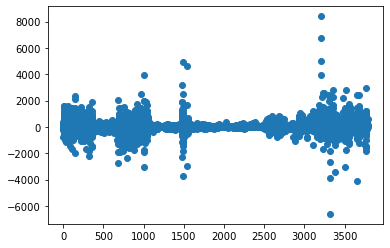

In [130]:
def k_means(data,max):
    means=[]
    inertias=[]
    for k in range(1,max):
        kmeans=KMeans(n_clusters=k)
        kmeans.fit(data)
        means.append(k)
        inertias.append(kmeans.inertia_)
plt.scatter(data.ProductIDS,data.ProfitS)
        

In [138]:
data_WithoutLabels=data.iloc[:,0:5];
#Labels
data_Labels=data.iloc[:,5];
from sklearn.preprocessing import StandardScaler
#instanciation 
sc = StandardScaler()
#Normalization
Z = sc.fit_transform(data_WithoutLabels)
print(Z)



[[-0.71291333  0.0332037   0.4095612   0.40512252 -0.2351664 ]
 [-0.31402497  0.04396832 -0.1848115  -0.1863497  -2.08171948]
 [ 1.363589    0.54923295  0.09387777  0.10211421 -0.2351664 ]
 ...
 [-0.0291433  -1.10569371  1.01873156  1.00629101 -2.08171948]
 [ 0.09668281 -1.5827012  -1.31189997 -1.31111654  0.68811014]
 [-0.07709635 -1.30201358 -0.08616043 -0.08696297 -2.08171948]]


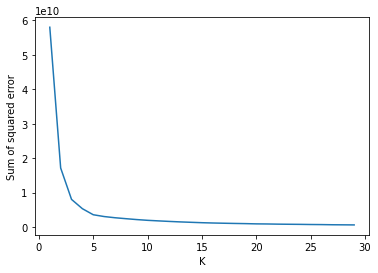

In [136]:
from sklearn.cluster import KMeans
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from matplotlib import pyplot as plt
%matplotlib inline
sse = []
k_rng = range(1,30)
for k in k_rng:
    km = KMeans(n_clusters=k)
    km.fit(data[['ProductIDS','ProfitS']])
    sse.append(km.inertia_)
plt.xlabel('K')
plt.ylabel('Sum of squared error')
plt.plot(k_rng,sse)